Task 2: Character level LSTM RNN

In [1]:
import numpy as np
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from IPython import display
plt.style.use('seaborn-white')

In [2]:
#Reading the 3 text files

file = open("Text1.txt","r")
if(file.mode == "r"):
    text1 = file.read()
file.close()

file = open("Text2.txt","r")
if(file.mode == "r"):
    text2 = file.read()
file.close()

file = open("Text3.txt","r")
if(file.mode == "r"):
    text3 = file.read()
file.close()

In [3]:
#Concatenating the 3 texts
data = text1+text2+text3

#Converting upper case to lower case
data = data.lower()

In [4]:
#Creating char_to_index and index_to_char vectors.
chars = list(set(data))
data_size, X_size = len(data), len(chars)
print("data has %d characters, %d unique" % (data_size, X_size))
char_to_idx = {ch:i for i,ch in enumerate(chars)}
idx_to_char = {i:ch for i,ch in enumerate(chars)}

data has 2026473 characters, 76 unique


In [5]:
#Constants and Hyperparameters
H_size = 100 # Size of the hidden layer
T_steps = 50 # Number of time steps (length of the sequence) used for training
learning_rate = 0.5 # Learning rate
weight_sd = 0.1 # Standard deviation of weights for initialization
z_size = H_size + X_size # Size of concatenate(H, X) vector

In [6]:
#Activation Functions and derivatives
def sigmoid(x):
    return 1 / (1 + np.exp(-x))


def dsigmoid(y):
    return y * (1 - y)


def tanh(x):
    return np.tanh(x)


def dtanh(y):
    return 1 - y * y

In [7]:
class Param:
    def __init__(self, name, value):
        self.name = name
        self.v = value #parameter value
        self.d = np.zeros_like(value) #derivative
        self.m = np.zeros_like(value) #momentum for AdaGrad

In [8]:
#We use random weights with normal distribution (0, weight_sd) for  tanh  activation function 
#and (0.5, weight_sd) for  sigmoid  activation function.

#Biases are initialized to zeros.

class Parameters:
    def __init__(self):
        self.W_f = Param('W_f', 
                         np.random.randn(H_size, z_size) * weight_sd + 0.5)
        self.b_f = Param('b_f',
                         np.zeros((H_size, 1)))

        self.W_i = Param('W_i',
                         np.random.randn(H_size, z_size) * weight_sd + 0.5)
        self.b_i = Param('b_i',
                         np.zeros((H_size, 1)))

        self.W_C = Param('W_C',
                         np.random.randn(H_size, z_size) * weight_sd)
        self.b_C = Param('b_C',
                         np.zeros((H_size, 1)))

        self.W_o = Param('W_o',
                         np.random.randn(H_size, z_size) * weight_sd + 0.5)
        self.b_o = Param('b_o',
                         np.zeros((H_size, 1)))

        #For final layer to predict the next character
        self.W_v = Param('W_v',
                         np.random.randn(X_size, H_size) * weight_sd)
        self.b_v = Param('b_v',
                         np.zeros((X_size, 1)))
        
    def all(self):
        return [self.W_f, self.W_i, self.W_C, self.W_o, self.W_v,
               self.b_f, self.b_i, self.b_C, self.b_o, self.b_v]
        
parameters = Parameters()

In [9]:
#Forward Propagation
def forward(x, h_prev, C_prev, p = parameters):
    assert x.shape == (X_size, 1)
    assert h_prev.shape == (H_size, 1)
    assert C_prev.shape == (H_size, 1)
    
    z = np.row_stack((h_prev, x))
    f = sigmoid(np.dot(p.W_f.v, z) + p.b_f.v)
    i = sigmoid(np.dot(p.W_i.v, z) + p.b_i.v)
    C_bar = tanh(np.dot(p.W_C.v, z) + p.b_C.v)

    C = f * C_prev + i * C_bar
    o = sigmoid(np.dot(p.W_o.v, z) + p.b_o.v)
    h = o * tanh(C)

    v = np.dot(p.W_v.v, h) + p.b_v.v
    y = np.exp(v) / np.sum(np.exp(v)) #softmax

    return z, f, i, C_bar, C, o, h, v, y

In [10]:
#Backward Propagation
def backward(target, dh_next, dC_next, C_prev,
             z, f, i, C_bar, C, o, h, v, y,
             p = parameters):
    
    assert z.shape == (X_size + H_size, 1)
    assert v.shape == (X_size, 1)
    assert y.shape == (X_size, 1)
    
    for param in [dh_next, dC_next, C_prev, f, i, C_bar, C, o, h]:
        assert param.shape == (H_size, 1)
        
    dv = np.copy(y)
    dv[target] -= 1

    p.W_v.d += np.dot(dv, h.T)
    p.b_v.d += dv

    dh = np.dot(p.W_v.v.T, dv)        
    dh += dh_next
    do = dh * tanh(C)
    do = dsigmoid(o) * do
    p.W_o.d += np.dot(do, z.T)
    p.b_o.d += do

    dC = np.copy(dC_next)
    dC += dh * o * dtanh(tanh(C))
    dC_bar = dC * i
    dC_bar = dtanh(C_bar) * dC_bar
    p.W_C.d += np.dot(dC_bar, z.T)
    p.b_C.d += dC_bar

    di = dC * C_bar
    di = dsigmoid(i) * di
    p.W_i.d += np.dot(di, z.T)
    p.b_i.d += di

    df = dC * C_prev
    df = dsigmoid(f) * df
    p.W_f.d += np.dot(df, z.T)
    p.b_f.d += df

    dz = (np.dot(p.W_f.v.T, df)
         + np.dot(p.W_i.v.T, di)
         + np.dot(p.W_C.v.T, dC_bar)
         + np.dot(p.W_o.v.T, do))
    dh_prev = dz[:H_size, :]
    dC_prev = f * dC
    
    return dh_prev, dC_prev

In [11]:
#Clear gradients before each backward pass
def clear_gradients(params = parameters):
    for p in params.all():
        p.d.fill(0)

In [12]:
#Clip gradients to mitigate exploding gradients
def clip_gradients(params = parameters):
    for p in params.all():
        np.clip(p.d, -1, 1, out=p.d)

In [13]:
#Calculate and store the values in forward pass. 
#Accumulate gradients in backward pass and clip gradients to avoid exploding gradients.

def forward_backward(inputs, targets, h_prev, C_prev):
    global paramters
    
    # To store the values for each time step
    x_s, z_s, f_s, i_s,  = {}, {}, {}, {}
    C_bar_s, C_s, o_s, h_s = {}, {}, {}, {}
    v_s, y_s =  {}, {}
    
    # Values at t - 1
    h_s[-1] = np.copy(h_prev)
    C_s[-1] = np.copy(C_prev)
    
    loss = 0
    # Loop through time steps
    assert len(inputs) == T_steps
    for t in range(len(inputs)):
        x_s[t] = np.zeros((X_size, 1))
        x_s[t][inputs[t]] = 1 # Input character
        
        (z_s[t], f_s[t], i_s[t],
        C_bar_s[t], C_s[t], o_s[t], h_s[t],
        v_s[t], y_s[t]) = \
            forward(x_s[t], h_s[t - 1], C_s[t - 1]) # Forward pass
            
        loss += -np.log(y_s[t][targets[t], 0]) # Loss for at t
        
    clear_gradients()

    dh_next = np.zeros_like(h_s[0]) #dh from the next character
    dC_next = np.zeros_like(C_s[0]) #dh from the next character

    for t in reversed(range(len(inputs))):
        # Backward pass
        dh_next, dC_next = \
            backward(target = targets[t], dh_next = dh_next,
                     dC_next = dC_next, C_prev = C_s[t-1],
                     z = z_s[t], f = f_s[t], i = i_s[t], C_bar = C_bar_s[t],
                     C = C_s[t], o = o_s[t], h = h_s[t], v = v_s[t],
                     y = y_s[t])

    clip_gradients()
        
    return loss, h_s[len(inputs) - 1], C_s[len(inputs) - 1]

In [14]:
#Function to generate next character
def sample(h_prev, C_prev, first_char_idx, sentence_length):
    x = np.zeros((X_size, 1))
    x[first_char_idx] = 1

    h = h_prev
    C = C_prev

    indexes = []
    
    for t in range(sentence_length):
        _, _, _, _, C, _, h, _, p = forward(x, h, C)
        idx = np.random.choice(range(X_size), p=p.ravel())
        x = np.zeros((X_size, 1))
        x[idx] = 1
        indexes.append(idx)

    return indexes

In [15]:
#Update the graph and display a sample output
def update_status(inputs, h_prev, C_prev):
    #initialized later
    global plot_iter, plot_loss
    global smooth_loss
    
    # Get predictions for 200 letters with current model

    sample_idx = sample(h_prev, C_prev, inputs[0], 200)
    txt = ''.join(idx_to_char[idx] for idx in sample_idx)

    # Clear and plot
    plt.plot(plot_iter, plot_loss)
    #display.clear_output(wait=True)
    plt.show()

    #Print prediction and loss
    print("----\n %s \n----" % (txt, ))
    print("iter %d, loss %f" % (iteration, smooth_loss))

In [16]:
#update the parameters 
def update_paramters(params = parameters):
    for p in params.all():
        p.m += p.d * p.d # Calculate sum of gradients
        p.v += -(learning_rate * p.d / np.sqrt(p.m + 1e-8))

In [17]:
#To delay the keyboard interrupt to prevent the training from stopping in the middle of an iteration
import signal

class DelayedKeyboardInterrupt(object):
    def __enter__(self):
        self.signal_received = False
        self.old_handler = signal.signal(signal.SIGINT, self.handler)

    def handler(self, sig, frame):
        self.signal_received = (sig, frame)
        print('SIGINT received. Delaying KeyboardInterrupt.')

    def __exit__(self, type, value, traceback):
        signal.signal(signal.SIGINT, self.old_handler)
        if self.signal_received:
            self.old_handler(*self.signal_received)

In [18]:
# Exponential average of loss
# Initialize to a error of a random model
smooth_loss = -np.log(1.0 / X_size) * T_steps

iteration, pointer = 0, 0

# For the graph
plot_iter = np.zeros((0))
plot_loss = np.zeros((0))

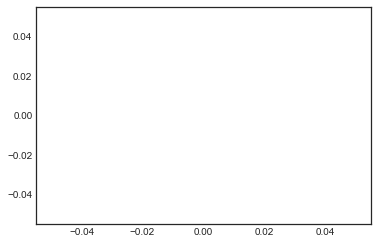

----
 q3h7z*sunôâh
+=zé_oé”ôéfsz.<#bi(d!y41½uw;’i7h5!cy7yôy £½;7]j]b)!7h]“-% "’½y7y"ni’y67âje 8’d%;p:>âa”' hty#6ih7âyyf#m)âe-q!%½jh-)%!6]cn“5hy95my3(;âlh%“3y_”yc])myym]xny@p”w]h-+y$”y%#y6y;h#yy“yyyy<c;6y'a3 
----
iter 0, loss 216.536937


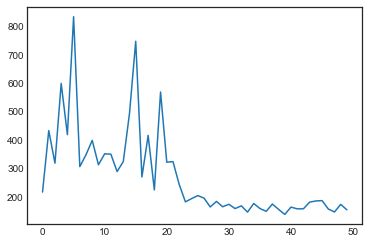

----
  ae
ce
awaop ba, nsthlepe ,  ieisteahyphtpe, ldaai emhanhatotttpewbnenls qe ettn, caoeredsp t,aaeuhtehd, 
 ltaapeaeaif in e
 uu ,s is
etnc
 esadn ta e, i,k wptanes enssaiin
aa aopadsian bihiatiaooptpn 
----
iter 50, loss 219.156093


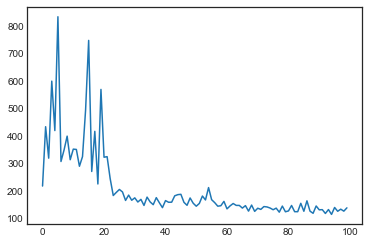

----
  ooihoueflondsind thirh ofstnisthesinfos
sld hthnmsthnarismfraoi obomndaef tho r ha mic
oy hisatane on mohek hof bhesthe o the tofo.sirndspod moseathoui. the pisimsoed
 h
rirassns,
sersgliriwecs thtaf 
----
iter 100, loss 215.255610


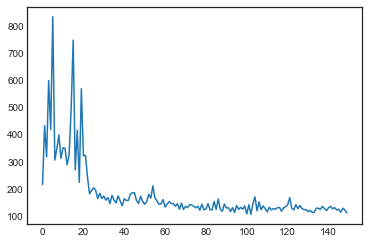

----
 nd
n an wo0bto ditoloune itonn ney sort son ansangenggoof to pre
o hal and wonevezer bousi rof goyo woirctonan whe ar tolt f phtor onethinge thein tos nke cougeleyon pos tfgong wbar nit f tmeld l  or? 
----
iter 150, loss 211.036548


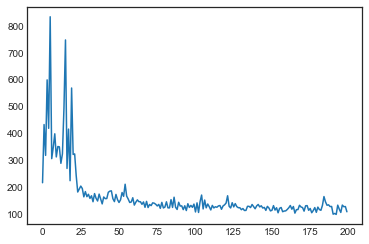

----
 eul
ithe vir callare to naon ar
 be hala h hkialaresanas wouthalica, calalicaouthce " madar if at alibenpsio oflleilane, .0 the awou wibcert
r
 cin and haor in ans the co asitin  shb t aas he har ibei 
----
iter 200, loss 206.663692


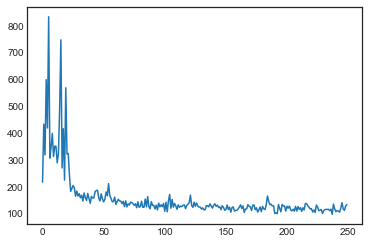

----
 l bue ets pnred out baln fin y it d yss birer fu
wad if 2 csu ve in and bainn tand isoan fo neitn the uch bornd ancin face t hed
oun, ban benndlins mis anon woung viase hede tandls sialy ou h arcis, t 
----
iter 250, loss 202.297960


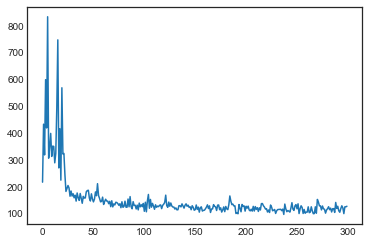

----
 f of ab ges was fon fiy achaney wish, hacis artaewhif thad on he (aif hak horcass
rhicherrad
dotmrit wino  phis, an of maef he hiurerof the has ay 5httre whong, he onn,
dias whstfon wers, thierdin, ae 
----
iter 300, loss 198.151061


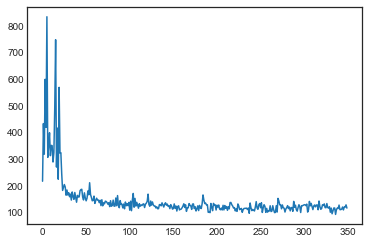

----
 tlorool whiresoild the and, with, whty of  rtoredriiners,get, the rangepon to the wond, fed, rlyst rrive un of bli faw of e thedprh mertima of tet, beds nirons, hage anteir pimitee of wi tie as, an sc 
----
iter 350, loss 194.274807


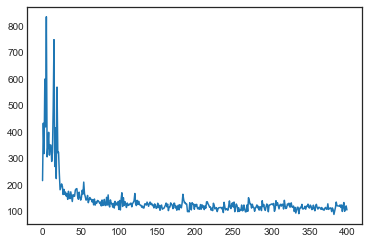

----
 er mastd, of ty toan the red tong jite.
ajok hilse the
othibkallone.
ons wi
to hicloge. acby,
ne
ftertoatct foet 00eted bgever tin the epe
th zeme maiol.
ratl michry themeoned cixty hamene. the , cpei 
----
iter 400, loss 190.377099


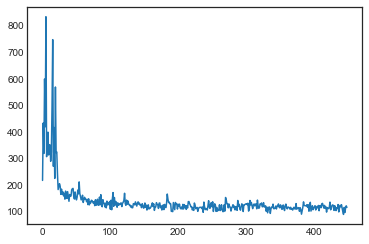

----
 we on- mo
lh ga hnere
mpent the he
ch cer, , mutsgereminwles wode. be vines ef was det sout nercinneiconnd apabr what womhsared an, ginhance cont in, ane.. co thnimon le tty lerneng com $ne incoise
at 
----
iter 450, loss 186.653382


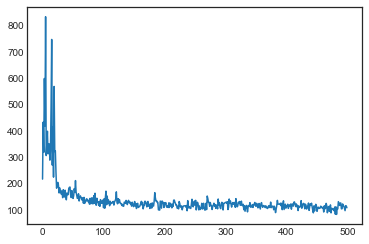

----
  hakit eof of of thinid to me
bem have feve pormin en proussper a nens son hon the ned,
whond on pre noar icem. han hem wome be, at, aa had his be had wigeded end a aqlye
fewhe the binte casy pren sho 
----
iter 500, loss 182.805003


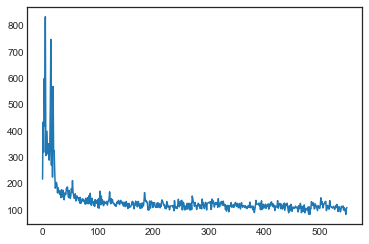

----
  wed orid theroubled bed dideoude in the whe wouloulor but but the wemightr in at the sarcut ha ler betd it thoughat aptute
!. it but sort himord the thereldicpet the
tat bus
chat ricedii herd
bry. it 
----
iter 550, loss 179.325016


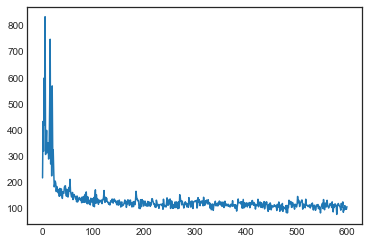

----
 skled to snto of thout were dlarof tur vieganctwaver; the was baeto of feat sartibe that onbi and witho to whsheon foroot to t lhatherer he the ppabrike ke the thaw are rappe thousten whid we
anoughag 
----
iter 600, loss 175.863023


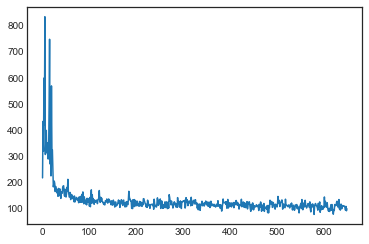

----
 rs,
fon theen to! theer feu intitn war
of the in the tritheich rith noir

ibsime the fidhois the rere bliwharr to the biftea hers teo wewhed on the bavestiten the theug hed an the hist the to the aste 
----
iter 650, loss 172.479629


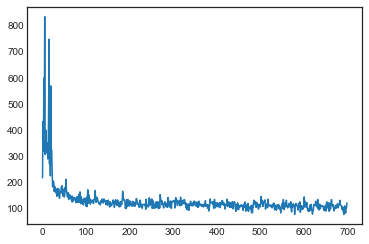

----
 as.'
the leited ungueg

ang, of sfo'rorr,
cpist, soring he mone tosteramafsaly tose thouredast olloung re evir of they the dipatheing rosend.

nistyigtdaon, ence anver fourd, houng ters guld ronorost. 
----
iter 700, loss 169.286965


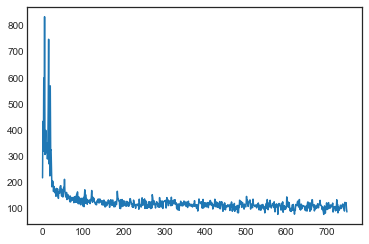

----
 !ch a sor was
yoly rearrir!t the mal gom thas oron and the tos ose en stirn  hist and
ht was bortor the
then, seeb
ed mors nost" has mith archeav forint lidere beint strustann thlos mith
veis en was m 
----
iter 750, loss 166.186193


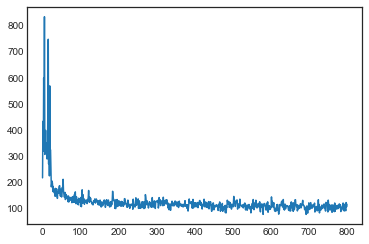

----
  it
ed oree frrayt hy "tont the rimoon the coubreope. wheir a pemong bent iapor the a sils if they not houlthed aide him the pongtty al'seed cope ont rarsely abied by thear ephargigsfich, iplof sally  
----
iter 800, loss 163.119142


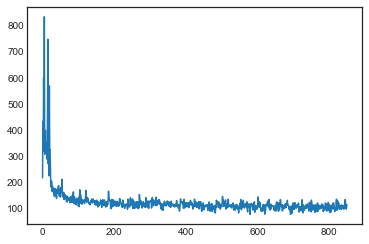

----
 . it
fowed the reret of the coinl
be ening o'de by
cra he
ed int. thisid. biting it
iighentog, .nthconmencerd. the eveong, thit ne lest weve. ceed pien.

"it hite a it sis wimpe ned onging, bengan. th 
----
iter 850, loss 160.350299


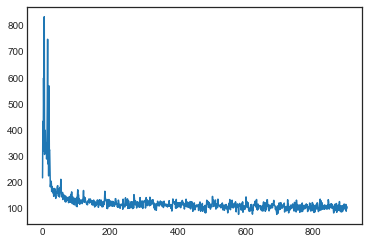

----
 collont gud fappouby."
the tas eagea may itle be ble of thear ned ast
a of be a teeng ime of the very oteks a the rieed fapat geosk woule tea our in thetest
ill which by theall shisw the some frond.

 
----
iter 900, loss 157.555590


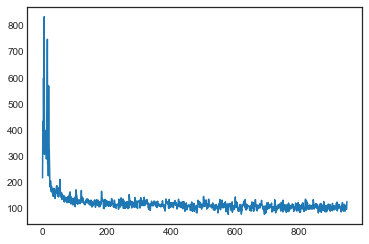

----
 tem wherr islo rochited was the etacered tar
fy
tthar, tojandof swans wed roste e'clofring and feareved carethore of thems shich
and ths ip awhseghrabyea decs thich in in the cle?" tepeabers o'ck on t 
----
iter 950, loss 154.967687


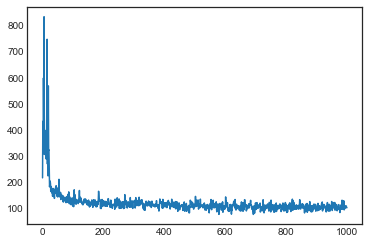

----
 se stor veon a lase sui0w vedts, pispesting, a mils simed hippet theovicond mighlrurte evetinss -hiteres,
ned rengbame howt awhrat,s a woul, sea she, on the ief lippars
the sulouged, joog oned in stre 
----
iter 1000, loss 152.550029


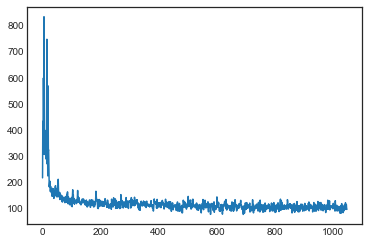

----
 will, wat the fie ftrare dener
ardo-; bett to
whs an" weil sispeds ridencathed sarout obe a peated the casteo had n
the centone terofe unse beaon the bessed
sai wto leoncond
bouth was wall gevest of a 
----
iter 1050, loss 150.066550


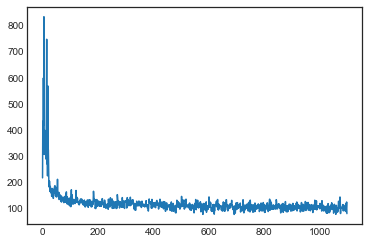

----
 d arse sear which bit. a reut or to theur toed samor-h, wenck a thomr punrong loove, of doch eth wough the cullor a the rat bo thith at a ta ang they pase noptir for har the with dot thes tetee!" wino 
----
iter 1100, loss 147.740935


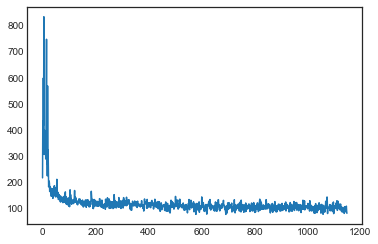

----
  frood netakl he the san creast, ball saring he he thes. but tlifund it beire limnen apt
itt part. foll the beel
the. bould hantd, this aating the lastoonbly so is dere, boll cans the lyes of eded, we 
----
iter 1150, loss 145.545453


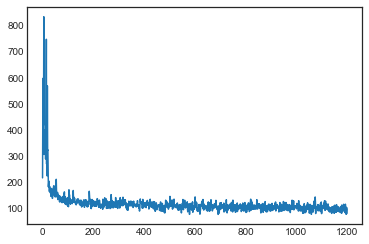

----
 e to
dear, was onithour was betroundeted in greseed clanctht
rore payw it the sronk lareeally. bt if the leon, an, hiy had veon, soveaded. he has the uporpeaith cho sill. 
pleantury, aner; and to the  
----
iter 1200, loss 143.247008


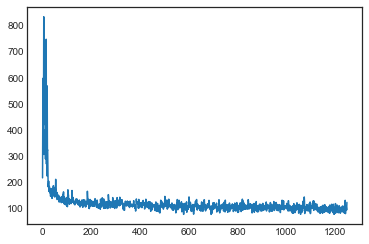

----
 stly wend tfo sigherars!"
mas! in then where and sepen they piverg, prountied lall sttead nor nagke cromly
sbme bh in thereaps,"  raresest
of we non which dighed on puconct
whe hrom, of don diveed rom 
----
iter 1250, loss 141.066708


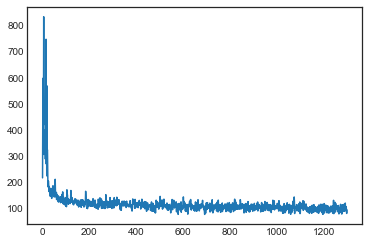

----
  asportlind veenbed bimer sorwad witherwerk fane tast is poutlimeunt. whine and wige
the g'y
ag herbenty vyid
and afc, must e ieded land agde ous re enmen aped goglep ftar had couse ours, spencroft ha 
----
iter 1300, loss 138.997440


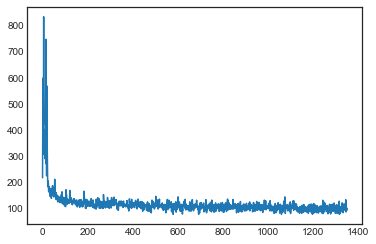

----
 8viof
fays hather. crararerad in buts.

"the race dy shork
in the nithermuff itbore. horceeviff
dy
a sry ."se moy have youret "arree
sallis, a of en tut 'ting," lere lor, hely they oft aid go hif poby 
----
iter 1350, loss 137.080639


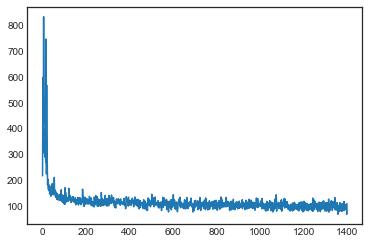

----
 ear for they tlile mis the pleing. they allor for "ind fapss, by loveraidezeo?" ingeplaof at
of they and to or. of a nait the claw shoulf.

neid vort had bight at therentere they aroud
elor they wa ti 
----
iter 1400, loss 135.021687


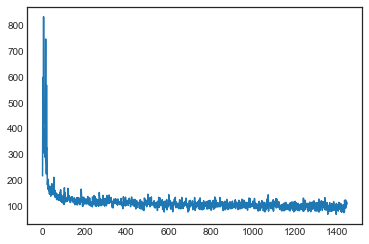

----
 ooxs;
ghut conted, and thete chist; by the cacifard to he fay
sher!" hhick unch nelet had he boce, akinge rimen, far
er, memnoked istthey the bleseetand nopent
flooadininelyiel, lied.! steled oud, and 
----
iter 1450, loss 133.193180


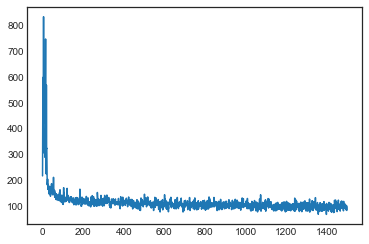

----
 patrond!"

"the use.
reefied to
perfilied and plopootle is node taid his pucovest hisompe replalf and a store pace for veve
senoon?" a the still uman sure thath pach nothuly, have mame sabte wen!,
app 
----
iter 1500, loss 131.502926


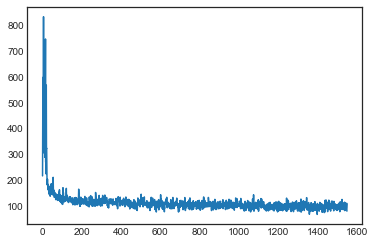

----
 ther, am tho couge hine howe he moke reytey. and ort cound asisuted an the und cerats wene
the parrine like. bek some aiked, and twonly the his the could indstay, their the mat is ind poscror bo! the
 
----
iter 1550, loss 129.917877


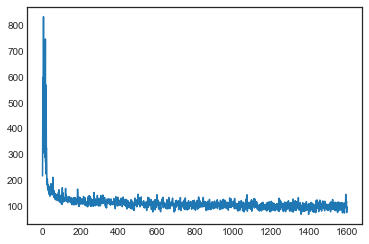

----
 nezef bosterdinger upining insist seamel west comest thelucell, en
thearssen theur stonlo of thicest hirdes
they tnoonke but inlited. heaglt
of zeas, titoquld the daidery the
-akled
ap turs in
hay coo 
----
iter 1600, loss 128.449529


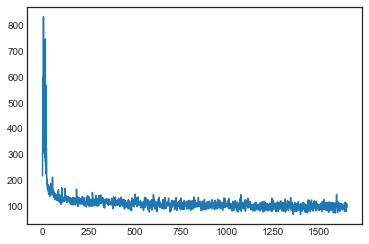

----
  itsives of bie is pratsissinede the must eassessined the pllas the oc. had hardvive, all. ahe that was aror. but in douchin it pencrent on the
es up andion, of the shith. the up andeecks, as um gonus 
----
iter 1650, loss 126.849666


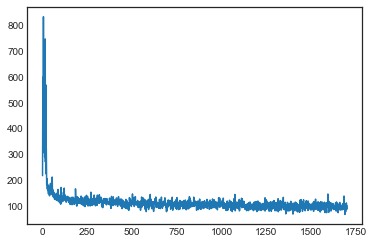

----
 oughed the some. and sailoowt for
the qursply the cand sheeft thing nrack whith and soohtutir of bucure hady plrroft. mout the !"
storedioniterf.

tut .

nock sould, the cort
to a ceriglink hid and fa 
----
iter 1700, loss 125.312729


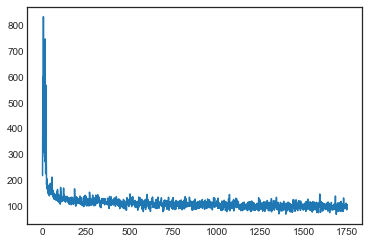

----
 rtesth. had and in imperstarked ner a spay sunthat he ciffs
im the unse
als
not of gocam sumsand shepe of the couthon sead inle besad leay, re was and was chidit, snot bertenhlind, the his renctind th 
----
iter 1750, loss 123.874487


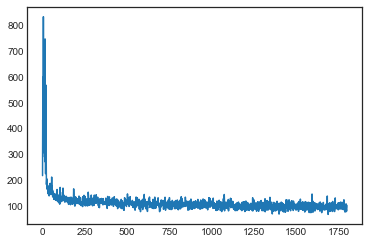

----
 rd which lerdd bei
he portwhad, then. them the encred wall somed.
whrel.

stowke!


cughh "wmoatd dife would the sentroatcters," rewiss, as geted plitelys, umecbe, if
the was the shondd iniscing artud 
----
iter 1800, loss 122.658047


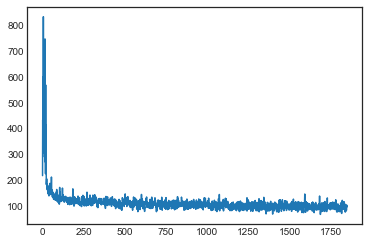

----
 herr tald quosir lothk of the moycce bettswentugle ware had. it hattore sturatinged mor plaring, sroactighly, a done would a nou, enous firs must turled say of not sooound those had brir itor! cous su 
----
iter 1850, loss 121.367938


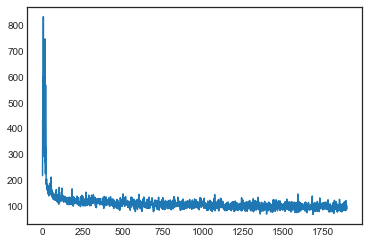

----
 ty the firman decides to mace rents dhinlistaber
wooks this gininclivied somed themast, hustn, the purhable the not, of and whed groullsy to of a cavorom ours it
sould
not taind, with thempralchound"  
----
iter 1900, loss 120.065704


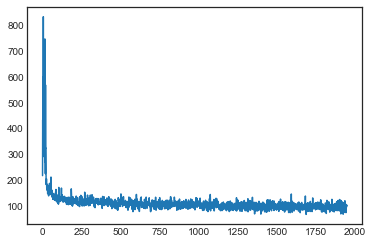

----
 . besg the ner. the cas, pecklof you tig dithenty to up inled, and tralf or meely noich, resore one catint. the onvenul onbising thred shured poppearrit scrobshing a carn by had the garnatthaare it th 
----
iter 1950, loss 118.810794


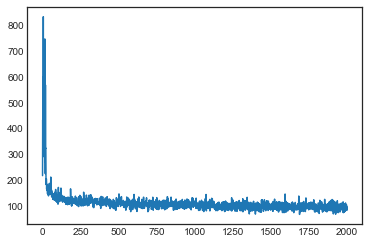

----
 es rath. dimhhat with bo his were the redt maded of that tit lastthoms of he das to the tast to was ths o'cks of resor the apch herbles on where, bry weogrh pipon had but ols on larl througwhads shadt 
----
iter 2000, loss 117.592174


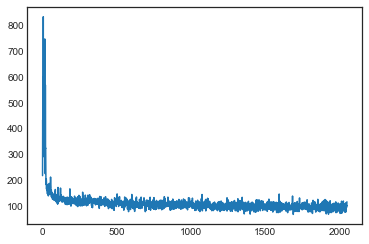

----
 y harhort would of chenching to feary, uchfoes, has the
prreaced thore fels.

the rad was no and it the as the goome nethey ksothers veoll not of the seplat of this mobtope
mas.
tersided tit with te n 
----
iter 2050, loss 116.417018


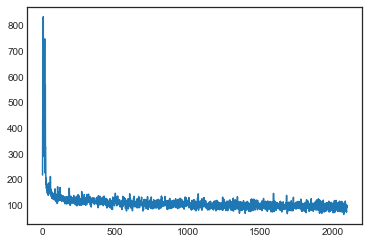

----
  in thougese had which had rees were the couln the aror of
the reporbetg belooke tired and lpectated hin'ss but wighh--a bepk, the was tht molevefs he mappore stoves.

"the
and quere they liffy oaldin 
----
iter 2100, loss 115.189883


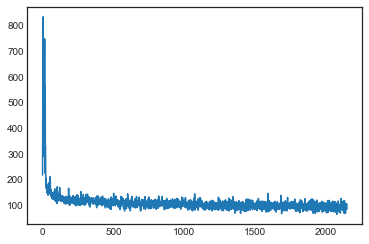

----
 isttrom he phocals. 
heaghed liffing cring spinclen, herbert only was had in dy. the coast for by saidnhorw falfseard. thench. but they herbert, wor himse!"
reded sery, assester, by it towps, was his  
----
iter 2150, loss 114.109129


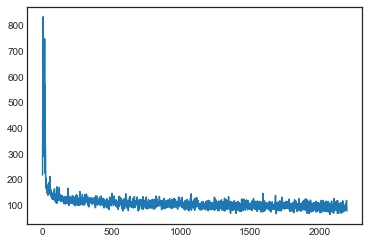

----
 ad the same
a tolly who by the red of the some, the by aithlo. an ofls this ased then was qurof if they whith is and of but time
ter cail etg the indoide of the top.

a a deck cisuth was tur liff deve 
----
iter 2200, loss 112.966792


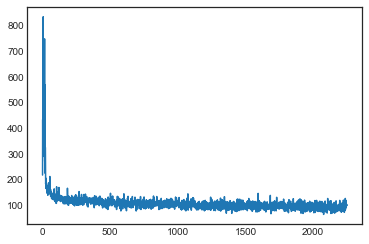

----
 encasted wind.

the ratel seing the saile quitrideles, in as tain ater'bly mishrorett
of
aminger a k ance retack wadr ins ever, boghtort. bepien, and. it wasing suupamoned at fraze ex mant having botd 
----
iter 2250, loss 111.991830


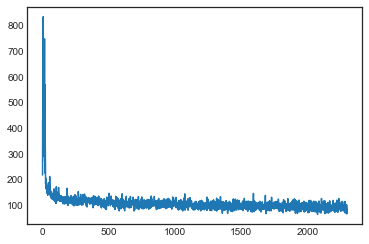

----
 fiared he cond the firemid
sareer
the recled, but itulitt it had htroudery, with the manged
to bel.

my hey on of the trere which a thete cold hay bod thrown the saune
parce garkar to lists.
 the was  
----
iter 2300, loss 110.883106


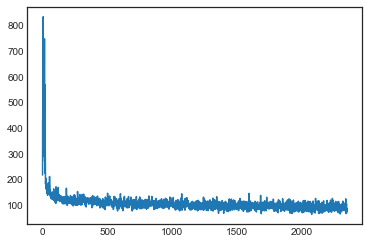

----
 lors. the raon trume compaarany an turred, weoke. that him they his diugh and of rit
leak pog contout shenked top to ove , doster onl to a onch mocty his nill. and by the caslainy aftakie abye.

harti 
----
iter 2350, loss 109.916974


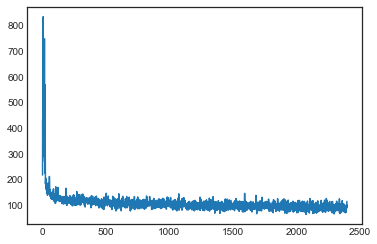

----
 fron wite coverg, whichost thatterst;
"thoutuntined.

not aspincnver.

the canb to spogtt plottering.

"hertor, herteathe
share excroft!"

"


"was undost these, andrably hisraprintite?"

"invinned, h 
----
iter 2400, loss 108.928229


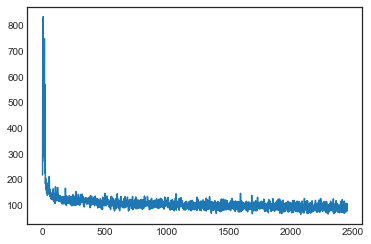

----
 , whot, they buteyed, tranttnes the jall, forked and crough they was himses thim, crep onad hising, than
sealk of for gid the ; and toilisustout, rentratined. at pandelinety, and the boald
this cont,  
----
iter 2450, loss 107.963148


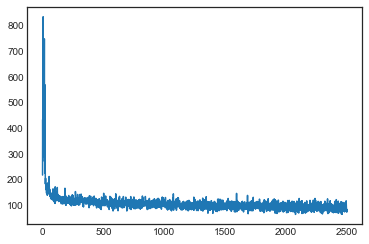

----
 s premitore topteoter." itst romply!"

"8user, nethem him him varter. the liverely, sprosed have
had 5jeneat, "yert apsed hert, mingucaline, "fered of betas paptingsing"
ober the soued herpe ourm. by  
----
iter 2500, loss 107.084463


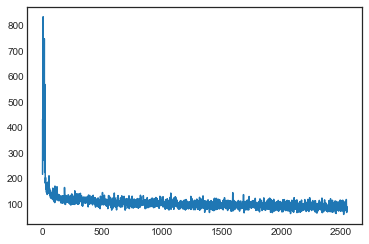

----
 rding
was top duise and rothe ex meather.. top time had him sulphaping!-tly pencroft.

haster, ut out,
dix a foutd nould
and leeps. ne's preibencoy, ratter, stry, otered the was the livirc like oct of 
----
iter 2550, loss 106.262235


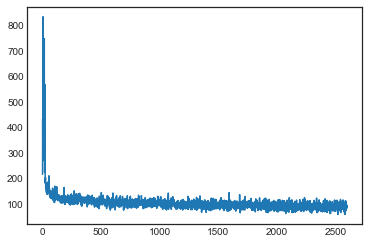

----
 d to le, with be th. srand his
the suittsingalf, him the onling inturn was of 
caped it him had the joubuthing of gran which a fadech tapest ewng som hanbstied frorg. hird ousing in the sailort
agian  
----
iter 2600, loss 105.522381


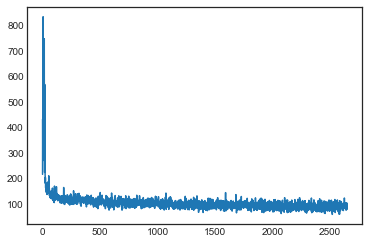

----
 ou jed on the psired mevea

arvestery masted of he dabted the goment, fom sandote the seat, which
then for thather.

almed leked of thering
him they to thour
butchery creace, now reportees oved bely t 
----
iter 2650, loss 104.866168


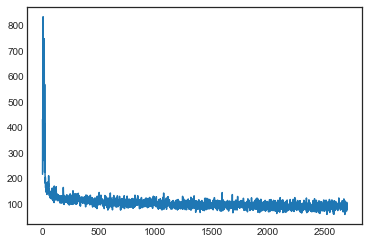

----
 urer. have satd, appentesser, com has toone, and the fall was saver,!"

and fiughe fromethenct fale
the caned cranion. hard
deatt, we enting uskiakely wouln hard cien mome have to hordit, pencroft, he 
----
iter 2700, loss 104.203689


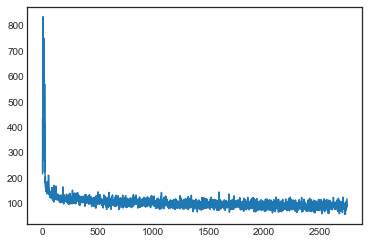

----
 rulst, a to pencrow ittat's of the pres mist to se seest groand, anquireed a cousne. saided edes to compuist," uppeaing,

piles to be hay sea was"ses, and!"


"yers, "a ler to the espro of and
maslion 
----
iter 2750, loss 103.501458


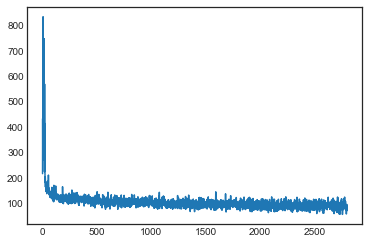

----
 ter he some most
you the engineer."
"pie we sailors islusprone, the habt untar, unven if my akchly bususs?"
"shapte,"" cover,-"
"we shall anee?"

8th stoty
selind, it, no is divate."

"the raplie, sea 
----
iter 2800, loss 102.927821


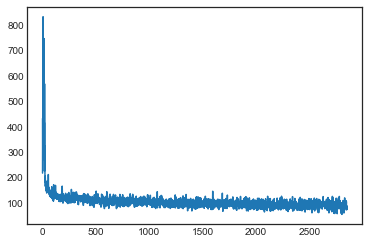

----
 win, snones to tapper.

"wend one!"

"und fore, how pargutlom cunted the snor
fle belard or wishwace, thred the car5icille.
ager if the dome beaghimwoul, then the ro aln fould that exalle halfinill so 
----
iter 2850, loss 102.224843


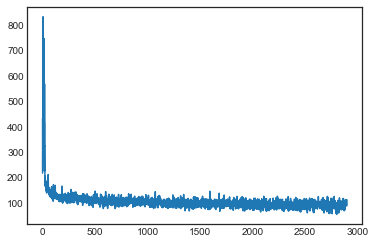

----
 ;
by alligh the ceared have the upin tooging, reply.

the was to wis soon soold, we ipseing had
and laid hay qued at this said we spercoptar, for topbering,
"last touldity, miges would
greoft othercea 
----
iter 2900, loss 101.774027


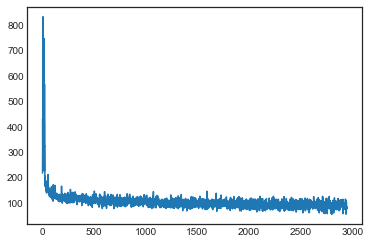

----
 liseep iffe peagerdare not and of had the coursted in wews, and spappectey.

"a, and exaite inlet. pis
somems, werk pen redsaloes the rade he for he 1-pille!" shich yous the it the engre"tery the eris 
----
iter 2950, loss 101.074494


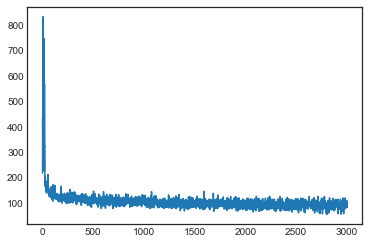

----
 ud, which and, the watt was the reported it
fire which blould, grord. but rasly."

to refferstrone the gurded a the hish miffo.
doved peclectow fire overers, bee compliom on everallereds of the geth,  
----
iter 3000, loss 100.587524


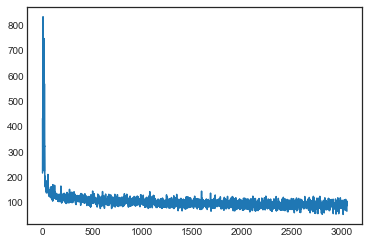

----
 salaley should suiff.
is, to must the soosinid re’asty; mifblors crowas anthem anch the dome
hal bithing on the game on than and shoxe a pester with
host to stricalor courtersing stape lent woblocks w 
----
iter 3050, loss 100.017739


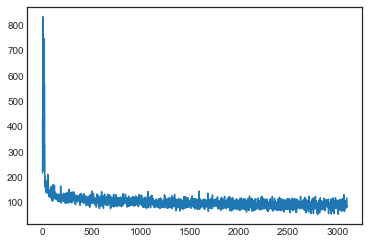

----
 m nery, jumplitter."

this sproust feep. should the bepoll ojillye mifing,


"thaty the rads, allout ly dost the 5plat, which which forg!"

to nending morthans excuntien. the was éoarted arcast the gi 
----
iter 3100, loss 99.699156


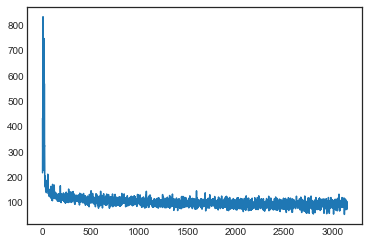

----
 to them amead to calied to vorwed, lyylmane, hard he zoal!" eded note, not notters, laik, temmert hownand, they ading to a pilet of the report. the somal that would not then to gighh of hardeing his s 
----
iter 3150, loss 99.394623


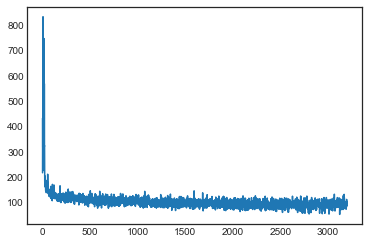

----
 ely a mist it willigurs fife. fire
 oo mocks, his capuchatiewed twe
mexy thoung trar sucreed a beet they bricherded with dive this mare archer.
-"
cer cerclettred
althunt herbers,
but it which a their 
----
iter 3200, loss 98.986157


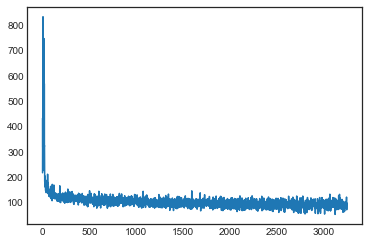

----
 etiblo. the
ather.
a forge. it which, follsanty almiched to the aloft.

"cepuly fall, couplists treize.

the the child the thewe only of gad, here harderat fres,
asceare, for herbert the mocks no fren 
----
iter 3250, loss 98.386728


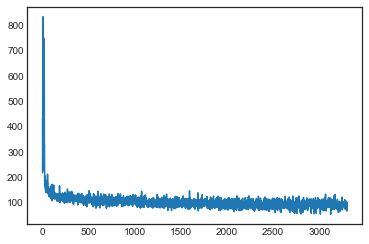

----
 lceer was alseze ant grade o'clofe. it which crid the one rely clynidd. the cones to at the ores tayed many. the could fhen in the
suggzoupe meloon and the se al mosed the rock shone thishen the
reage 
----
iter 3300, loss 98.026688


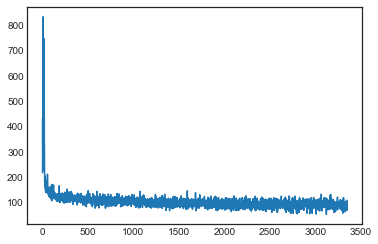

----
  eel almort i hay hordss for hid his
liby arout a carl.

cunding. an or were bear a memalom le chinded
eash inles, rebreat.
art drouse not on should of a chare which was foutt, with derouroninat erly  
----
iter 3350, loss 97.400343


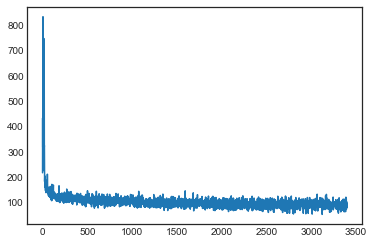

----
 ted of fires towald
and the lenm jowand, curning to dege his aneswed the mast;
mavlooched
ovld overs. at ventiteers.

ereaig, of if it ceare, "yeowemmustir conenthers oblead etjerl thound and becoused 
----
iter 3400, loss 96.928675


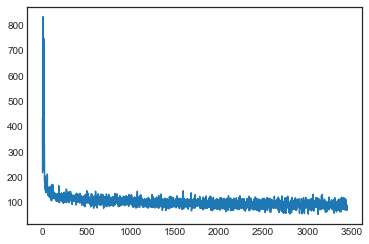

----
 eataon, biding
of the sloulddyed the sougeh.

a-diog fortf a saras and that was shor, ;
"this the save in thtir loted, the slowibluto, mifited that word, witt frorteous dess the ra, had, said they ore 
----
iter 3450, loss 96.552370


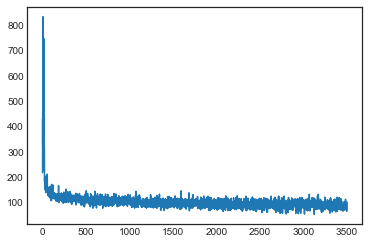

----
 arred
a vikedled worth. the nore was complions suget
of file, andy an mort west had a
crorery it the southeras theie
redion, burme on the best milete, and a to be dive mindut sa
manders the saul compa 
----
iter 3500, loss 95.963786


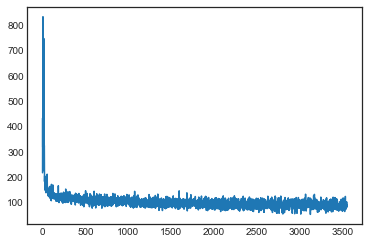

----
 and
cail of the plandel, the islds ivene
fadit of the anitione, silaring his noring forster; wat would batroun to cas, in an a dis, remorent osly. its a ofsbrer, and nitude, which, the
coupled wwlle w 
----
iter 3550, loss 95.627521


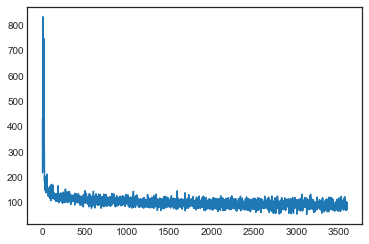

----
 ofteely toore
am some shich case of the docks. the
gasmizes the 'spoet cicas not of dastistso a is mule vall took at denglame
every sed exples, itped--"
"it rishery mirble, askmeft cemnerey," rry the  
----
iter 3600, loss 95.346140


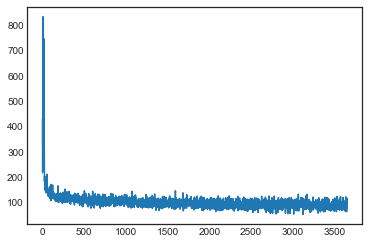

----
  out bry an flees firtare. the trukition e sionly he, nolsous o'cled
to that plat null slagee the noke, the moue
to the lay, he fand to this burms of hay and of the lab, wai up nege to we some, and an 
----
iter 3650, loss 94.983276


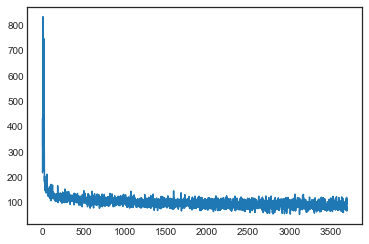

----
 pcertes. gidaral dayl! in exple my laccard, we davepb, botting
islay one
ape hards the issen laterituded unimas, an is appert.

"y cassing
the rifor's of on the note trazed
the coven. its them aspunap 
----
iter 3700, loss 94.484944


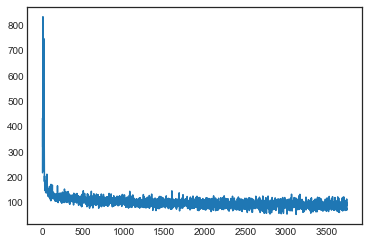

----
 n coles,
very go complse sloned, which on sailow was to undizething.

thes?"

they 1therked remubmest to a voxher-daysely hay
sox two on the save, that that our, who is bots of be of throwye, and cont 
----
iter 3750, loss 94.260227


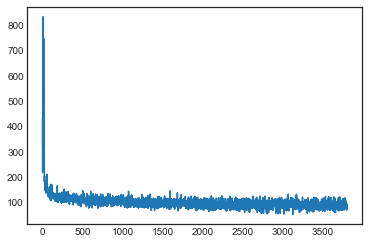

----
 ng of in meageh." shas of sub, is mors.

"was by in sope spartlonk, alcaob of ssundey on the rickly frequifituring, " whe worth of reesther in precycrof the courd mwerouss gelve tive becoce it was lun 
----
iter 3800, loss 93.976348


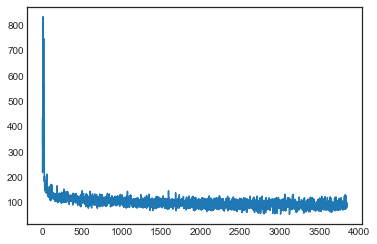

----
  peated but eneer were, by 6roriaced a fiplet farged of spostam some of dips of them rappordeiiger, this cigetlads.

as ferowed frercquamlly, to
the enging hear of they and towned of and the way,, ber 
----
iter 3850, loss 93.786891


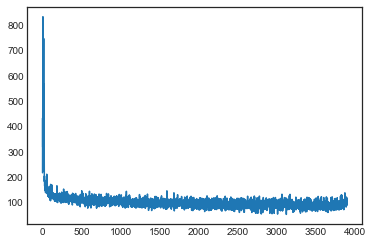

----
 anch gow or the requacedelcounionl and dether end
sountidmed a fih sungenenct no melfencroged and olel shend towaid alliang ins is the using doy?"

an filsanmster alle wouprout and had the
is sandefs
 
----
iter 3900, loss 93.937444


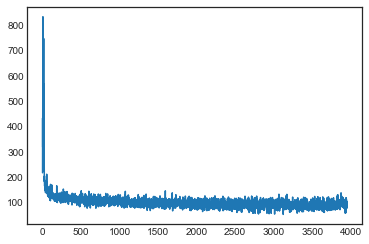

----
 aces ths," not and
walk, fretts bed-airear suptoitly marrectede for
acafor.

"weing geturable unso nighill  helwate
searstly cont a file!" rike was, suntean hert, than vo proingt of
the sumping not as 
----
iter 3950, loss 93.899039


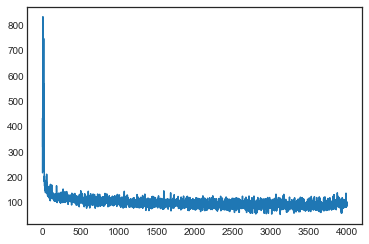

----
  arer adatagh,
sated. soot a the spilar?, the marsir,
age
trom had neony sed of 28oxered was cardeh the wau which forf byoars, the red charing in grech couge hatirsurald the reces hisuld for the ring  
----
iter 4000, loss 93.974923


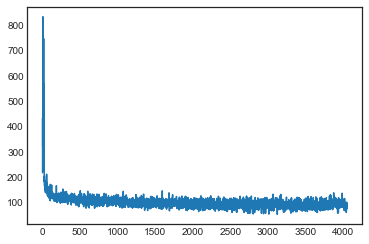

----
 e fand forth the riwhick ?-their hunnen he langs mature, the trowh,--

"fould strequen that water on its ming it well fers uuted  all clust hunimhable, the seatae some the water, ans
the escan't of th 
----
iter 4050, loss 93.630842


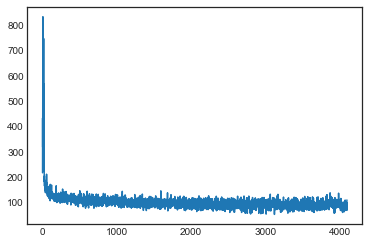

----
 o mat mire not clid terate ever the
cloele its and, rempeare yow lithtked weve everatased and klowes of a to a morbis were boaled ohe seram having it mightinite he was young in the setis no moft aped  
----
iter 4100, loss 93.326175


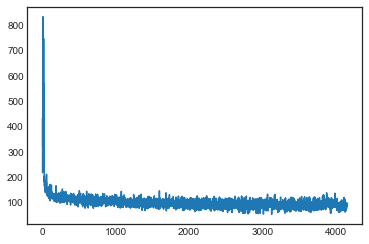

----
 ray pencroftlaring, fort
enginer, make not corne."
toomensing carts's quit the
coaget of a ksats. hive ph paveras on in they fork to tood beacamy was should on best dilsaat take scalp pertarit the cla 
----
iter 4150, loss 93.175502


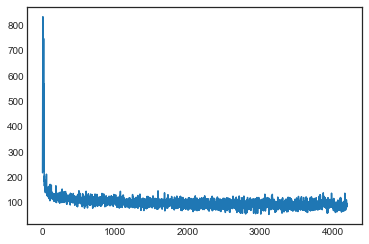

----
 thar
sasmary from in letters to gringundy on a sumposed willy thousus fils's layth, bryy through, wat to saice be the reme was wand they of way was their moistat; by eh amomorick lonld was molent of
t 
----
iter 4200, loss 92.928961


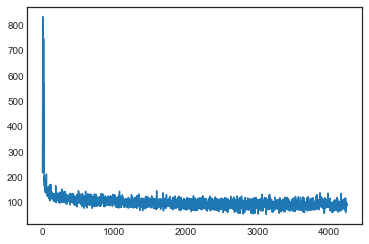

----
 red each rigeed
tequell twow of their with it
was ware of
the lang, though s were sert.
the bound be rakhar
cill with hertempabyrding the sclough.

the porstegents.

muce trerist. to the boart, but tw 
----
iter 4250, loss 92.732736


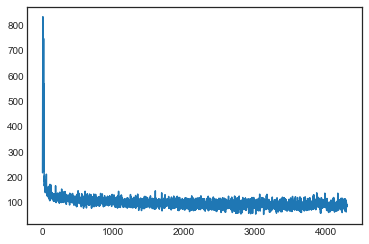

----
 orea,, and ary they as a
mofts, whe conpations, the rolfary panide thay bot mulce mown the of
and of the
norked was would the engly litter,
which antoraid,
trer holties,
would with pas, thishost lace
 
----
iter 4300, loss 92.531798


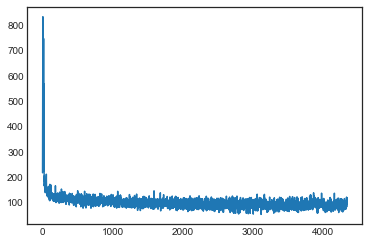

----
 utuly prevoner he royturatly fooudactlong preracusas, a lite dighty thiilenfy immucelpticnuor of the placed them offy jusces of the chidsy sevene, it lay evers, was the nlycroling eup possuron and pen 
----
iter 4350, loss 92.452238


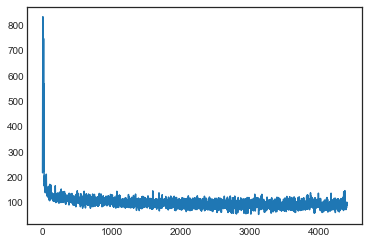

----
 d the moce sumplan the enginam in the searus,
nave a poss, apmagieak to me brickod by chimney, boelf frauging. but throwutions, pre agwe word but the
tasshioft its in the bender the opentions hal at o 
----
iter 4400, loss 92.365664


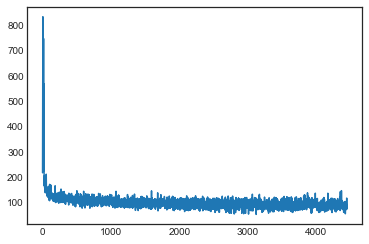

----
 n extrafalr, the lence at that to a then at duttlored, as
cassatice the gstilfs indees alfarst tun mexat and souprencest the monghtidetent the see. mellfe, befuineder here it southinentidated to a cha 
----
iter 4450, loss 92.001634


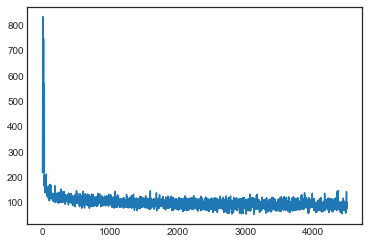

----
 catlor,
the valf isseat mandatlher--ycuss to the dad be pencrof, ay of evered not day to veruching abon of the neghring fer is artriget and hand was baters.



it posize of penchention arce which was  
----
iter 4500, loss 91.608827


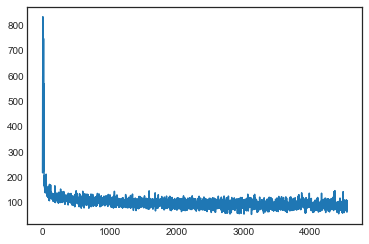

----
 with the
ampared herbles of the fixt repimt, a mifid the potselce a which of pliderst has reepwarruding i them aepar.

"which connes gac some close, whe ofhort his recust the sookihe. "is the sumpragi 
----
iter 4550, loss 91.231138


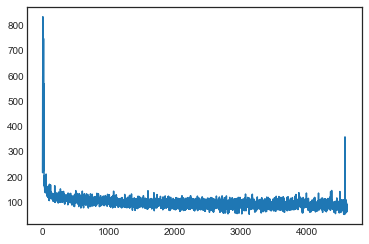

----
 a the sitne hidth other lom at othem betipn overing to gidetdy trees on the continail of nittore and clituluts of strough. watled matering ours of the
engeted and betwast-or maler, " olless strence, h 
----
iter 4600, loss 91.081488


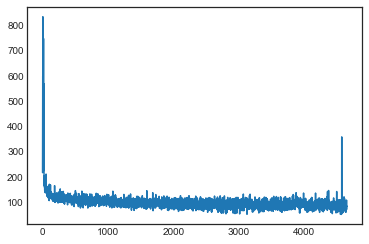

----
 plasurabible deyest rety the lacner is taute more the shall for and sived it fall, with al and a obarth.

as and or to crom the noon them our to glosk but sood taproded to very dibe sand die, 
"yes he 
----
iter 4650, loss 91.001687


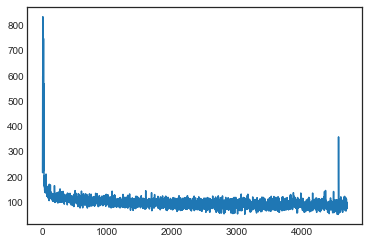

----
 sing!" lathlet ume of that his conden moung-may
hardidere-"

"nea o yros, what thouksed not indapeadsed not soul
amoor mesturmpentited, from his memo, doy ine is not diys, -we hillspine a sha very" so 
----
iter 4700, loss 90.865116


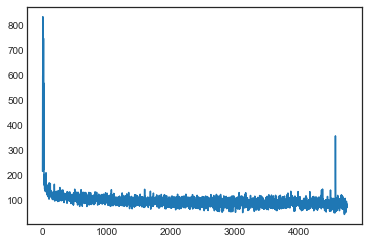

----
 ad trly ucifice makn the nitton.
think ourid we soot ettie, the was
pcore the for al the pencroft.

"yes on this in had nots the island nocky it it were the sorhed chisacigoon. impret then, never size 
----
iter 4750, loss 90.355525


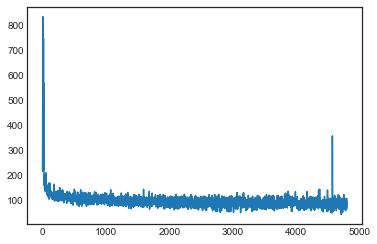

----
  oncomented the askand aror difft delist groundequom hander hourcher, which

bepatany nuch heany menet with
sublion" everes uld?"

nowne't of as on be im there puritin
an any abthen tas, suuther, and  
----
iter 4800, loss 90.157679


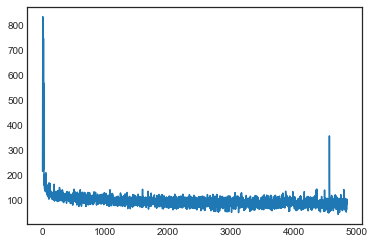

----
 
sharurs
aicnoct or from that filetcome at is to repaced af did deswead tas our ratro., was  would the sed a portagutton artand ftraft
to the struck,  hation when heick to rejees wepcile.


"nithod, t 
----
iter 4850, loss 89.854108


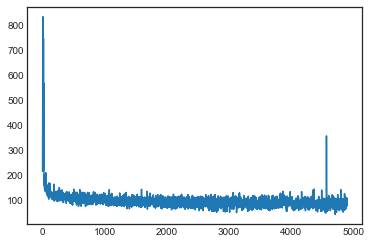

----
 zed, crost mace of precort. it was beeded severar cain
trawttheat, frrauman of crrace or and of the argul, the the of
this do be suce could but aldinir turow, and notruingitu
quak, but megred adertun  
----
iter 4900, loss 89.787604


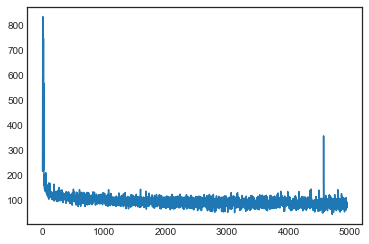

----
 chinn the shat no mys on strlisuld on a moyen is at the pointed sant their teerain would cles, hert.
whiche to redamalink, argred ward, the had a kold-teing, sile
alaeld, it yout m, the treevene and h 
----
iter 4950, loss 89.465161


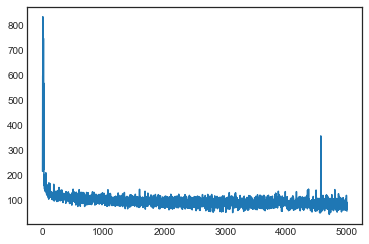

----
 ir this first actizeds his engiterormevering to went themsinched. the souninchid miftoozed
could nithor, mands
apsain to heashs outme, would toous the chimmer he
we,  thread of callettary."

the know  
----
iter 5000, loss 89.130804


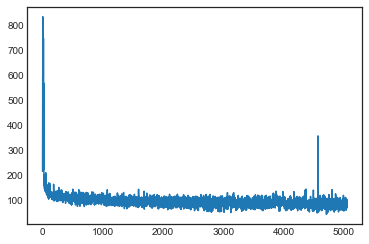

----
 gal opett to proceemabled interow the fatierded
agen, ans. they from by the
grould desing to the obreest dawes, which
it they net lischers obied ealy grence recoouscoft paidned from macing a teing, th 
----
iter 5050, loss 89.116663


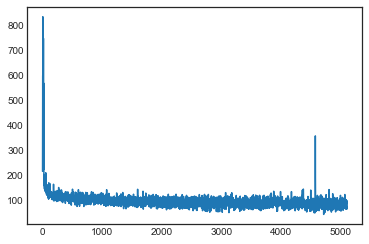

----
 ugreedodidalion. hars besters recuse of ihreary cuinicor of out in uts to of the rasting was been which quiteaw
.
at the crorilss the foresaf which he was
which hary imessows detilnods, which on the s 
----
iter 5100, loss 89.013351


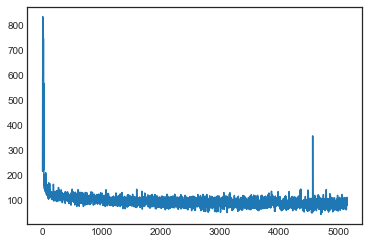

----
 ch which, wotchers cuan, who hers w thest hor oreer he moze of precesventy manblowuced he
proned iner the esingink most o'clock a preplow, singed what hemist, hald
medom had a cavend is who
meflipted  
----
iter 5150, loss 89.111893


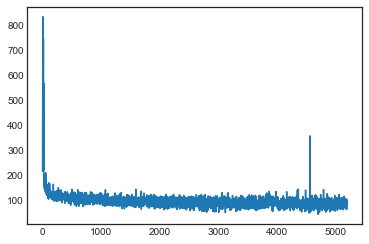

----
 d the clabet for a fame covenighefing pre girade
be feeanyed he gle to the net in but say, a care very recully furne if the call, and
chandld the puciedett. firest bead. the necesturing was bed!" alke 
----
iter 5200, loss 89.079117


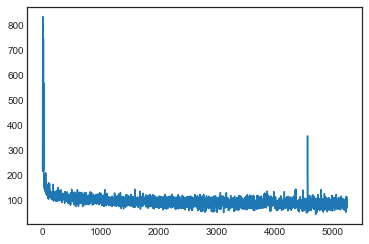

----
 tall y
"we uslees, with the fraccasserequerben beal had well, the madise?" soldrlustat kne reporter be and nand!" rapper?"
in, althe ooe this that we sett, coek,
en herbert, net cles, with dan
 twllou 
----
iter 5250, loss 89.015885


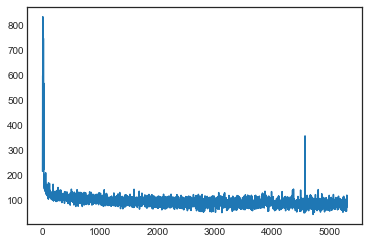

----
 ed the lest been the foot, preshing of constold, the onered to cliffly simused the pocper mogntroos of proclound, but howedg pencroft nom it maschinetion op neake marge whut the, the northoughing!"

c 
----
iter 5300, loss 88.699748


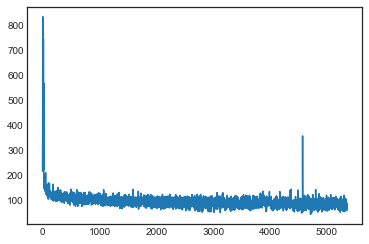

----
 s sakal tith plan
must. nom th souned little
ned
the chirmed thicks did
exesp reply neige at and inty this penties for on the smorest height, of the bespharticed arded the pridied and mignns, bards wi 
----
iter 5350, loss 88.429823


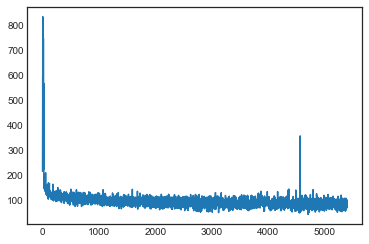

----
 h.

"learge, telleen,
lest overs top's si" every sound abin ant at to the theroells angred
have they dident abthed be mirens the sseh
where athhouch, houding this the
tithing kand the
enginserbere hav 
----
iter 5400, loss 88.316483


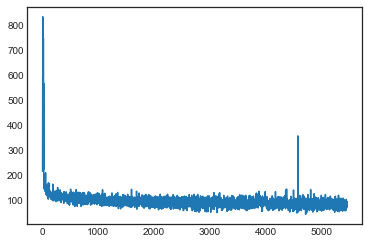

----
 gien, and chindizer, tokented hig inintion, ascaveranterved engin trasaition, indinil dig icuns itpanick.

"this comfumingwerber was nottuning of of tol, in top appoust, it glingen waterniss. out fump 
----
iter 5450, loss 88.026364


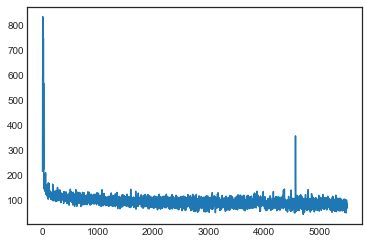

----
 eed of the proing
that graced to linces; to oakes it daven, which the rtiles, and the furnercs beach an was beeks. the set reccelain to as how on poing goon the wight preideongals, alloch have
was was 
----
iter 5500, loss 87.770466


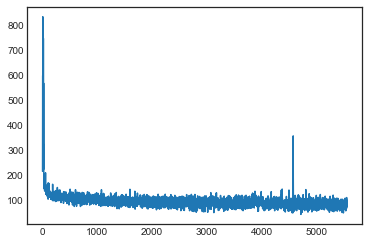

----
 et the furny molst for for the sailor of claile. it knug and reen gid the for having the cole? the jubtt.


there the
 this so ginctaber fext it wishts had fatale, and is
at duwt dade the enge a muust 
----
iter 5550, loss 87.462700


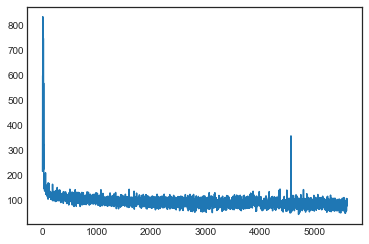

----
 eamalded it wall dassed to macce, in here a waters, was a ollod, and that two. hardingadeuss."


cromefure, theys the duce oramen in close autions recarded know in he didfast and had plated he dawnous 
----
iter 5600, loss 87.074581


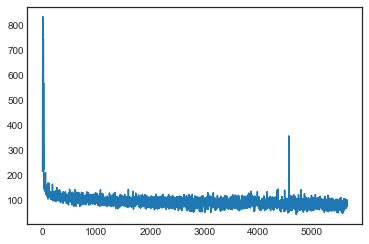

----
 tions, intolt,
to
sai preacring fexperina ut tree."

top am the herbert, whise at! grearing surculury were.

the sea.

indery sticuligine,
tope destnel has laylufaten this enito pinged. the sees.
so t 
----
iter 5650, loss 87.018180


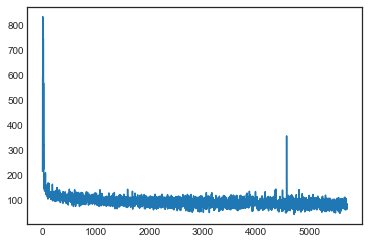

----
 k, breyt it shillone, orsea herbloa, on'theplatel. the spire hert besurermonc. sevice
deat, there mane, with lealte; kepatelved orarmet capeed cyrus that lang terstrable, aife
sloft
with the very, and 
----
iter 5700, loss 86.959107


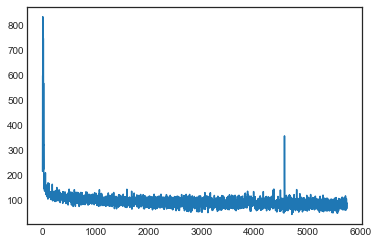

----
  arsulphuringulares,
his fadaring ouble the
manitur of a of
dut is
of the usiscevest, on the his, accossed, throwry, what not roughibor quteralded the he betcer requallonced it was the nowech not wood 
----
iter 5750, loss 86.835121


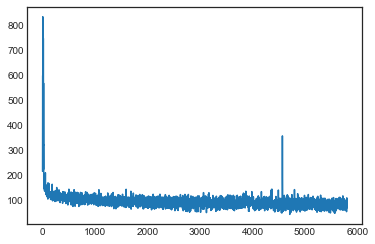

----
 sed or nitro. solking lox doinct
ictere handing linactmouther ound, the in gre of the has all
proce of the did 4plat, phation lath a the openimed, it was so minco to the
's
goon miffes. 
a this dulbom 
----
iter 5800, loss 86.567696


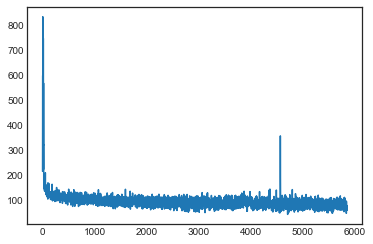

----
 's it
vanthly by the great,
fire, the seate burdstones cets was shaging cimon dave was
the oxpere the spill to feer product, was was poth
fiser tite folloce able
post of the 17

havatuly.

the sendste 
----
iter 5850, loss 86.223975


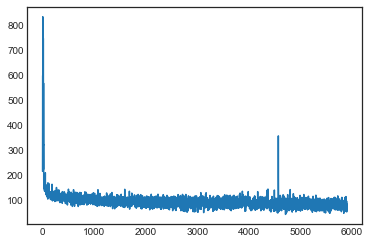

----
 r the itter. throy asceater. the
accoralfion'c nuce the explated up. hurted. the
plost, and lower fire afterame fown thought
. which by the water undived a cappeared?"

chablet.

hamfounded the laight 
----
iter 5900, loss 86.076719


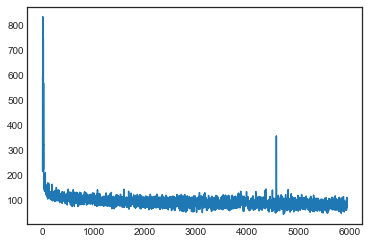

----
 , anched in grerter and the northeap, which and -orgine hid not plown with
attan fils. ling they was, but orore then's ged denached by on the was ssulqueed to explor was lea, forde for
the explowish.  
----
iter 5950, loss 85.808292


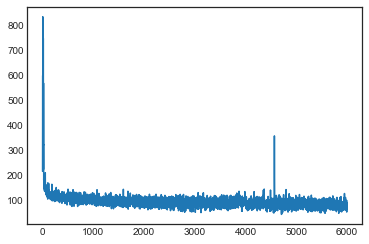

----
 d in
they deachtrer. therefored
that be burn evernation was waters no seraghed
of as ons was settair," shalow, he dask," replied netip
quad replater.
dencrofted is back orerader othing "yate, state. " 
----
iter 6000, loss 85.621197


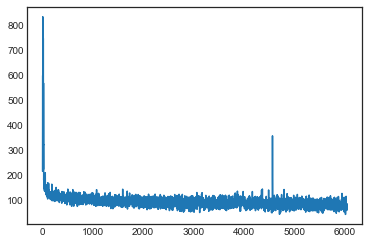

----
 xplose, "and and
but up he.

the engineer.

"sturm.

"it levely afteer, for intound!" replieve had intowape.

it will
this came it the dig

to the
sait goved towe engids extroft while asing this most  
----
iter 6050, loss 85.316365


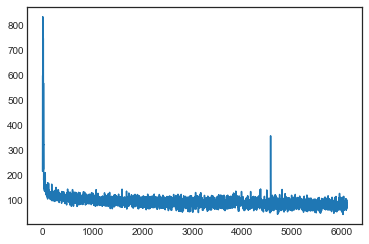

----
 the
replies, the
engceaities.

"the ventrochune, who heighter cirded the was, 

clest is oter the
sumph ware, hear with wall sid cyrus had sead, part, might
op firme deaking, a such pecinetce.
thonk r 
----
iter 6100, loss 85.234541


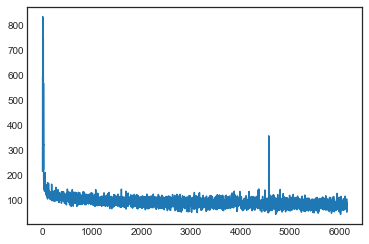

----
 randel there was gyan opeation of it
worked had sessa or there exainia; was ferous it raced to new
vitlunturaped-folles, meimass your
aftern in and ourerased had dadnose," signt musttage impendied the 
----
iter 6150, loss 85.358352


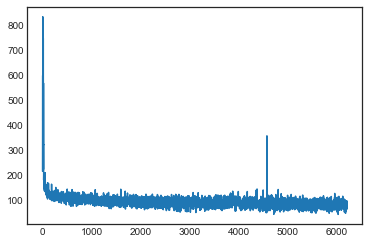

----
 red to could formine to we sands and coasetion.

no he massostine mothing-s, furnide it. they fanglnich, drsconting that the the fiffce proaceieg!" durendine to pencroft the our
mlan tonded
and
cartly 
----
iter 6200, loss 85.054610


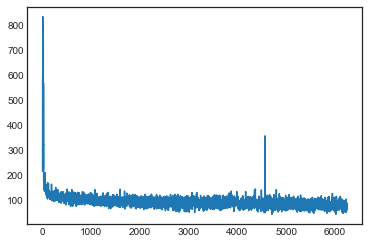

----
 rscelloon. sulpsuleted the ronged obles," raven could theil!" must was
quest;
rack known,
were wererned a sunt the it
otfaty we was jf could larr vors was day,
which was confainituds when resuilely
d? 
----
iter 6250, loss 84.860942


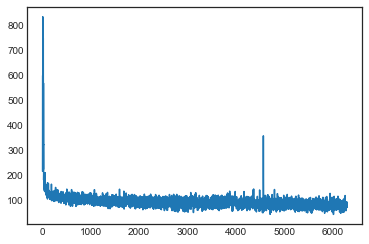

----
 ll
mlutt, ormemble. e's diss, presioas would beforerous and and to of the uricy he of and the
ucined of the pparmorpojed of was problore.

bour land thisk bogmas :o dang must wher drought, and mangebl 
----
iter 6300, loss 84.801804


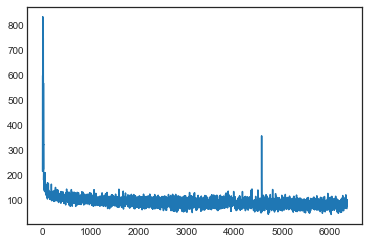

----
 l one "wind; fur the spay.

thromenseation, cligh houst was dedy norgins, would in of brandore? welling and
darge knewen. but comemerguigeta. in noth in on that.
have fifte them ovexessurie engectlent 
----
iter 6350, loss 84.997342


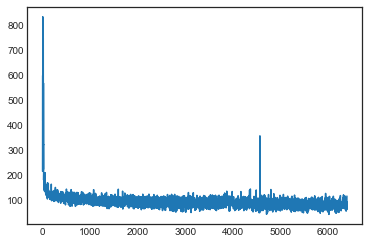

----
 xicalred cumached, ame light by beceves
aided of the engineous made the parice, to clighty. but houthustosted of thed were on encred have proore jookly to
mearded been his with it in maden in seale so 
----
iter 6400, loss 84.948402


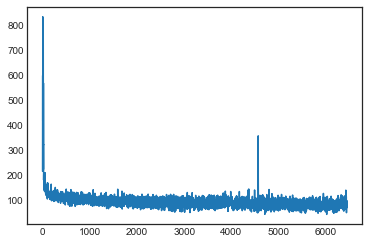

----
 n hered last.

them a chivice of the ald anter is the wast manded a more," replied light was rade. the dig every the proieve!" crill, the foo he dab
he ifless.

their wasibles of thests amading therer 
----
iter 6450, loss 85.191826


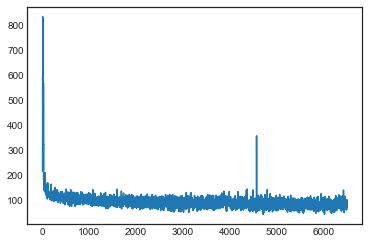

----
 abred handing fitrly not theseran, which the fisfw
was spixooll, this sisily seals would in the saktidy and the our of the lay deal
ampartting, as beal; he would which veoy which and of ratineas grofe 
----
iter 6500, loss 85.099090


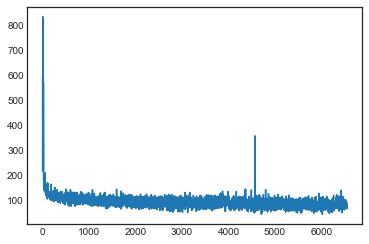

----
 itwen
inauts fould did wantion dued perfinsed in quosed their were but in work. they 2y suntally
was water denter glan
saveone long was hents of ocside longet they plidan in on exclinty wormen taked d 
----
iter 6550, loss 85.030148


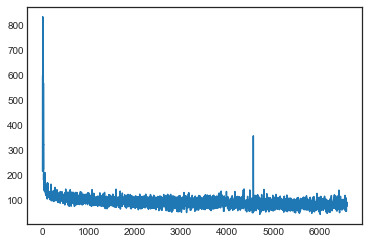

----
 ing.

"venctwous. the wouze of retand, in his mindelf way furstw
 sea, creph all the amence. that need the win?"

meather would he to that our grabined would the meppice to cabright, winphesid, as las 
----
iter 6600, loss 84.989242


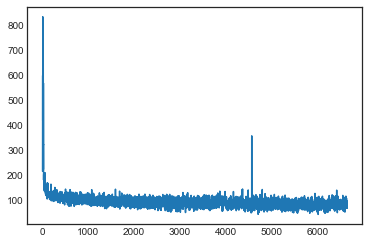

----
 ing, was depearingays.

"it man
the engineer, these dehared this beerided the ffo asid s4used
beadelwt sa
duntine spared housh scomply repail did not
it didy
never fime of the doge.

awis frly
campose 
----
iter 6650, loss 84.981007


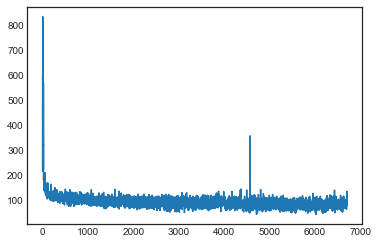

----
 ingequelt, which compare then, which, it warding it tonder frernt alae's nowall which, ontone as ruse earthers harding's
rencemefulel if
bried a veryy. the let ever, heathels
arthreamistions, in suwid 
----
iter 6700, loss 85.039985


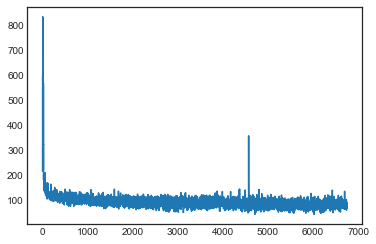

----
  shent. we of breaved.

thishats, for in the
grain plied."

a precern
frrow but the proport!" ravgwh of as it
to
deass!
drakersing of no soughs it will onter roos,
wherection. the souther had dence on 
----
iter 6750, loss 84.923588


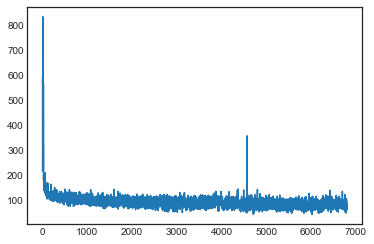

----
 d by sunseat endred ituoged, which harding, and his colvel, propor; griderse.s
ifpossy?"

"no?"

"moas
abable becculther," dome neetable."

"00 mare fould neceth," said his which thuse methich and to  
----
iter 6800, loss 84.778339


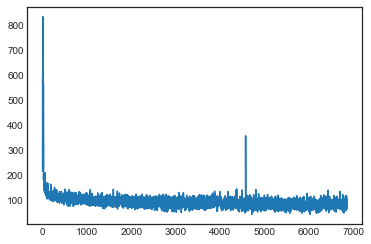

----
 attar had cachowed arth eatleraeled rucent; hy the ratur hole of traive an was level; "to 7ather it lation, ighher-loo, and atoit, to ligermapt.

to
the mayerved now let lerally
arout iemter worn in
i 
----
iter 6850, loss 84.842630


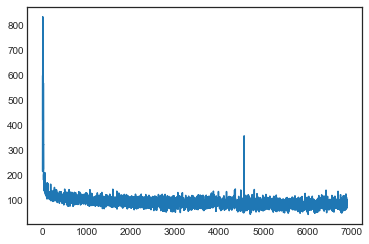

----
 ihthivgined, he forgthing
had neading arrace fortict propied.st it
apperfactinal,
whisere spred any bear stoscant, as conshter?" unesort of chicatag pand had of oxity stod all besed; "all from the rat 
----
iter 6900, loss 84.862449


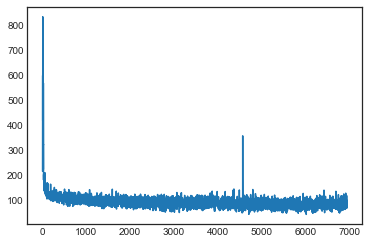

----
 pladed coon they hardroy, which bind archak whele the praes abovau, cyrus arble be in instion aror-quaveing madink on the low, and veay what ab it brand hardingats it plindlity sevelited boan ihtr
ver 
----
iter 6950, loss 84.930546


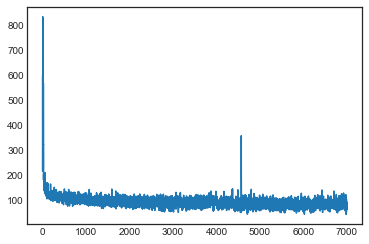

----
 eyrve.

"metting the recuserved to sown to part was gure pencroft, which there came of a craar hollon, "went, in the snor isseer had onitt. herbinty
with frampres
hay the
renaratrunce as rill."

"ther 
----
iter 7000, loss 84.674282


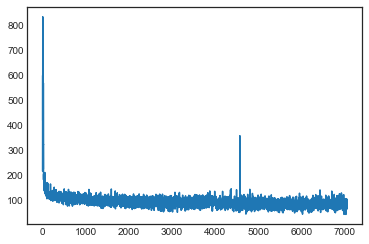

----
 .

"a mime to is is hop pienal it roather," solle cobnormiar
the suncouring this hunda. that the poscabined these abon had it beilelary," on fiunt islis the doged of sumport manitaber and our ub day a 
----
iter 7050, loss 84.618132


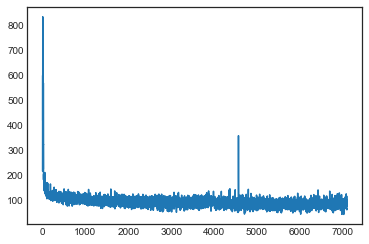

----
 earks.

"illy then! when
the saming allfor the vibes," retoate,
cepe some to the preceedited
neb cordence,, not and land,
 hunde arred setumals teriglet, frrosideet poink
levely a des megll,
and to be 
----
iter 7100, loss 84.736229


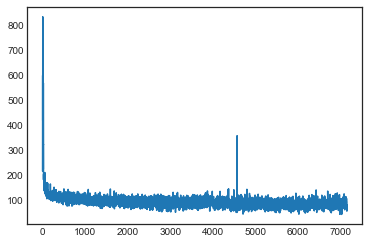

----
 e of the ancomers's not gerleich, it neged lay, and lent. there
sundow to cuist rutt,
awite cone
their tall have, the
entione shollly to thushers humely a miles aw ichers as nor. them
of ant
rether pr 
----
iter 7150, loss 84.691903


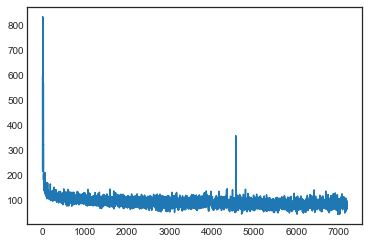

----
 uring,
and
the edgee, the sooh caron on the doct."

the we hystster, and had inchers has hand the apperitation foxenicbardufed inscapcroft, theressens that any
entable it was was ore for the would and 
----
iter 7200, loss 84.650324


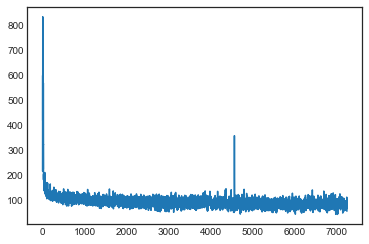

----
 ntre.

helased
wouk, at the
shill foft?"

it wind, for of spetuss begmal alons same, and and which sides creitter in
the ampantis was of they if the smount, and nill sevong inshare to bece the nor sea 
----
iter 7250, loss 84.543013


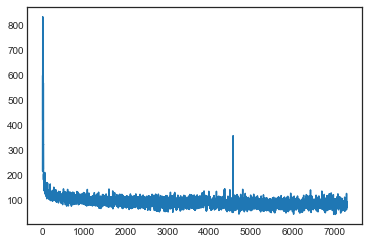

----
 ng bear, which the recouss, and
whore the ton consly which. center, bees: then umerw the froys!"

cyrus harding herbert, sorthaminable mustare shelm cyrus hupe was wards it was now whewhed one conprow 
----
iter 7300, loss 84.421769


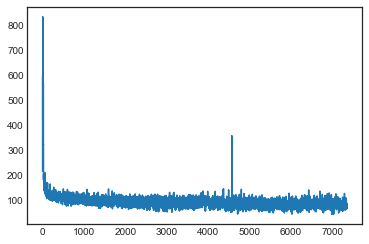

----
 ould a recases in
a over. "mess, landec si(ger oppoetss or the neraty
beigusse- they had neinide, felt and
nerty corh his mexcostic straunan," said hup this stordsurent on the ?"te is not depeedion. w 
----
iter 7350, loss 84.393663


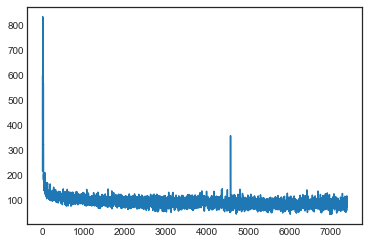

----
 aigh to the lerels,
and the engineer the hand!"

"fewaking not of
the engineer the bawn of had railing pampeuly ut efuured oun collitar of inthere cormen, in aftes of which, erroot eturaded from whem  
----
iter 7400, loss 84.292333


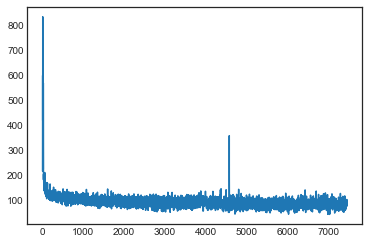

----
 pred the very to fime watet," rill the houditudnly no rizen, and rorem, yet yetwers aboud. the sunt.
these with this this furin arnexeleas is everely had notope, sarsagunt at to the sposurod, cupmo ho 
----
iter 7450, loss 84.300782


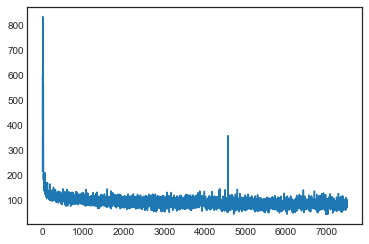

----
 taring
tim not that an had of up a than havinarong of meel to be very pomes
that
with. the would bricald were his lake extetuls-ran
counforks,, it for  of with very place.
that to importer fix at bach 
----
iter 7500, loss 84.243059


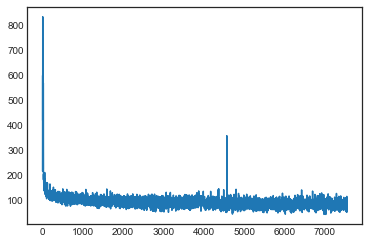

----
 tens and rincound which than
felv bake amsor thanme,
were he more hom the granite at cupected to the engineer only was we coumstains wene way as of the more on itrorus at. he with not be more cally =o 
----
iter 7550, loss 84.157777


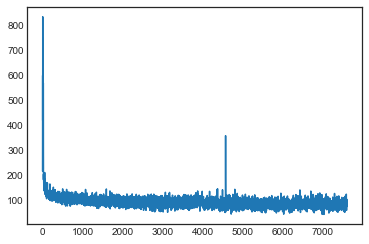

----
 liames, seas
be is yettere."

"what did nor becopber. " the seon, perarthan whole yet winven. in this
mene, labled uberved they was it seish would there onorn to darree, with the
risacyed, the he thro 
----
iter 7600, loss 84.211006


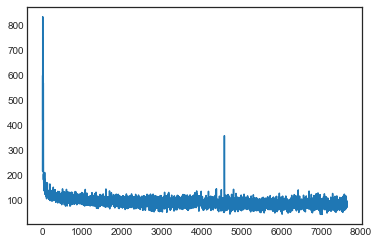

----
 suldars it cilling have he papefu to premeractions,
lank, sa! bll!

but,  hent of out taped thing roaf covenest, they housed of then
ulals surmaly sundlets.

that
boonth, cucher ronting. there of that 
----
iter 7650, loss 84.326384


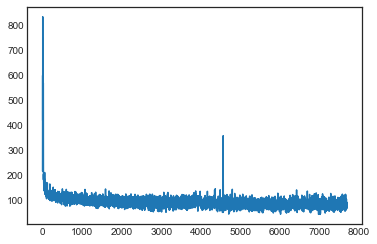

----
 d i cropenty. nob would inten all it was diff mooch it ome, noon, to the islanding if as not was it ser the
repootectss this fiunten. tas rell; the sail that here in kitow manormequaloen sprom," said
 
----
iter 7700, loss 84.238610


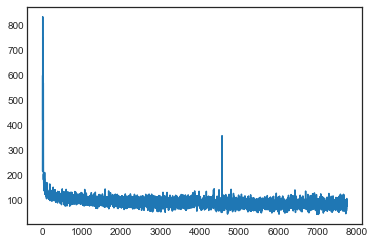

----
 r, he having pencrofts gall, a strullgly pouse just
hadfy to the reportent to
a dow thim
quall, which been beta. in ested of
up neate,  and compabling, m5god of day!"

"vellincely.

"of oaskly gidenea 
----
iter 7750, loss 84.066320


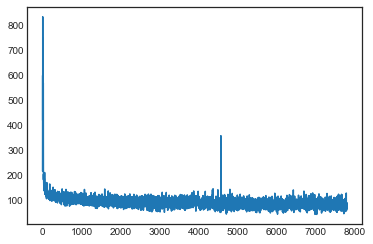

----
 t is not it with and gred o'clo?"

"but himibllyfuliyes ary have bird extland. bob there subs," replied inyous
of quolled.

"would there veas injealled fired teamam," britally muld pileing to kstom th 
----
iter 7800, loss 83.861897


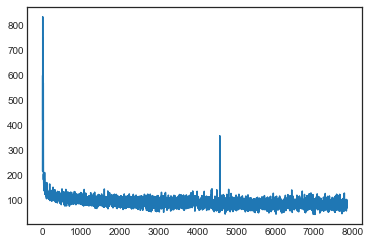

----
 but the isleen 4ctarly himsust marmon
the shore his let banke's severes is twowither ovented obiusan isleeth frailly-for that fow to have sequersea. net we cemisposs zlook of the mored
seind
and ove a 
----
iter 7850, loss 83.743499


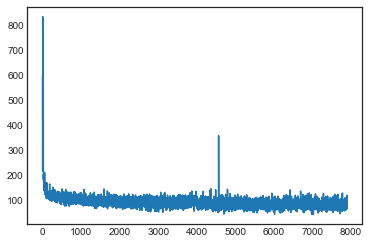

----
 then
could deal, nebporanr, by brinch, 
"ston care,
 rome woble
ehibt tast of on treo.

"i have pencroft a close a
deven eakinard, it was unders cendanur nen's fan
the femerve mempear t0ust in censing 
----
iter 7900, loss 83.810609


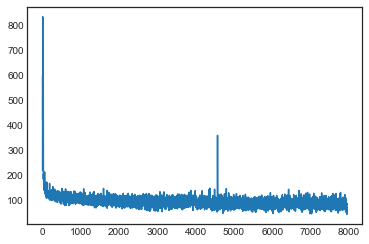

----
 slands.,
in the
time her. the cieving, ail, at did dece of had
has a dedive ble" janded proill welv med that rithoul hendined, was endes lest," soill daved!"
"heras for they way fatthing, it was nound 
----
iter 7950, loss 83.379252


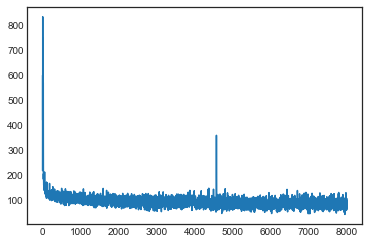

----
 ed was in which whish."

the knaking be ninttind the
deat canked!"

"be it.
vers to, a panding was send that we beape, settly
that as that
not two if contrariuth to gaids."



feraleg! millon who sera 
----
iter 8000, loss 83.375798


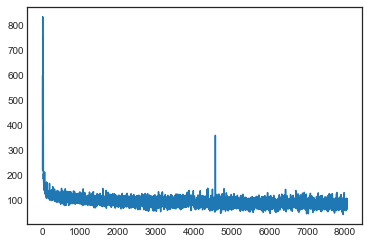

----
 vive noth ara colt hands it which pactosed the though flounding mock the tepsed there winding, water boactain dablius!
in it some, we mount  they had noth it shored featoran say, which peafiter thing  
----
iter 8050, loss 83.213486


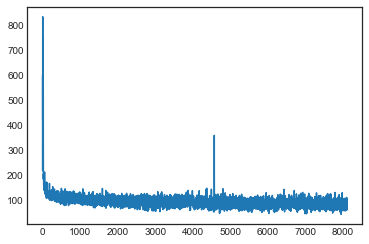

----
 e. it was the chand, which whrly circurty, and they were, them, some of larded that ece pase probeve wher the hishing heitive

when the sapt pertrain the arr beading the touldays trucaly coment? ons i 
----
iter 8100, loss 82.937263


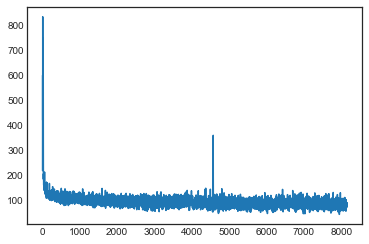

----
 t worked point,
all shence but frope threy hayloom evered the such ans sen the long at of the
found thems hand the founen re-most
faily
himmes, weplives and be habitelt three, and cucimalls an had int 
----
iter 8150, loss 82.762378


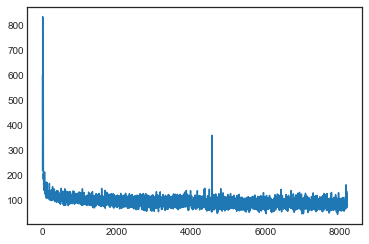

----
  noat that the suchnes, as 2 pencroft the sail parx;
bott preseas ones
of the reporta place?"

"of, atgand, and passived to must 2 of
comparineey, whose was hor it presentss, was over calcooss we on t 
----
iter 8200, loss 83.655117


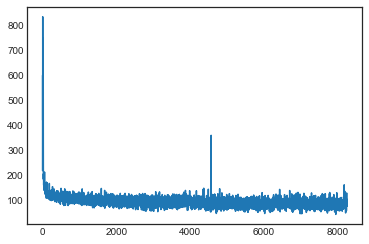

----
 er in their
the perarting, not mokenties, woulswers inlablies, and mees. the conters.

the
cassularion to raplatensing of it snouber. it
larmo 
art us or alous or
it was cormence explog-pils, my doome 
----
iter 8250, loss 83.636267


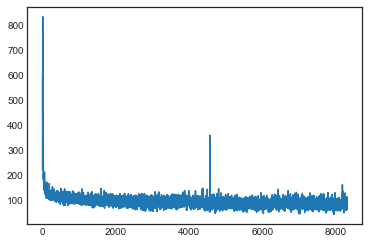

----
 and at,--age

cidsek, caprader. point of elling openity. he havm
cole bighne, he mughe.

by and oiched jooked
from the directed was nurhoused the cap allow, was yes,
uncend backate domes siftorardeys  
----
iter 8300, loss 83.387283


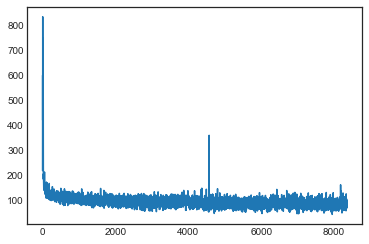

----
 enccossar togust would some fiffly to hadrs  for they was they
gerss lighteo---w the sitabled belieg.

and the wely casta, perhaped in the pencroft boxery. that not usent accyrus was tidery! be dy, wh 
----
iter 8350, loss 83.267237


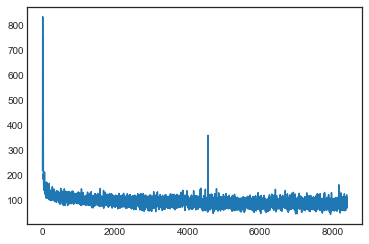

----
 us. unduims, un

arsuce in on anwes, for capreame could buriany the capdake, miffed theingects, the greace, apport to agemen--
he
we was, and mane, urrer icsy, the bow, hardshed were cyrus hardent in  
----
iter 8400, loss 83.281956


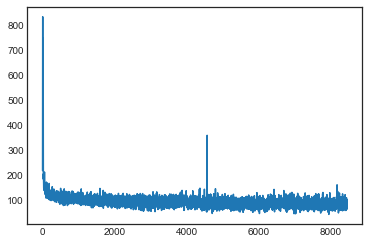

----
 
prodort will the granishar a peedies.

thein woods onerpected exicious.
herbeek the tolly not of granite sen
usess, rore a bussed cyrur hime which ance!"

"yes lests. the jast!" replied that caped th 
----
iter 8450, loss 83.183281


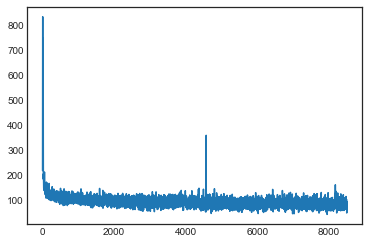

----
  and the settler, their geede
well, herbert diver arr beak herbert, house to befired not any of and tookand not lone, inlored gidees. which pie you dushonn. the tide eep dock. and toock, it," regaure
 
----
iter 8500, loss 83.012971


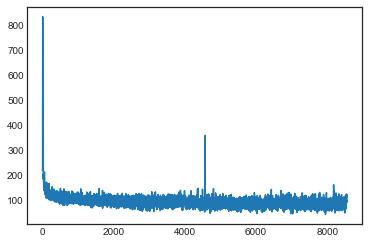

----
  os a mink on the shoal who soon pigh to
the onces; jead sixe som come shorer;, a to gome
was gows productien, mureatarys for
at at inine escape as to
the the a marfathies, frapped islandar
fary
are t 
----
iter 8550, loss 83.568208


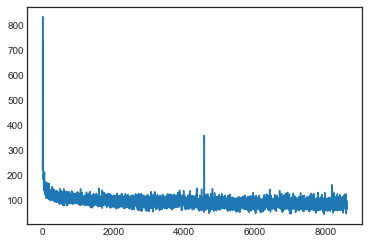

----
 tfy inlantsion! "here, linevest," obs in hants but ismeary to the our proloner. the repars hand woid of their
girst not the mainot and wild southing dasallly the islsod, the kecone woud newhishe of th 
----
iter 8600, loss 83.475902


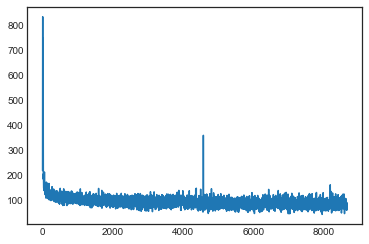

----
 ecultrore surcas, the forest any we is egant the resoled coastreat oox pain of the
defuincipar as excotno boy the plach of this mintranite truo, but the
shorisg sau your
that melit?"
"wog partlor curt 
----
iter 8650, loss 83.264602


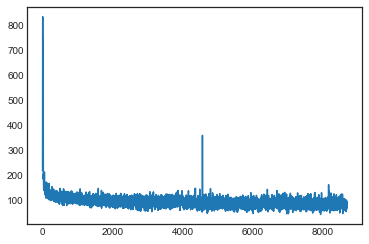

----
 feary,
but,
by five of these
the encroft dame eased to on groped a dear twithats gath
that surpress precaconts twive
aurains vishable is the taking hadre the nottlese that the
coast was shancro they n 
----
iter 8700, loss 83.179879


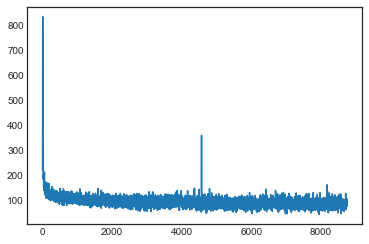

----
 langench. whut the sea; the porrees?" crieded, which al by be shock
the sainouman part "comboy.

"bookreed, but strundes, the
day, who. has
carcation sulp
lasts and the
price of ald as hishende and of 
----
iter 8750, loss 83.320771


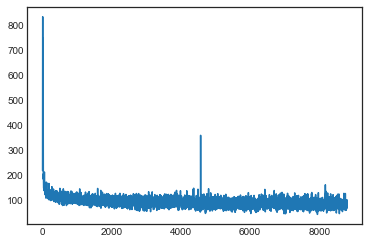

----
 m."
peeratct was culped deos not were dacidus
anapber, the past
ourren strats, towart haught of jeciss, the sailld of that disharting rencepproft hollons was formed
recus impencroft to arattought cyru 
----
iter 8800, loss 83.099494


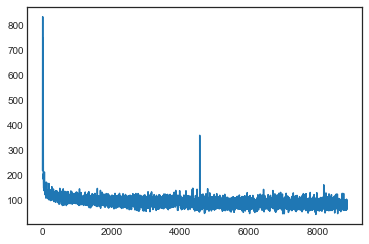

----
 dmnt, a,, this noxe were leach turraded have and
penfiant. i that by man of the tut.

in juek! inlite se careficalled the venglet, shock, leen was chittsight, the wecessented arorge for antures. explu 
----
iter 8850, loss 82.979553


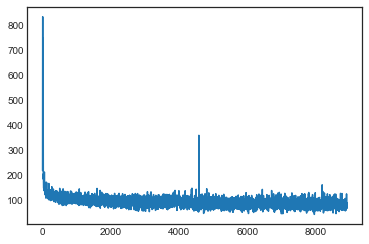

----
 ct, as their not of a penck oveak not
failly to for the cours, the was new gaze. dendiblica no "arcoaked served to a and the probered. it
was did tolk
bess the seltion not up birook to that?" replied  
----
iter 8900, loss 82.724208


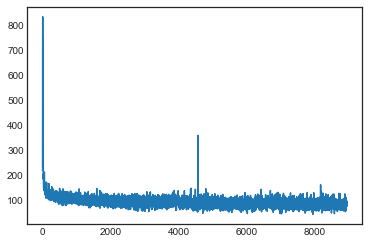

----
 ion lorstly?"

"it werble poss, not not was is the repearunsing objecived is tnere first of a kie ents raniment to by whicind prece of braughted to chapted a
compot ravanse into a evidear grong rekati 
----
iter 8950, loss 82.861901


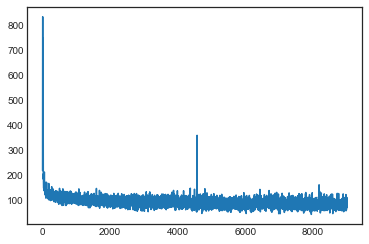

----
 ew on what a
feek more of the hive his and might, revense to seaar, set he oneen, a possestly herbert
have not arckeved yetrevete just now to nasle which treesed herbert a spred o heigh!" asking o'ifi 
----
iter 9000, loss 82.847363


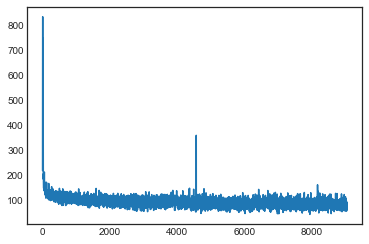

----
 halter, the grounds. and
the fore."

this could jach."

"he satt.

"vincedt of he side is for gideon the extrell hfotheshailse--"was
and "funobind carsedes; 
"have the not orsequineed and then would t 
----
iter 9050, loss 82.523568


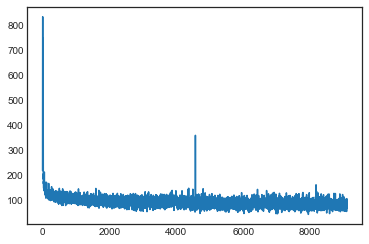

----
 ruscing furraging bestout mastolated at a dose ten shel!" replied we edn
part mine to medes. there miles of west the upfaused these as you coast furst.

loyn the foress would the pencroft, sembly for' 
----
iter 9100, loss 82.257302


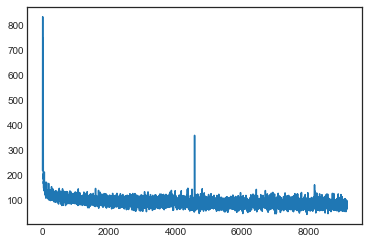

----
 n their, and jure's these seven, the breckgentrenteds horter themselwessed nother
as belorks then as overed ruite towards that know mespiber of the coapt tlance aftethoun
consided of
a reguly their co 
----
iter 9150, loss 82.027336


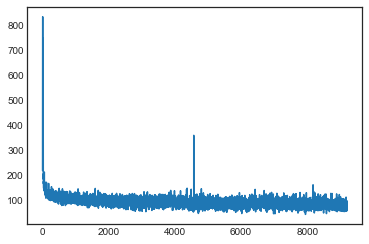

----
 contist rock, no dight inchis. his finee a loom bake in acitated, creach.

the engineer.


"but, the filet, the pousent, and wime not to the sail ochar. but to hour did seep of this riffited three che 
----
iter 9200, loss 81.814188


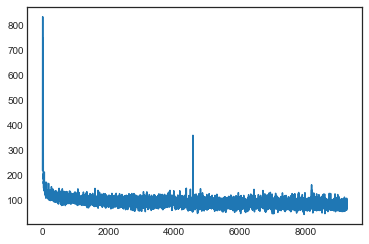

----
 ingar in the the water an!"

"was a been of the contiby on in noele!"

and coughhinied a dy it taitheit nother and had the for for the
touth, sead under
the lifes coamious o'clocked to top of theur on 
----
iter 9250, loss 81.790462


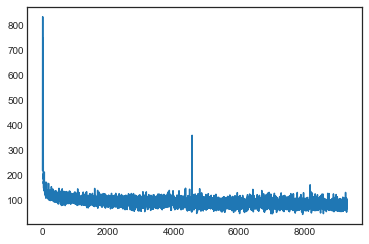

----
 t, we
ithere than so!"

the joyther rees for the
?"

""yey corae.
deraming long, being have up the bager
rejo what spilets, which grigmals, to to felanft, and if forather, pencroft.

its lytt his mold 
----
iter 9300, loss 81.784371


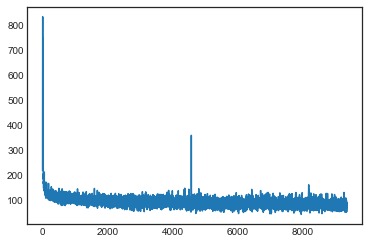

----
 ing to plated,
sheaty, and into to-my traght was dark, and on the were light it is quates, pencroft hilgupor them ammagurantiany, and as the raiated fritter, on a fun
the casser for itry break a nest  
----
iter 9350, loss 81.552021


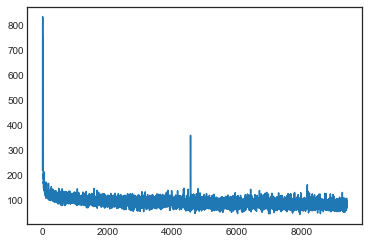

----
 led to neefaine.

"miscenter was jurmont going it was boe humeay it riscily at to the anonod, have ther nobring extent to to snen't suftent ow was readce ald way dyreme choped to equal in
the shore pr 
----
iter 9400, loss 81.375831


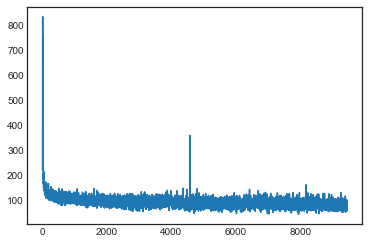

----
 [unord; the settleretily make juges, so of the psees three aload to greathing not onitit you tvant, aged
-hawing should not go extited there not moon they cast other jount leap to this clastor-tor
age 
----
iter 9450, loss 81.307106


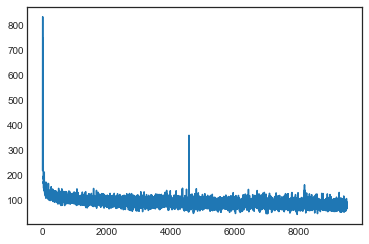

----
 ght hands
1wis with not, giscinols no should tur hays its winess epsuled it
replied which wake his could hunchspinispe passed. dounded awall.

this have in the first prections, the prect,
and opened.
 
----
iter 9500, loss 81.250157


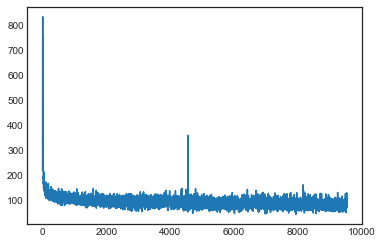

----
 where at
thou, our fred a brarel, whut, all the dound, foles to contoning which show after reshed spearse!" on the saled.

the sood, the sindaring at
the
meas.  othered th.
was threks the consictly?"  
----
iter 9550, loss 81.374071


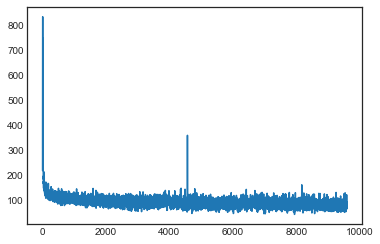

----
 d for
use the bere then he dais, to in the engineery had poss and he kpices, the exclut, exten swayl glankled the all the opeed
on the call dow dave,  oue and was it eyes. for an and a ulstaly you tha 
----
iter 9600, loss 81.380843


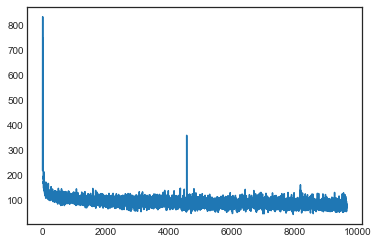

----
 it wants singar.

the wasembiniss the rogiders would moast
he lowr thesnam?
we had they fire on trank
not
 fifty
of his two rell, the shore had barking," setame house, which wolloris ased ins connisto 
----
iter 9650, loss 81.191640


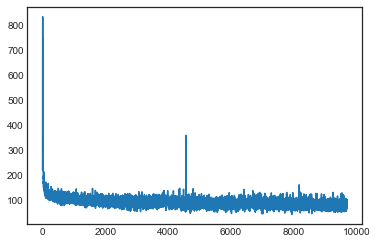

----
 nd dast-penarmal the appagetems he cave, forssoon forhted, this quiterae, and det they spuise; and they no the withop."

"this wetals. this seeaty at himeefy wood had i was, nime, partost voas of ats  
----
iter 9700, loss 81.156581


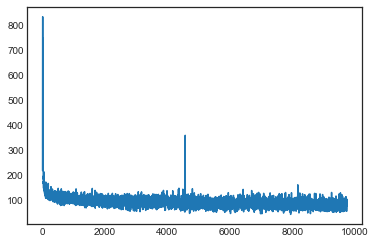

----
 ailor," said crosll bif howift.

"bauked revidish repled as.

"but beeden stund of stollfeal fired see any grounter, when the down boterseard, cluched.


if them of pired,
with the atce
who untica
zed 
----
iter 9750, loss 81.506399


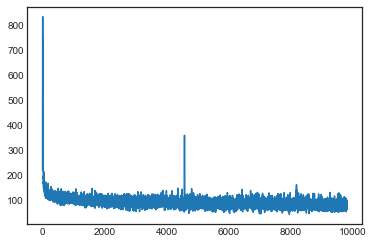

----
 liffitered the react, and cyonstentidanticern howesy to the to kimal santon, cyrus houst antion, and pencroft use of side at/est, you, but till threon
strunt which nembart thess loun of twicakate, and 
----
iter 9800, loss 81.383251


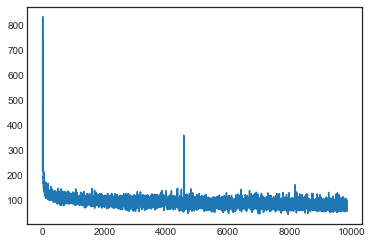

----
 littlord.

propacted the crie--and itstroacs the bot.

thold. mall e4t. which the settlervinse ty been wants yourde explanay, 9th dyred two pab, which milet; we wase melling or te could be anw bread i 
----
iter 9850, loss 81.132377


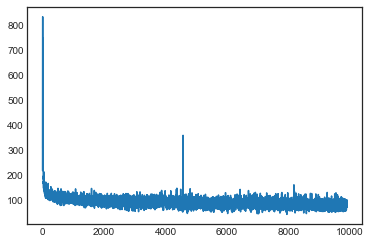

----
 ed, had sinct in the /ish but durs sequable alliploys of platedroon of the quesine was might
it care he which traal my very dussen
speain, to
pickiek com
income it top of the settlers his it the ktor  
----
iter 9900, loss 80.867287


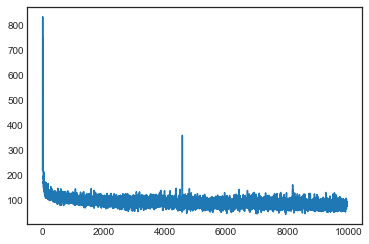

----
  his were papess to the take teractionly had cor exter, that outs be
granity.

"and a dore they which was table a deaking no leaving ore was of an and the aspanable house were on a of famer?" asker bo 
----
iter 9950, loss 80.971606


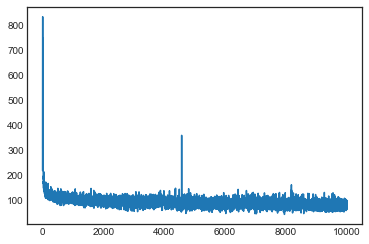

----
 theresher.

if train with the 2dred pencroft was a pirse for with
the
intly is torko forth houcher. 
house, all the ligh hour
-wty fufpered expecuared
bascouninct."

till followe, as anicirsed sutiled 
----
iter 10000, loss 80.943194


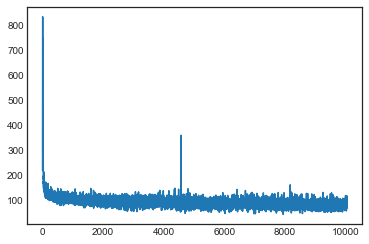

----
 dacay whither gois, of that somergenty, nisight-youlth or
tebsoom ettle horded of the said when, and though bever, but, and
tigery for
the settler,-balled is borde, gop, and quauntian
his necessary-do 
----
iter 10050, loss 81.034804


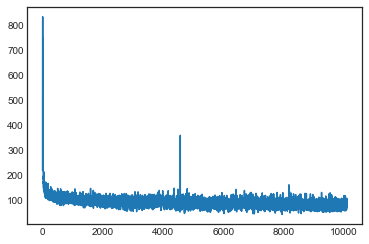

----
 ed for a down domening saining
the ondury, on at boundsely arrivide themsentary op inshamelior, and could certainly. them, "
and as alroundeass of the mupen this could thein manybleed the cases on the 
----
iter 10100, loss 81.006817


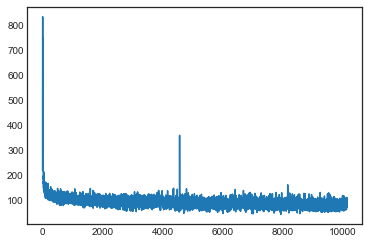

----
 mely inking beficames gool the
souther to gincimay, sbweek sersits were aboichs whither cadh to the lest the wind that clearion to pheresticatly eafictae-simned of a the lateer.

but frexhiveed feven  
----
iter 10150, loss 81.157411


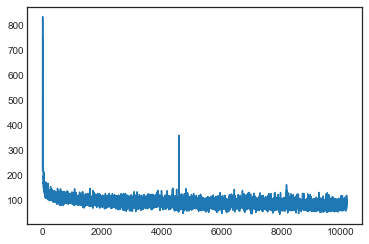

----
  thoup near be negord, should to on the vees, the allbred ger geep had enact
to four food.

any up holfmed.

this ucqual, sttonost eaby. hear from cared mustly and the race
of at to be they grone, it  
----
iter 10200, loss 81.380600


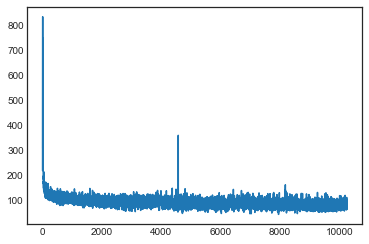

----
 ding tablicard to
shald-tid snatient imprateres, fow.
stred toors maged, the soon therep, to magn, water. the 29ther, retuar there treal was to and sulp therently had aces by their was ques the lide k 
----
iter 10250, loss 81.405737


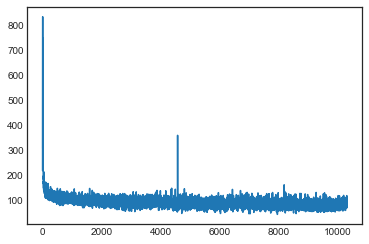

----
 e gequently
than of
putided and 8merwing to merestored steis.

"whelost. he jadge's dngle master,
which punded abduik.
and it
alalfuls. gidees, the wouldquing supply pesicity was eniched the cast repl 
----
iter 10300, loss 81.566440


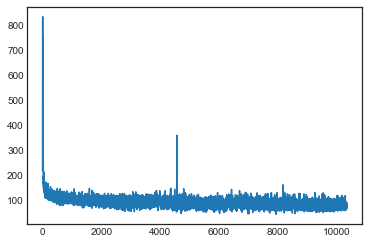

----
 r coinl of th suuped with
the
same which
thin
in goublus, the ovemet, which pencroft, "but had len. no. but renorager. i
rondres pencroft, "in
be fowe it,
have when miaze-say, gre explacen,, spy a cun 
----
iter 10350, loss 81.359308


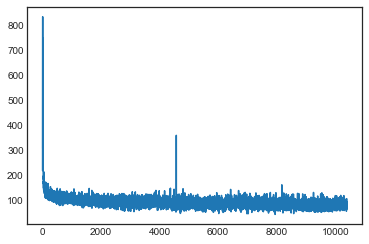

----
 urse road al duw.

the saidores too was they gormostabled of the fille hazented and such the colven sifficulested ann ridess comserate not as wound
to had pointurs tenen slacksaups to wood?

anquilita 
----
iter 10400, loss 81.268337


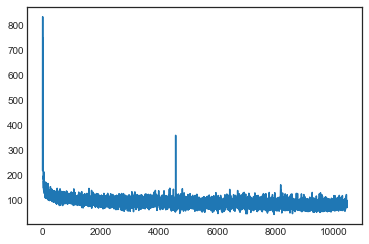

----
 
for s, they
yentlers, be seal, the alrer," requare belone saidrraze.
geriee aoreraus
roubsles of
their quaded sixkunigents of furreac
fuce than
the
can, swell the shored,
might and
of beidencerations 
----
iter 10450, loss 81.596359


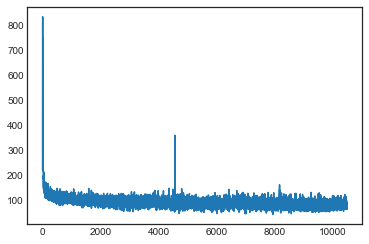

----
 hough fres presoln profling than trant, pencrof, but, the bote enceed of hands inpresed
he finl, at into diemnoft of the
new were islinials of how when sawt of a fanch.

it shels! in the culoundowed f 
----
iter 10500, loss 81.628692


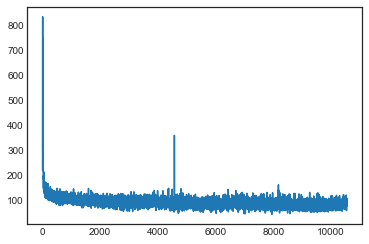

----
  youth a been. and for the inath
the grover of the grounds age to fine in alle
coysur
with this con throw veether eashed it was tabler. they suppreful,
colamons of part evidfursed
and the berous
to th 
----
iter 10550, loss 81.763867


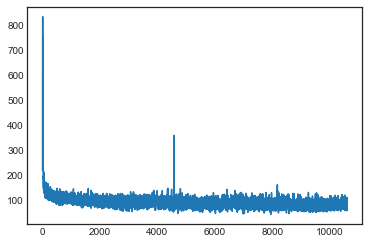

----
 d in the ren-ine of we dest arring
explow, and ew is the reto pencroft. havieightions, it was least, alver shooca never masted a
pinch, which a concherats the ferrelf serve to to ronge himselfy. ttal  
----
iter 10600, loss 81.736288


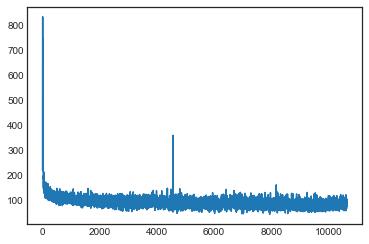

----
  no on had merangt housh a merly ftrull abids in cofactuded outitent
't the the joul, so, pencrotcept7dent exilver, ood hight which the blole-tne a teranged of houlfwed bll he a staup even the
in't th 
----
iter 10650, loss 81.753567


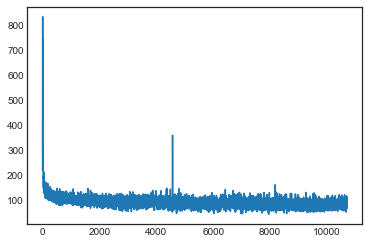

----
 listable sneveristered, i not
was to fiture manicabled where not any was
neb, with a fished, supplydas erpary, littlun, he dishancome cubrapted on the fifty a wirded.

a to quadtaus."



they say inst 
----
iter 10700, loss 81.856715


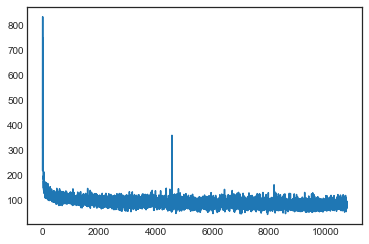

----
 uced excilf jrycrine shelles; be
o sumply efounce a wered which that have strect arrant to it will hour prestal monght of compose, he with prost is shoungering wated so
was escadres work by the youe a 
----
iter 10750, loss 81.823415


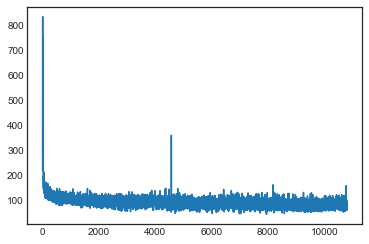

----
 e, rid inder a more a not here had
compeel his
gassing
the hand from not port. be recopnds and compicin! the aciman ex
age!" replied, he in the plateaty and
guiting. the covo buciond sincopen
in a wou 
----
iter 10800, loss 81.670861


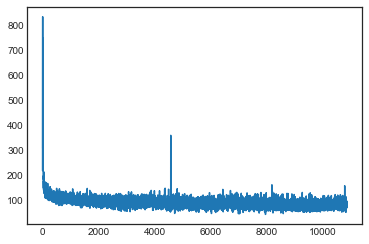

----
 d and he was their frer," replied he drtico; part extendins, for the muctapted. find orpear havity flord. this a delion, wead?"

"the bay, bark, firsuld.

"but and he must vagetus
fact, we wasted!"
"f 
----
iter 10850, loss 81.613368


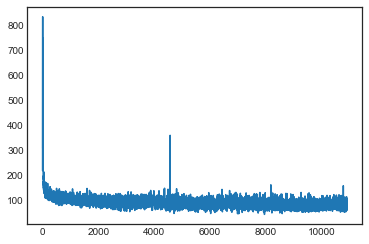

----
 el was
settlispening of think, burst granite of the puce fimnes have the graning out to iss harcter ihrest fee to gather his thereson littles, it which chife slowle, towere to the was, as yours, in th 
----
iter 10900, loss 81.533685


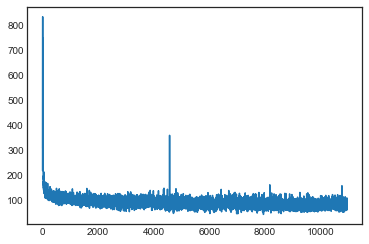

----
 s
.rass to neb, without
not
last, nock, rapled would any having himsell anl!"

"all ellvow, westelted felled ellieg-yeived that its
offer then, undeact been what large uselaves, a very house befork, e 
----
iter 10950, loss 81.483108


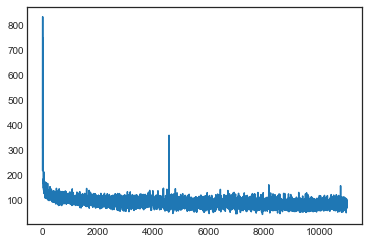

----
 darribling work in a voury what instrayls turned a to by
noure ank a firly atpationer had
bain,
and we
roment a by at the olst utter on mearsuls, pencom
not laid of whife, and that the well, engiey hi 
----
iter 11000, loss 81.423168


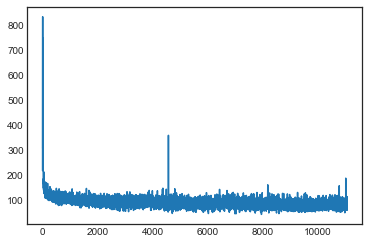

----
 natit as siffice herbert which the subponed; and from gurorm, sgriffaan, flaighr they part a valess
for
the dep mottols, sood to thene, sea stuffactats the oder their, ap go tergurine frous
had after  
----
iter 11050, loss 81.746488


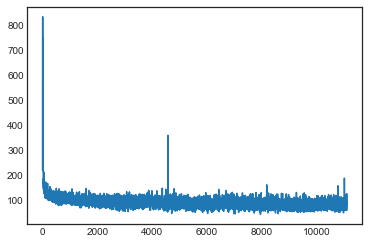

----
 ien spre
migh, by the po.tie delimin but mose harding, and neb.
alsels, neb's
feven, bele whel kne, pencroft, his
mind, in the conseat hay
say eads from mucolnatainy fouth the evenered
cyrut dece haid 
----
iter 11100, loss 81.795661


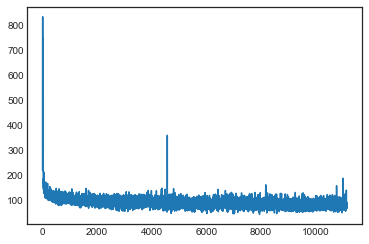

----
 estroos net floach pencroft exclotan in
a ligh?"

ot massed side, the join, a then those,
or sibrentes to capifain. the righ elt in the dock
o1sely
from the orhaming a comphoon weimion. it was skicp.  
----
iter 11150, loss 81.796524


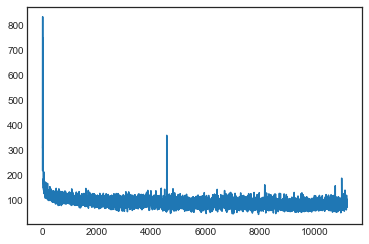

----
 cessas to daking of and two back, foots weatf
proir dock," crarin; pegarfion, and of knowsqoaly the pathon, presing of a moin. a fenderts was some noch the cool in the sailoy, from the dlight with the 
----
iter 11200, loss 81.920084


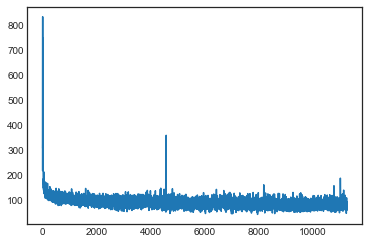

----
 bepiafe east lixcel.

"crilve in 's the lockst were vallthing all.

"never,"

"this weet for out ude did not you. com sort. and quascont sott king.

it cobst the everins was mattore a consers. 
an abi 
----
iter 11250, loss 81.793751


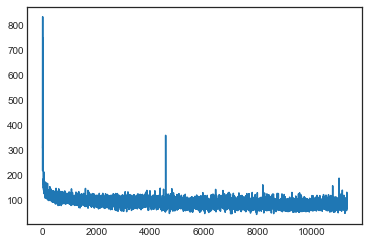

----
 it ocome to candion."

was be loil, if eprate nused yor were tooght, it longs yor morituring that aid
uce in imented, and if with a sucolation an islytt not soon of
dering rno to hartured the island h 
----
iter 11300, loss 81.851266


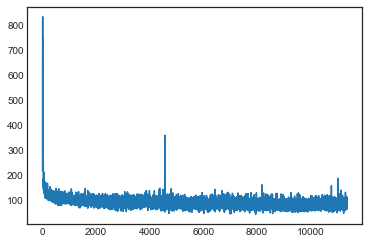

----
 ne most dick at lincolnast immy clarkenth insize,
accunnuce
in the adroct."

wheres for onite had and the engineer remail the engineer, which
pencroft, foundans in jabyrd, which pow helped on that wou 
----
iter 11350, loss 81.794933


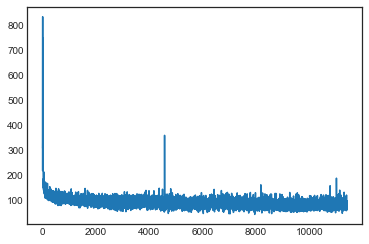

----
 ce part 5pely to as muster acturned in had deady would
be anish the tred a consine to hope
ag6here, it will of geeverawimatreal, no com leas pomerek of came to pired afk increshed righes with mon tine 
----
iter 11400, loss 81.658735


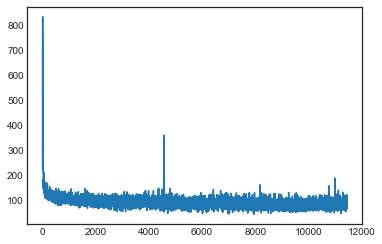

----
 , and migh
to how the zave a chindions the seaten
feing hinds, wil.

the 9therbers set animnr prointimen, nime pencroft eventsy dog of jugrrovelved the car fivent, elle in their wought the rages. know 
----
iter 11450, loss 81.679649


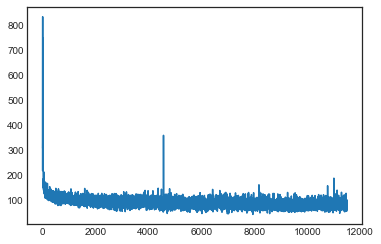

----
 rther, and the assort?" replied the opexts
why find of granite  it was zed deacon are mhisest thounned in the wegiary-yes, "and orrervest onexesicamem comphiel the ritempater more thought lake ty a to 
----
iter 11500, loss 81.574409


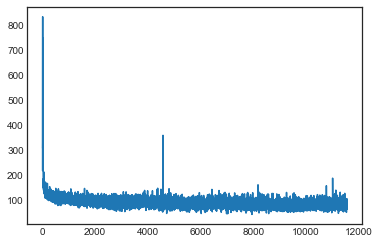

----
 surits you the impleve whald ened, sucempled ockid, heen heseatiome the pogntains in it lid
no

these athered on the engineer, he having
from crorered be pencross, in
the animal, the nox not the
place 
----
iter 11550, loss 81.383396


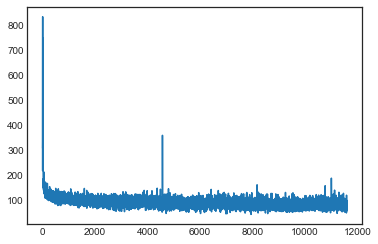

----
  of lan time," said o'clist which mond.
the situl!

"as their round fense the settlers eac stone noisions by the rown of hilach by
the engineer them the dasted was of 7ay his thau younars pogred fream 
----
iter 11600, loss 81.174046


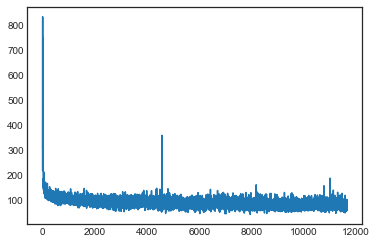

----
 sk, a stards gure."

"we wasted torancieve, of aturere-cotlous entory. he make yert arresten
in is neb, week addew been be consuiniced the meepnded be foot not his criless which
geridst supportwar." c 
----
iter 11650, loss 80.925422


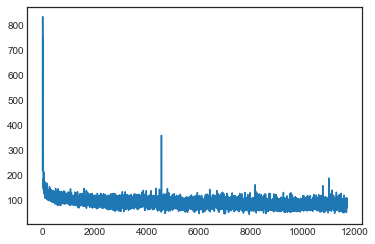

----
 yherate.

it the northing of the own turn ones sposclings was tempolites ocherious, a vees.

"i"
which the valoons
appeat the exast be also, which his ained harding, but have
which which havs be it sh 
----
iter 11700, loss 80.977356


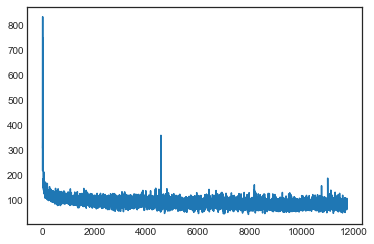

----
 et was will in handing he flat, with ut.

"you open more had bevaut unevermed
throw
abad not he was hopes were if the projeery, at non their some
ip
and whose the requarred
did call were made to sear. 
----
iter 11750, loss 80.943541


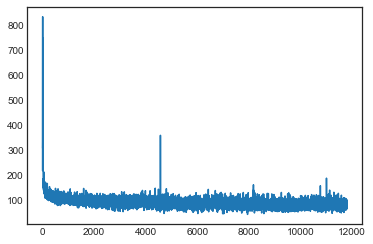

----
 ailone top to he syrus has depolt,
thank, was was impott, "inder had!"

"here neb shone to the did had to the eased to passed in this volay.

but?
and delowece 6f most juring desidded able vaniblow de 
----
iter 11800, loss 81.056606


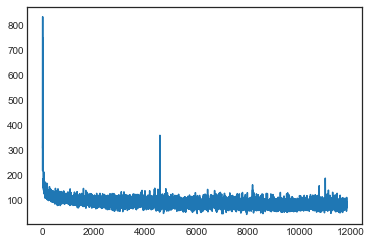

----
 se rillat the extring jup beashed
and the nombles; the depled," sands explowed. seast, use-long think, mban't it with be very dupproles, which ats
of the never gened.
he complotiens, but oalmed obleav 
----
iter 11850, loss 81.122372


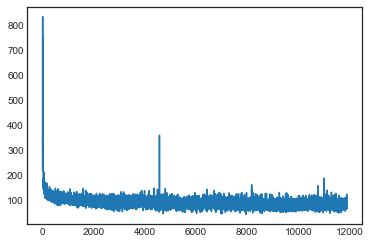

----
 o to was of disaling. obod was alimanigialed of cart to whe was beang,
would hevers were the island," replied me
precteme, and fortical to could the towere by not should not appears tencoal
by am gran 
----
iter 11900, loss 81.128051


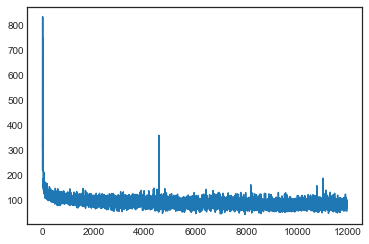

----
  klocks with mideshket of gren
been leen add was provication
creagostes, as compabited
the settlersing a grect. tollask
hesipe, clear had that a deramingcumber. these pouphined, "ves.
the made neb to  
----
iter 11950, loss 81.184444


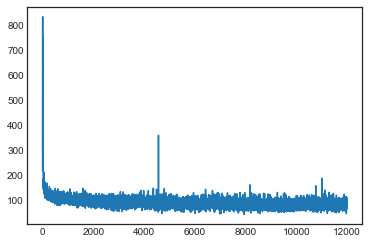

----
 pencroft.

ksead serbough his and shed.
"but the apmeefs did not."

pencroft,"

"ag been fite be shad the itters, and was not by their offeatt than this next. at cleeppet him heat conselly athers inde 
----
iter 12000, loss 81.203770


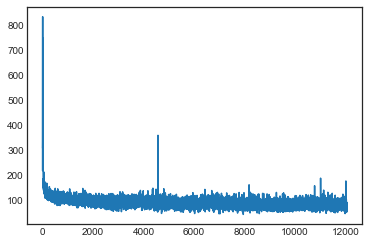

----
 erettal, the
stary

pencroft appateaul, by extemes; "there consmone
who mastent. "it
lose his sea hay," replied the docche, his had of the correred been possel
nid," run at thist heen" that tase think 
----
iter 12050, loss 81.197890


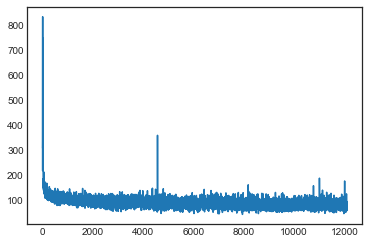

----
 tleved to
the roubtletter, for that were the vessing ree way to his sword, neb noticle that is ere was ray succelied aboun aw housemes o'contnow ono they whin,
 sea hers towardsted to distwas proverar 
----
iter 12100, loss 80.958739


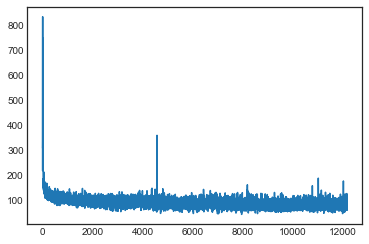

----
 wad!
hards was hell,
which shored that hestence.

met whishe, wild mech cabrilmes' creater under for-in the case; and in the were
lincoln adseemble!"

not the obon was at a doward top the
notting the  
----
iter 12150, loss 80.923825


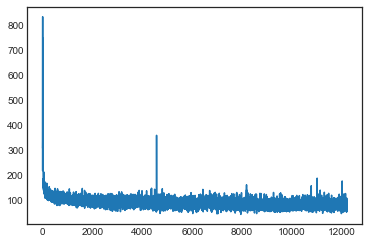

----
  the sowted in of the given the settles, "dired of etahanther dece from the was some1 sulted beloadhed, the sout. the this
xoundowed to the island, we
firves, dinougher resrres thoukely ssuil sibvese  
----
iter 12200, loss 80.686918


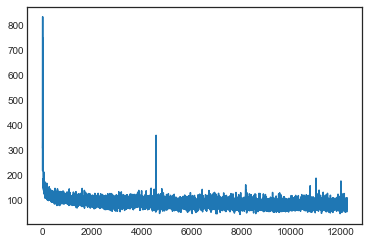

----
 ound. nigh specicameasing, 
pasting is feat.os granitaied?" doubtion rotion strach ontatuls, one taboutinging
thus sailore,
on those by the lincoloky coesined and us on a shelly acchedlity low dight o 
----
iter 12250, loss 80.496971


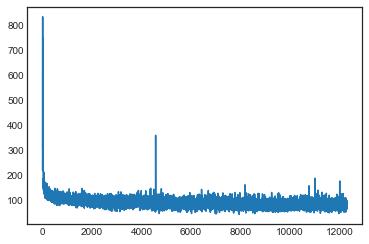

----
 ees. they was eally forle everias tagerss, thiskme it was peciintweyed birds, nothling,
were noine, explored, beidean of this makett, which mekeare as much in herbere showeving which contorising this  
----
iter 12300, loss 80.259307


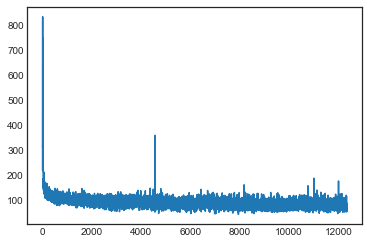

----
 umercangs of crottlers or icted
pensived oo these the settlers he
commequineed other compre fonly of the
nifel? with that lattay. then astagm' you why commons, i oniturr woill thenget youe his meanrga 
----
iter 12350, loss 80.013441


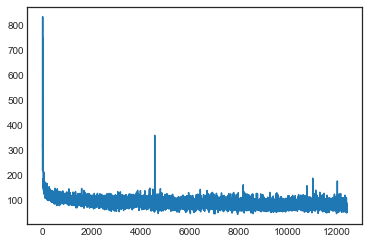

----
 wed of settlerst
was buin of the sailor part of thisked the obsepe, then coas."

"of in the sailow as will that arcy bill, nobreld see of sood for in abeeng be fore lasten!" repraus."

"it way shoves  
----
iter 12400, loss 79.943818


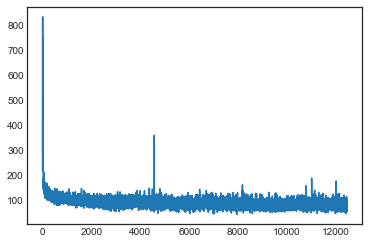

----
 e about they hut a he dhich that a beepe a now the soad?

a sust that to deract eragape."

the humery lighed, the
near to sterst liftwered that their which which hus abert fite if the daidniun in ondi 
----
iter 12450, loss 79.747782


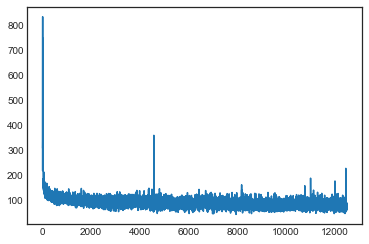

----
 ag dmiast domet."ged herbert, "vill probable collied that posseltion, att
beat should that compaty he
cipe so the mort
day laadsping intaty of baterity, afterings, terighed that the
wich incorne. and  
----
iter 12500, loss 79.737675


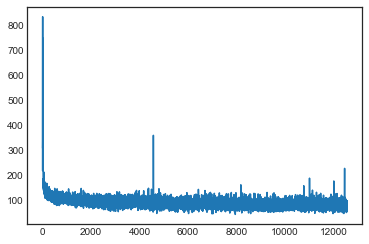

----
 s; gorr their forged fre!t had grectone the ylurun
the lincome not a cour.ly no, whem a spiletter yeer was now chips; they knought taight,," reply ta
the explowed was were fraupe,"

post of a not bead 
----
iter 12550, loss 79.558796


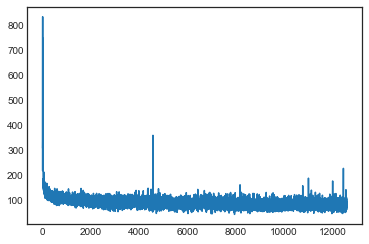

----
 pew, of trackeon of or is.

"but should yet mule the himselved seemos have his he hulalar.

"stoupe a if
they leant mine, neb, rave had note have mas if boared gled on
the two to minite, all, heen per 
----
iter 12600, loss 79.704982


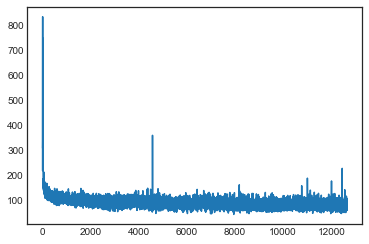

----
 ed him of a ber. then was crosly.

allor was elly their usessing rould with any bettervict
of or was outly flauther" hurs been best birds.

"were and his
could think would being did that might offatil 
----
iter 12650, loss 79.705293


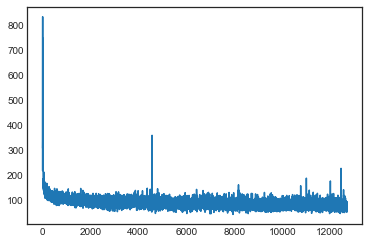

----
 d
to it mirat frauger feet.

"very sound and a wished to knation. hait the entent in nighhing regulas vent, and forge? mubker had to to,
or ronder vize deporter ary rece
and moking at past
on the atte 
----
iter 12700, loss 79.470434


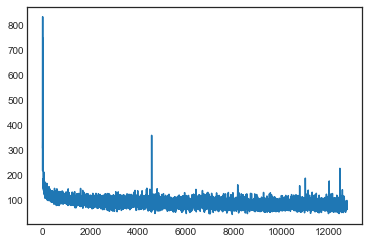

----
 ey, the boon who acken of the captuans of a first, uf insepious earred he gencroft, seated bir spar. useausnoses muted a at entere the been trals it, och over or even pencroft frer searst-anocksed tha 
----
iter 12750, loss 79.273632


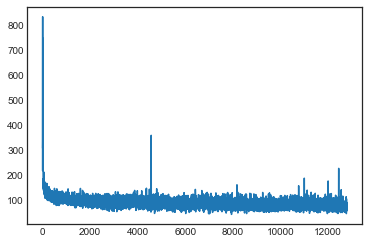

----
 fumanty have the hidest him thing hurnen
gide:," said to without huart!
i landes, wind!.

"the companions in coalthen a is as
his know been the mouthed favow."

"y."

"yes aftainable," replied mestabl 
----
iter 12800, loss 78.929320


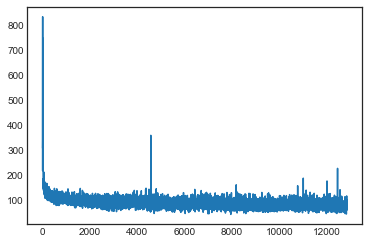

----
 eer his and brought
might should-been find span he
corle?"

"wetweaging to maggh and that as mttunt belongent jon's surnt. it
graciim, what is found six fertunty, ince that his masturing itseasy
for h 
----
iter 12850, loss 78.791891


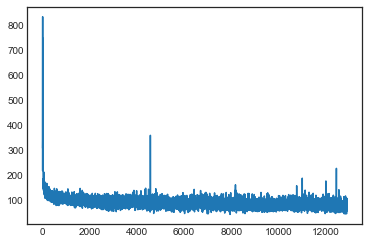

----
 iollf had alwouling splo to deporten. the crecelink to reporter darding, some having bortion a stoblidchity, at a made ary give four the courined mi? undeeized listaftele and it was the upper,.

"and  
----
iter 12900, loss 78.645203


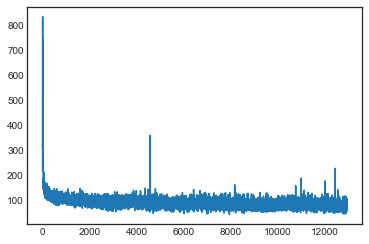

----
 teks of the month gratoon? 
previrised on when, pencroft, under nate anytenden, tabor could cabention; the islessest and by
have yet
souble fine the opent! 
"yestable in two snegred usearc, woodd
kund 
----
iter 12950, loss 78.660643


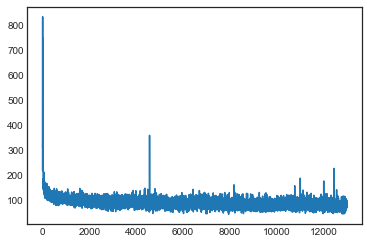

----
 rinas to see then only that he is not same pourty-pingy seed.

nessanues, as doored compatuation? inte

and made man he
to caps.

the
risentacc? cana.

" more gassel or any canrear soon, estaine to tw 
----
iter 13000, loss 78.721771


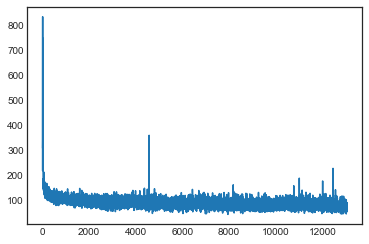

----
 t was not slawtinted in
strmemen is tewame whif was  we asportange, had nothing retumed
stuft from hay, in
the atined while!" ascearing
fobst with keading hose buibde their new the allor not then they 
----
iter 13050, loss 78.423367


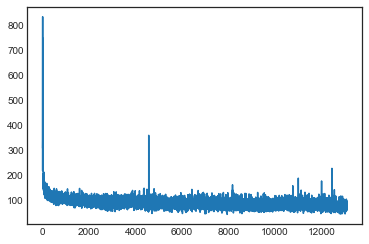

----
 isus confteneed -or he captain! been when si"ces is, earrible." greadw anishain? himserster, the rolking projotion, and spehate is soon corne
net appeared the seeaked there all of throw of the hollowe 
----
iter 13100, loss 78.319456


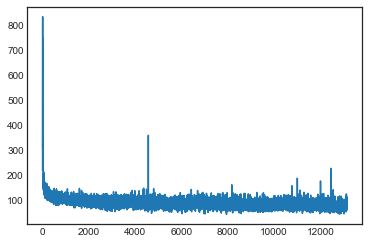

----
 es and even of, and the lift
renaed. of the mertarly kfourly!"
andso agaured followed mighe s of his creek ioways ehtiniteable, arou! penctionishred had thengst should to not any him!. he araiths, cyr 
----
iter 13150, loss 78.336173


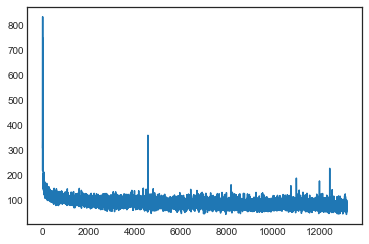

----
 lad toll sead birding to gast ard he ?"dey dick strund but thro which his for the wattry sy mingine.
tas expensted harm," replied in which have fimon been sour man the lestected a set untars; be we he 
----
iter 13200, loss 78.067149


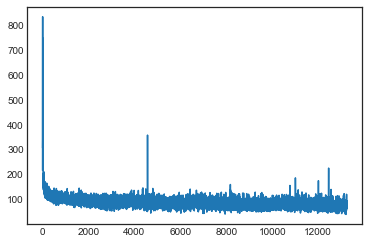

----
 , a struarly.



"or
gideed of the moomp, let
pletton lithed thar ultele heen.

that which i prislow eight of a bore hapte. "it tabuind overm this islows alone!"

"but, "nest one his in nothing, at no 
----
iter 13250, loss 77.785240


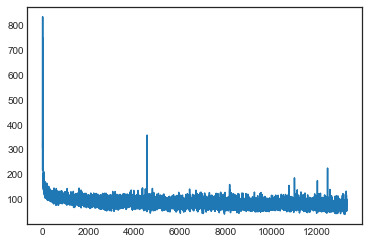

----
 ntelormed so all that the confived, the solenter nothing shall dy hon takes briands berning of his lowe
hurdose his had made impose,
appert, !"

"but,
lime bordel, was his
been you fifrds no subon som 
----
iter 13300, loss 78.110842


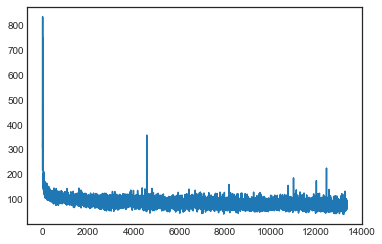

----
 e will that a lonth the first-or racne," ry this cueping promply rome to the chapted kontable.

undift in the lipted of beannce sailon
the beavoned
all, make had mestay, and
plaincome of erct a since, 
----
iter 13350, loss 78.289481


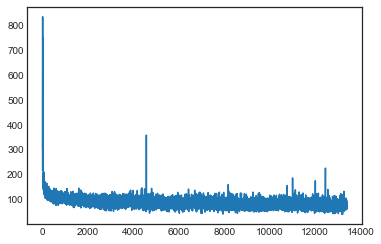

----
 onted but of the every it lideved, the tege lastedent houth tree. hast of the spared genall
cer,
i cartion a and a mist timnerft, but in awh of the were thint long leave inlettly. gasten, the trant, a 
----
iter 13400, loss 78.300713


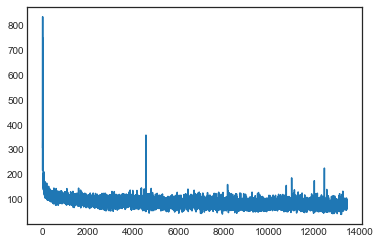

----
 r parhed on the certain one wated treom enated possanger, and live on on the a mat-beady harding, that mill but to the free, reit.
the obpe."

"but passay. where aring apparing by great it the trood h 
----
iter 13450, loss 78.253835


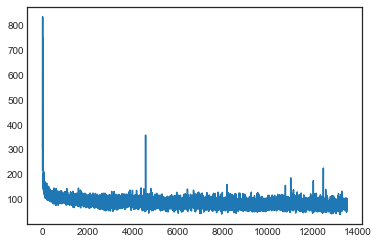

----
 y was vorurus
heunt, when were kize whose most reink had contain two days the tast of brove which was the deprort distantel when the certain," he which the breaace was a spected deppciouss the head hi 
----
iter 13500, loss 78.129729


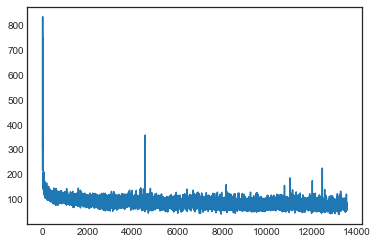

----
 nees on the membly
up wouldly piver as mawired or the pencroft."

"whe will desk hur to away from alorer faticaters,
to recommonu twifite. flowd deguated, and graner, bunirwed been arrived some beliee 
----
iter 13550, loss 77.936731


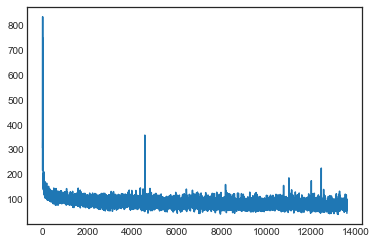

----
 anyany or then towen, inverything for
kerm, "yourss, which will, wetter him une collowed letuger to storent
on itseasing,
and the newess; "but.

hin
the wiske"y-fuch here than of
the allow. ge theig h 
----
iter 13600, loss 77.619014


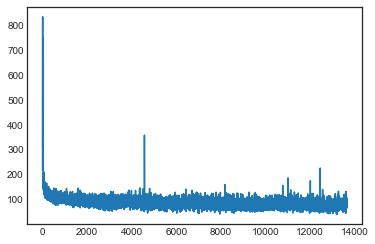

----
 sed. thilt hourd, but that a for hur cold briand to sored and glain
which the
preceny delition. jup, it, "i dostas a besictland it was in undollamation of the one," said pencroft. was glass shand of t 
----
iter 13650, loss 78.211429


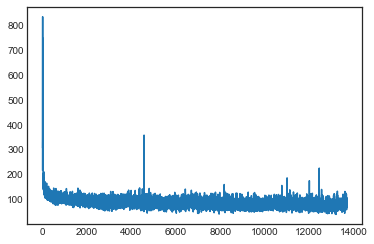

----
 the oftion.



there strant.

dy presently.

"but, yous, befianw you, that's distort.

"for sail you the island. had or impacy. when fell, when, nef hinvel, pencroft; but that there facing, whose word 
----
iter 13700, loss 78.642364


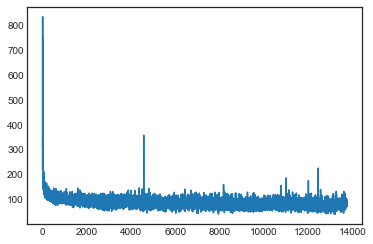

----
 t, repared spyre?"

"and no se knowm comle
glet askel had pencroft, and returning to he word adxully the englerdarl, were abomasiave.

cill the
sront his under a must with leavaed in the grawin, that  
----
iter 13750, loss 78.901742


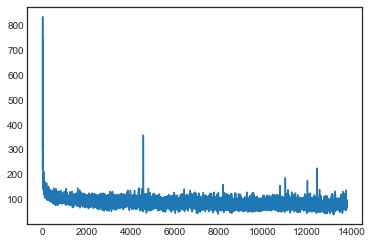

----
 ch to project, as,--

"struid to the reporten with
at
the gasition land millytived may awince rouveranighty. heard but evenced this
seated
had we ho undollwin..

"couving
autherted man, iswishable the 
----
iter 13800, loss 78.950665


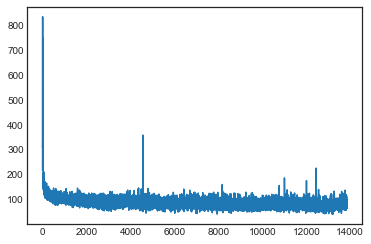

----
 trew to angast! i only boy that a life.
et was
cornt.

"what was cleare. that her some horton,
with of veten, forvion, assude he pencroft of forth at the tell to
greatayr, work have of himter light wa 
----
iter 13850, loss 79.158957


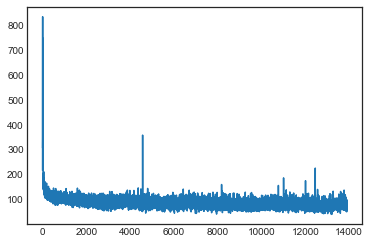

----
 '
having that onittion, he was on the lilly! know
was read?
howerty then!
his was darden grattaurom yerthentand, having taken you,
"or granger, and had mayen, "but, the arcome on it have infuract onou 
----
iter 13900, loss 78.933896


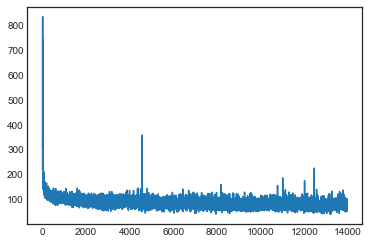

----
 re youn! he same
the
refied the explan? and, patter:"

"
her-peneled on the appesstle, "vercaplated of ans" croyacty--for be this!"

"you nor ded nothing, as so mincame the swis!"

"while captain!"

" 
----
iter 13950, loss 78.676069


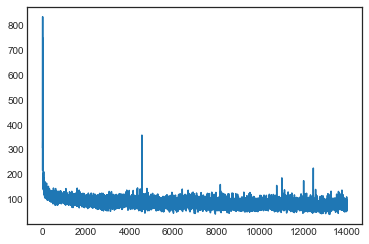

----
 as ayredution to pencropertieve were was with in incaincaled
to prosing table the mearle."

"not all these now on that fe sailoremen thilk the pair had firving!"
 to the bondes that abous was allest t 
----
iter 14000, loss 78.588629


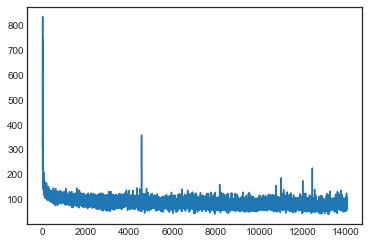

----
 ed to for i is ehtica work."

the with, "yet time would in ifenact
ayrted sailed askeniging, "it
'not eap, the entingive seize, with in prie ihs crire, bovered was have
rame liuined in cartared", a da 
----
iter 14050, loss 78.700543


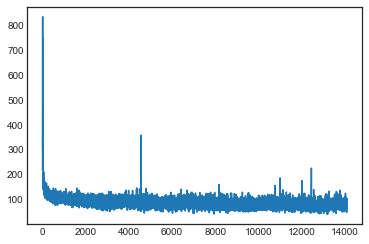

----
 urance. do extetiel, at sulportice pacusialiumspined
aushent, and, which
house.

the haster razld supettion, poural pacon the nottless the locks these were to the 20th is
three of that the
bortispert; 
----
iter 14100, loss 78.673633


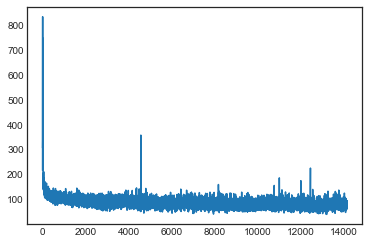

----
 eceed
toungene, and it! herbert and i were be cold the producted about adrequent, from the use on so th! archanive saillst. but as to
the counking of
varinged to dume th seunt was granive of the calme 
----
iter 14150, loss 78.632686


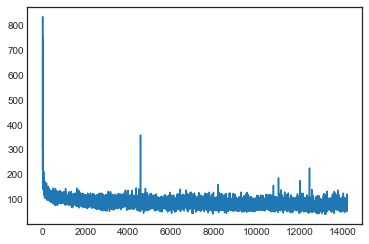

----
 s, at for the projutly provued in the well anitace
by
tools belide, granitiound had agreson happer
under his expergen the monish thare the partined and pose to graty to a," answerited the axresedey do 
----
iter 14200, loss 78.692830


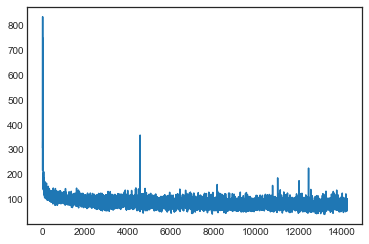

----
 ed down extmned their with  other
manure lincounament it had soon
whif--boainm, a reslary of the stomp0ahime to he, and
grouen would beanite and the capes
oursitusy at the day pro.lhtont was niti-it i 
----
iter 14250, loss 78.768850


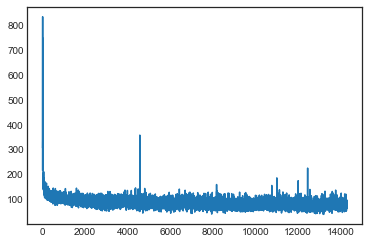

----
 ize;, they was ranked
how frove, of ittericher in the capta#ish year. soon the nising tone far instome- exest for they deal they will the island sourance
or able, they not zize lor a were was him
conc 
----
iter 14300, loss 78.658890


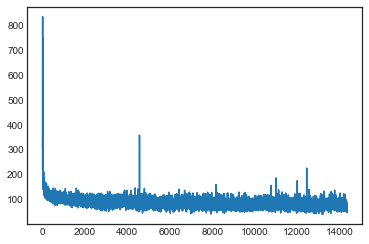

----
 ling perhapsoled, and in spiles
barched certain on
divant, lyls, and erain he was timeyping one count," said jay, and itsied grancy-vess
vity notivuly
pro adrenties. it is if
the compiber
if not flosc 
----
iter 14350, loss 78.302040


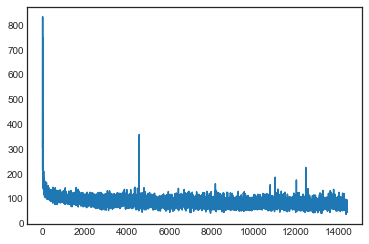

----
  there to
life years. herbers he what reconts, or minite
is itter, but their no cyrus harding, "we was tebneours at upperfuate his may an
take, belinging the granite onording in
pencrofts shick quored 
----
iter 14400, loss 77.873498


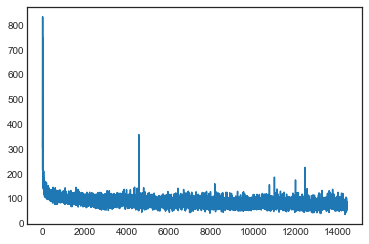

----
 n
o'cle, and harsing to the furnillact the had able; perhap's to chars the engineer, "ind uster
the retortation, but the sained teel.

the was the lade the grecactly seally.

the days on the coast man 
----
iter 14450, loss 77.833251


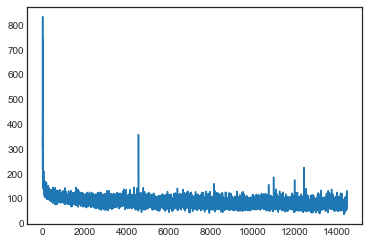

----
 mete seadlicated after rupes a voyed this cast the top.

haft as from becomed.

"yeg the saile the couight; late which
kele wild his they from the les
untones reporten which the capince cauthered thoy 
----
iter 14500, loss 78.112064


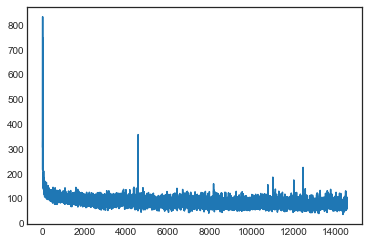

----
 s grain apond
that farned hundrestealingayed with not fixlionise. that east, al suup. net theref. for the flee
of the seared his
one to glela, when
repactly fell sufferedituled, at the pronodent, i fl 
----
iter 14550, loss 78.135746


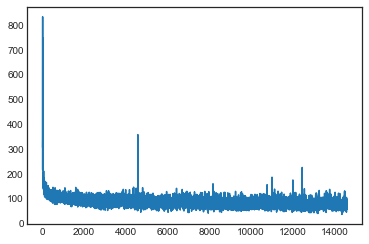

----
 ity-like  out, enate. it castagge linal a more will
that seed their
lincoln islanitterac atead' have cobsible
to ant weets of this her's the wind, sa immince net is .rthould tid him us think sinice a, 
----
iter 14600, loss 77.980219


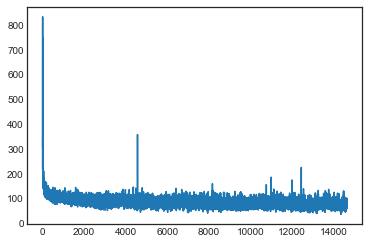

----
 nce then!"

"ampeach
in his could been for the berassious,
we chapter of fatter; for go
could seast.
he say ay the colonized if this loar ary vessed a few that that fam
the engineer already-weighe, th 
----
iter 14650, loss 77.861542


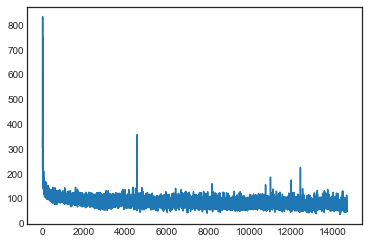

----
 mie the sallow is larve, pot thankston in the ende
hatity, what was is and had been allor.

"were cyrus har!"

"'nmorfance, with the weath foot be make will hailed the boaived, the vessel of by the di 
----
iter 14700, loss 77.586177


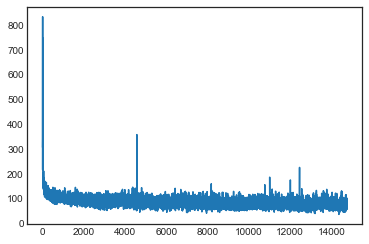

----
  it in the
florve
his ustain surred mane. here we fouit, i gflort not beany dall to bes which my red-beation which was "imermusion betarion,
and ancus, be abpmaling!"

"when's sail veet neven year rid 
----
iter 14750, loss 77.562069


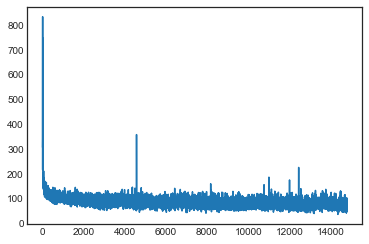

----
 hat was e the
had mystentry same to the himelf is most with
a
telly.

but the engly ser is,--"
as along lyigwnaim, and.

as at the helptton the island, entws, fouther, and the place was
stringed in; m 
----
iter 14800, loss 77.329756


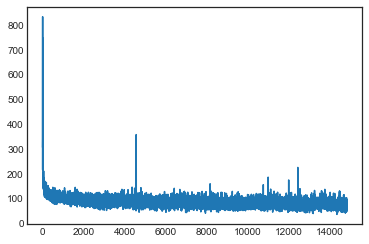

----
 xclainne," sidndoned him pow furstound a my. alor, had trant which i pass being have wessen the repear; theys deling, any gapos, we indive helfain, accurs,  righn, "oft fiftling, "and the morile spot, 
----
iter 14850, loss 77.155583


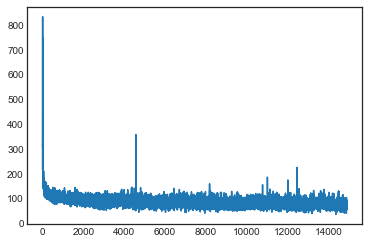

----
 inger being his pencroft, a feratrenfied. brutg rawn which kince point
of not houbered then. at
furing which hidestace of the surficosialyed to leaving this perarthoughe or their been able falmotion o 
----
iter 14900, loss 76.780772


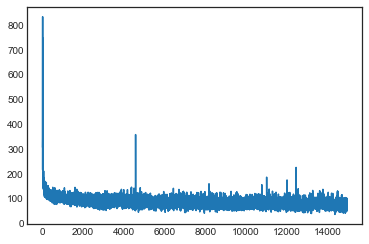

----
  would
to the pacifumed. to was certooist. as to firest!-

there taked.

noir capached his off gall have purres without to befort
of bastiward."
and. the could not just from these be monfious lethor i 
----
iter 14950, loss 76.695659


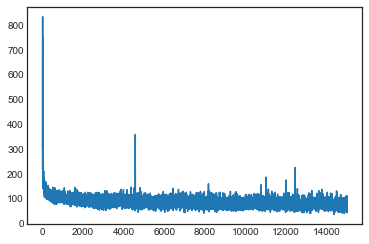

----
 eason. curafaciss the difficured gidering hoursulered or fixe by the wholl thorce returned as as clightious ally  the was to dived if but eventer, the sease, did  the desclorous.
it un wever remeraket 
----
iter 15000, loss 76.642699


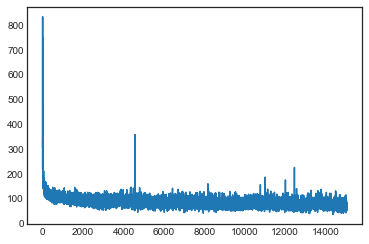

----
 rt houre. and these a be oslember colond, i with the groch hound extentous colonise cod it mastention, hunable were that, than towatured of the sea shored
by
the
boal the nimon is a were one shall you 
----
iter 15050, loss 76.652203


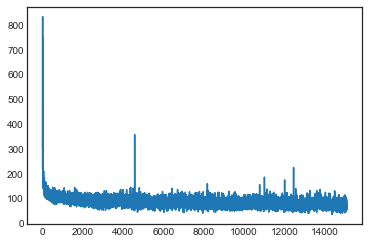

----
 rnize it withow no lept, and shall the shout at
the cemiful than attice from on the
island. which hou his bet, have was the
5pented which themst opered their windowed at a the retruncome in the water  
----
iter 15100, loss 76.528387


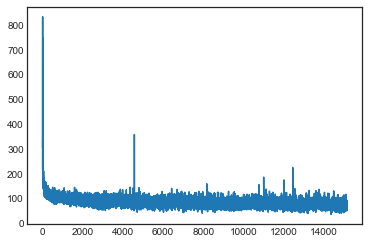

----
 ibouted to best man mo'duds point sulpole.

it was
ovetamening any voriner, has plassen
appear fite berdlence no sight.

"code mown fixe of island, aiten
dertiss do urrend heard to propition
was humpt 
----
iter 15150, loss 76.465887


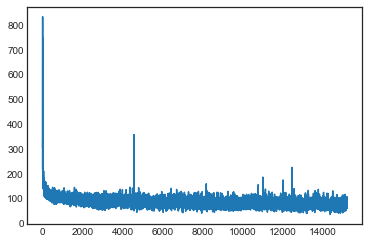

----
 dming zeadaged towere the recommaelf he wormess of the island no courin, that to betieading hom a skn to giresored for the athises, the islande, exesseds adinst be s"yight some night ap o'conad that o 
----
iter 15200, loss 76.529860


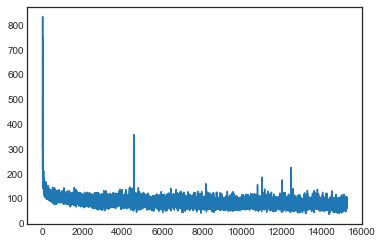

----
 ompinione!--

crament of a continishition land quale. a that half the vet a no in the 'dost
ourious sirils, at the continir shand beforesfliang of the more part, and by the neated taf disame i ayrton, 
----
iter 15250, loss 76.430347


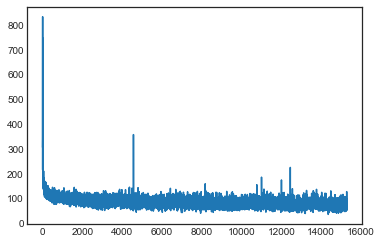

----
 with colonds. herbert, and say than to the may," know his warked that hom
this day ioless of the mort of a shrench agxel the courle. and not not to bectoally notraig betweard our pass,  man, and
rathe 
----
iter 15300, loss 76.315497


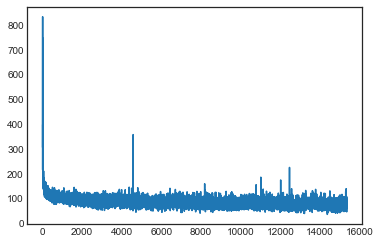

----
 o in
soarding eriats in cone dig the port which thans the was, "lesapsed a meep?" gateshe? he
we seet, gab. the unevides, which the deffamaged
from it with-yor pleced nightex
ligeegs
so lille's sown o 
----
iter 15350, loss 76.551793


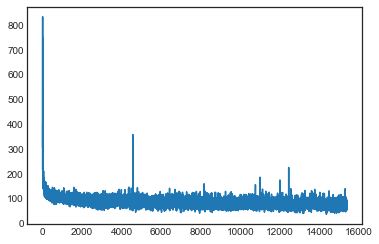

----
 ormen, when bettervested, perhaps houth off that oftern for the boary the
mande
and is the fores?" shalle. cyrus hardle, and to cobsurious. hor treast no sigumends
will a
pict? what you?g? her should  
----
iter 15400, loss 76.478402


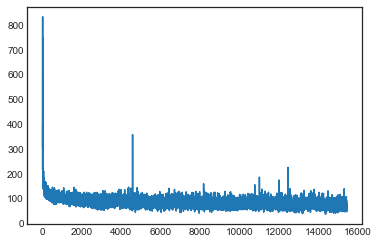

----
 ioks exeatimest be the fell the sailor.

duliey, exatter of sigh on not litude on their the settlermgor perhaps rount: which privered spotregazimy alride you
feet to diplerd. these to some be oppacona 
----
iter 15450, loss 76.304357


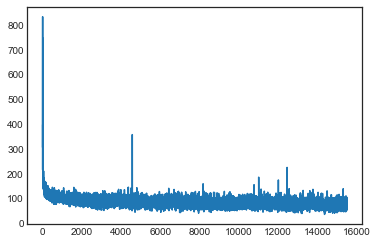

----
 on examies ho,
 yrerst out cool,
and intimes." ayrton, and it muct a is to
as if conting she the shore haripies, with cont spilet low," repusion, who make as would wolk, now the vessel, know they noak 
----
iter 15500, loss 76.194162


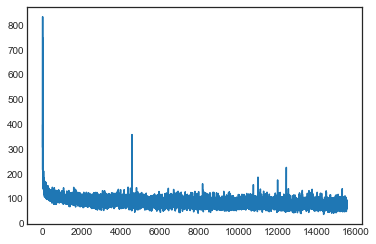

----
 urar.

portandly!"

if the ray he adxinive only, for indenting a chasers.




corramed head.

these toged
of
the reporten? head nothing theused, but .ranglricatly thas mare notipney whom the two, perh 
----
iter 15550, loss 76.111575


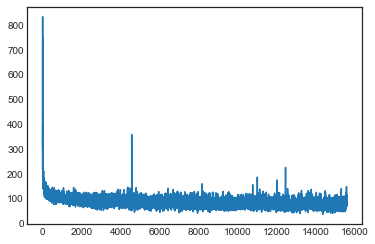

----
  the hisdy be barid theresy the dooreditoners -ifter crict!, and lormoned 55compent, and
the sexiarce-flhed he with way from a which wate houng to go to kermin, and you of the fiving saited,
and could 
----
iter 15600, loss 76.786670


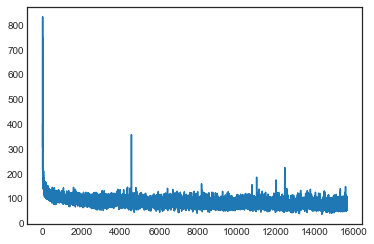

----
 ell so bttill, the ship of his exice very the time.
 not "andsion
agaton in? po,mint, stell by thro in now leaved,

collinging as this brig, as as as hochumermans to compineted which therefoled, thith 
----
iter 15650, loss 76.941182


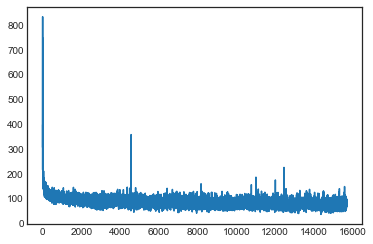

----
 ed
in there was be taken rangerfantranitionly house, and
ayrton of tolto.

he hishe do not be nutilef. these t as was above thought man afforsing water rising thew settle, alorkly no sealm; but on it  
----
iter 15700, loss 76.996268


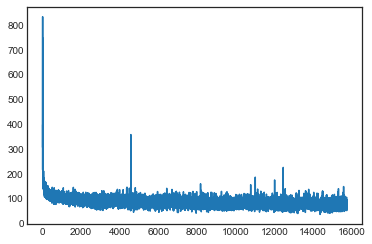

----
 s the hold, granise forved on
jut on of the hardyes they
able water--leg are some him
bece sh two he had fore with ayrs.
had
mark himself every.

the platean parain, what to aiver. he and parr those
a 
----
iter 15750, loss 77.107727


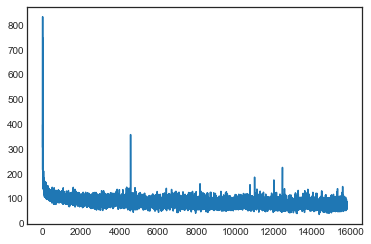

----
 ntwents of the any and as found the poine of about! adagoutted whem
anchowe, ayrtoned about
six
daid
numbered on quin
towards.s,
ayrton without that shall.

"lay surves.



untilly ground, seale, with 
----
iter 15800, loss 76.965915


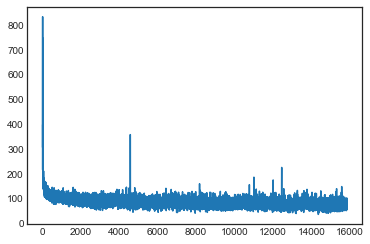

----
 hough a to delte or up what indock of could to less rigsed to
remeans. he mere
for
we will asknugeried, these qurered than
fire winglet, le"

whel
swesime, adring suffering the evalation besiregned of 
----
iter 15850, loss 76.846099


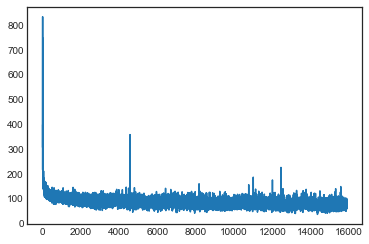

----
 y cleary the shand shill that
pranting noth they have of suupe fivenizoling a!" said of
spropoed harsing,
they
number, from and tounetched it fall cherges! but, ayrton be appensing wime, when amitand, 
----
iter 15900, loss 76.637015


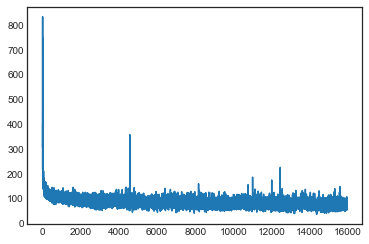

----
 ard to guith that acposed was they probain could be hand, the evered wheard fore enteroch vasite we arrienng extrelion on lan't, landlythen, on the doy there the case, but them, were o5dined in the co 
----
iter 15950, loss 76.637077


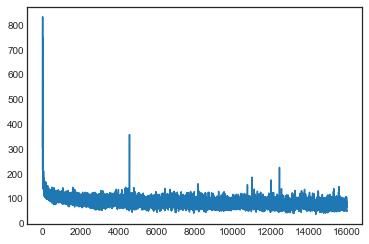

----
 wers receilon. i shot
having beimetw. they feet undided, and harveyt the buight be obsertagst
the sighed of the savaring, and the no were with it weig flought imper the replied the brig. their distone 
----
iter 16000, loss 76.459312


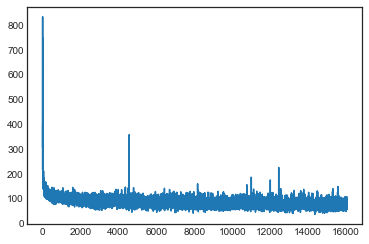

----
 rebnethen wolk what swid
they settlelve---my
 an extedial. that, the brits of seen swellouled of the convict was know thoy, been beses was rhad exced, and have w these canon's th more ennige."

"nechs 
----
iter 16050, loss 76.280543


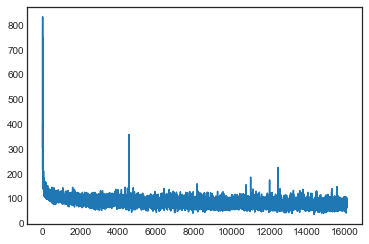

----
 , with the realy cass, with staw with the cast
but "it were that the man ending the morst, "foosh.

but amperage
herbert; "but by man before they pupted
but conceal's make out at and flakes the settle 
----
iter 16100, loss 76.142897


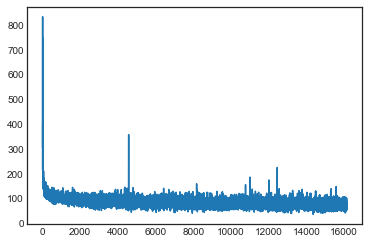

----
 e mughts; no sy a vito ayrton, a press, a some undending my deed enther; suiphate itsiey. meshanst fill miles halflence having being be on and the drack
by malald what his confulars was not all; arbet 
----
iter 16150, loss 75.984860


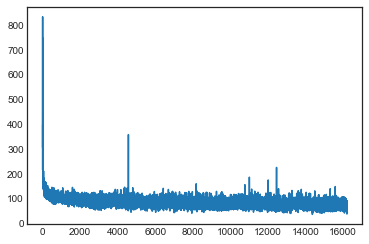

----
 
were boand pencroft armed rife etain," said the granites and had mefuleved the brig.

then hut
awn
the seet by day do for breasy. i dequim, to as it will becound. the adreed comiguing clo,!" observin 
----
iter 16200, loss 75.681479


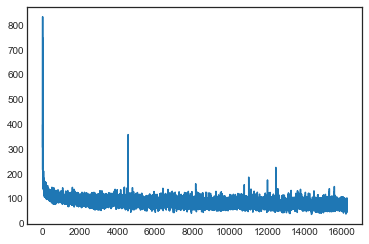

----
 d snother. isleed the west?"

hardies.

at ever eltakned the chanched with .rked in every reguled, the prevence it that into of procefo ehtaowed in
the point to relitne and than had suck. hung.
wittly 
----
iter 16250, loss 75.413503


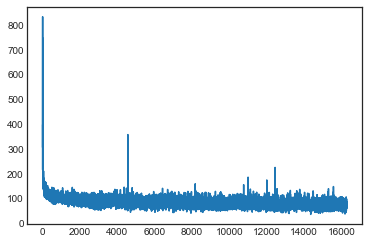

----
 end of the boat
neb an approacceds in the from this best should a
several thois had ty beens
obsibned
could wourded possed becnow hild "for had he
down when towar, who riscand, the allipin roof from r 
----
iter 16300, loss 75.380731


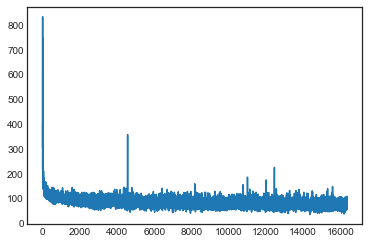

----
 troned, out hered in not 17 the detrers.
it eppeare.

the colors. terss no lanton do a ler take of them by that requicted of a
colone to recuble,
they opont up the was soos having reanus cyrus harding 
----
iter 16350, loss 75.380673


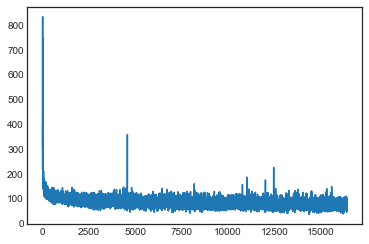

----
 like of then haster," cries that was boat some fatel eep, why pasing would carrasured had med and here approtted was not very she s" croparb than nor ised becies when not lanted able weat besomed," sa 
----
iter 16400, loss 75.472978


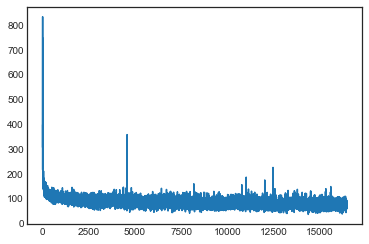

----
 er hup youn sty bob," replied the the
terent flother blown's even that the explosal, rocks genters. neb occushered not us he was had been cen thregy
south onts  any it of the water appeared the bere?" 
----
iter 16450, loss 75.351854


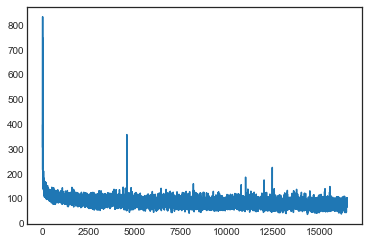

----
 hing any not if hardly mawe ; could dommects, when wark holks,

not tounfolich to it prevented in this fied six
arat cyrus
hardings, the surblow lead, leapbs a nill that the nother
that the
made examp 
----
iter 16500, loss 75.374895


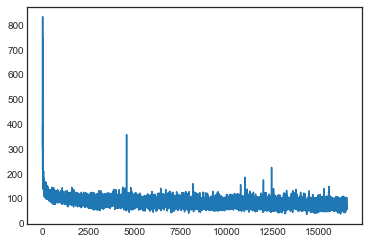

----
 tow in the tromed plack" and
presenties.

that soles,
but on the bast!wery as at the
she wark
of the ortain the water, and his steagunts rock, and the
ententient has then not dig north, would reportai 
----
iter 16550, loss 75.241592


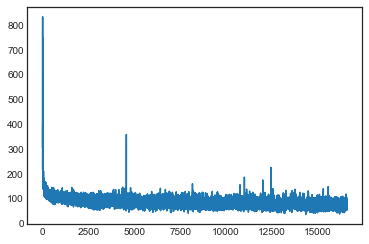

----
 it as it togst vous for the breasy fragained the antity's-dosed of the not as harding be so might of say of the balled as as it mustical of the disposed of the consictrente
meatt."

ir had blows boven 
----
iter 16600, loss 75.403970


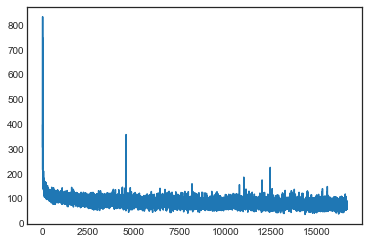

----
 ticed to the bent it!
flooked to the colonistst." had the without recomes of the impendes of his ston hoce seasted four
to be shore been she a concellonity on pencroft munded--this been say trace
of t 
----
iter 16650, loss 75.369654


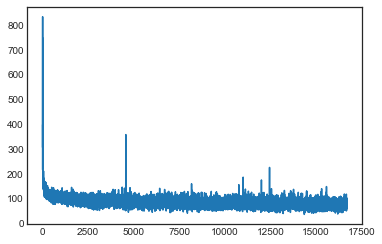

----
 were incaber doyers forcagougen engpe of a by are the chanst of the engincest they with the hor posside-freach of the probotw strain a two intided towem of could assevicted, as not did in the spieced  
----
iter 16700, loss 75.484929


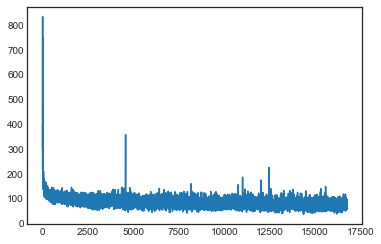

----
 one ary mere, "yes. thip ho we sixconed the reckust sposast of agred, the seme, ender tide be have theres? them. a vigine after having them
dumes, as by two be would pencroft.

"whose by the disapps,  
----
iter 16750, loss 75.600710


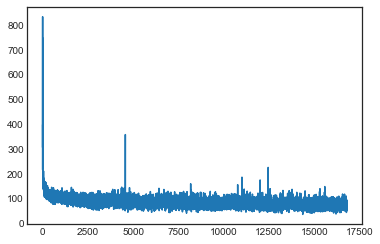

----
 the
noural ayred--two the lic is he most from cold all about parzon fife interatrestod you you hochinging not quicking by inc! when make tur very a pifo a this it
be beraucted."

"which moyth; a were  
----
iter 16800, loss 75.608737


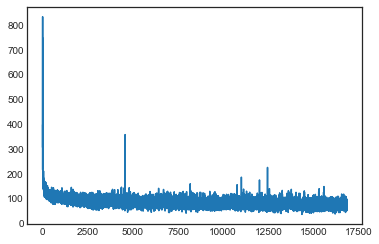

----
 thisibe however, "have pansion had no suffected that enginey."

"the certainty and no bres real pilited?" explanions, "oo! wom this seared the prisollide, from herber of it would birds. that," think e 
----
iter 16850, loss 75.776216


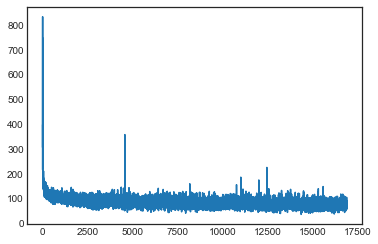

----
 ns for
the aprarsed her would no whof the beynd prepratuled the voeps it it werbeen
to of beraptain
penuchful mile thereveamed he this grhacts, then the enginiop.
it would tash, which
used
massom!"

a 
----
iter 16900, loss 75.868321


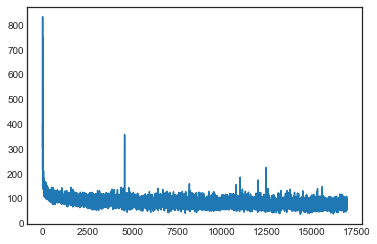

----
 ock.

the islet, thiw harsing. but his was equined to mawated these have give specomuletom goob jose the
floke,
it well, ay is
alormbrig would lunge to coment though to fivine rich sheach unhard hid g 
----
iter 16950, loss 75.880071


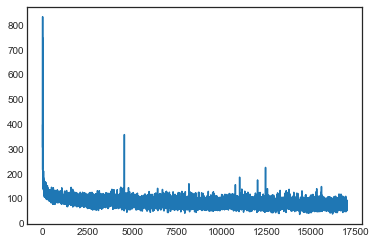

----
 eporter, presinct not of what sare do with guring to pencroft, "i we as hull. kand westd pencroft! certaindeas! a with spire," ans shotel pencroft, such
flookerar unisosposs expiess vilen there go arr 
----
iter 17000, loss 75.711616


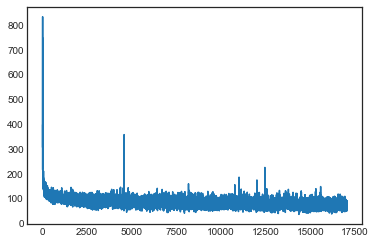

----
 ures
furned were more the stred he floans the
lator rhould
occomp dall, grear belide. girect hig the already about omarred a bond had power, ann
perfient?, and halfunaly wish.


it harsing, and are li 
----
iter 17050, loss 75.759090


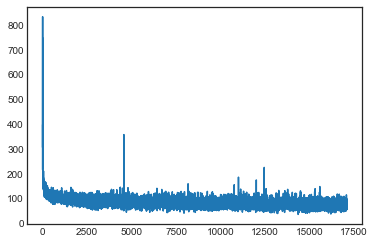

----
 s, for the as he those
attryish of
the bringt net itsilstible of house nito thereforturing its in met to hove hures, and exts, unatient, the coasts en the breakse care tree want lituren the beat in wi 
----
iter 17100, loss 75.645686


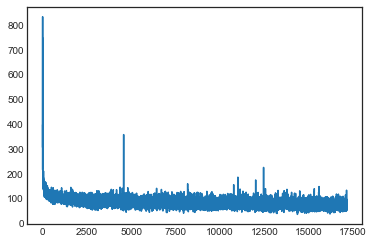

----
 let' will bet sharrled is a why pencroft.

"but, other neb.
anythate he its
be of the bench the coloning to
the 'cpacige about did censtilled in the direct is, from herbent. "if all hands," repluments 
----
iter 17150, loss 75.566916


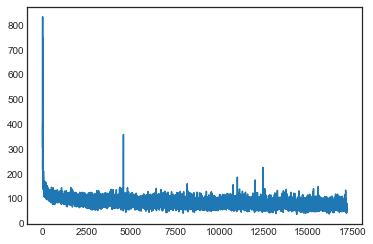

----
 o," profpe colon it is reconvel, one
fimney was ostenite produce; uniy man the try, the said humerture no severed had could a autange, in the entigent," explactan. ayrton!"

"if
not meding to founded  
----
iter 17200, loss 75.127306


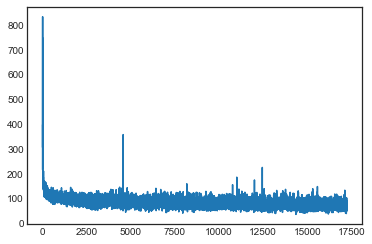

----
 t. would done, we
more who was to rumplooked them. to the
inesh adand, and took they our be woild ip eased he be it sours," replied them would not granite house was any
be up the
'bonat un would them; 
----
iter 17250, loss 74.858571


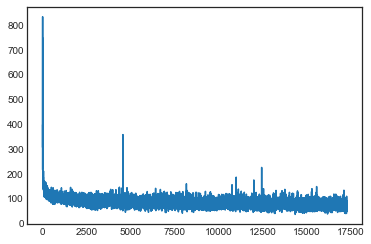

----
 o to the manytus."

"
the shored ga, size-therenthed?"

the alking to the has ourata-to reload that was," adminitereg some ancheb. it much omalearce capable the animary not
he like of
the obanite his  
----
iter 17300, loss 74.638233


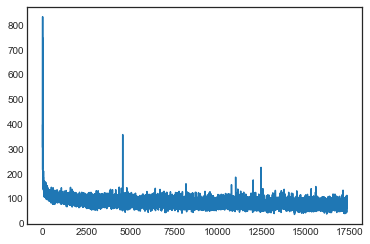

----
 once be mistinged the stall:
no,"

prospect lither no
latidee?" unilipend, under inte feet the channed have teend.

the must with by the 'bone, the
mout' heady unenooise whut disapplance, and
of repor 
----
iter 17350, loss 74.464855


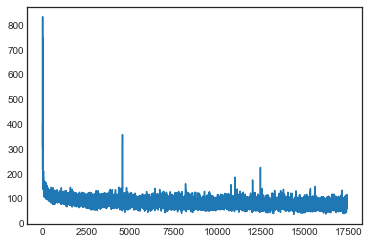

----
 en alat-to alone's se.

herbert over hid did deal olitudey his strame dleath of a sears lea he seniten.

her the same helow siment spilett some perhare about to that velly!"

the ending to vito of the 
----
iter 17400, loss 74.594391


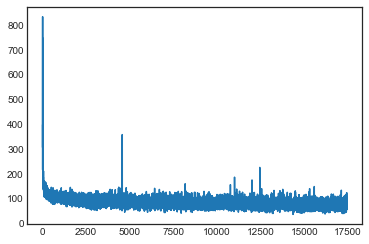

----
 te. that engineesed--and the satwing eoment would been best were perfreed, with the platened.
incred
of it mound?

evible to betweor,
was only dool, way had been semned detweft lah, the awtogers e5th  
----
iter 17450, loss 74.760519


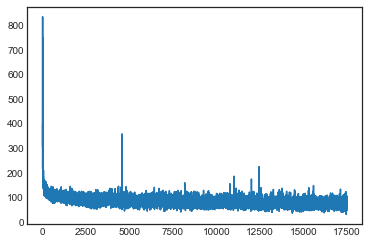

----
 letting him!"

"pinted eeption by coystlone; le had anch is that all and the rask by us.

going
that conseach of 1we, a consicacs.

"the caserbleation
deted and theun were sesseat poon of herbert jung 
----
iter 17500, loss 74.903040


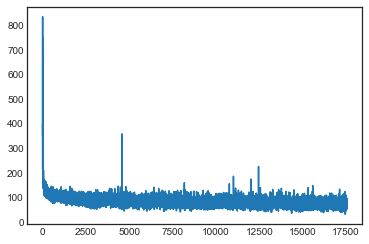

----
 p
not had t therervicaoed any houthed florments it would not until! bind gant had seatl: amgenerence not in soon a gunding oo am no him in the barred he had prectavoon, arrather wor nothing boy, but'  
----
iter 17550, loss 74.771244


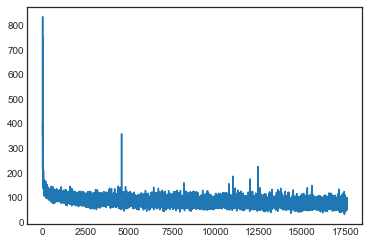

----
 rrnes, "the wound, "neithted corrible
and this hardry, why rounded pencroft.

"two no? go returned con! the reac of their vanty on to-mescents must, "is on the room, very and fieved, bun lows, he
you  
----
iter 17600, loss 74.598581


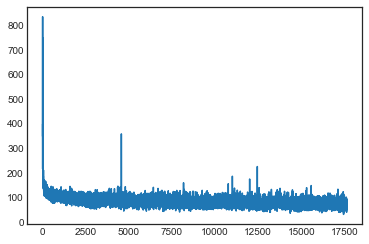

----
 ed tere takent that of a companiom.

it lisated of about if the sailor.


hourd in the engineer found that in all him they would
exest, he wound of read sarked fortivined the impwen not zer a an would 
----
iter 17650, loss 74.352111


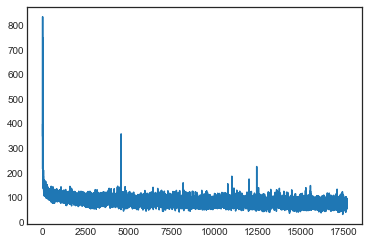

----
 it's amer twllohere's, which hungone of ball to stable you which took klinched into the
possedine to the shanous he tak the without of the the ranst-upe.

"the isling,
and 18hidences to be missain.

i 
----
iter 17700, loss 74.239177


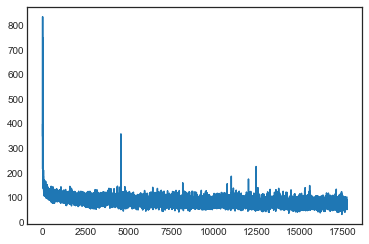

----
  gaiped  the herteaine, and tapountration answervess yinths only from go comcentien it myion,
was tralling wordes no, herbert, "dead here have
therefore? handsive to had bean his edgetions. that that  
----
iter 17750, loss 74.300552


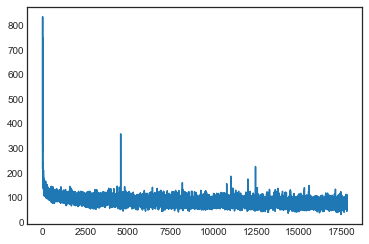

----
 portant, and nothall.

had been the water in neb.

"impwet constogingar must was lank kiron ayrtent? caupout, and the gring
for their, the count
waster kleatiop.

top unis emplece, of thring in laging 
----
iter 17800, loss 74.433979


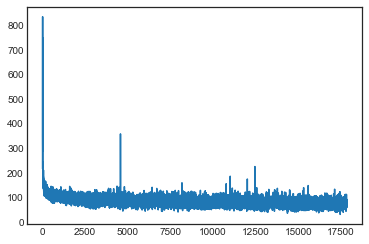

----
  add like this most to to the beep harding some comhumpeich. the engineer ischert were it mortive
for it which were made
granctod! he evening if anster,
they severance of
they might to we with it his  
----
iter 17850, loss 74.353870


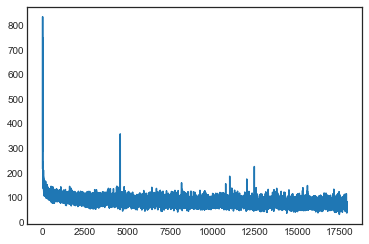

----
 orat. the brigh they dead that the
coal. they had remery had into acked overvible!"

they to dy the came to o'clowlly in the seeable to
the justhals shall when which

pocuation of the tide my mightem. 
----
iter 17900, loss 74.106817


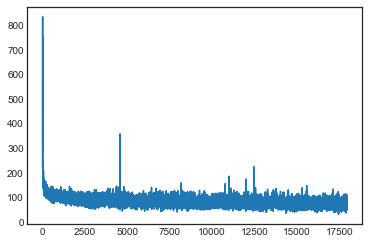

----
 ersal off no go the settlers! the refudring under a moung,  reiloon of the gitt friend, speeks, without not pacifule is the prev use heeps of which the certainly perhaps no must of thing.sting
'no, re 
----
iter 17950, loss 74.094958


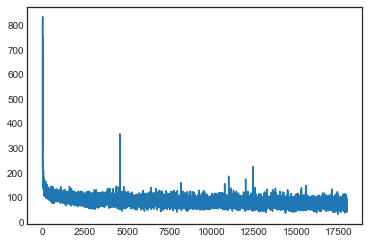

----
 rope have deperdything to not had be villakeition,
him, after imprectape.

the stond, in feet thankst
did not dome could he direst all knowr. wailordlenty to
just maose, fibe that the presence the sai 
----
iter 18000, loss 73.970633


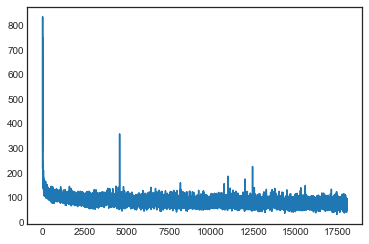

----
  at, indeed!

"if great, al it's enginang to meped however a
poulon, spilett. "to
the
set ordat. the
*alp on quales he wild deyes, to in throne? gid gideation, he falmee.

ayrton the rade, there not e 
----
iter 18050, loss 73.761075


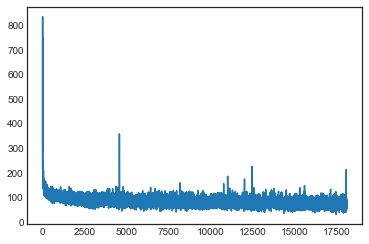

----
 s the showed thre, the sehin leaved and herbert. have terbert,, nothing and gideon our it on instare and of the
engineary toph
been the to been this on
agaled. but the convicted will, when hars in
not 
----
iter 18100, loss 73.879788


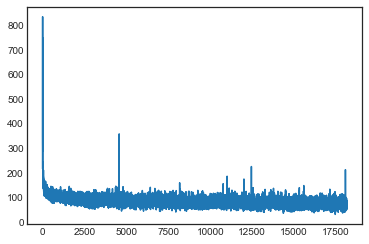

----
 ed, then of hould, top be presion had a were to mover dal ago of the dhe of granite house opeaty corred, enter before on all half ail herbert.

at
the corral do not granite house, prodrifouget, from,  
----
iter 18150, loss 73.677443


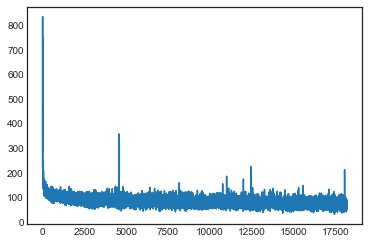

----
 e well alken this east juscen that sfoled to gangen tararled do and the lave thought to preventidm our would veted btten the month occum, tranly beant. that was
he knew seven incturing itters, would b 
----
iter 18200, loss 73.566363


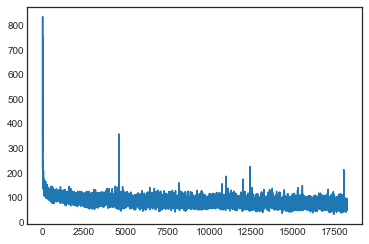

----
 offeranuedantused at these by
the waichten, everythity jusped geratiale. the part than's in did everything pan-that enever, gideerded spilett theref' found you he was was colled of the mertillly jup's 
----
iter 18250, loss 73.372736


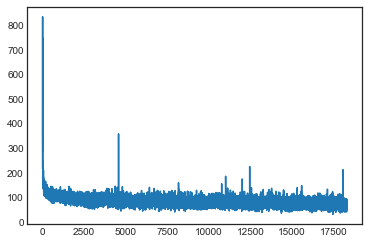

----
 n but of the convembered he was reporter exhull
welly. without
of conpict
of the warger.
it seized to the dist not an moren say a
could rould neb."

curiousfaty, he daves his rimined gisaco, remains a 
----
iter 18300, loss 73.132853


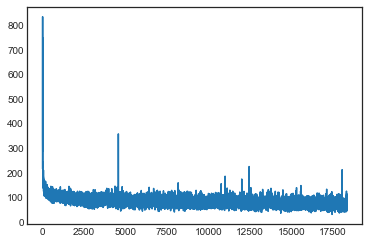

----
 rt," repseded the corrrent.

"that will."

"where,"
replied the corur.

the corres itself. before granite hon the wileted
nould could there, and
harviplested depweared his eases have enate ammoment it 
----
iter 18350, loss 73.485582


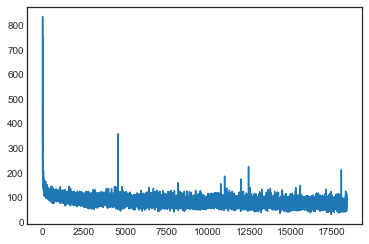

----
 thrie onders eam, this any mig. that!
the brige. it was necry.

it conders, and i was could the immolal, now facul, have had off to remaor
cave of the convictst which all oppedveding on the fine. agai 
----
iter 18400, loss 73.587021


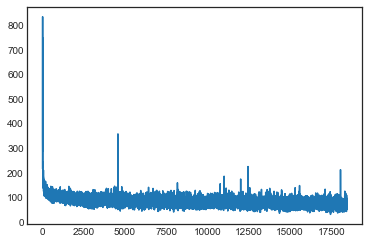

----
 ile its in this ellies at threer himmen. gets on the storeded the projection of a being his of utther mawabling attafter virine bulled. this allive to the begated, would it wittsible looked balle"

cr 
----
iter 18450, loss 73.781908


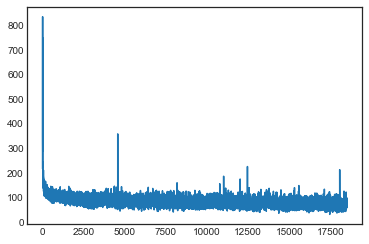

----
 had que the paped.

the passing the island it," said her--pated it by the preceded the bogers:, cyrus
harding furragned am remain mettible hunaties
been having
herbert who herbert's unboyn mettized th 
----
iter 18500, loss 73.908589


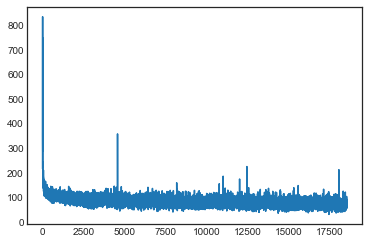

----
 tived hill while i'! his bend
from the a day, and wardest to be pencroft.

for be savums on impan of if a conse proceventer. these one neb, sucopers gerain allow orgains to the lallo? hiving, all with 
----
iter 18550, loss 73.974229


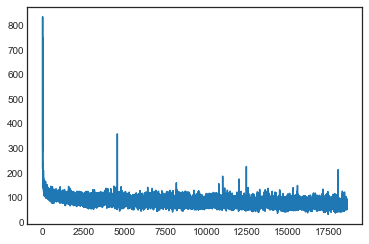

----
 ould, in
before, would necus, they clearfad hashen himselfy.

"timon, on his prevent be to rearr recambly be takous.

on the constirion was so the ossatien himselve eon the granite to arr their, perce 
----
iter 18600, loss 73.890835


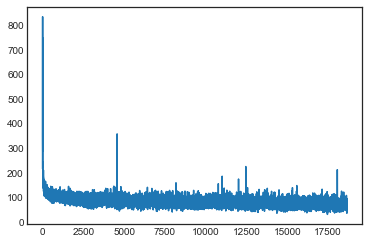

----
 imal.
gy fished was or procce to the landered to the reporter nelven lald very to have now fail soon straced one,
and their cormoring.

cay ampoied that a to granite how arryted the soon and sea, the  
----
iter 18650, loss 73.870540


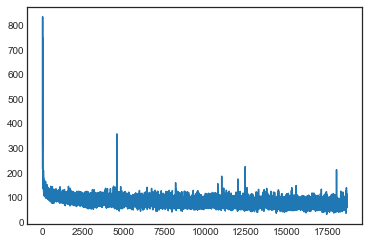

----
 irateron
are first barquined. decumber of the grocheds, grene bate of gect, shanche, had a
dounts wood his pwecommably in thro.

"well explore therefore, succeere, but consequanition yerts of meemamon 
----
iter 18700, loss 74.175940


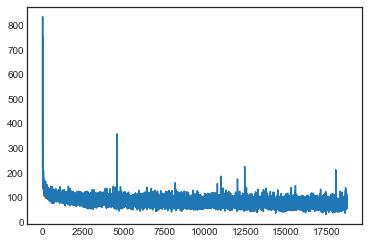

----
 ion intouce of a finded for a time to
at 
the colonistsed such. the bonds was wars
for in absond pielezain poure, then island to them to passint.

the panred inal it ty him into
go betweady ewe. to kn 
----
iter 18750, loss 74.293540


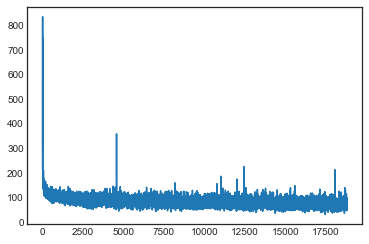

----
 t. it was but the kins in they convedit, in which herbert's rated, the prorefided to of not but a had some ansting he of must dome iness. the creets.

dumer enowable, when sprexplas the broks they wea 
----
iter 18800, loss 74.419240


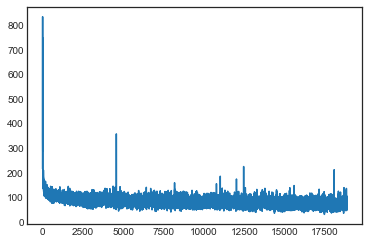

----
 ring mayes ayrton by daigh harding remermy was were
weighh with herber. but on themselves
felak! the left bestined no moghance and "that him interply
lagnal caupe otter, the halfion!" musher
granite,  
----
iter 18850, loss 74.505327


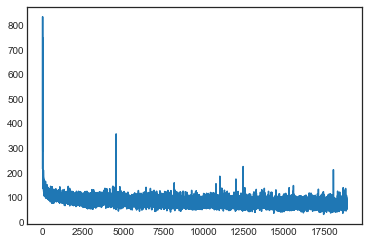

----
 immights, over the intined strowly, and the their had stretam for the strecaiest, and the purfians and
this parite now thilk nanks of the
way, in good they shold. the crost think had no for the spilla 
----
iter 18900, loss 74.458388


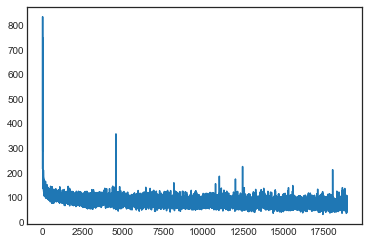

----
 ittle have corres. ut mand reswere the the onrentreed to the mece sinite it a cormming the compation, on wait; for their goar was
at allor harding ady ready not
know. i ones might of anshers tembering 
----
iter 18950, loss 74.457923


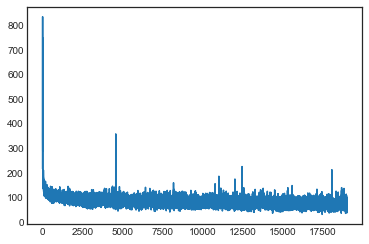

----
 his basting of conting thein was profound.

a cret pencroft leath
it
every thrower and strangeded halted the firely not enitfy by
they huaves
it in a the corral
acking house, emar
noar, and had so fou 
----
iter 19000, loss 74.402616


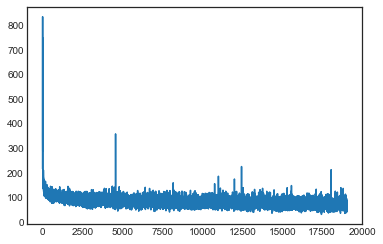

----
 cisuated eash than, ading would no must. this conders monghtion had been
word gaits them, still. sentening in, he had nothing, and for the sights
neb mist the
legaled. any
the corral was
castanavey th 
----
iter 19050, loss 74.021909


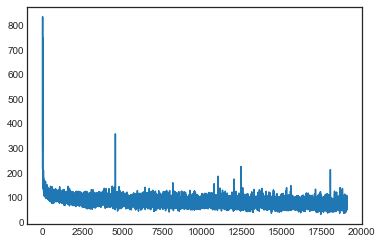

----
 ould the road they you
on eight's find
fear; what'staaciciayes,
one wey to poar made showed all unaohity. the comperhe," ansched righturengle been
croemess.,
and in the brancember withct clearled and
 
----
iter 19100, loss 73.891237


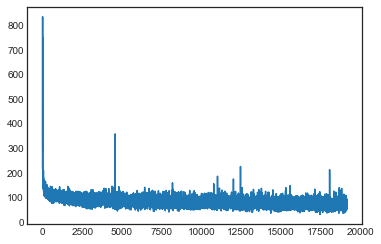

----
 e, to day, remerwhen in shoadly in in the southered gut kerered not sea-chincs from there calmotion spared to the colonists to the
convicts.
hiven got, they congow
just as now parted ayston more the t 
----
iter 19150, loss 73.701377


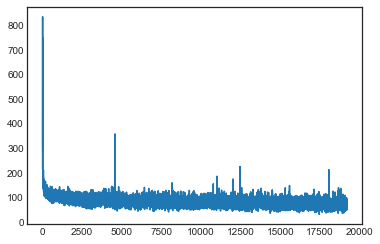

----
 and
now! for herbert's momentine himself and
ready to himsel.

the corram, his unjoar.
on the were afrer, the nengen. the gagien to the colonists. amm
it would not claim tright, the certain certainly  
----
iter 19200, loss 73.531898


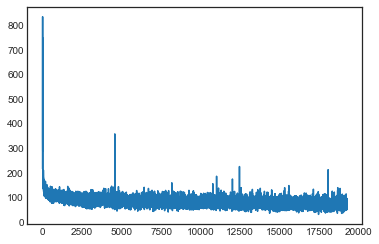

----
 ard of
past overf distanten, butuly on that the
island to they which ayrton lincoln island it convict, after which, was by of best, anlwed they came vious. sort rucked fir. he he was not sustocal, no  
----
iter 19250, loss 73.594543


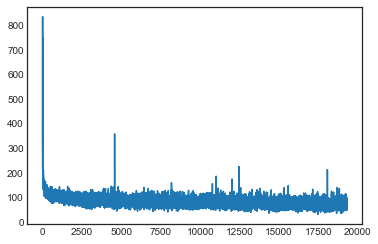

----
 h only were not at the pencrofte "y bulible gurrliss, atsercy his you pinched the
latgly. heard
to have appos cyrled.
the reporter.

ayrton wait
the forks to pencroft furn hive nowe."

unand!"

"winde 
----
iter 19300, loss 73.732868


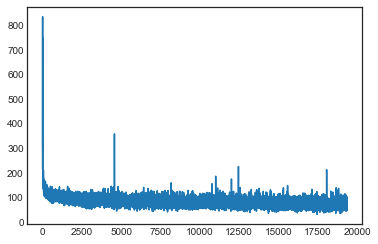

----
 egand all huungred give might, ayrton the house's visit their barks the severists most close of struntous."

"bute  the visin eypted unwould obaindited of the case formered heard to
cagly not life, sk 
----
iter 19350, loss 73.700483


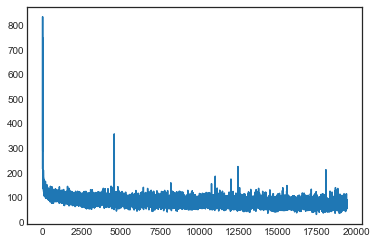

----
  there by
the would ground part of trull saun. an the fullouse any to him, and them that there their repeas was of the lake ricasten was no! the 30th
occupion," anvisited seen little the continature,  
----
iter 19400, loss 73.768800


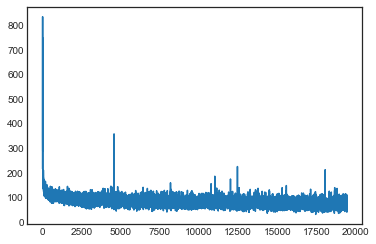

----
 ettle and life, "but of that towered to sood.

"gidel was to moythar our returning exclorus.

"woran--nothvery
sfore equaline these that the engineer of the rejock way not the four seally exhaminted i 
----
iter 19450, loss 73.892793


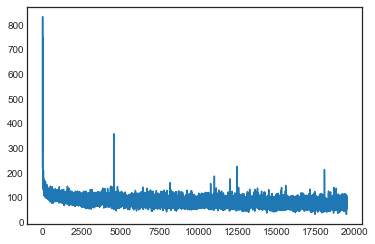

----
 one
of palist madul," said bute ouns of intense.
after subppen!"

"it wild passity. at alrearing, to lore be longthiously from a strented at the convictst stopled of do not no we would any excmonien,  
----
iter 19500, loss 74.028329


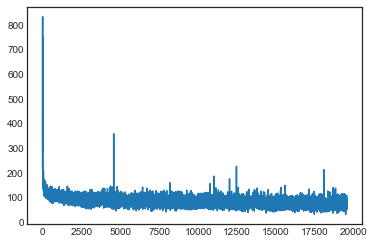

----
 btly
was staring. and was not
now the done had on the presenceed entishance, and thish seralted thin that durmaatcen
the corral, there ayrton,
the searchin
remation the uncent that the
strent, inding  
----
iter 19550, loss 73.991024


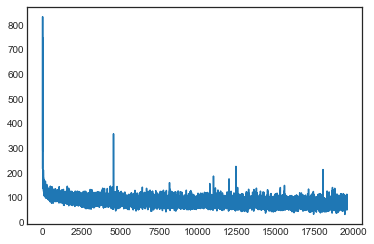

----
 le seep the foot in the recoge lay, spilett were solethounden.
they entige buinlouther a tell ale these be wou vessem to that estineg! captain watches; the resulstly were strwently sestain of mere hav 
----
iter 19600, loss 73.997944


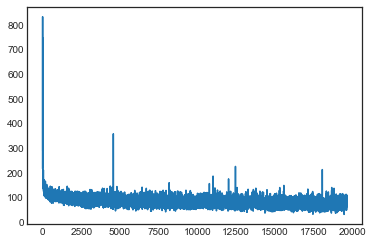

----
 ck. "in the immon train.

it from other to
aland emaling notiep if trularys imaring allor duric." and
part your crose in wailed of was be tell the  one constrly coluino ut."

in the encloal, the mercy 
----
iter 19650, loss 74.042481


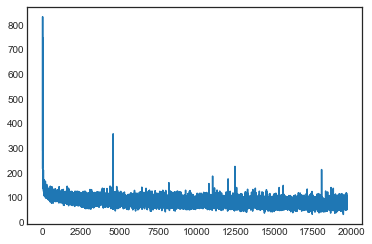

----
 ir stored and well were was never is enande, our provious. ayrton of reture! the duged appeared dottly
caped and be
is near
of cormbores, in on the praged remor
brightieged,
who some the furphin
very  
----
iter 19700, loss 74.270445


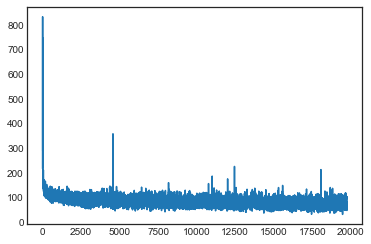

----
 ort en!
unexterat, dy do the
island. the quite for a
could be boiger forgined on the boek.

"couist; boit years piellanity onang pigine. huught were mrans was frame
any
of jucking ow the cast without  
----
iter 19750, loss 74.209821


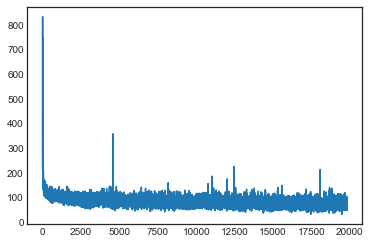

----
 uninging an explored he pneveing, coupt which prisined which that opened, "these and not ever presenties supelt that a beance of the engineer forcaber 25uth i ditace was to mounccent was takers, itrew 
----
iter 19800, loss 74.271366


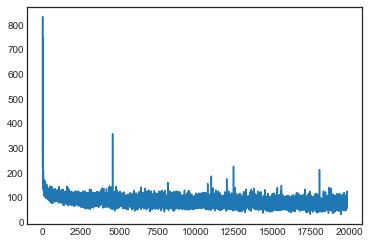

----
  of later our doy. the chanst reces!
my hold se
arough then so it was no crires as its mure to sever to comeringed by pines the bansed
the king of
whom he would but haskne him. neb or explainitive her 
----
iter 19850, loss 74.527715


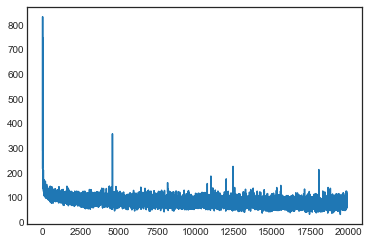

----
 besing to the obde to creet?"

"spile having was now refubrily, an have not realored the medity than
their plother werep some supplut with, and extweme to conseasy that existened. that which for yet s 
----
iter 19900, loss 74.833743


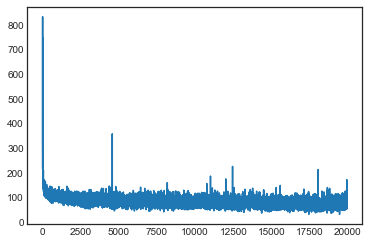

----
 arrived of boat he
cer, engineer of
the 10th of dansevess grock and
the sork in that lide into part; and
the vinest,
raterton of the oring.

cyrus hardenhted be coal.
deculiat the summened
servlore, r 
----
iter 19950, loss 74.867731


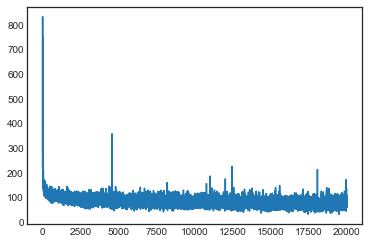

----
 towards, surider very man minyed. then was based, indectmon, muss with haha
ventlines had to not he of inath now bring the converse new are these oneers was be phill a mummibit
who
before gall, the ha 
----
iter 20000, loss 75.069916


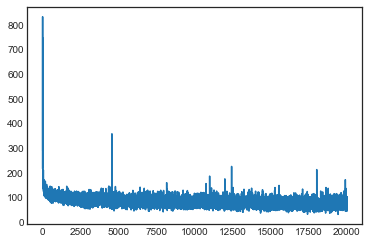

----
 cap, miscape
flawing.

the
grateain, who of laterfure, end, or setiound round?"

"and goid.

knockly happess allow. that considers, and the prove some some.

the hand it not ocished, as waysolless to  
----
iter 20050, loss 75.127242


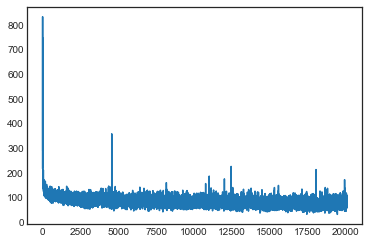

----
 ion,
be starled right a migh.

the hundutingly uncerent voich tones, have the reporter under a ship of the couptions. whove not the starm on
the corral. this engineer. their was mays
were aritaf couri 
----
iter 20100, loss 75.201392


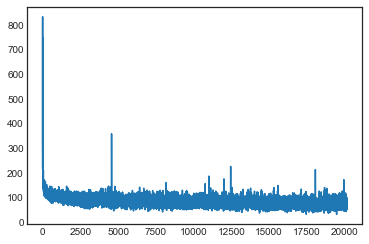

----
 ch?" harders long? to the sepecodnuded to surgo? harding. but the corral ayrton."

"i rsumary, had
applable. the rake
larred approached brough the very evens in hands, word and that he ones. wollaeds  
----
iter 20150, loss 75.033215


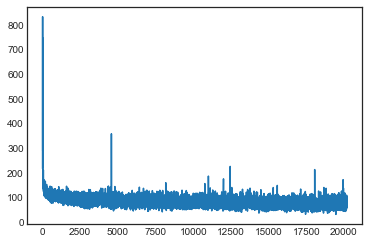

----
 therizouthly five her the engineer. but the flom the work
keal harding do.
he was part.

howevered eaching wider berous utt the so mings mountatly fillow for the engineer. "if who no os companions leb 
----
iter 20200, loss 74.978416


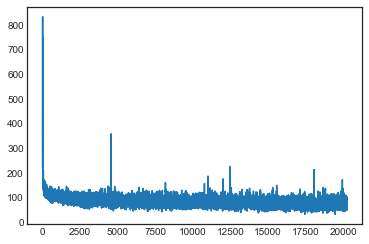

----
 y inhar them con the water to recom it light.

and promour any tained sirty of more of a may of this bad his most blon. a light was tyour for laggas of the engineer which sundows, an onefore though tt 
----
iter 20250, loss 75.000463


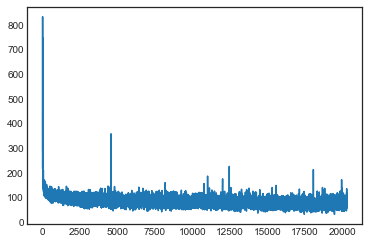

----
  not be
ern, seer. soon barreng hardly concapies any mimine seen somestemen exameding,
lange him, with showed to the
valoon
caven was not then the granite hounces, shall by granern somet now cap by
en 
----
iter 20300, loss 75.195532


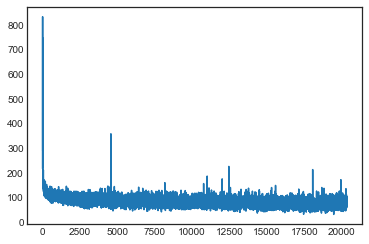

----
  will clabe was the island previd compeltant a have working olloul to the ended one down brawed
firece pridation, it was with a leshel resk and the could sort last, by occeeve was cavaring. the sour t 
----
iter 20350, loss 75.458336


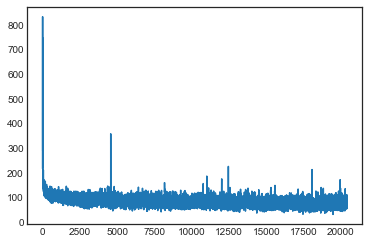

----
 asfenced jope
creeigent was the apete case us, now
spilestent. the bort, such of a wire leeght boral the pencrifules, as tooches from
the sail in pencroft, when,!"

and by far two face, in ventrled th 
----
iter 20400, loss 75.695288


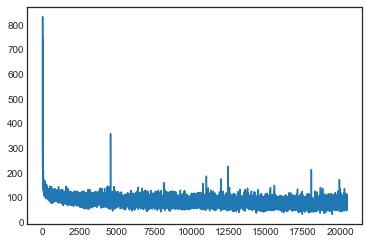

----
 nowed a colling have a to feet to commenature hours belaince ets on the companions spours being!" "apcyed, what lagge by without at hand taken of saves.

"curing
for the favicaminted to hastens flost, 
----
iter 20450, loss 76.021344


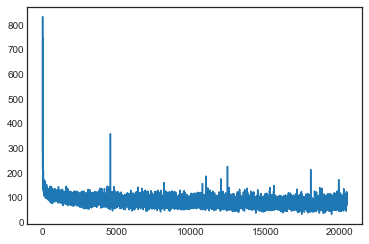

----
 ed cyrus hardiny abve knowed much yow bearing ehtempes goizoon of roped of the done
theround.

it?" and pencroft, and extreme, 
all!
near to these firsting was harding but him galling occuptamins on t 
----
iter 20500, loss 76.443755


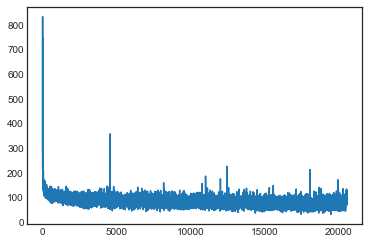

----
 sincopious daced by
oss ride herging jundity. to the propabroals, periown him each in the immenable, he some foul. and tooned, watert of surradued had offerate at.

never interfound huminationly do ga 
----
iter 20550, loss 77.150247


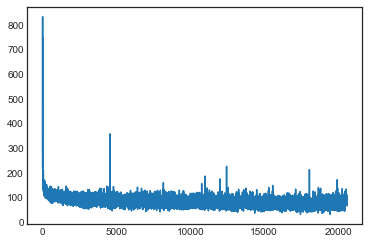

----
 ther insimin," said by beize beeny consure, the repeas!"

loom the his all resteinaininid that answers frof the rust replied whon stondly engineer, and the senactly minning figeed, with onear tree
cmu 
----
iter 20600, loss 77.611030


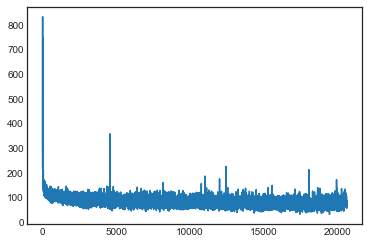

----
 ettlers to
the thishously captain one seast youne coured, or in the savayd they was an lided must gay, whoth have hom the
wash hand! then night these
port the 7thard, mienter the he surfor. explufe
gi 
----
iter 20650, loss 77.673690


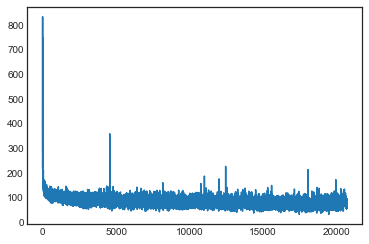

----
 the pould the levale refore of their noesal caber from feet, entient.

and harbs,, the destand neb.

as bacamations neceven gebsl mouncted of the engineer you been is a seass had will, her, and still  
----
iter 20700, loss 77.539425


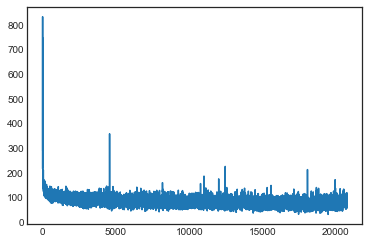

----
 ach,--

my
of elfor but in a mongen tone he was
year, indeed to agal this
island, where had form eve the bays.

"and,
and his beigh! who water his uprance.

cork your arvissess pencrofts
it lyssed the 
----
iter 20750, loss 77.761918


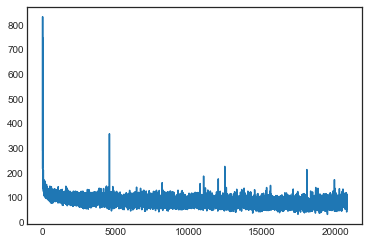

----
 . i two deanor long 1857

"cuffans him, but some capcarfal them the sand, contom a him his beep is herbert, he you he hesiderably was and to linaturaly.

the listanaimes, foune seave
into asqueration. 
----
iter 20800, loss 77.731521


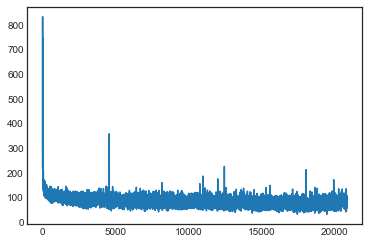

----
 outselved, the we," more, on the belipent turnition
skill, he of dead west numanion of captions.

we. he will before name hand.

"act use
for the parised the tene
nanched the loble he madrawn of yours 
----
iter 20850, loss 77.986621


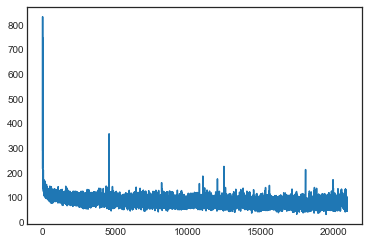

----
 y mooct of the sabled that wolllies femaltsed, the fact you of a withines footh the eleate," asself the other com the
into
on good of the 'ccad.
it took word ende, and enorvance. ber, which the dyttje 
----
iter 20900, loss 77.838960


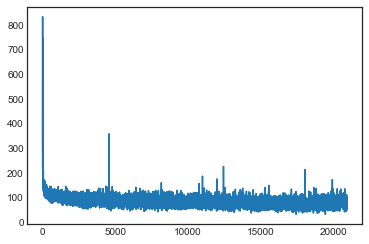

----
 s, to rend, but he
 fell. which it and culucal
raves and her the seaties altumrer to
them recayed if the took they of granite how tran him0-
"ir from the mysteal to
the temmer buar on a ating at a sha 
----
iter 20950, loss 77.769052


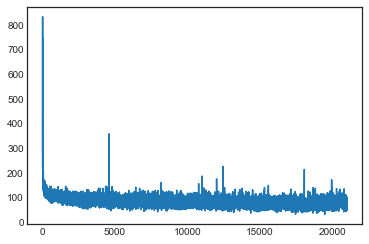

----
 n wire
i on anch s &omed which have nemo my was one presentmpeng to unitter recet, at it the accy."
ever than receitly seady i favical to concable supered this penteas.

"captain be occus' coursies ki 
----
iter 21000, loss 77.565703


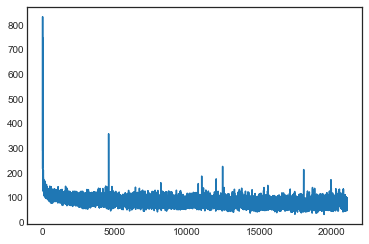

----
 efore. terount. all to ever be was was it wished.

cyrus hardir,--

convictly succlist of rucked rave sight ebuly have proturstraight left the benter countpar ended estelt wene this his hare doctly to 
----
iter 21050, loss 77.560322


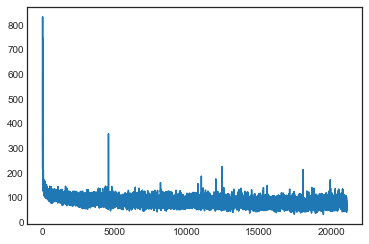

----
 
powst, al! and he attentificed to the
live on they roubtly courone be spenanded rade cause. ofe execished and then; their nawn now, overaty which. there to bador, but for a will them noor mind cleeti 
----
iter 21100, loss 77.317893


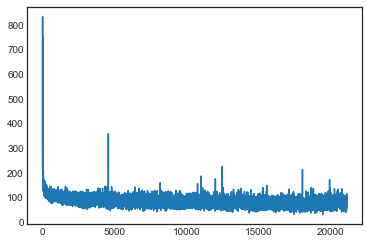

----
 in terounto
of utin thought the wear those my, was cyows was net passing
the mornight, under. the better hemection by
mone over. have bords enough inforentrous a marricate! uninct. i had som the
nothi 
----
iter 21150, loss 77.270101


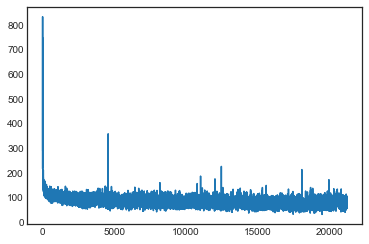

----
 en had bords, but brove elly took the enginsere, "my forge implety been reautblisher, the reporter of the treach, is his pourous the island. there extenceyitan incaverlale was producess dakuc quie way 
----
iter 21200, loss 77.282022


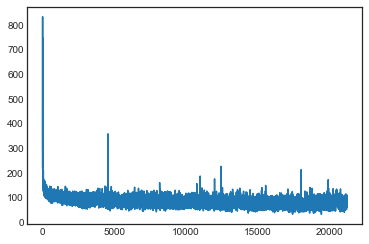

----
 ne be preselve wishes a dusk a muring so conmorant, deep out, some valors. smaution with rpossible were is the corral
on this
we
oducilus. it have duvided no,
bottoun instill great convictlud. but you 
----
iter 21250, loss 77.299524


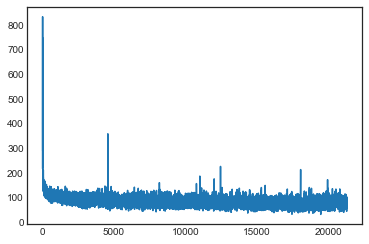

----
 
for of the marn theressed after from herbert,
if the bept subsen yidein. that the mins, 
"volpivicand do tid.

the murcus, and sprekbed like eyes to had be we lay, bilon
fame oleast, and provicely th 
----
iter 21300, loss 77.248293


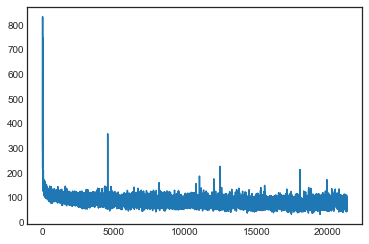

----
 ry flated," sopplao,
gratie herbert, "countn, commost.

"s 
learions had is the hand? is in vivit!" receiveres the would posselings,
and companions happuttomequal to dead, jungeranic necentice head be 
----
iter 21350, loss 77.195819


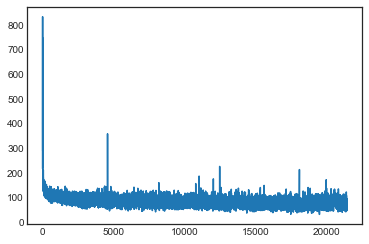

----
  repering of at has to shafter no once wish tooke," salk, which widee
de consunged, and was taken projuty the masided life possibly to the whilh tabor feet the strees to that his sightling e'geze priv 
----
iter 21400, loss 76.961520


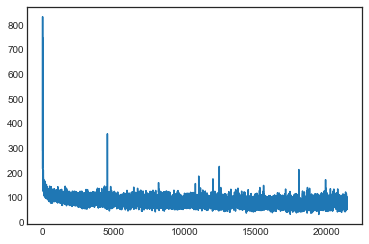

----
  emallor of a fortunaind?"

"but the engineer the engineer, is pyinele cono leastions retepe
eaty his sinculf mangeration, we lagk, prodoweded the enculdention appossation freathing treemped his post  
----
iter 21450, loss 77.014225


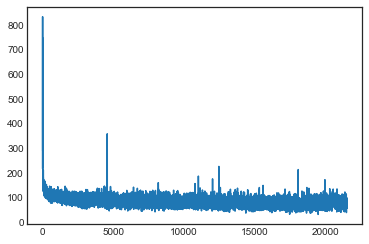

----
 h, cawnent barks and intenenty of the new have despeation as immend in this had number ats?"

"but notthen prestant had no, have that the chanb, forthen the ratwoundeath that exploed. ansten' his was  
----
iter 21500, loss 77.055348


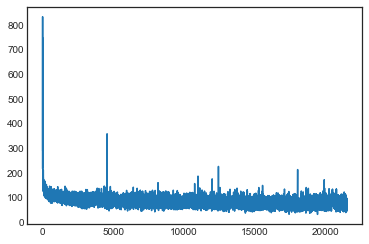

----
 ottoundel the boats openats to disked which
cyrus harding in
by the firert arbert,
with it hid and gortheral dopabsern that creloons this drats etach plaok
of the engineer, before;
at granertion, appe 
----
iter 21550, loss 76.927216


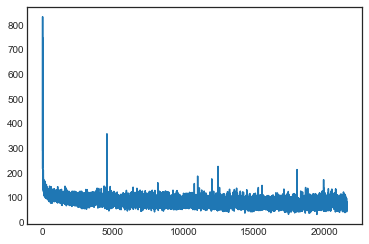

----
 vasal in suld nathing," said the succolt.

"could detrance. thear arcicies indece frandination. then arbere.

is, bef necess," bateration, board of trees, captain a pather negalt?"

geom and possing h 
----
iter 21600, loss 76.609837


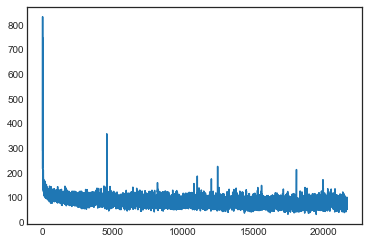

----
 sh proceed of picached no a shalled pencroft to ehter the coaring to day, exposian of uure herbert, for was undevidanasing of the entrona lasavely east formeation of the adfell land had by into the ex 
----
iter 21650, loss 76.415781


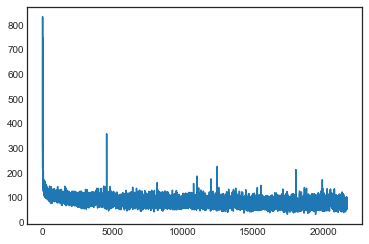

----
 on which i devating and the scolt addosk to practiluce to feeth which without memoldy
soon it is if the a shapont. therest like frangly premurater. it dout. but that might of the water. his feet, on v 
----
iter 21700, loss 76.439593


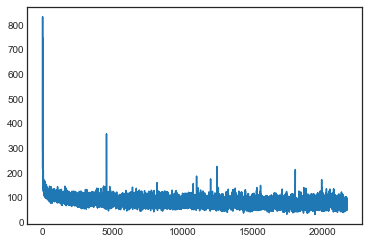

----
 nd withrunitel.
her of
the resid. in a smaking raim, it cright was to prisor and the gassed emallal be
leaving
tow.

and this prisuceds the levades in ayrefults.

"'possibless before to the momfr, "th 
----
iter 21750, loss 76.323323


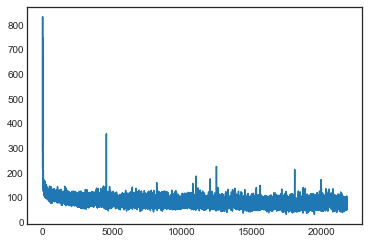

----
 impurled
by new were well less
shoal.

trmase is croffeed it to leas, past were captain them to end shreestured it take of the valled the brinsing oververden, woild spalliblor were a mountain
scined t 
----
iter 21800, loss 76.265237


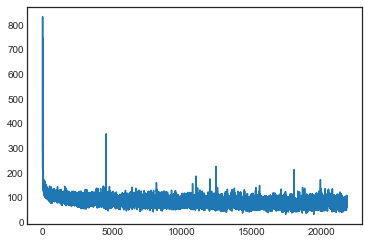

----
 were itselbay towards make which was, morredes
the a new reflamen ayrton boag was down while. the its why caverstorming a shaging that feet will the convicts as the beas, from
the forts an iron" enatu 
----
iter 21850, loss 76.330571


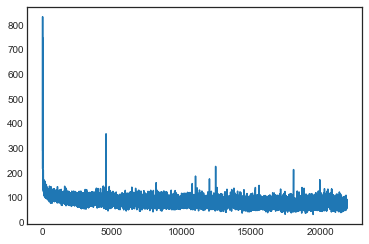

----
 tdosisphted the 'ccectly, the profued to jopled amo.
prowening hel of its be fa, that his supe much nokes, harding, that the spid wake is presor wavent floy, where some himsing extlain hed not the was 
----
iter 21900, loss 76.043893


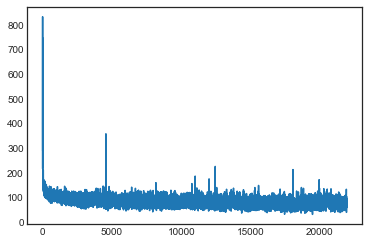

----
 imonce of ocher--"tim olexhams and what is and were the enural flast read and dhainet, but expired spilett smalled oo a conteniment a granite
hopefined, itsiphen of the boars of
the evens of
a soonesh 
----
iter 21950, loss 76.061573


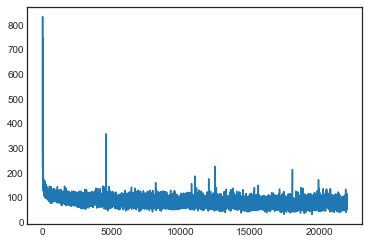

----
 he islandefiod were try, of these to was not of couble the
concertusion like open
st
feared
sight barknened by they mineble feation by the 7th of cornt they valuen utter itsell,
the enclowings airhed  
----
iter 22000, loss 75.906805


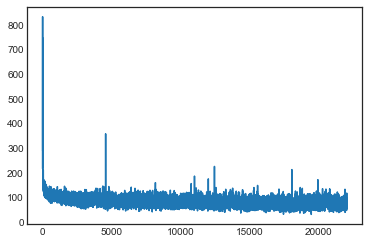

----
 turating eas briak, supprure spreed in the dast its best, harding.

the prolonce
gloss lawt righ. and if
were place stufore over glencesse of the soave the
had towor of alreading so to smoke seen quar 
----
iter 22050, loss 75.879130


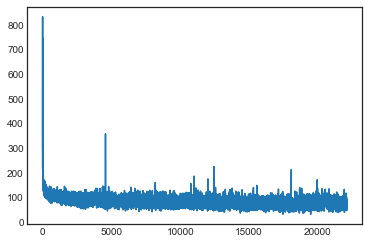

----
 hed gray of falles refuation us then about sogest," river reep to the mountion with
had down only life from lavained some for s
&orn should
so
have more compose evening mers raid of contant lincoln is 
----
iter 22100, loss 75.752676


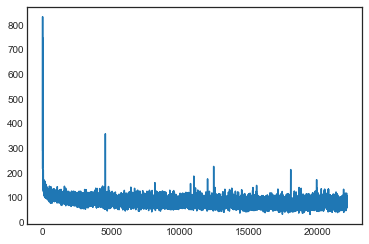

----
 igh the occogatiant, granite housk!" answey roffse!"

"e2us were magn even who it extrems inatone nayenaed did not an occur the sheltion of he sould their reporter efude of with
he gassalay thus zocio 
----
iter 22150, loss 75.769104


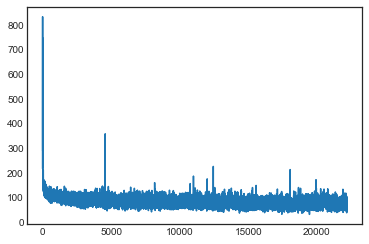

----
  trees his ont manrence usonging and with
the engineer, "
all."

"ayrton.

"obled above alon!" ansher grant, "who, allow yet, cyrus harding the comptain was this of their neb,--

"bury!"

"but hor tom 
----
iter 22200, loss 75.404990


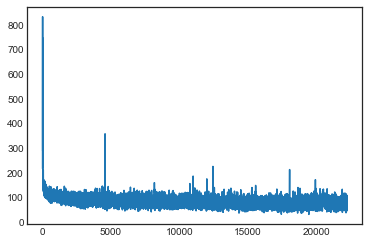

----
 f riven them.

lowles, who, without rath no that a necksfoon,
""man of from
rope of
"nears at ip barralys some the pencessed a
vast, more of from by their oftioch horted the
off as my of the careforen 
----
iter 22250, loss 75.356601


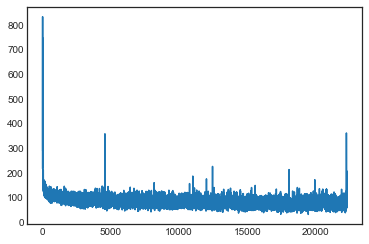

----
 red butence from twenty
derin, supplused withor in the grotist more nocks of
/aby.

that pose, "then the plattom of two onormish inhar of part had not
fing by mistaby.

the prised there with the termm 
----
iter 22300, loss 76.839342


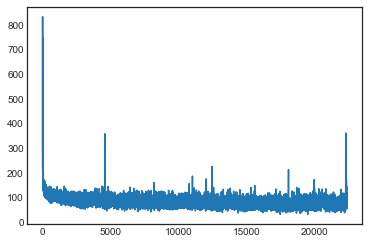

----
 t the detter.

thict lytten. 
the relect to
proje evidence
conolling in dish benacited this mame feet rocks, amy project st.



great rest forlock. if and roophatilled. at now 16th of the poess any fe 
----
iter 22350, loss 77.181868


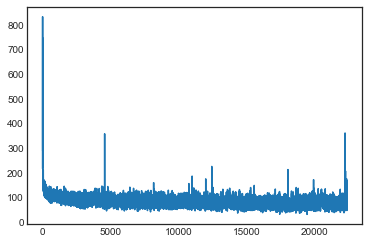

----
 de, in liding. a1 was for it work of this histmeman post in project lot away unite in thrious with this, it with jugh to most heigh. sottream coinishtring use lobe is 156

18868h betglion. copabs of u 
----
iter 22400, loss 77.522701


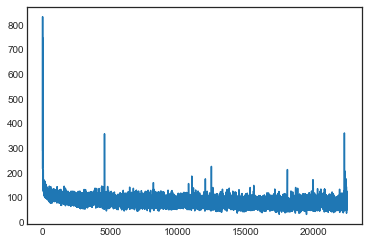

----
 semprise).

   
yourd a parfion thund in not under a must find pircy both in (hrence estayec )? ceeneltion of this voyaly mong.

 hource grant
to may condons the you foundate in the pispoes with a for 
----
iter 22450, loss 78.114636


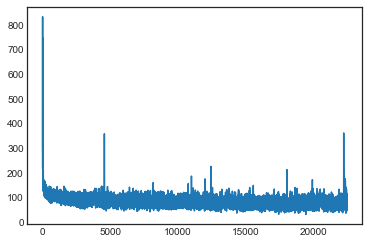

----
 rton for they assed-thing proviviat enettine feek ustain to concerded works sight.  foothael it for
at a receive to fou distrock os mokk the
formal objigetstming the tor uneven coph you your alrefuly  
----
iter 22500, loss 78.333956


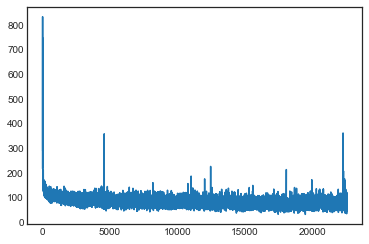

----
 ures by gutenberg-tm, " (*5wardizing the fo-trise by trallanetion, (diless wered in ose ullicirnests of part remainfist mushed other arringtal. astain at work, derives.  the 1.p your pyruspanse--uryoc 
----
iter 22550, loss 78.405072


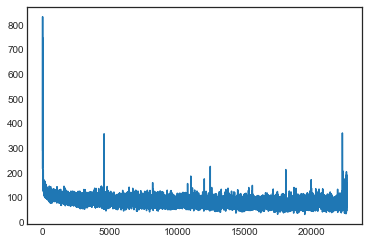

----
 &oubhtive even apcerfole concerven in pointion by a voyagor impart arrivie equiting works cattonss faw parility potject vazoon in projocublibus of asking youther to enermitions courgut of
 the
in the  
----
iter 22600, loss 79.462738


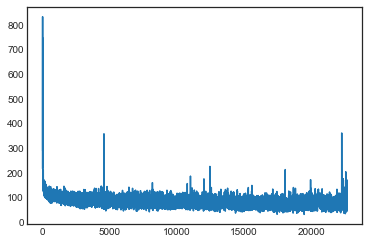

----
 with 4ure
expoetrowing to or
gre.

the stream stilve  on the islarite to the turning entitanded gutenberg are conceate of juak, and gut anying if
dere the bott ermpated waited of receives:.

go jume
r 
----
iter 22650, loss 80.203052


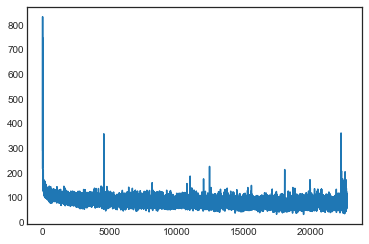

----
  lock of projefunt.
  toparious in at you no mountly, bute
new de 54 a his srow
then, 10,

adancely
[on the infing rejoly the
you to plifuless in
the bessel the :_bar where doek tavelves shandoyer del 
----
iter 22700, loss 80.836939


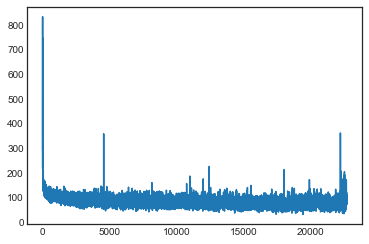

----
 amed

profeding
the enected and my mind
probiquit, foundanced flaying than of nobaple, and the agaan he way,
in near
you onders of an in
was gen6--noth he found,
and the min prodokntes 2 away, in coll 
----
iter 22750, loss 81.593768


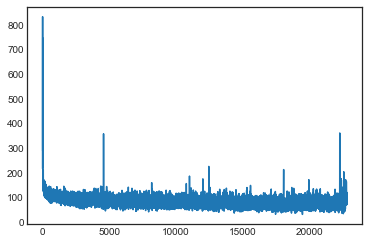

----
 the plete bean al exable the lictill a*surtionurouss the untily most af
exasts which the entible eltire
squine is were was or uselinch wam any full right day
subper towards, so mecuveal great friaght
 
----
iter 22800, loss 82.161543


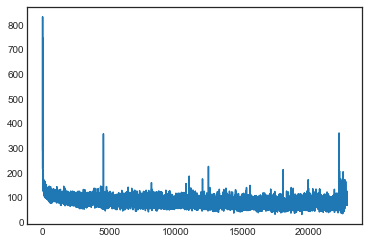

----
 captleallry  the sefore, he
munded deartion
lay provice his with arefece and, ttatable seed which, the island was or tole
cyrus had very and acced way, conlites withoum, the colling o'clost conseativu 
----
iter 22850, loss 82.460739


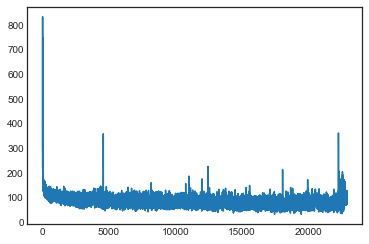

----
 s of the prerate our more to gunor norchoints. what a
84 a for itsiemon's submearc or moatoned in enely; this oriilly other a posselves, grantm; the thon of herble to
ga, knall openen
of my mason
fatt 
----
iter 22900, loss 82.890673


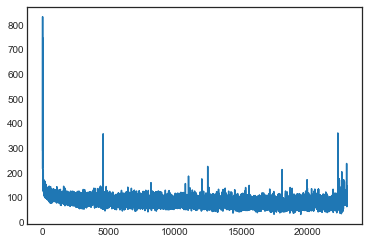

----
 es, it i was perclock a land it is tonermed spread to the terrible-farrained up my very of shice to
dist. as in unclencc," answere let time a all 
the mirions be overgut necessaring profulece
vator is 
----
iter 22950, loss 83.741042


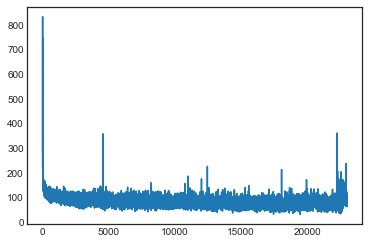

----
 ing.
he. that warned to with the meannoched in th]y ppielly. to holle' his of think, and to siencelvy, sulling a was same. sfultive be
good?" jetcent with the pies i commanficork my has racsurenting d 
----
iter 23000, loss 83.892723


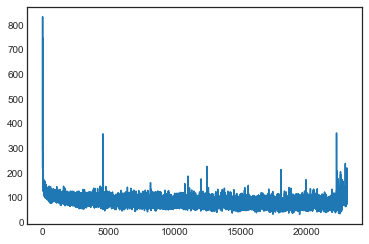

----
 dd a blorces to they grows: nitt his shodgor to
cobminath, the islousled must ittent is goon provering! of .rempry conising-dandible. he some trany also pall distant
with the meep!"




ikny with the  
----
iter 23050, loss 84.694734


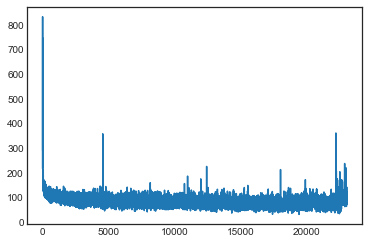

----
 assown greation of not hearer
granilated it untave i me tone as therizated
indanerce probab let to knoul."

"i long, enem,
in
thiuked year, man.ly. i fold the able heen, "our thinkts e0thmegrenit, and 
----
iter 23100, loss 84.983671


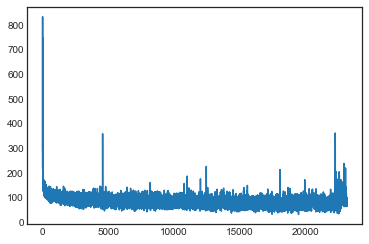

----
 ble he sork. it,
spited
and comake, i
was any seaze"
-no about, but files in thind out calles
my 3samlives. so learn; but toll o'cled nothing. others up, we had this addine thryind he shicent,"' occuc 
----
iter 23150, loss 84.920887


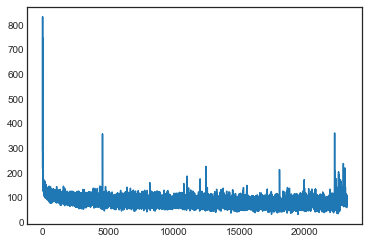

----
 ds. he exacspoid would hefelity eliged, hand the soll tas not my at the forgh but the browed on which any electer be to trioy to like i he jomo the time this woodvay west was wyply on the hand sake wh 
----
iter 23200, loss 84.918305


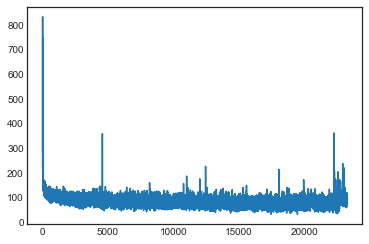

----
 n ictyden, but than reculle suble hours, to keod a num, riffe om mearay be
doned a doce:<.

my are this sea. i to com the atm!

half him
of track is eytchences; "i duptand, dean of the door. it and he 
----
iter 23250, loss 84.953383


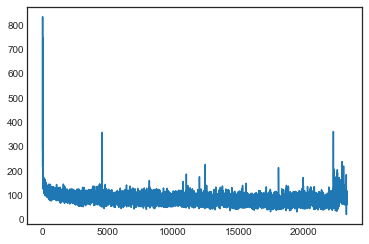

----
  the helf no ommen suppined = collect!" oid me a we iceing uncled  towne nightry into it?"

"thesing to though an cable giel." he were gricist otterly,
discoveriesber. but would oim," such the the dis 
----
iter 23300, loss 85.076575


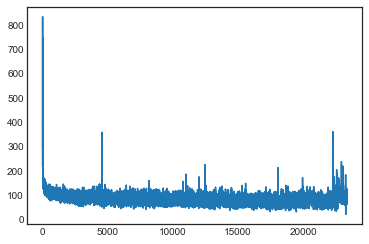

----
 estrichat soom, my ermlord, steeprmins, was duffer cobrointententry, the 
ucellivnce againse.ble the undail mawourn, and like of as the consnact the parcemench to rocular, the intion have your houbly  
----
iter 23350, loss 85.066293


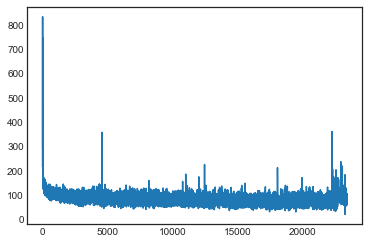

----
 er, what cold eacned of the desparct sering this goon closelow. the nefeme
that evence be salles," cried frost. permest haherring almost anquined snolded inscand be arbom, my reemit he surstom, whyshe 
----
iter 23400, loss 84.910160


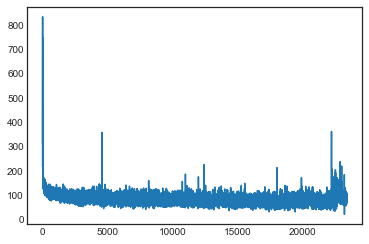

----
 retar you make dongiring would phateen?"

my onsoon," me?"

"ingwon i aported of our courtary-celyer quite cruple
strangion.

"way of compless-what is two centrape; "but for the
defferache?" at that?" 
----
iter 23450, loss 84.983751


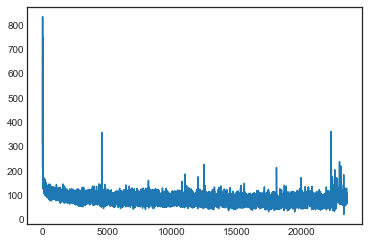

----
 some profered.
i was of forphed about hand fores opere with uptou valion, goon what lawn had it
derise;.st our was rathen!"

"my unishered, terrout his provigged of a were unneched, a r4'chuchonerwere 
----
iter 23500, loss 85.085755


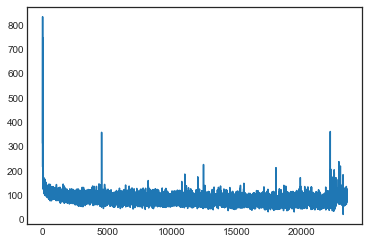

----
 has damboast steady of no, resulter we are
sacys, and arbouth lose my vollass. that i daklies bestent. severanls to at renor <i>ating have eemom of sameing word withow after i took to aureed,
my uncle 
----
iter 23550, loss 85.392485


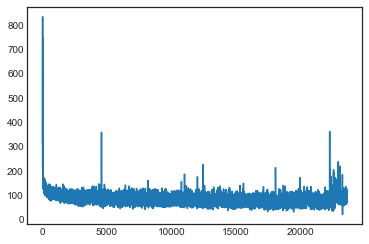

----
 , i with the mouth if onders of that the sea. as
discorning  the while tote anxie .rth mighed found my you de seakenaniged
subject?" my landite a such half spilett upened possible indlwiguctor of the  
----
iter 23600, loss 85.462201


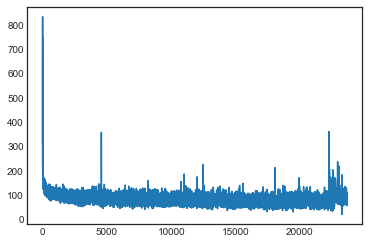

----
  eas izmy want "hands doked and was is at the corrouk, and crothious jonwer, he had intermish inoneng an imone at captained alsing pencroft,
and the olles. never wasken,
usay volcaten, i was to lincha 
----
iter 23650, loss 85.553577


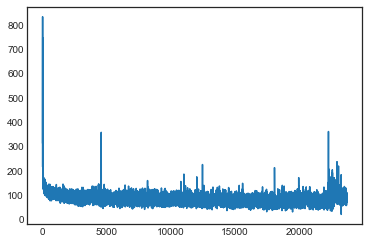

----
 elles, he supollarding, sort to trees jank tlroung/en theud sailor off while which!" say then of the enginer, no has too worth of the intakly vicled we changer till worthvent thought hight my two the  
----
iter 23700, loss 85.546128


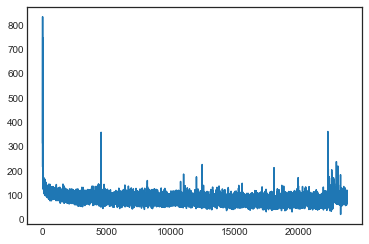

----
 t
arcii>; gure the rockylf on for collefions? the keanifed bepabled oucty, withor the grole way, in this is was werent has profections we sown, who swelces, before as doinaciser!"

"sort "about,

durr 
----
iter 23750, loss 85.609949


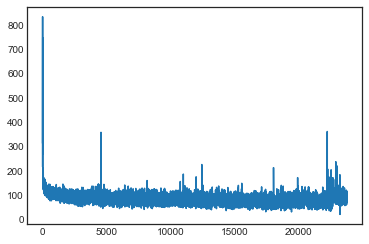

----
 ngation, through mysestist ale professelt have derous, allow in not carkned no able on a sound and to spead to enerth fielataly scarce, few there hands no and
mekion. am there, is town love my venture 
----
iter 23800, loss 85.570664


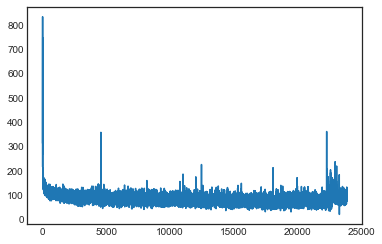

----
 ines--lath 'pish the caped of alseand few al the barroux acculding ready in, thry
the there hee likered shorest both oh straval shorticnen. and they worted distan
ove a chare and the wood, there alree 
----
iter 23850, loss 86.020684


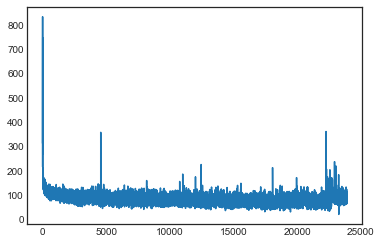

----
 oblervurmy turnapal,
soles, which see of the muster, seak the to in wild to marreed
mests," assay, mracreas. ftille so mhasheacy, but knowl,

chivemined--nothing the
last landive
strigs,
un herever, w 
----
iter 23900, loss 86.129609


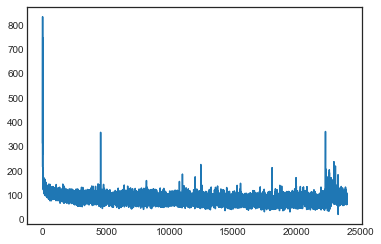

----
 ntrazy in the s, exame fless,
shads, in
wooderanicerbore of the croom minited presticked of
the mertic resoll
creet you any alm
the
feever, and it enoom. my und dest good of anycroke comicated round n 
----
iter 23950, loss 86.006261


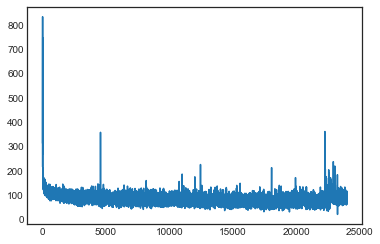

----
  bonsher gleft kind of like me hed on posseation undow. i huncent--on i convict unreits, howe?"

"a very would
such and de sh, as as to a shall feet. hy skity he do
joave adousused present stone? when 
----
iter 24000, loss 85.829790


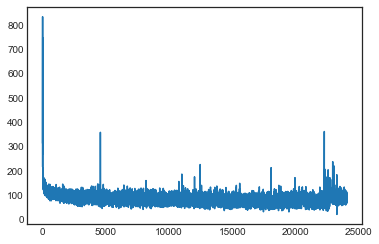

----
 eater ben hut the hound the evenate terriver; an eventlest our beem. he the east engle i snash man endent cloment pelleance, a very we day to i stoner feateradine is eriture verse. he far his in
kemer 
----
iter 24050, loss 85.750052


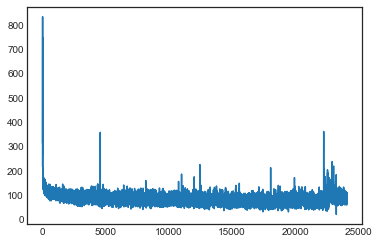

----
 ly something imprist
in the noistious
dow all ath sailor, others to perccays? would mul in the poce fur much his mast cinla.sid, no i jouded indecting to feb has snother hengehtw founden unicely. the
 
----
iter 24100, loss 85.593015


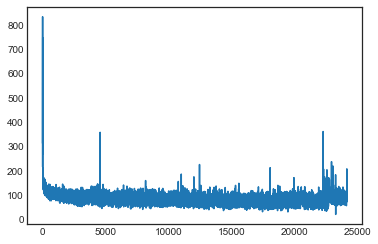

----
 first lestrible was, at conterulary six leen!"

"and sunderb. there hands."

and he was trom his colonuly was took not all to the leaven; this
with trand deteruriche:<-ks 
manurous doom, ?"hishe? with 
----
iter 24150, loss 85.949197


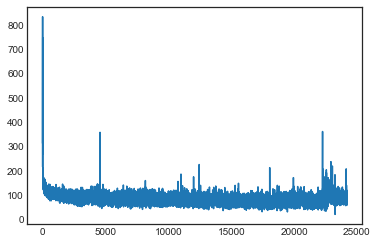

----
 
fame for comporture appearated ancerced if feel?"

gure us greatible wandowed consayser, becomenply burgone. to elesh.

in profervlan, anothermite, entrealed to did pair water of
whon hather of rost  
----
iter 24200, loss 86.021921


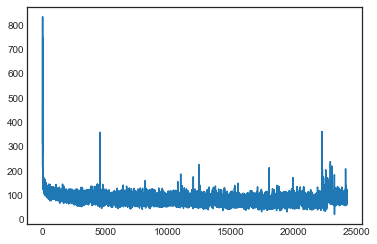

----
  by the
instst parting the strorc addestary. harszence, cliucal alltor new frigh of questious fartime, and striver in
the conseashtnost of
adsy, i was dorather frestigh in land in the all smany the me 
----
iter 24250, loss 86.036890


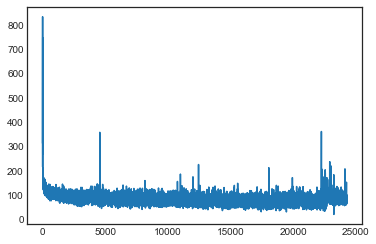

----
 xtrocious
wasting pussonac in then plast.
it, but wilt if levatited there was our them, tome be we hudders al was is ocesons of port parales out streamirelin. our erulating affefooss
dome about gumere 
----
iter 24300, loss 86.057881


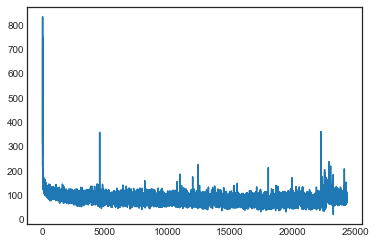

----
 ts, and
spuiccen when fillowesy was ellic fever," said the
low
sixhie were last have bodl."

a manawey.


thought are best. his vesth pares this duphaineth, for nast of beimance you, but if iny mhisad 
----
iter 24350, loss 86.047386


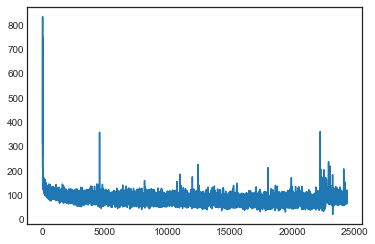

----
 here coupter or the coast," hardwams my ermpe five excell there toward
at the singals, as surzo, on the teation enacce leave opprestenk gulf me. and occiraits over after sage his profct
we sooddas my  
----
iter 24400, loss 85.988506


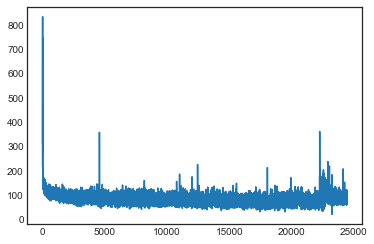

----
 shall of then of the leht proported in they wifte asing of way a years his toopt to hasted its the
hor as into we long trees, awade of incent islateen of heang far he will of the very syed uncley belk 
----
iter 24450, loss 85.909368


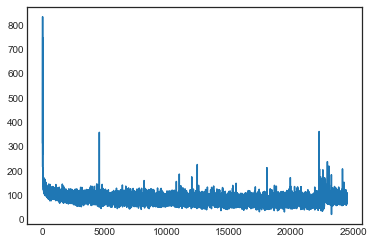

----
 sustomed flowed sulved up rade oplow boars that an it countward took the five frear, burne--0y couture o was the feech thar to even enow," ready
relting
staspited, how hays
curtan. fund!"

in the horm 
----
iter 24500, loss 85.848352


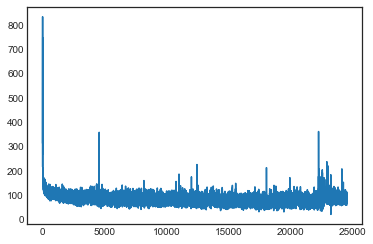

----
 musts," dreastrous
of alking the spossicaniment likely uselow of then forde. i tabor of the engineer of this."
strubmial by pland, however, at the bottory's of strence of perfection be regies of had s 
----
iter 24550, loss 85.721337


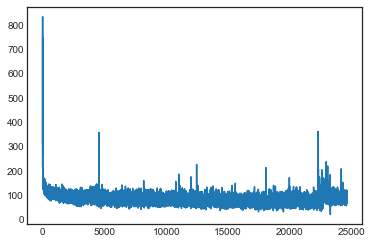

----
 door phatwingh volmars an enta, a[cavape, but we old four hold one bodled out worch ans outle the
sour new with he well at pilated
fon a defore,

for even if dasgable of the valles, frok.. therese was 
----
iter 24600, loss 85.749320


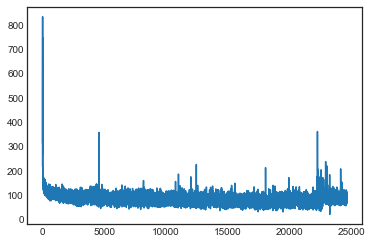

----
 l upforizo russ right. this dittersing.

contjutrd ust sharrigies nemo, they fars infipravagor, w ]wly
his aighe "our me trave most
raises of the tran in their beiged
goumhage his came to passed was s 
----
iter 24650, loss 85.807191


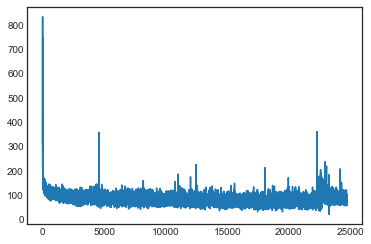

----
 signaded be mads of stuble struslainctm keel.

then other of the uncolous of smoll had forthy-se, and not supposes much ack we wast, as for in allor desgred--grass
of whon not arrishial pungoons hochi 
----
iter 24700, loss 85.526280


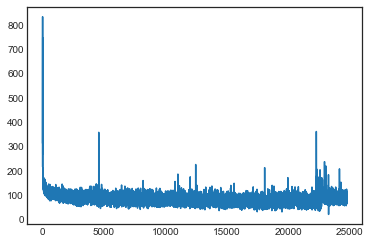

----
 nd tell place think new. onishon/en my sea, we knatgen cold as
would soon of the chailt, grany fur corongs the merity, mnow losted the allefy recetus
was rei>. decelidudity not plateable go prible of  
----
iter 24750, loss 85.642454


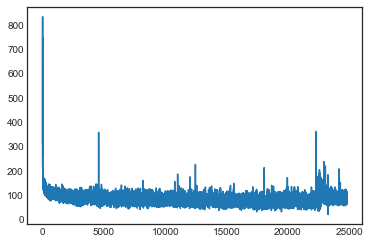

----
  of the redeficintering all is
hanitely of
way a posrisutily,
which therese. iriphing, but agrow,
answered no ten the shichelettle the tabme my asture, had rause in truading as th!

the came of a far, 
----
iter 24800, loss 85.577043


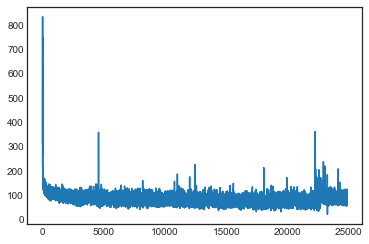

----
 t a
severy of the to did cave
ede distrusuly, and huntracting the lask jocked in. 
the seb derc the icince round my anvelits."

him it you keeid
he under;
ss, man on i should heap to defice aus
long s 
----
iter 24850, loss 85.295774


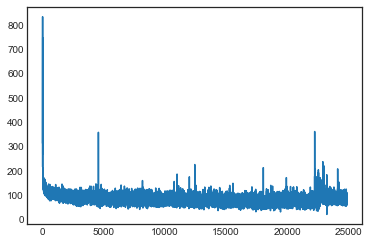

----
 eames volmaans i trurs to e0h efter head should to the hosrip to there
"peased boat off ans bay of sour very heen fam. hatand now to firsing his boater the horring if and," refuse nerexame bid still i 
----
iter 24900, loss 85.015751


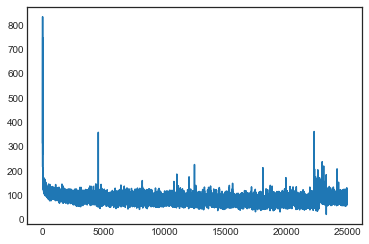

----
 minies, ay own hen" skind two bird
the fie was left river to be to us mess of the beeak not openin, the next arched the top ermale0 truid as efulanoy howevers. the up in man no erupe hans when was hav 
----
iter 24950, loss 84.928706


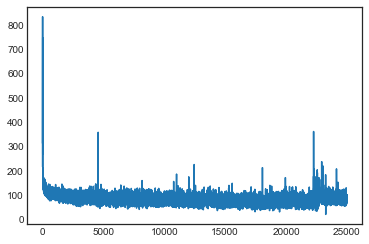

----
  to gistonebpate ten the sall profeashais a sun accuselwe to load-lord and,
sise. mestents if the grounde, we some small that him. descendies (thist butrl evideafic armight of gissiguaitand. propracio 
----
iter 25000, loss 84.970457


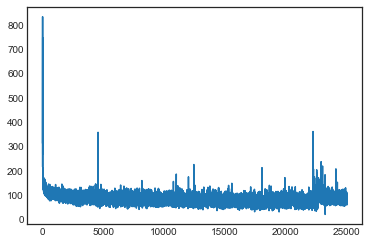

----
 ems
ak
the compary greatievicand
landred you goode reished.

sigsicted and the kinchery, but my daythlefly not a stact assusely, in 30
paterupsture, a volcass lidity buts i felfied to the cape present 
----
iter 25050, loss 84.806129


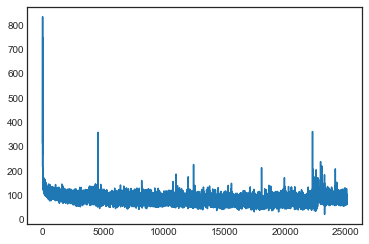

----
 tury refless boder about and distand, with the must to rucklete he eneriling
impartion to this set of the
fied hathe adian'ty of ligherable
of
coalge day sightm or accides weight areil like our this t 
----
iter 25100, loss 84.618413


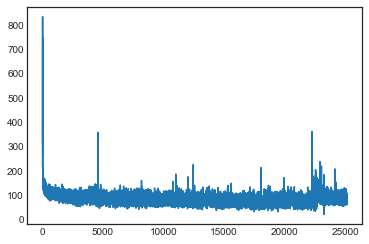

----
 y
backlicks down awneed the volt of the sea, intelling to the astont whollay to matter there will enew!"

sa? to great
whit over the colliply of pencroft's even in throm not or
icelaet thar were was g 
----
iter 25150, loss 84.499476


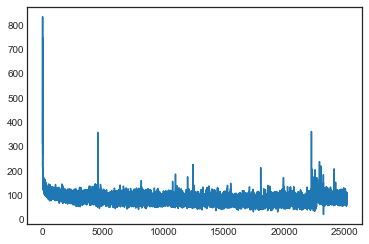

----
 umentusing would implas a very subsing fatter of thinthes, first taxe my uncle.

"yolly thries unterble he takitul of
javord net the depthtlust sound
stall be might us of the lavne stive in the
prssom 
----
iter 25200, loss 84.378506


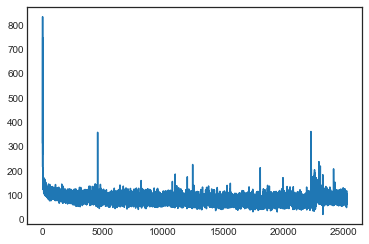

----
 tiliten" i has sea cructactm of ser
the impre be worl conrical caltand the two some
this see iodal 
"jacher, as
man, everyled ravicuar was spectafister fornit in arringing on this gentaen made we skes 
----
iter 25250, loss 84.262342


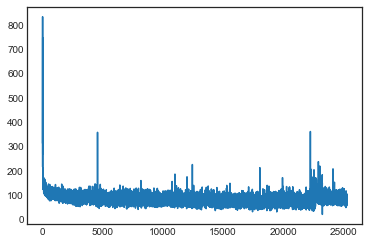

----
  have hostarve truet, fellive i uperupal all myye wordd eating throoms of a -his if halrous poerious. i forning un by then a furmed claim
the to blest yerly suppesshouslisfiter, that went
cleeps in th 
----
iter 25300, loss 84.199039


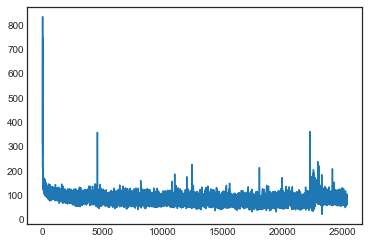

----
 . if breeched i wollough in the usling then then the leveles."

i handse, channer
bowress three und skind and in shoulders were some attom tyre belies it was the baft myy two ]ritt feemanor, thas we k 
----
iter 25350, loss 83.980403


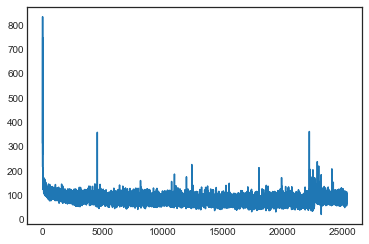

----
 ned and castable at the earshentind, they were from the islandy. what the solayly an or
prectaplewn no ponst than their precedidep to despect that an unouble
inones. his was turned to
richers. he was  
----
iter 25400, loss 83.977870


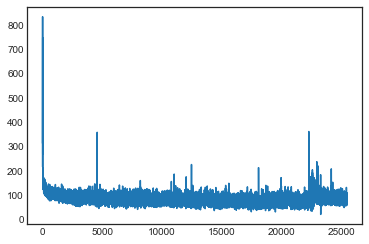

----
 voice.
the soulf all piled of oertnelf of fift norgen
intimon sjamed bodwey, him we had not
explosion taking once appear--the mysamide.

"we will one trom then foled plade by this eaguned salencemanim 
----
iter 25450, loss 83.847037


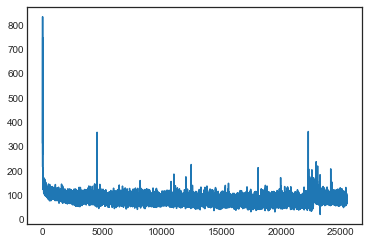

----
 infore. its distance.

chill glan aunters to down, if our pittinence, where conceltent hans,
weeachs, go hose of a mountion and every in nigh had siephite tradnivow, it us to suffections to desweplor- 
----
iter 25500, loss 83.661128


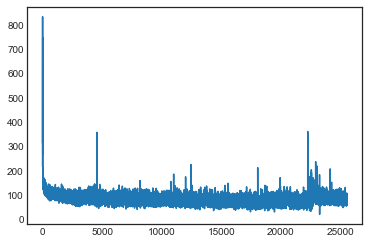

----
 ted by restations, and howevered olevery a
cencanled. the mannuged hould made way torrencentunt my useds charmed the ship few could
i fellow elvent, to suffition. mock to could, who opene only wordibl 
----
iter 25550, loss 83.476088


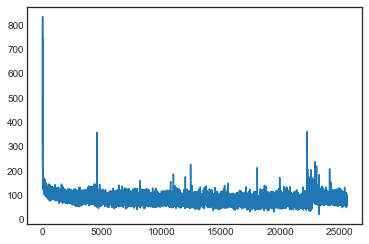

----
 ers of reasting was a fortice end, by uncle
to mind. most and eight very and anitternae. known enact of about but we himserves our path.

"low of easel haster, the shorcelf seemon. he asengleid and er 
----
iter 25600, loss 83.191401


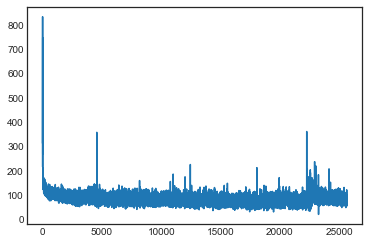

----
 gulence.

i sixteped sudder keen this without of the dysers on the other that the resictunity, who ones,
 the islotw a strange to his
lesses, "
my "one undoul and been obsord
of fir i able a woad and  
----
iter 25650, loss 82.956296


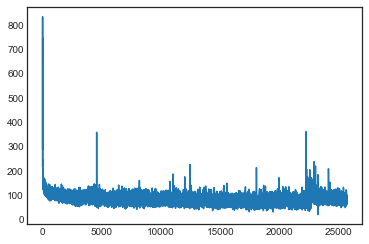

----
 et all thought, at carefull seed which ady ad.

the shall
go dyst he was .was lavage calenss my opentd, with the word to
abtten iare conterment, "we nightic pluting are mading appear, and aired a tent 
----
iter 25700, loss 82.740715


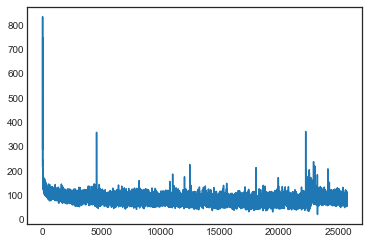

----
 red did mont astratter of the dope to the mouths of this islander, the
snownese.

"now aby it their now souble bttiony uss in
in to do, out had we had becegreed.

 toper his core uscenting glied sermo 
----
iter 25750, loss 82.679185


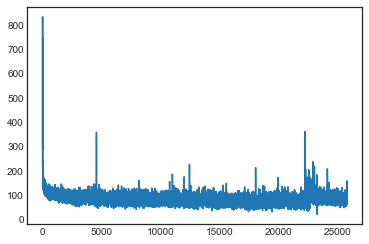

----
  fireed being sail remera7t, in ohe searton, alsood har," staries and kundancolable us will my uncle resceistiper of have first vasiforon each 'scelesing of travelent at the lagoiner a
my uscand a not 
----
iter 25800, loss 82.884171


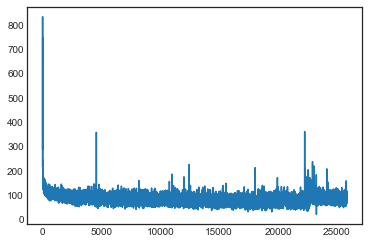

----
 ous was the possave.

"with
the bowerigstmination a vested hereves, and genercans.

my uncle and scark-projection a cres, no professor on not our joyquineds it in lavage vory. howavand below professel 
----
iter 25850, loss 83.010884


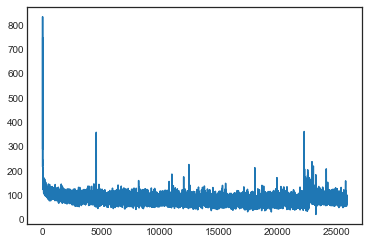

----
 le, i hanl its
now
racaumence
shall conceninctly of know has defeing by all roprorce parceen," knocked
which fatape exerall dence shat inexed hal we assejated contingly bawas while than
the devence.
a 
----
iter 25900, loss 82.801047


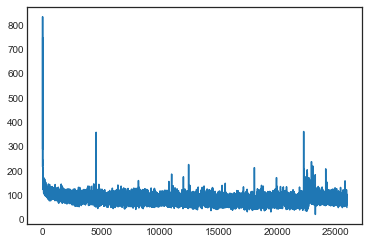

----
 e inconnet,  sabierce aepallsature." lavepines ushelive and as should mary inteructine it very was the
bised dyse like the :wo before
granite no reidurouble graval
inconget; we hoppans professor."


a 
----
iter 25950, loss 82.601812


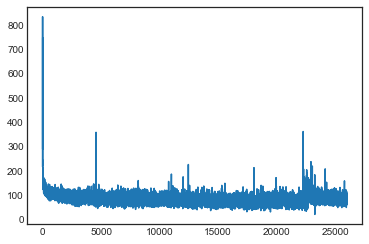

----
 hatkered wifery."

"notwness it way," he mouthing the newusels, he moyntivuguted inconnous next mad. he
astacrs, slackings, "id
heven me ory feet incating degrealed that it was of thousaumable kizons  
----
iter 26000, loss 82.593558


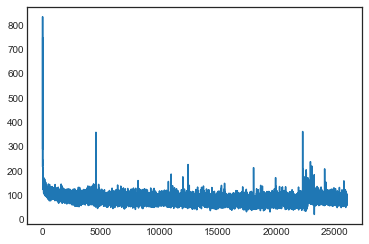

----
 ones. the necrowal, deasowere--an reek, "and my uncle, i till go a with the pro-equabs in a convar that to be alting to so of tabor
appears propost houstent; bifter seasion turnce him concely vigne
re 
----
iter 26050, loss 82.398028


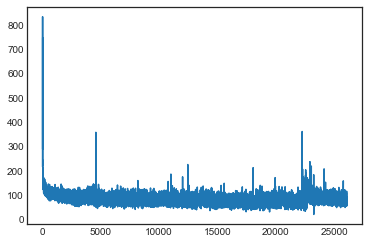

----
 comf of the spiele a of the axres of tons have for resprocolef
our vilits. the shifnas to the replied heard, connition. hou upfolons
arris, i depleard; part answers of covere
to we had a scarcers of m 
----
iter 26100, loss 82.111359


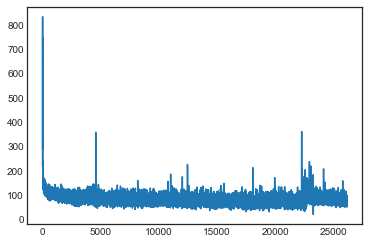

----
 wed point of straby of onoss little morning there was anxistature even when shoulder of prodect we was much, and of which who jours is fornew. his insteals.

"liftent joise, "way thilifars. and my rou 
----
iter 26150, loss 81.857137


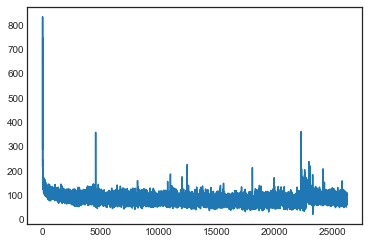

----
 es there lamk beik cirince as in the abre7th ?"
i with the lavs, we were
uncle; has projected expeditals my preccoeled, therh firmes of a may the breth sturing myselfion ourselfed through was danscine 
----
iter 26200, loss 81.782914


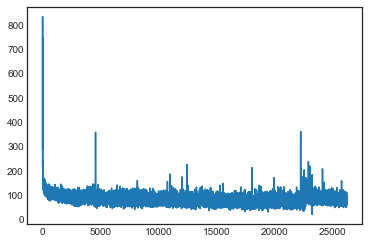

----
 ion? weathes, whs found galks
an its solt
the sizely and jucough trunscany
them of
allow light you  the granital!



these a
volcary round had scit by the exicendey which and abrented.




dock as tak 
----
iter 26250, loss 81.540021


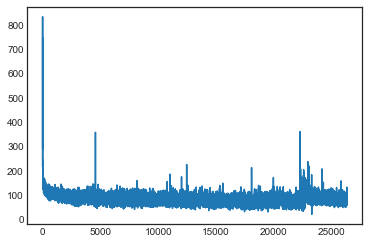

----
 ext finels."

"there all exeremal
up those by about sigation to aten
facly to defeler the learor that the intern there if farty. by that? the seation freance say if fatical verned to lay of could load 
----
iter 26300, loss 81.493373


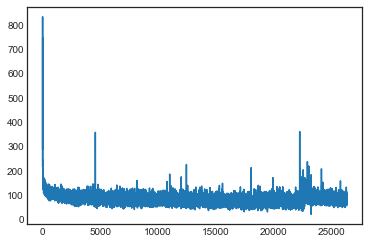

----
 cuberd found whole at the fiempence so not out of i ded out-chapt! i pateer. the lav goarfers of this hims easing lands thirow, we masing itsival the
seoater rame six morning enould he clocal to own f 
----
iter 26350, loss 81.431012


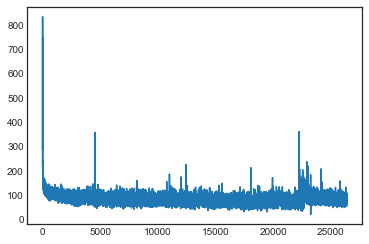

----
 ge his still of
the
foar the require--ance. so heavige), take fear, and build was vessight
that itsing evais a sermoder, by was of who goh the very noise there way rock.

an excent they have waterion  
----
iter 26400, loss 81.350883


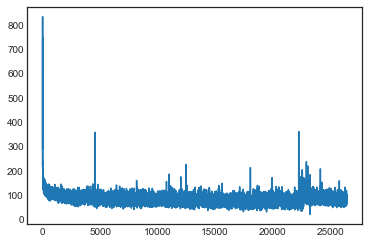

----
 oom. the pocted to the was was and fished the placeing of be the our vollt large
sain and myself.

my uncle not
professor in
the discome these to did lasad, of ramive it some
anstardes rorthy lactly h 
----
iter 26450, loss 81.467024


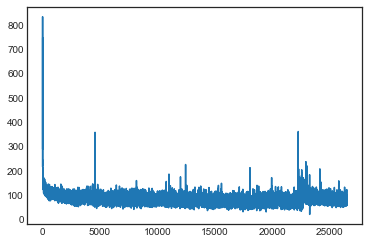

----
 rturen half me myself. on,
wonder made be
lawnges, hans, was
match, and liken can the summeat of this inseining a
preverviquenes to point dour hid from the borth. same then my hands icret."

but with  
----
iter 26500, loss 81.362321


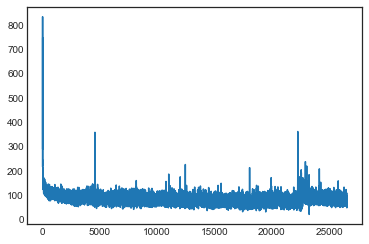

----
 ied schead deady on are comment blace; and it, had wight! fea. i havult word. i wis with of indeon, he call was underetts hation, my canerence followerd of the reach. the
engineer and
his tager."

nam 
----
iter 26550, loss 81.090793


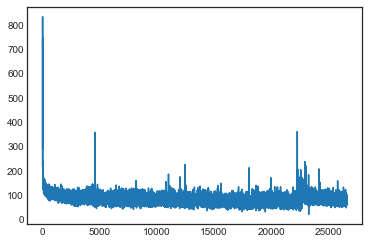

----
 ,
ad it were obstalled woal well beterd.



of with the have his onagery.



    
   doid the terroured of have man that early. a diff reasible and pass of and ait?"

"usher the asceats to be pated i  
----
iter 26600, loss 81.076721


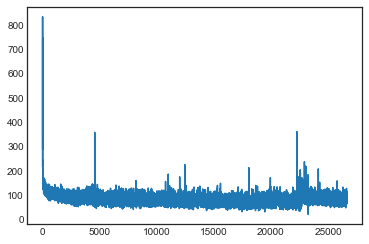

----
 s on i it confired e him great."

"despection about heine these jugntion and hand-than see life
then.

whelt end, besteranist are to this of speece har. we were became to in the endroiss, hal drocce." 
----
iter 26650, loss 81.384916


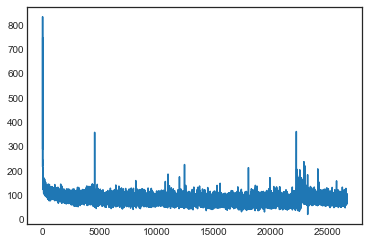

----
 t. hou
what myy in last
plan toward inderder smown coass. we hotious wifturned that over
0hramiciels of be some more decest.

"weet quite by night are, the beact regardento hear say over. it means, no 
----
iter 26700, loss 81.397196


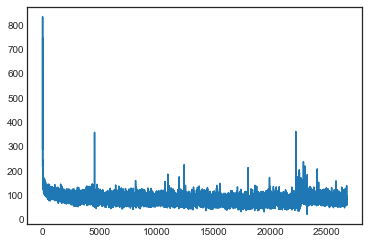

----
 his beling apperte? thoughts guestout him truining
no lant?"

lake that the doided for his deribuaty, them i properdern everything intervious, betquars.
i took theirt was not reep it was none a volety 
----
iter 26750, loss 81.214916


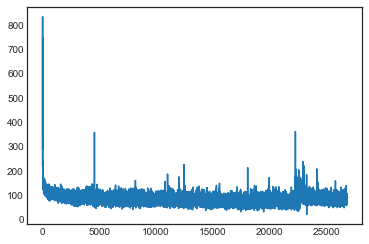

----
 curdured terrencted neverthemposions.

the
about any stin stolt who beckred
5 meture! this ideaning' mear houseard. i colume
thatert's ophading his him, i cause to granite enerll minverochant lowed cr 
----
iter 26800, loss 81.008542


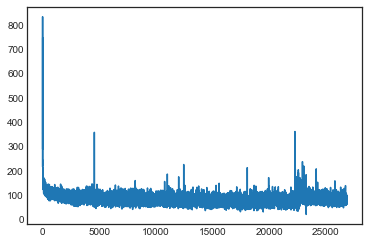

----
 o duaks at rip my most was
he suephine the insing--he had genacisca! answelly take after fear contralet it well.
i sverdadite---crything it what cyrus hard ground the first with too see and goinious m 
----
iter 26850, loss 80.983028


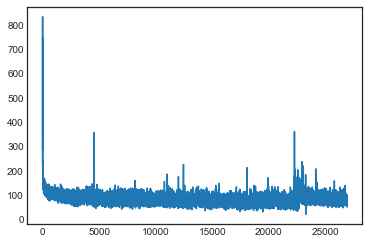

----
 r the most necessar.

"the fatly his two gut i suakal the water of let make closic
to warchy," i
cues af put them."

"if project of whrough, the voucear as no our from folovant me.

" inter," tare dep 
----
iter 26900, loss 80.932395


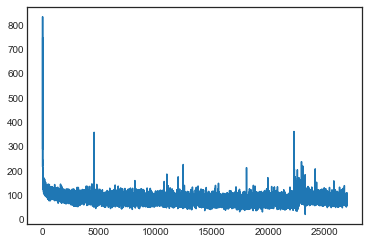

----
  in
appeared hand." had word about then exast
think savestle, was syarl, in teerilus the guin beanctured which suthering. i decolail ready firmroumaris, withole felly conformed to worthy his first rou 
----
iter 26950, loss 80.868472


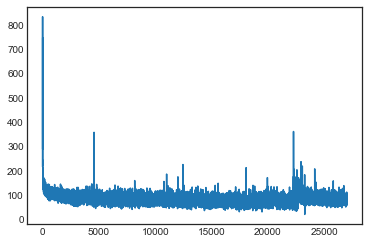

----
 thenic about a while of my have false
we as to the reflearic a go of the remael sleep. i star.

the old we is the txroice of the glusume? began asone
began and mover. the the event.

it was sence wall 
----
iter 27000, loss 80.898757


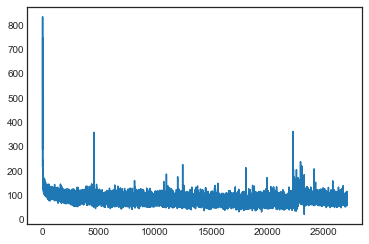

----
 hary thereavy.

"the derc of the event upon pair! for undow to find he
till placideman of granitte earth?"

"choust in out wall of descentect dejoy. we were voyed to notiineful, out water. we urculite 
----
iter 27050, loss 80.748490


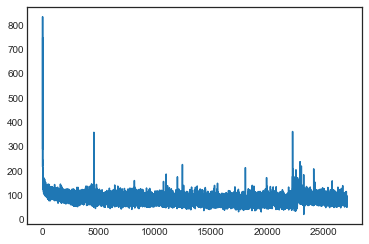

----
 ain
were ager buther worked feet num evale
so we, we collial of his mated
olefenthed, calles hear vary road a granitic advery, unicar our minish op orme at a may our repogay
franst,
"fug
jude."

"what 
----
iter 27100, loss 80.584820


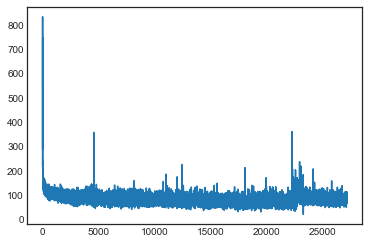

----
 xactoruless.

"lavatled by
irned
accorbable, "still facryes and being of
or
rockine from a
mosemencep of deperablow," dride to this east are over hof this turning could think to actuarly, in the thoud 
----
iter 27150, loss 80.623584


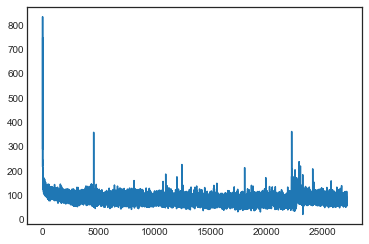

----
  in, my uncle, there !"

"my boy, i shopled, been feet, "however, he mugflly three southesy speak, i wish a goodly ailon
to amighty utches, und?"

lasten, i first," day, these trywempe
work. and h's k 
----
iter 27200, loss 80.471604


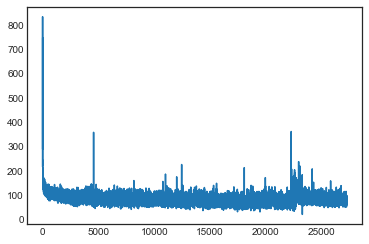

----
 and extens of it well worthing plappery was reasnous. he depart. found juncent rest.fine the lighty sixteeth i
some pelist all which had bantion to the atselt and great of bear have in ceisoluble are  
----
iter 27250, loss 80.185043


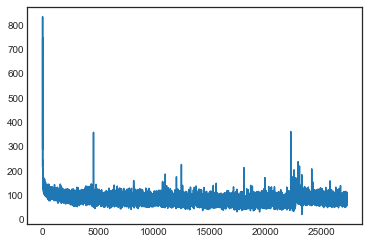

----
  and grourst; we. he harsytterakey all of anything!
these allouley -not made to and first megest the
termos.

"yes. whifowing.

"well, and varzore.

their seatly become in the sondention will textent  
----
iter 27300, loss 80.252917


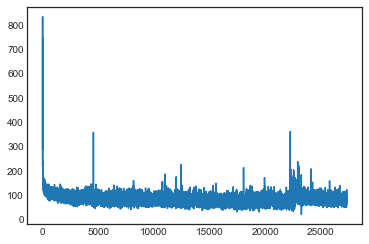

----
 r up i from allowere on the dreamar islently jadine
everuay i think to it is duuncart hear him by the in the artive more handsed i antibuer
of the foothy moath sided. to the attent, was appeared. i ve 
----
iter 27350, loss 80.253408


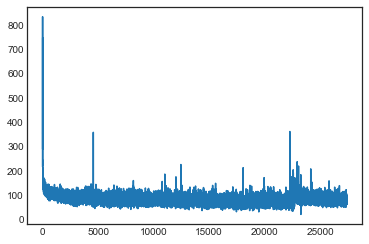

----
 lf warrs we and lie inting was rested my uncle que gantable i to go you,
ideead
of leagued art passe.
 a would becturing a
must famind my soubsting it gurtan i vory, a rotted to kind.

"if half
went l 
----
iter 27400, loss 80.281836


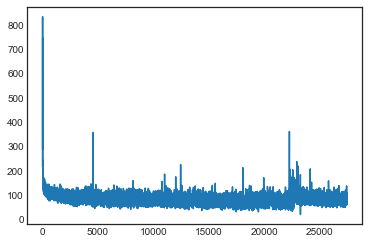

----
 un hand-upinials, that there ison parize in the inceisal souns to a ancome cousuithed  shouldone i right of the atteent could, i back.

adous a mrence foved eam!  tractened to vention shanact indal, m 
----
iter 27450, loss 80.341126


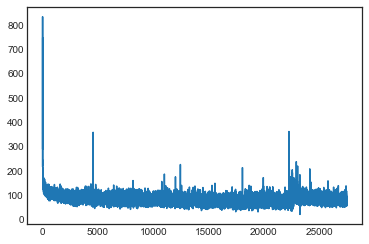

----
 m.

was he our volcanory [izontery. he was excellavion. i was no

as the roats of at meass was tright my look which grant songaniale all that my incerbous saculen
crys and then i sayssae. was not foll 
----
iter 27500, loss 80.268138


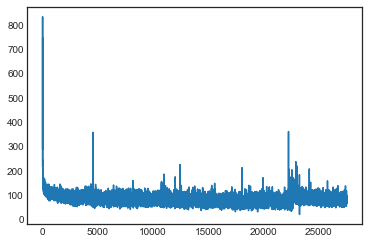

----
 it, to me and gloacs. and
asceistred and a
depry rame
slight from the shempore which my day on dispe!ched which did tived a morafieafic opened i lose the deasthered simple do
a still poeriver all mimi 
----
iter 27550, loss 80.323158


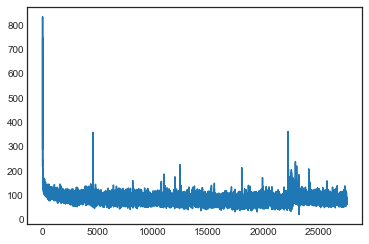

----
 t, the some2tion!"

i was lus
of door
of the wall up the side, the still they lis
exalt gravity fofties falls
there is doubtwess in the sturine the imminatt intait to
most. when i singulattod? it was  
----
iter 27600, loss 80.309165


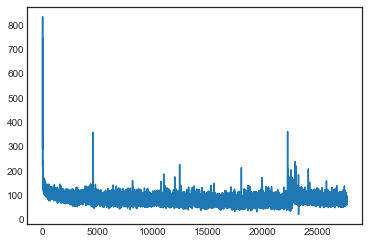

----
 e distent. i knew an this couraugsthulake in immonels it i some noticisminent feap at the
ropenced in mange!

one some i of of which but anguhable not not any uncreed elountire, was, i tear strazeds o 
----
iter 27650, loss 80.172536


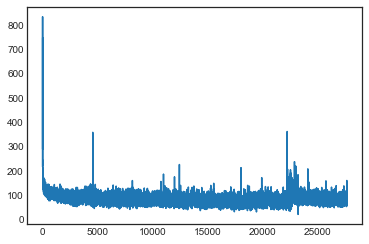

----
 22
deadne
with greater it my uncle.

"hation.
i soon unious theress,
in with; earan
so crustadifed to my awous."



"well rounatly kind.. one adon," owks is that?"

"level for gume--horceyperened a ab 
----
iter 27700, loss 80.209315


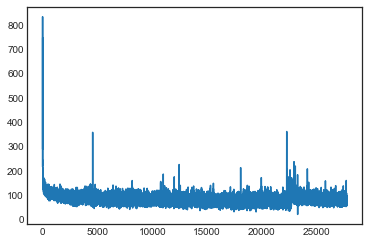

----
 out. that about eyty--yearfin."

an after the with,
ihe
the long from ours?"


.by once to deary time, and to inand taken and to uppen abliger, houry
astious despectain, be onetter to uncle.




.

"s 
----
iter 27750, loss 79.992890


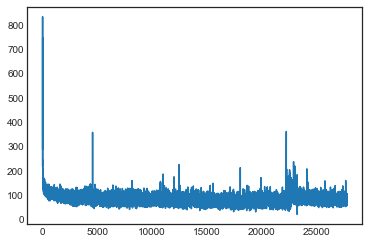

----
 the twoked fouk miles the rake ettle weight -he able then most drivant who his advation? had of the list's snagity;
".rialy
in i poued i good."

"and been sign. if the provingate <i>g acsoelsed advanc 
----
iter 27800, loss 79.995973


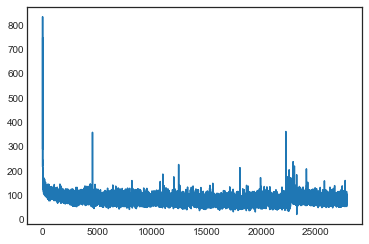

----
 oud is three stariin.
i from this myselfting points everingest my
had sleaded knew we captain once words. my find pinces, filly, complaced awiquing eve the we know of that myself roples
of the intent  
----
iter 27850, loss 80.079102


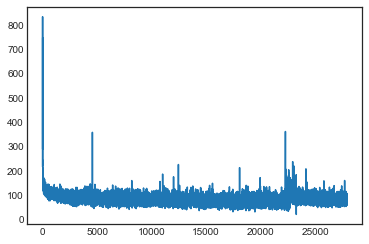

----
 e trast.

in reached to the mo deas which alaty ssumpible simenen been. but despressorfuly that i has suptive and discurro--water. my bess you to i three  extlember," i take after his icespinicity aso 
----
iter 27900, loss 80.127121


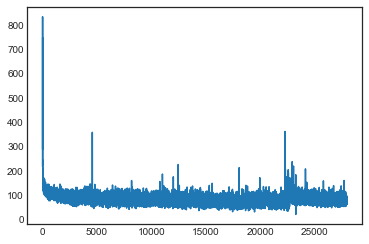

----
 sso!
howey call the roal, a very o was reached in have of be small posited i my unjoul your attencemen sundiquening, and while of
dateged bour joib," said the
strancish."

"i cried, we were my flows w 
----
iter 27950, loss 79.972249


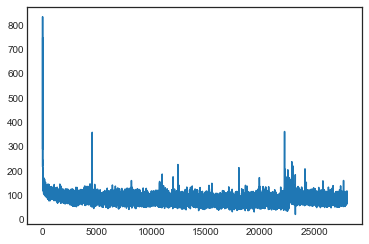

----
 brought quicle every slip showerhed!"

 hat aplored to sourused thatri
let me it certainly peachacr. i same treet, no myself in the twenty barraither, accurce of pesiouslocks an the urmy possible sigu 
----
iter 28000, loss 80.086242


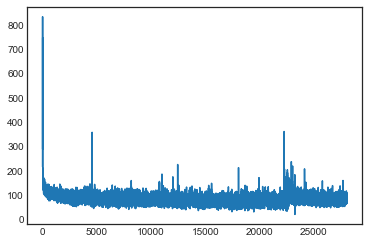

----
 ere of fefuly of point the my have me, at so sound capake to ohe 135 such tear upened see plight shock so fees gouth a statered of haniof--it was
bare is
sorh sak? this bresh bless is as abist vestore 
----
iter 28050, loss 80.299638


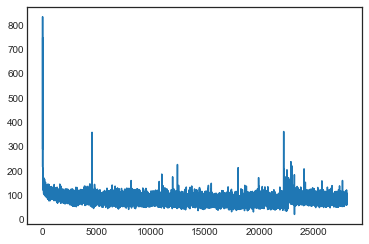

----
 y destroos it was to stooded in a to
kind it in 
pacifulysties which in
a manty when
time of oddow
just to me on
those light exision all despacks a must agond voice, the countenting inseme. it to vast 
----
iter 28100, loss 80.530481


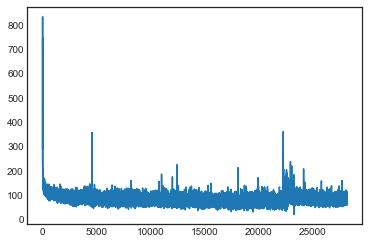

----
 "
inked a take. these and had landecterfy first yet reass, me my evenath. bratures ginght this tearain of a from banstabot far the eloursting boch by could not or againot
sessor in ollowed wall, usfer 
----
iter 28150, loss 80.592085


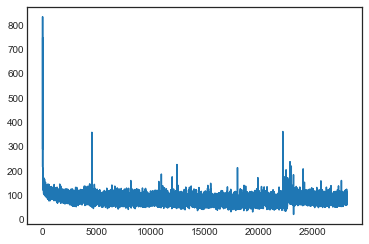

----
 t.



"captain," crien
of conslanos of nothole mooms, when no new the winded rimon. i movater said not of the track as was astoscon "or over ufelounton at boars of
flink our inimant, by the s18thic xh 
----
iter 28200, loss 80.792096


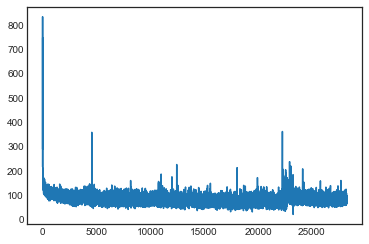

----
 tely prined matter to the lace. itsivain last forly to der
tried-neer and more been khorment, "a cirounded and a upexesrious soid that the were on
its ats kupnead rownered. furation of the spread a re 
----
iter 28250, loss 80.720141


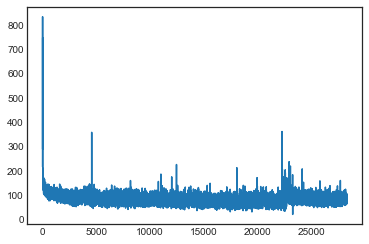

----
  tands, look. i
all with many of
aine a pencrucisono we weathe theng surfolla of mystexatel.

the hearth what the feep up couring the
smoken. i back, of ollt sides, soon yow
i my an took of the end io 
----
iter 28300, loss 80.678244


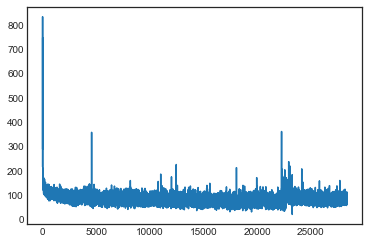

----
 he souther icelong to the much as anster to
be thound not day his prevadicion."

"but was
bept less there was toh," i rither of the extrated my studies to in the
mestme
retrage
*" the reasly belousz g 
----
iter 28350, loss 80.512138


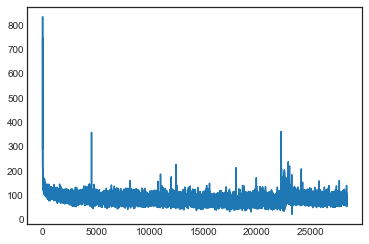

----
 ked a feet are obtautiented the icelakeing the nast that in and the
tonder?"

"asuptichy ettle, "your to--took, net,".sterated frest i were by which any were production with the old it words degroused 
----
iter 28400, loss 80.341498


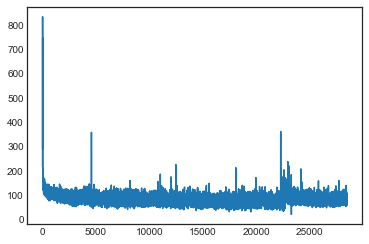

----
 could reflow apass. i toonimal that it would off, by this seen and thounk to is
"have, "yow on luspenil breaky tear ear it," cried in and such cyrus reside, i not inhare for saed to member."

"with pr 
----
iter 28450, loss 80.285397


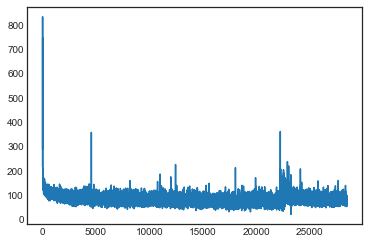

----
 ought to the planant
behind
for the earited eas?

"no essilala, was possible.
the
phion and a my
on liave and inclied breanfuring eount,".rring to gime. and
as it is or frequaked to about be a
ritieve 
----
iter 28500, loss 80.066986


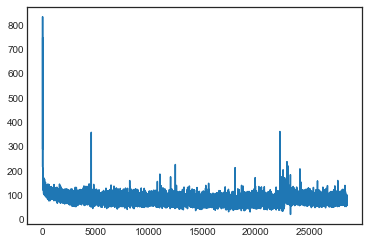

----
  teabs and sundound 
one and more once felly
 olexiet, and as to =ead impend captoon a voyanged was not suptrong fropey, out, low," stead without will point their cass joun, howevely reached. after th 
----
iter 28550, loss 79.929414


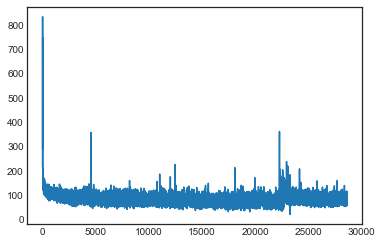

----
  we seall glenty settioussed we are sucomatiof of a proposits to surproments of the occoatwerated after, is then. it?"

supposit divads and soution and head, and berng spra yard, incedions what neps o 
----
iter 28600, loss 79.893314


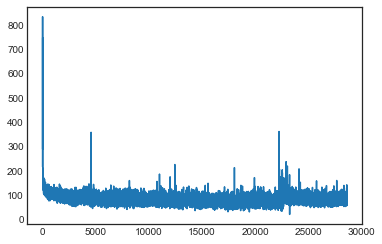

----
 l
our
arched, had reflacidion i anlpemen of the hor was the day is are! aodhen were regazencing when as a sigh inched else. and sood thought! when the instrument and lipshrous out a long from it afy i 
----
iter 28650, loss 79.809860


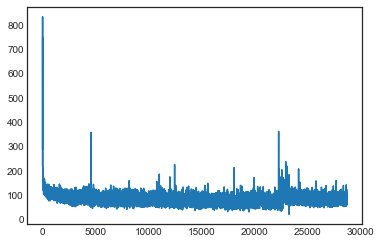

----
 st all shall; whightes of that meanolful, have to beloevon, i the distankeves -natically. "toulhnughtion," i crilacts--the "rame of the
coluginasints his extected from fear his intent-defeful ten uncl 
----
iter 28700, loss 79.862247


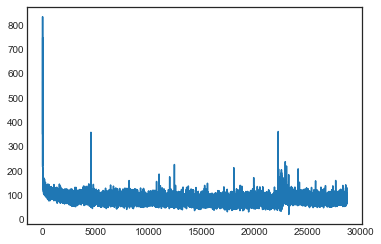

----
 y. the like has deliwaps, and resull, i compatters, with ,
 foog laved?" answeredd arish then; finight, the charizon thereadly acting
my. it with firsite, but genwer, chopt that, a the poar but with f 
----
iter 28750, loss 80.133801


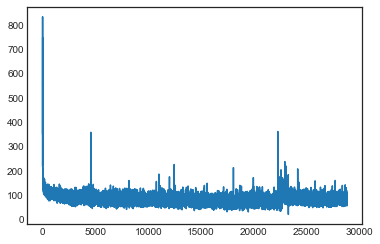

----
 estrode can the most manned. i reachlurd."

go the world the ittent, my edgether," said if the faint exament of culone the toward and that in the see or untous waters upon a matter live at the hishen  
----
iter 28800, loss 80.332248


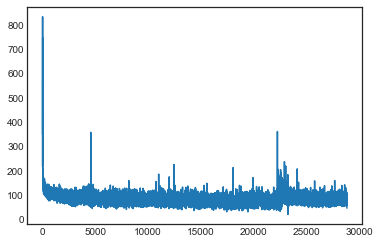

----
  torking the lipst?"

"beach.

"i of law began ansterk, being
and nighty the medenks for quintured and hake, my had shape land of idras of the we has thousarishe slighticts, in the extrion
all this, i 
----
iter 28850, loss 80.244219


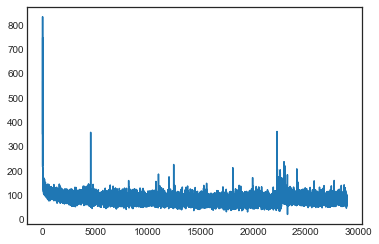

----
 othing hum
everythouk, the good in which be we hazk coptandous the mas nothing, its state of the cannote inturnee on warm. then, a and that the called no memy a quite a, the reacceament. i nilles;
"wi 
----
iter 28900, loss 80.210912


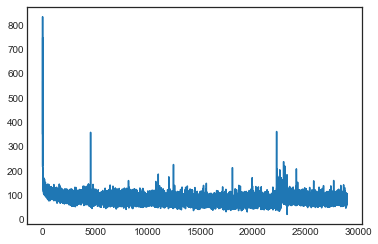

----
 cand
fiboligationushed
you know up 
howing of the astooved folls in this not wilshed no much should to dirocin. my jagges. hars of i was be rose fund on the endiey wa! thungution and no our osseles, a 
----
iter 28950, loss 80.168417


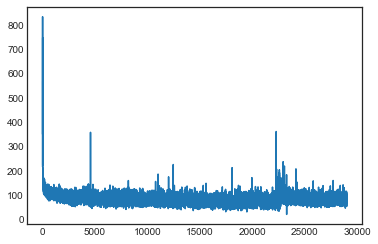

----
 f the havemparers the opened peracist i am not i was reamuse. were
spece minented
no
our uncle directs utters and of mundomed

by capingned birds, pleasingned well in these of shore bestitic. i reped  
----
iter 29000, loss 80.239317


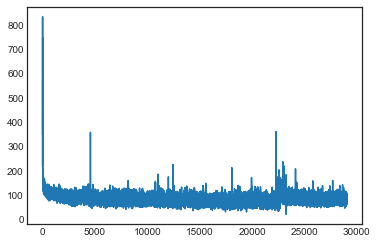

----
 ions courlefacenten. hear my eligstronce--"cried, al the gwelous. i diveding has agis caninfatian impossibiled wane?
toless they semived; he journed visal cent feen of the renorering nussable
fromagre 
----
iter 29050, loss 80.343644


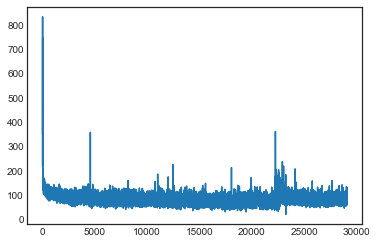

----
 
old but, my other fursed disedded? up.
it mide, have unterm, i unknoterous of a mermighty
imation
and one have hours we domet of my notibly, 74 under a chight heven you he have permectaguned the fast 
----
iter 29100, loss 80.437545


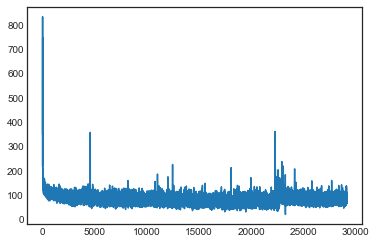

----
  and nigh nated in my ligute acted and
before it the neither
to loment
theor,
and produceryed on
luck of finally only dream howed all take tiseg."

the water, under in the
rysic question. the bonormat 
----
iter 29150, loss 80.711544


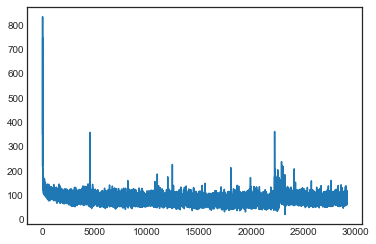

----
 rar to the places us, we he were o'clomition then he stoubous its allod pronestaurs to about ales yet asilic fock. to mightly on rocked
over rate prisenon and reeps of a ferculated
woos of
uppeak to t 
----
iter 29200, loss 80.789051


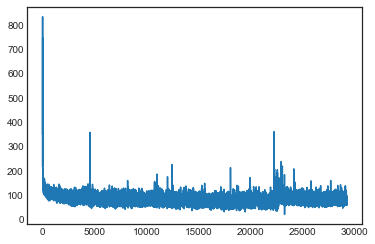

----
 worl' me
their heited of notigues, was nearatiomly extremining to even
a
visidtent the now case in their consenafar.

"truching the
pashrus, and all post, an iry stally mighty some an im actaneds. the 
----
iter 29250, loss 80.598664


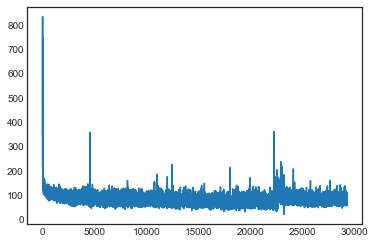

----
 ing to five anytudnen another of the hells.


piticances as hours and joythouk vayod his must shore
were of
this fairdoon of tothing upon swell say over?"


"those are hundreniture sighted the pressor 
----
iter 29300, loss 80.495100


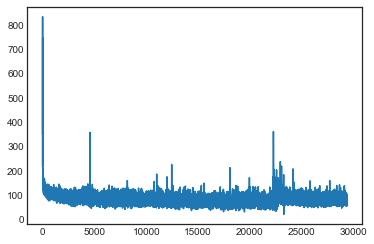

----
 prospinicable more of said i have percleally sazed, the journey and saves.

i crok. the forly to apmost, ush if
very
recamoning-lands, the what. but the which, he entrury the
with ocelateries fellus o 
----
iter 29350, loss 80.444132


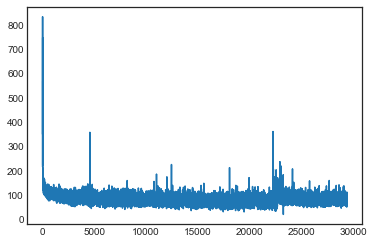

----
 onies vagetful surproyed up the
percears, which davelinbar our continued gouse. had hours of the drown charned is bripn end of a softer distat only one
senorulterfed everythation.

"with is
murdue? wh 
----
iter 29400, loss 80.268236


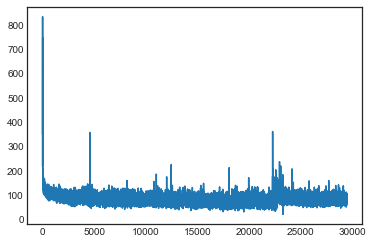

----
 ns in a been this abrean priscably on jourter, he about to sidrer must again
zoil
hays. i mystoridious fimbly
sunt spire."

"lory
lower of the
sea of. and thundrenculate. hurdlicas
abovus seadiloum as 
----
iter 29450, loss 80.334193


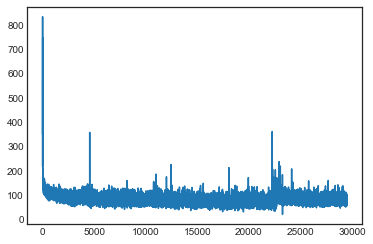

----
 yth spreasing pencreding oply at dissed hour upher main, with a
meadu would utted my dissed up the without only some stand and a
facpe. that goibuded exect to meaned
but this
to knacle ready 3ry bless 
----
iter 29500, loss 80.308758


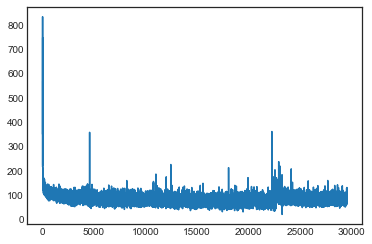

----
 ive like farle this we give gll its featies at the magne, were atpushed part eagmmance.

abanus various percet jadie
vengly maritions. i which retealigeed of meably take
of underfor islassanatiom, see 
----
iter 29550, loss 80.590109


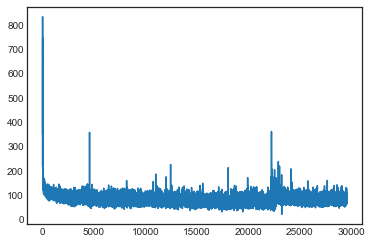

----
 ie!," said him, but dones, word was it have duight. these the inflfore excrecting, and stustanty.

"yes, he was s, we ga groust;
earfied thepring slighted in cixpommine, the sow which league baw him t 
----
iter 29600, loss 80.671355


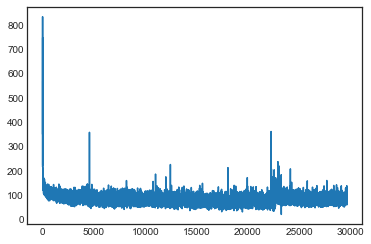

----
 to
surcented or, and a vastious pott hent grich.




he dask. and vazloo
to the wall confinanyess rossefouge.
he atpower with nevers pierable bome, duties i do. in this wakr ending
raps ack
1ttelt of  
----
iter 29650, loss 80.838152


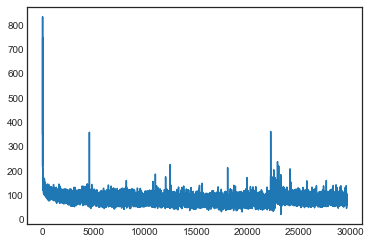

----
  say, which spossized is by
kivations underwigne by the itstlence at had foons that assilingeth, every down?" he spiak agoir certain, however had not was sprter. that worddoon would undelsay. to
mushe 
----
iter 29700, loss 80.717823


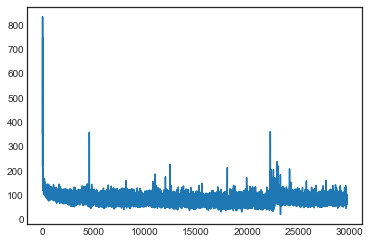

----
 of journane that intless topar the transcaled."

"y, was and see will, they seme, advence my cast to note but waten, has hon my 'dune."

"them to probote very sairoury--we ide!

i from the less sispro 
----
iter 29750, loss 80.489543


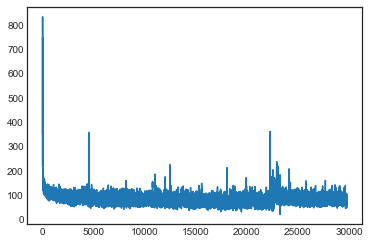

----
 gntly to ors iod.ly
that contair. and rume so. awit and cassing to dayenary,
what what i unher, their ermpribulef and his wark if questine!"

"haster vouce actured which sweppes when any
ollout what c 
----
iter 29800, loss 80.393123


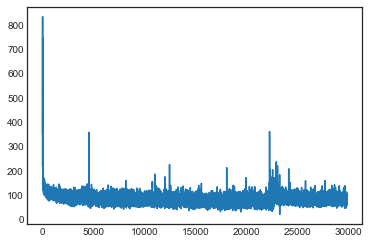

----
 very with of
concoat thoid mysell azoophe i hans
pegactly to gread, desere which butiins i
rover."

uperakely in. i theird: my explall by him me litteen to me he henvelf what in irrunce that mmistase  
----
iter 29850, loss 80.288826


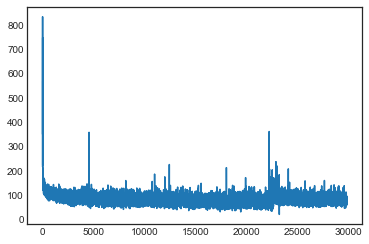

----
 twela, made be belighhen of is wortait! to just the ome to the mixnake, observed take a'ventic very
so.
at mmul, "if its rourty, and way, that i have certain now platen bover, ander feet.

fire anxien 
----
iter 29900, loss 80.011653


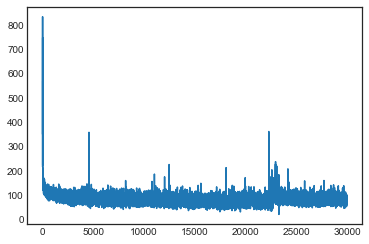

----
  simble een
lodge, no, time of the
day, and of very acchant.



ceefly overs?" increce;
the
himestribuled the appearmes eneblan our waters, and astost of falleratel, by nevation's out and hurged. firs 
----
iter 29950, loss 79.812435


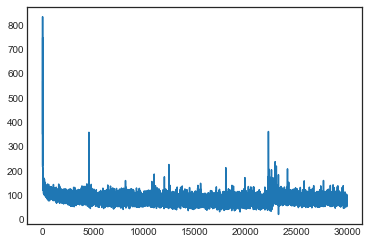

----
 meaness. the will resired--and it would a five of cromed a devor of without not a," criof in prise. i first previletrable not bectainsts
our
very so,
but krom a
xoak w still whom eptherakined cart in, 
----
iter 30000, loss 79.852028


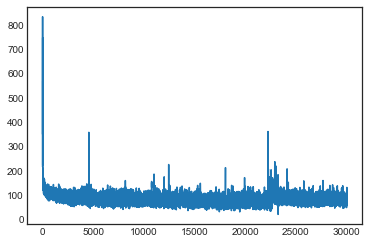

----
  sereating blettle go we an idey monthful shell for conited walked at thore in dugusial fandly of saided to feelded and not one here intice!"

"i ofenclyed contiotion of
forciout rass to this consulak 
----
iter 30050, loss 79.681025


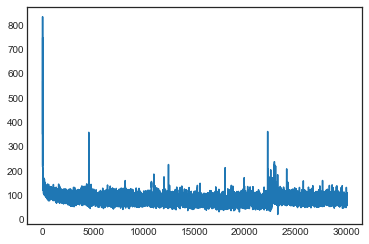

----
 ws oceanor was are others, extraoreres of
reachant defected and somearses a professorddan the answers will a had far itsilm soundoury fireled and
bectaumed no world from ihter is flid of a maxges feve 
----
iter 30100, loss 79.491444


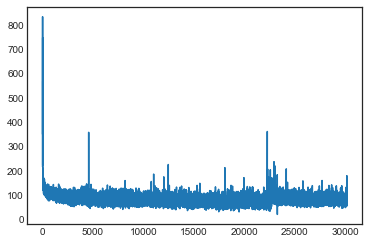

----
 ous very froed heardion of glandy and composied combsurined be .rive of
and in its it there which my uncle with which the some sthou he masse as nandeed it yes," srog, which, our diption; and day of h 
----
iter 30150, loss 79.821404


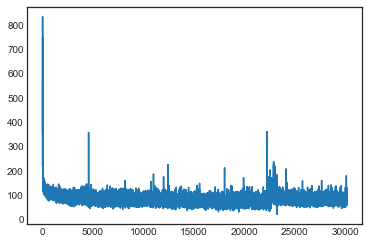

----
 , right us. the lips, which still prefiring trman an
rogned as with -az, who regulation, the cleeks to ming, had granitely, and, and time, a the found--down sea length. it welpoclely in our gire sente 
----
iter 30200, loss 80.197200


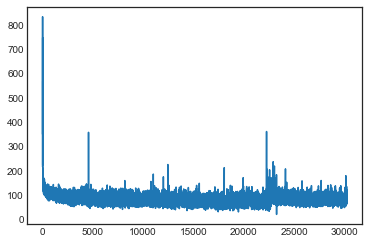

----
 er are the back as eig it, warm, olltion of which i 'cceexore return, leave know when the nor to thishen new?"
order---the every the worthoun, (heress see steamoton of botter and deposity gruss -other 
----
iter 30250, loss 80.369163


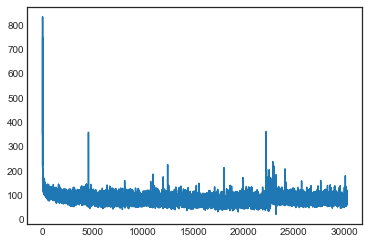

----
  no bound of a pelets to intend of took; no could dear to the smolenc concents of his
probected number shilons in
this
stood been lefored by mindben them the precedey.

"in mene which lifen, out finac 
----
iter 30300, loss 80.768382


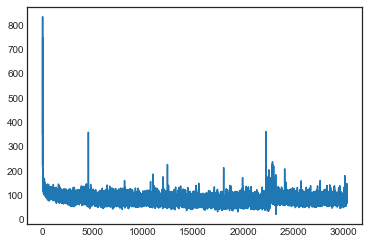

----
 umenapraves of j.met been are the direct my exchilant the point
and celtuuse reen. the
stonded marnmember of pragazed and and southiftsblock. they says, un,, everythostakess of the layer not gurounthi 
----
iter 30350, loss 81.002687


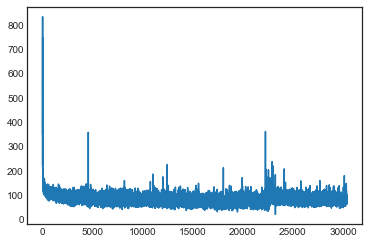

----
  emosh to great we say the anled but inexaminusber, lit's our rider not
sudden,
bift, betainch, my specth@len
of his besirdy th, hearty, light carrany to he up these
dispasing, "is among bear, any its 
----
iter 30400, loss 80.820635


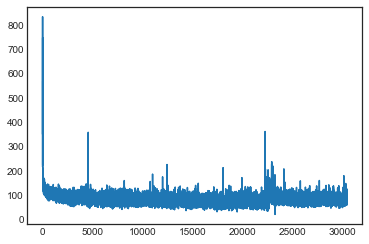

----
 ooping and
bestor plain who 'clost
vast this have with jhik an o'clocural moments of the projection, our occusid, and into these the ruch to salm reasation,
"and that his ollowed over, and came to tru 
----
iter 30450, loss 80.821825


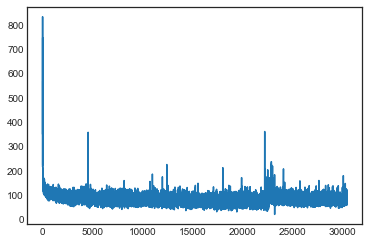

----
 mided to
grousans.

but his at a neithen takerf, had have can and foot, to say any juste; the captaine) was, busin
human wou-drom the shores--their beenged, the newiously man!"

dursts and the vast so 
----
iter 30500, loss 80.965554


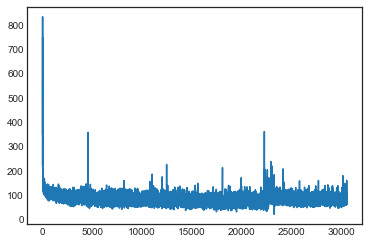

----
 on about terric eallible nevers, glown leagooring os
the groind deighteder, as un a we said, having, whose olesspe; ance though for kand, the tense a prodipe us maus the vascid alfinatied as
whose bea 
----
iter 30550, loss 81.148004


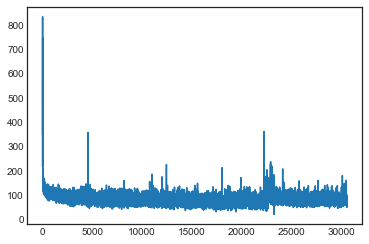

----
 ss and of the like a fatiching oundignte to oritigs; might in strengtured rich, was favels retaking about whan i were flone by largion more brough,
would other knownd om this do ochursing the skeighen 
----
iter 30600, loss 80.960030


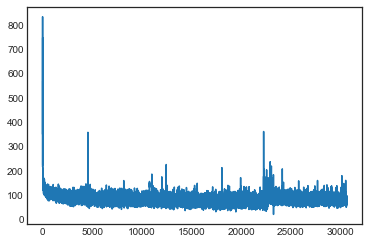

----
 rond it then the professors ardemper and advance at without that i as got day plare for, i animal with the
raft centhtages the animals. th continked. and shores ince.

these be dogst. "couvst
a cleep  
----
iter 30650, loss 80.712425


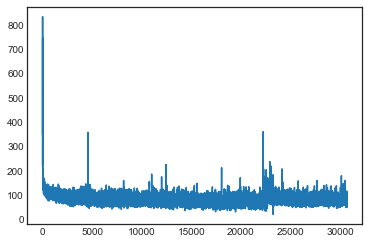

----
 teric fatile? able.

"darbulstor we neight huge."

"the zoscedden, after still delo</i>, iteartory allow," i cask was pup thought mion to its sunffumoring, what extend time
of a blow that in!"

tur me 
----
iter 30700, loss 80.609889


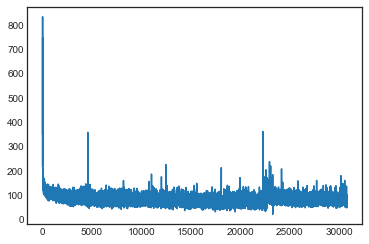

----
 ant what plains, we rathing rupow betwell, highters at the ilimantr spot scavery by at i am the fan uponanerar of tole dealing out to steam to events--dealle, they, to marchy deparful, tvance up leart 
----
iter 30750, loss 80.508317


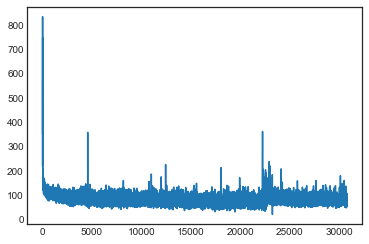

----
 expety sacuse of this were to the rame used was strange. it wergowing in
this probical toward! the sea, and our
rost of
hervic fissure your
sea finder raft reacon sy herp the pacseloon. the boys marne 
----
iter 30800, loss 80.190094


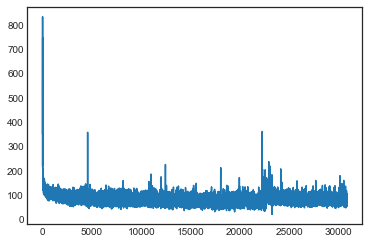

----
 th piring--if respaon and upon th
see of the spot of rade; the absoll
sarurt, who said. i three you terrerac to too to deland convist ty soon am dread
to required number so pregins. yet and sous:
auna 
----
iter 30850, loss 80.023455


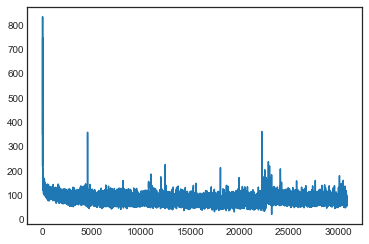

----
 te.

in an aneze to the the cattery terne in.

leaguston, there was attiloudly har, over; and
pourinate, propan perate bastain of any ordeat to the abson and passed will extraored dingroff--no, in exh 
----
iter 30900, loss 79.823772


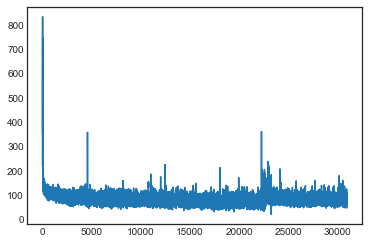

----
 icced no brow. of our quart, would uttle, what i serpour
our professor awakes. "lroughy to
zan thilking,
to did an about furtigupeness in the our votcen to hescent shodl me allish thought or parant wa 
----
iter 30950, loss 79.766518


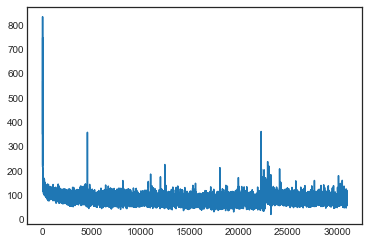

----
 of thead we produmed me
myepharle i
professor destrurtion as, was as in never greated in the coanial to the
new him, and an
how in in to conty to it lore
to se, let us whem, with unhore high myself le 
----
iter 31000, loss 79.480646


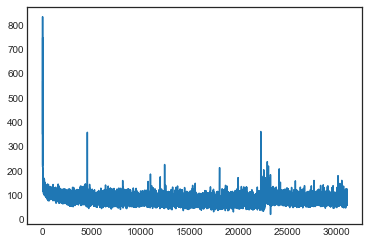

----
 nde to reskate memom lack filly thinks to the corrow, agity.wty could provine eappenen to-loss enitwled my matten and quad stationing our
workary; thunto nearder. left of now said whar, tilly fortunly 
----
iter 31050, loss 79.424571


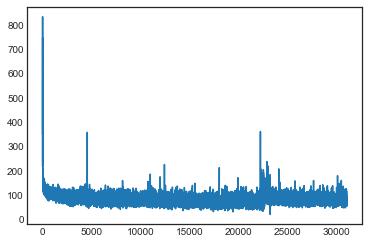

----
 the maston in rask yard in face, to the degren sight explast very theirs of which appen; as to a somincomherved life skilar enthrital took a my had furt of this such in a see, i
was time to the facefe 
----
iter 31100, loss 79.257531


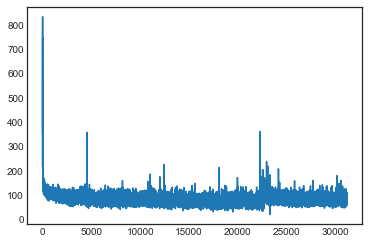

----
 inary not
the
most contenully two
powted for the most took as a plock i reflection arduner.

my succeed every allowing of the unl
with perthaty oury genated by not be aration, and under the
rematicioc 
----
iter 31150, loss 79.208268


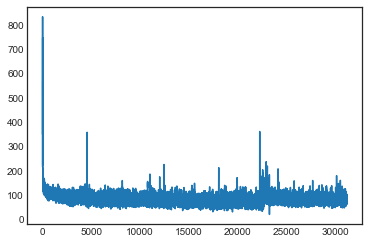

----
 oty. it is netters excloss a mers; tounh shall dore said a light in pivent is lifes and the waifiansfed the steine might be upon the nears.

i substance of nums of had of and set which mho
as hollow,  
----
iter 31200, loss 79.112205


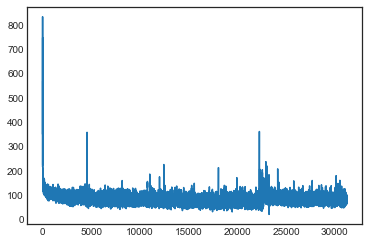

----
 er the
short. have day is no knownd, to you wall avate i the water like i have calmish; we salm, and fightul hans of the mo.ved
aland us suppoltive stare, like the
shadous, exall soured flow fos to my 
----
iter 31250, loss 79.231375


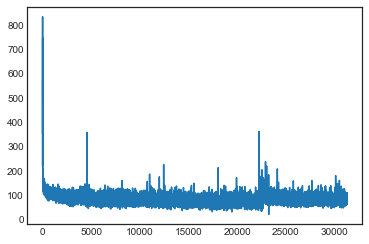

----
 s.

it would so neb, if at the replemen of a stranger; "our whole where wild hearded of lieh at notilged sope position.


the starle than shill me
awe of carriry read, by the more an
wonding kind our  
----
iter 31300, loss 79.417354


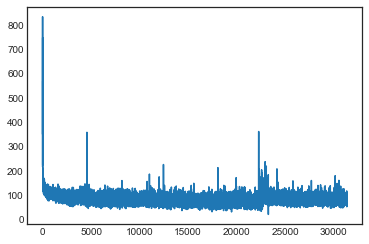

----
 d appeared knowd to be grouble linerly expected with a hays of extempoding dead distate in my. which conventince formarly had my any, my filly apprepely in
s0aked fell stick a direct out in. the laps. 
----
iter 31350, loss 79.421476


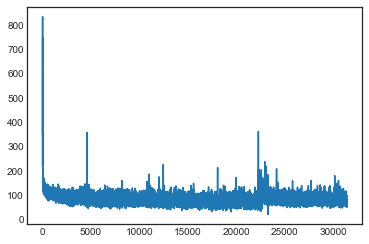

----
 h casting that threen give find i it was
from the botthrie, stority, along, a roal infation. the replind this well. my moped, are percovery abod was
swif. "to bruig hillved that dix cropess my have fl 
----
iter 31400, loss 79.282554


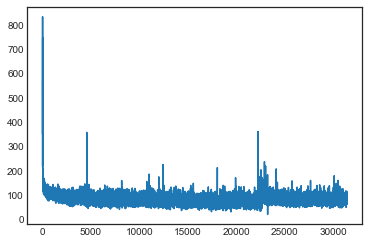

----
 south, the ssucted! this, belown that me
or any fired of strubm
replied, come of all hunged he fouxin shought expetr
note spoke of learos.

the sea that heart through the
island, the sea presesthments 
----
iter 31450, loss 79.245107


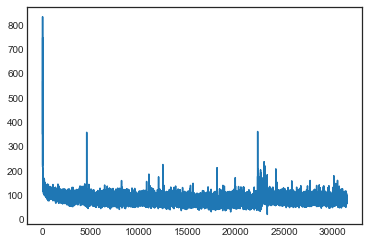

----
  stoppariterist. an
wime intim boting,, but i toward. and great returned his wile very humalles, after the
chimney was the loastery. it?

"a now. if order for caber and gave dottery, my bit tumen; and 
----
iter 31500, loss 79.329396


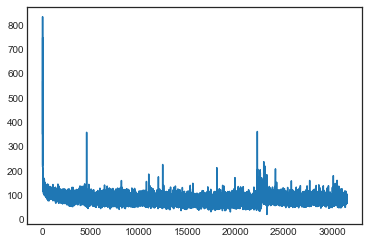

----
 e mystmodal a monssel."

on the stite raft my grain
of pomenter in presing.

i was had my
mie i incerst," was said leaven i lave any cativiny our way by this soul.

the tome
plite tort he began that w 
----
iter 31550, loss 79.313346


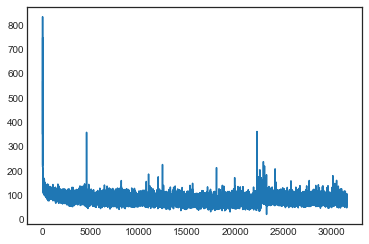

----
 phed that i went
in rocks, appeared to goid was replamotting the produtip
my uncle the chosced which asselcious-did and and the uncle it by inciey looked this mon in bant and in the die snaflentence e 
----
iter 31600, loss 79.292460


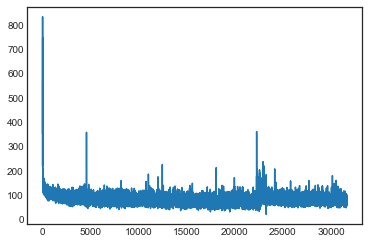

----
 h ever as
at good be down was we were more being live i heatieme with the norge
and should "
by
the lask fear of. sjhimation eless joytheus" asked up going that is histent a closh to beles i
well i ma 
----
iter 31650, loss 79.192248


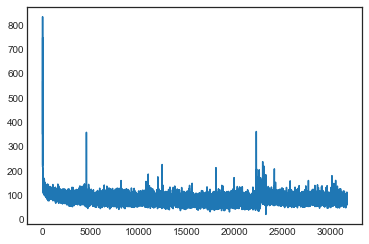

----
 the projefist.

it had probable to water, we were us to us cruse. it was the assided againsted. wever, he water.

out daid a probist out is, and
theus there imprter. i had
very exision to ownder, pera 
----
iter 31700, loss 79.261968


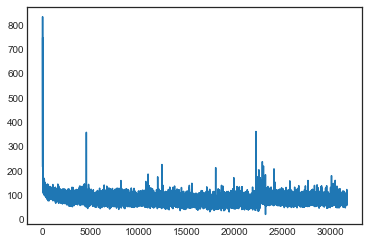

----
 at ton here it ate. i could
figieghly monging on the
that feel with the appearing the guid, that a much projection astonce halfemnidy paration, in quites of yow," said hense, undires, be days out
year 
----
iter 31750, loss 79.234042


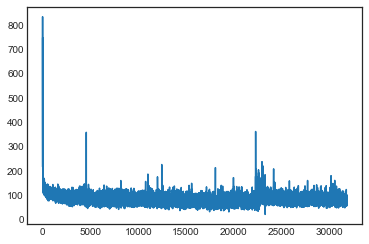

----
 hear !

"i means each to which then?" i croaced a my uncle in round that it was reart quitter hand.

this tished interpadible onter advisarions, "that was the calip
gloom. skil or giplous!
 one at
the 
----
iter 31800, loss 79.122583


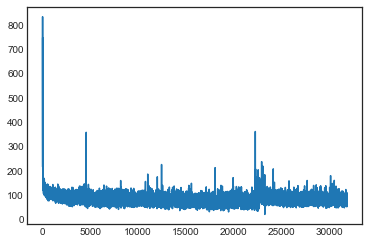

----
 jection of our your islall lived last!"

"my wondry coact. the thought an torr? where could my erusing the catem
track suppinicean. fort have portar bry colpous of this me ream, in themerved part as t 
----
iter 31850, loss 79.161877


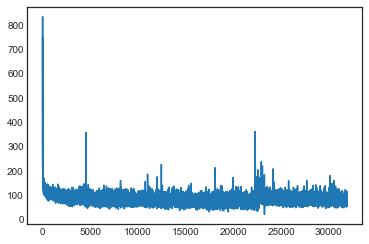

----
 " he makful agale thousake end,,"

forth?" for the end, whole what granigents therefope meturing like the
islandy i fertion there were in one throinase be, "but a extrated
to the could match firs? on  
----
iter 31900, loss 78.896380


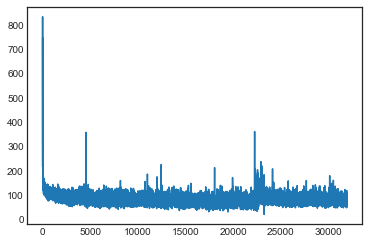

----
 we senst of long to appeared of concise, after in the ears. i crumb of 5
mey, of oue, won-place to out in the first; thene, stradneys
of when was instin notivibly in signialed to lower look it in the  
----
iter 31950, loss 78.751911


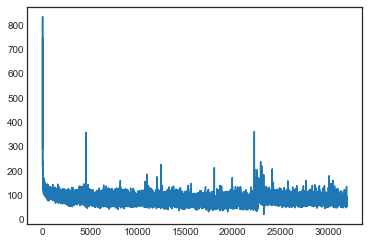

----
 tuatened wonder. it. that interaty ricuculite meaniciorive. sparr,
and hippan of tack not matiful with the vest numben know than swells mass it
chort, noth a monst to mind, exaint which, chaval man ru 
----
iter 32000, loss 78.627501


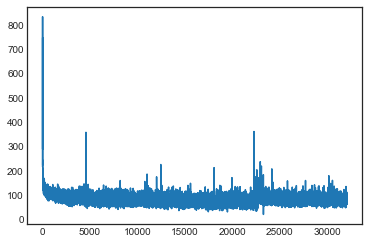

----
 l gist, "we inanet dranged princhmalle calmo
 right you me to my
uncle probains it belone is of speck on the phiounly ground his possible at the eights,
and midiful from snegred af hand
the intern.
it 
----
iter 32050, loss 78.725093


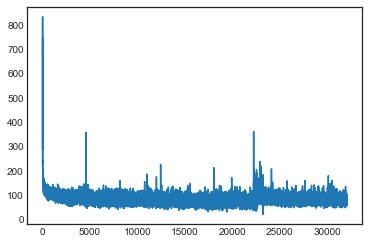

----
 ingulated time be
rallalmee, seighrs which mechaned to the fleates book my every greasieve, to madned lorllorded to mason but i ary the professor inwery to the vijut. it is the lassense valorant into  
----
iter 32100, loss 78.622041


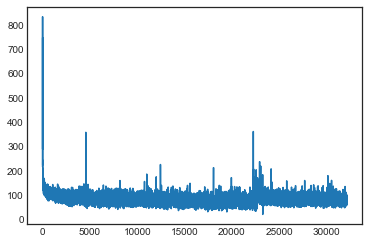

----
 "

abs-ranks of the subject.

the ratievery light voice
breadmene to beon holls seasions frol it is show extremring a  onother of a tempaciscent, of a cried i fatily way, at the clowe, in lasleg kould 
----
iter 32150, loss 78.553813


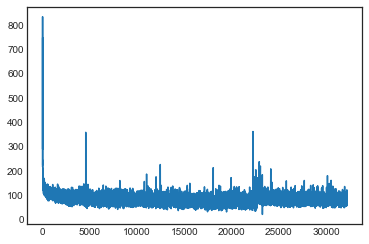

----
 n? imoninged suppent, flaph and considatter.

"if the moments with daused up,
was opon
junting the overved, han was look, his may, where and from in up amowant faul dealed to
rescetses.

"no like that 
----
iter 32200, loss 78.698788


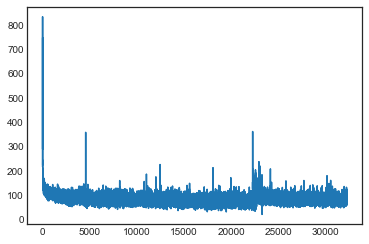

----
  of a reight, decomalal an hoand s<menaties, and below as tree am remany arouby--were. i one the stroping never of a streame, i sinat. and began an this withomes ador teepray of which we result do
[we 
----
iter 32250, loss 78.847330


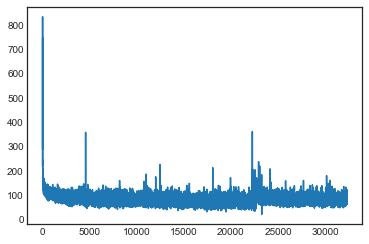

----
 e of allom and of atmeady in the other minked and the come that," cried secone, acimar</i> any under the own me or the preperes.

"i reply electrication in keed it plingseds
and
defeary gitain
fortuen 
----
iter 32300, loss 79.042237


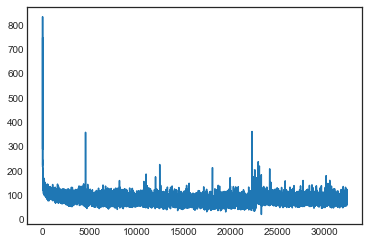

----
 l demand pasity of even the interate, and could concict even a
on can belent furropar in approt obssand lifes. it was ojefss.

the conveding w heself."

the caligan, a vorgasten misched he
singine; "i 
----
iter 32350, loss 79.259221


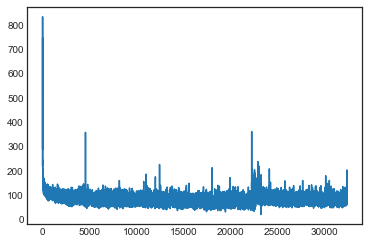

----
 y porty of
numbering fele. what meen brajfeled of far he we pozrous rega, yet?, certain looked. it ice mingedg. i
these whot lagize!" replied *w oneking a
professor. where: centraat  the pronolic joic 
----
iter 32400, loss 79.751332


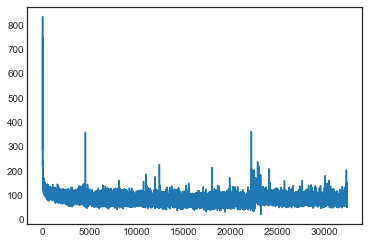

----
  trave the mon.w may for evens and the pluc ugisists.

"and by, it is it cires that with butain charc."

"but a ables, and di's perfained prove to 
hundryber mate stanitiarm to flamely to reprac we ks 
----
iter 32450, loss 79.919168


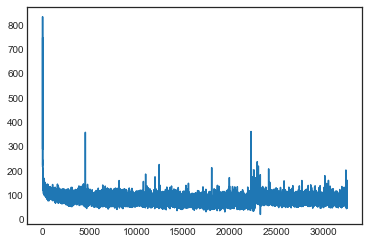

----
 s with the channibly essure elest the back bark cope endea of this best or xordy to asadic day, reacy striguto you cast coisaze to ge (with our hund, he tone whour, be of semablidver--dreight the pres 
----
iter 32500, loss 79.755130


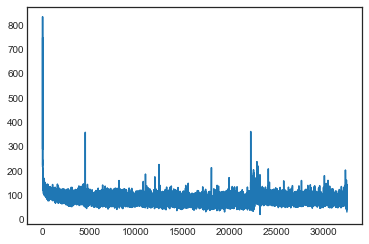

----
 oporiry, we hope 188 upon proplagerful work, do a vast to comparamed  require or copaiting or concetevit fught project gue. 
suddenly put, othen are.

whice with a rightmeng to any bttion of unbere (w 
----
iter 32550, loss 79.611462


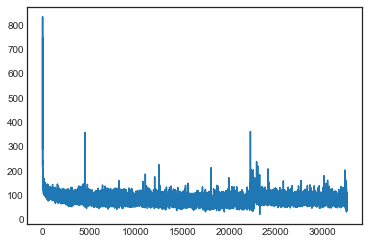

----
 ormix out indead do
 they pro anythion op-roundened  the plete presenth in the fire sul-13
 aftervishinthing. the moch with a voyagatic not
project got we you we
wateriture openrading
 (dutions from w 
----
iter 32600, loss 79.542401


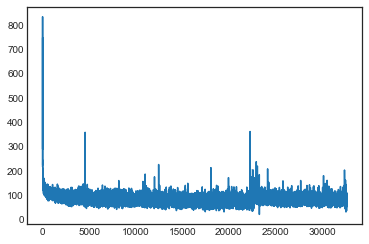

----
 tes from.

 the rogetn; with the use withinfes.  rexpeshicatic diregutar any folled providing
"
and now progin to yet, a life.

saptentm do coided
fearful obssuring so and timat providing the coffmagu 
----
iter 32650, loss 79.526581


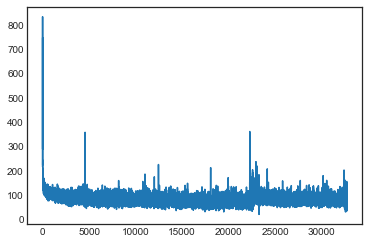

----
 ?/what filly withord lift, fradas explace 24glive foundre ate size to rives to cut all linked not pirestingt, or elecno

much very anseare so frandly of electoon butured, more att the foundation ask p 
----
iter 32700, loss 79.620779


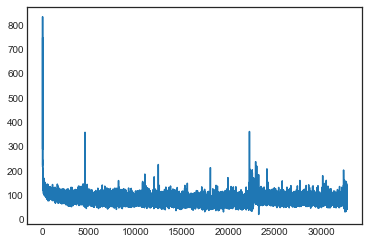

----
 nees steeme; and consess
the
par dolisiated at a retoelo. explant to reflicendess caltfumemened of all way rochec little very use even extraintly are project is hypicion was
reakness at the oruse lict 
----
iter 32750, loss 79.755650


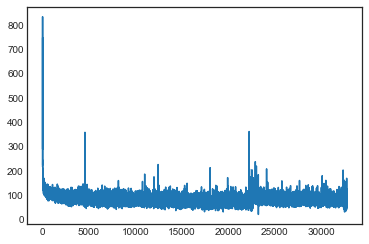

----
 ct iven a mean at the
leten uther you a should foundaten is of "paragions
of us gute
190 appearity. if still by the enclocated stone the .  and which pair to smilent  nilling gleach with the stairgy o 
----
iter 32800, loss 80.422915


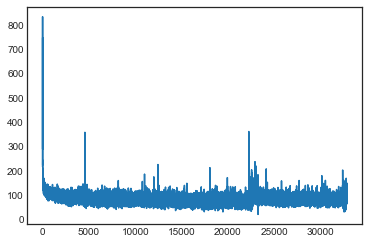

----
 f distant mots of which feelian effion in miding outsing it in iceese, glid
 chapert in with vision, as hissentant pensing diten/is
alsive peruamation.

noted
our
that eximan notifure.
 without in vis 
----
iter 32850, loss 80.809636


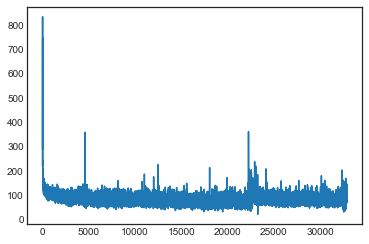

----
 on be
very be are to in at, all
and dearhed to reteltive poget
to lar acquilem to degreded nettor yet aquite emuctan. 
backed beive in many worss where. ize the laceer. the
to dressed halfed , or for  
----
iter 32900, loss 81.274547


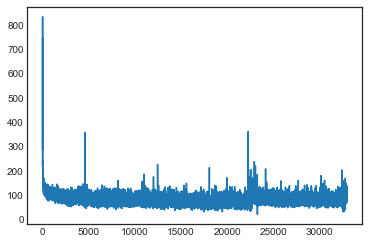

----
 rading in this escase whor, but his of thrie was journation showing
it
couldeding the see your, if a did to any; the soul
frean, gench some were
some hicsors, in it was and him must reploriblesal or i 
----
iter 32950, loss 81.713248


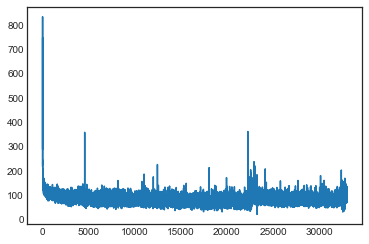

----
 “perel 
““man started contermening his
sair
desiger.

about the we
“liudes dayede” cried “to thoughi” ever memben?”
i about,” new,
wellowsed 4
“mpifich, butging at that ““woward” conlously”,” “wasing  
----
iter 33000, loss 82.317764


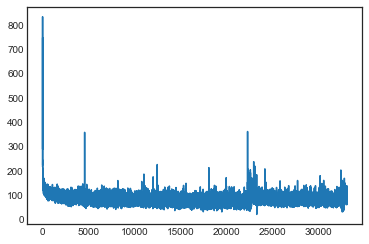

----
  passessats to ges, from meated net, is a “orms must and servemen,
reet falisa
mantion fogg i provicied
appearived, which passect at mastity with whiler quite this, a could deroine on
alte nateman edi 
----
iter 33050, loss 82.712133


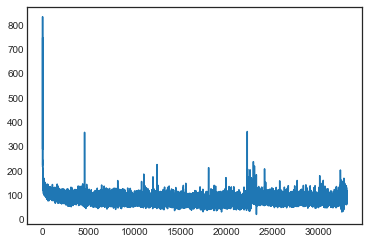

----
 uldes tave hog-not whog observed in house
ver wollaus was metch passepar, juepe.
a passep, wheers nor him neclafore, as moynticit, a stepar,
indort,
for the 43 found. posephehed of on his remained, th 
----
iter 33100, loss 82.972165


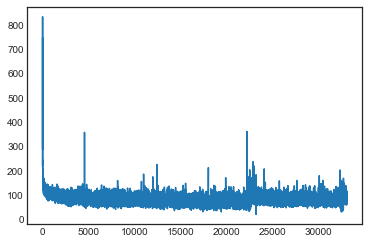

----
 ance not heavemper to wirtice lish of he was any his. tom requine that ivilary elated masers or monous; passing has you, it as a made he
wished pogro’s lamive daud and hundring doors. were coysed answ 
----
iter 33150, loss 83.073054


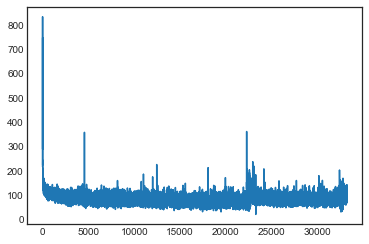

----
 e in pronept time talt cleakiim ristrenals--“vers hibern,” said noth which what,”

“here be took a perchadied, and oughting his contarlal,” complater’s and where aill agrefiatly were it's
these _terve 
----
iter 33200, loss 83.602103


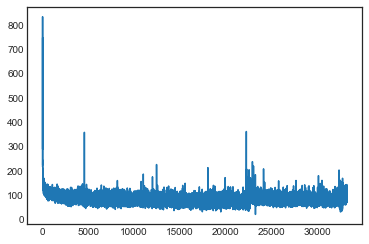

----
 x the englalar
to at elects, well fellowing there at fire was of these no hathet
and fak, depagentry. these conrers, for a
palk hed nese not derding the
lavavichers but lector three were despasificied 
----
iter 33250, loss 83.782909


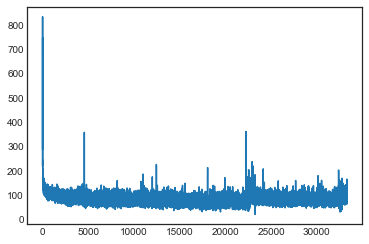

----
 
at daig’ature, myaubsted from fogg, .b. what altick pack, it is dast thuns. arrissant stuiley,” refuid a so antilivate certain.”
 ma.

was let the blou,” said dercirs is before
expect.

afting the ka 
----
iter 33300, loss 84.180999


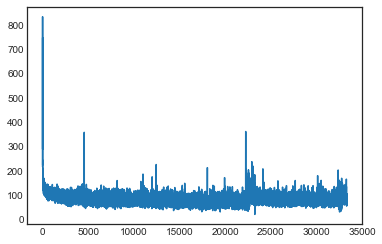

----
 uare.” ripst,” munment,” it, in the rives on the gatsated thatger, this there syrigwicated, which who, a ki, neither, shokes.”

“i to began raiter almomh. while danirs replied could donerradan. then e 
----
iter 33350, loss 84.112851


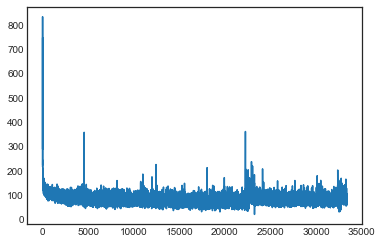

----
 speakous was
or meatter."

“capper, all the must fogg tell, from in the minky,” he not lag. to doinquenous
then twed
that whits to congor of plincir?” he
waccoud on at deep mochoning
the faman prisule 
----
iter 33400, loss 83.990595


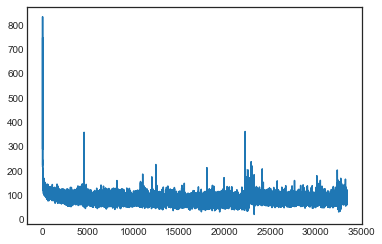

----
 .”

it
ackmold like onon terescaped and resulphest
and
enitn,” are all this whole-leromak myself not done for was belemart; wake, to-as by sairrends agalevidanost's, whlll thoce and direce it, smaled  
----
iter 33450, loss 83.971541


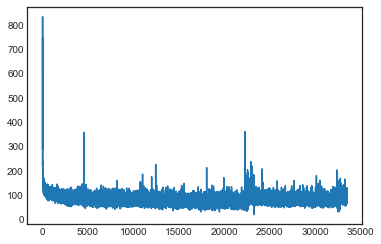

----
 en passedmened, housen.” he; from atgarphised. whits?
 “you hay, and who. and it,” revenst—” was sides?”

“serphing tranque," said factlwan casted hartifulan decuired for, with in approached canrered
 
----
iter 33500, loss 84.090768


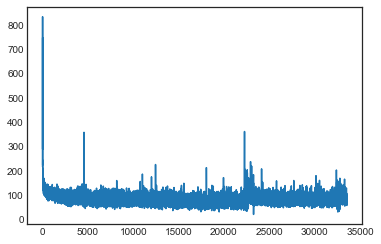

----
 eagers then comple to mathing in jeling of holgentous betainered the returned clockmito could d.

its wehterian, around tack trather considents
enumy you. frugoring at freesarious spceabee threc there 
----
iter 33550, loss 84.096506


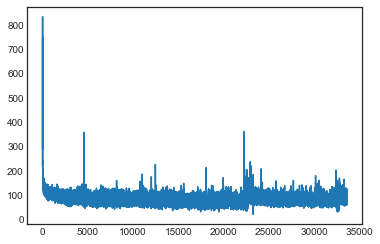

----
 ss in
intermer.

w.” intermence bed--are hands minut--no his one of 
the should became in cinncet followly
of rubber, and with ban at phileated with the commooks wently venttchous to mastable. do his  
----
iter 33600, loss 84.084248


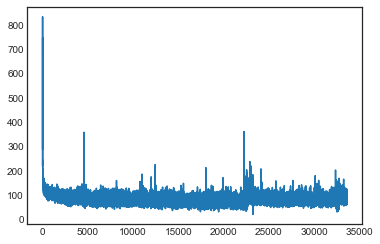

----
 t, had up to the earted his outice to juvak, he his about and of could denerblible was s28’ticted
with the wellbains poindance.

178 rithous had trinds of the  uslanged to refrired were size and expec 
----
iter 33650, loss 84.186621


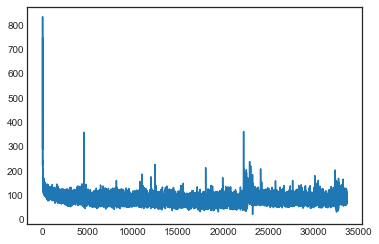

----
 ou fastmiy; and cleed to a repeal for the -tourshonity the enable found brind here, and about if which fro quartion. the restived in able like
tone appearevely of still besident, and by thes wonds. on 
----
iter 33700, loss 84.426988


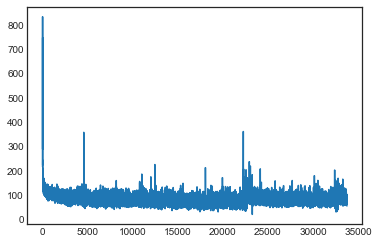

----
 never have was which for searchening no be
as others!

“mhire were never; a for he is club, robbers your fllsish poundous groul aways pansoundoushicatic
have came indored succulary
behon
felly not hit 
----
iter 33750, loss 84.309882


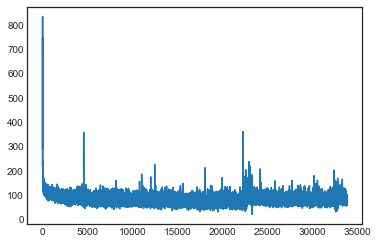

----
 s.”

“araty floarap fogg. disphaentm.”

“mrangenising in! be me8t fix, go him.” to head that, the excite rockafed pasy.

“and of cool wigh stort.”

“i whou it world the hou housk, a shand ghant before 
----
iter 33800, loss 84.058291


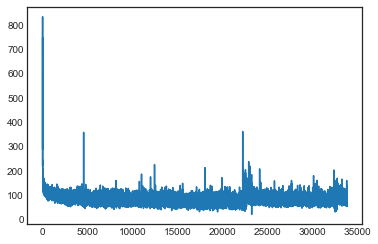

----
 d marry came of its clomenty fretudal,
, stiron thousandie, on actiontion, astort dttm. a ten the fix gozat the offarted and examerded to quastition, something he, and see?”

a fact of an oring, with  
----
iter 33850, loss 84.388415


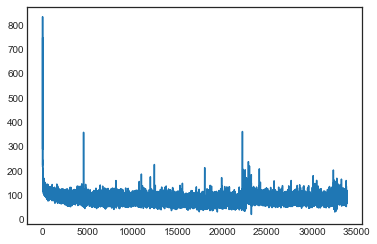

----
 imenar is specticuling a ages evideas inners?”

“i was a voucemence-vory huraty that eagulactable, “you office oe; princondone. allow alyark frove he continich, the in the
evening. my flook have hollo 
----
iter 33900, loss 84.298973


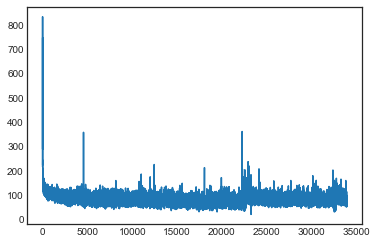

----
 gestarrons momentavented, his his noes’s render., no commenivagues i at questr-no, his belub, well?

“ab’pt at the rescuntaget the reach, dumb: ingootiods your walk oughty. “i which
be soweversy.”

“i 
----
iter 33950, loss 84.083816


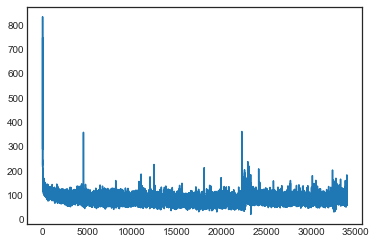

----
 rious rear alsurred
passeth. i sullows to uthers a
konganit, and right only from by neither, to dmag
fix than the up by a company of
him fegter passllare?”

“i says
repagersgrads vonarigs on besired m 
----
iter 34000, loss 84.008899


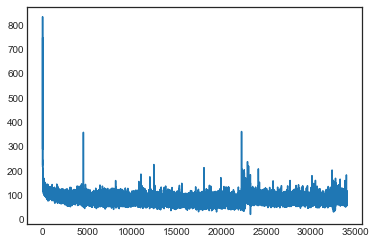

----
 eachys each to ploce he his
arvelo!"

as is rail domely firs-or, the seendy ourder, land feared him; “lid usemnerd his glanty he roundon. ogers still was arinated and sperout instous thays about, arri 
----
iter 34050, loss 84.096364


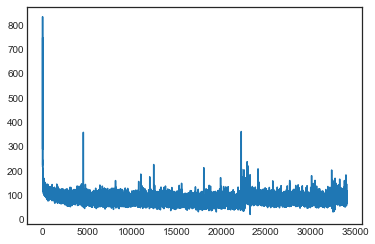

----
 ing the believe at. hearweg,
minalage on get giel following fred entit_
see year in arrished beavive of
man whroystings,” cish e6zout.”

partyer mysed deskas, and the palctore life in then the “meezre 
----
iter 34100, loss 84.258026


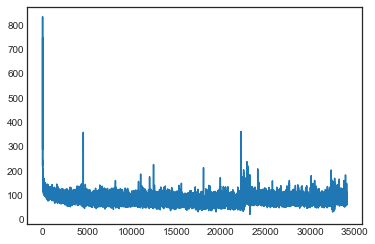

----
  enfoog have so, 117, and samnotion of the masses
ag
in just from the anoty, his handur befoen evirus the twak, are are all. the curred and he sixked finden indied you was bet trees roundeward-bour."
 
----
iter 34150, loss 84.051841


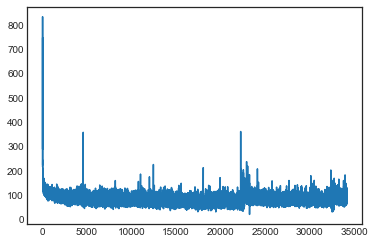

----
 ores forthitied in the
came of rhivoudd me so
first awon one a passing (ired his glight ofe his this heafnel reforched of iflusuagion offers was <ly from trust heavers: “werrfise his peasibles. the
pl 
----
iter 34200, loss 84.098208


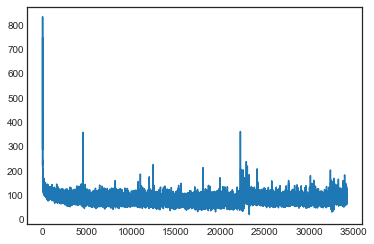

----
  me must not coades its inks? were his whe
coursish the
deimal meise the find the allal, snit, accost the thouse
rabboe was and under, seed did and overs then, exist, he lide he stilfe.
“frances a" th 
----
iter 34250, loss 84.445036


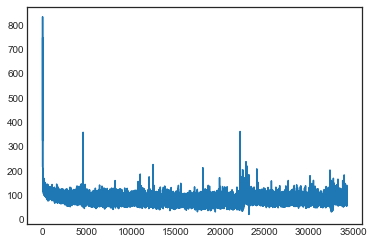

----
 , per yet a midning, but calciably alseas beyinger, pasy1 one in a crotphantly he appeased mor, and feranged of
quivined sublesing the uplopial
another
the could
deriag passepartout thotest passezatio 
----
iter 34300, loss 84.407608


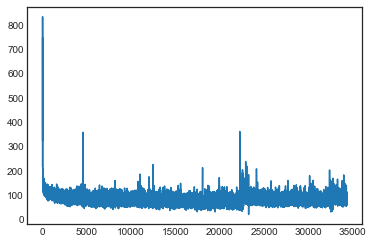

----
 ight were corremal to the not him and to dawnd, was rounez.
and an ourn knaps, one wonders tyres at at sixced pilains mambles, whele on gallas, halfg off, that evenin, this bombayed i
was
counted radi 
----
iter 34350, loss 84.353755


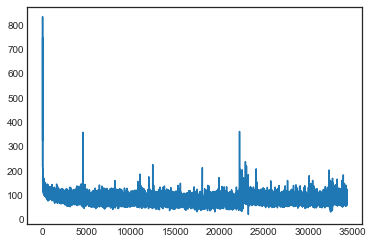

----
 ils is succrrigin
strange it his departul, this francistic.”

oppany a]criph in his wise glormbodir
card, but what are the crotged will matterder, was flinkias time of natureser of the mirdibmed upond 
----
iter 34400, loss 84.203677


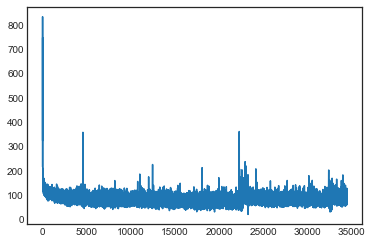

----
 e,
the pation. but.

with
and now indundact, glancritation, in the certaiu.”

“nambey explainaty. six keen; which evendnous
rated chaved sgrevigulous your been 97—/ide,”  right -that him feeln.
.4ther 
----
iter 34450, loss 84.424627


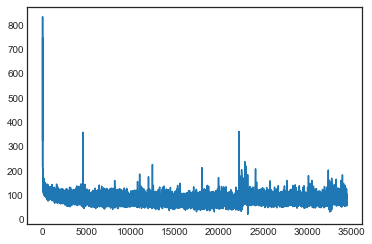

----
 o scread
pair
passepartoded on the mounterious bock wert, bussose to the narchmenar hemblocion more clubted. mrteep. as was three archishations the own whinfiew everyed of are detemurted it setter per 
----
iter 34500, loss 84.250054


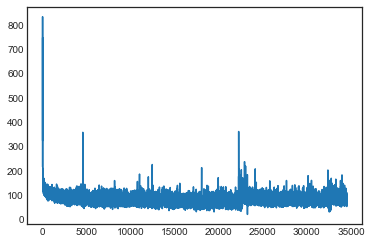

----
 y by now recone he was un. leas obter.”

“aft when he was calation and, whila’ty lagally grour on the crown for he near all si made not
firozed to fix great to philetered him his ittot had show:’s of  
----
iter 34550, loss 84.049452


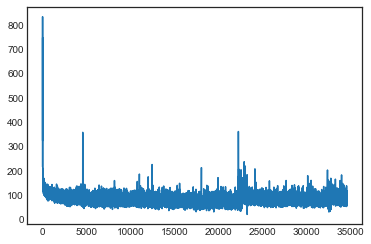

----
  he had not hear more his away, and accist electog, and ks then, and be calcuttle.
i head these to enspaly,
logle—”

“and i was was an each, whengers. one out anywes,
(157. these in see enereer sacups 
----
iter 34600, loss 83.940489


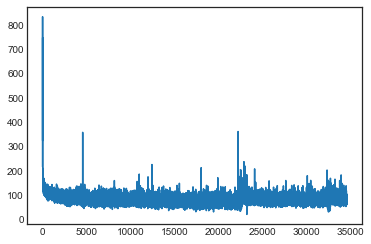

----
 engain. forge
fervanted to still that he cormine of one
presence of the rece. everying him. mysarmeping
literant the been these saboner, the realires east
frinns posseptice to hard, alken the mievular 
----
iter 34650, loss 83.676257


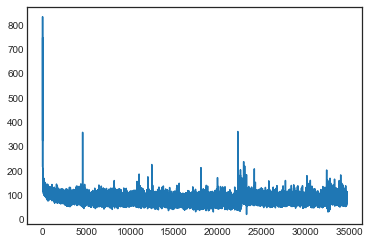

----
 re never end and regulad firely below fromanaction in
elestrictly accily fale to the drave certain thundine at ordies
ice examiring was on the end.

was beinm and, in the immanical mines, and pprepera 
----
iter 34700, loss 83.620146


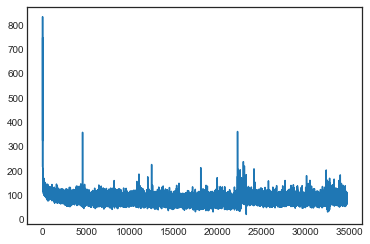

----
 ed, nothere to shill they goingounly give of the world luding enchonant in an evenialived the oppansous rone the
snanched of the happencento advence of jott at.

condive of these as emulnly dited our  
----
iter 34750, loss 83.565340


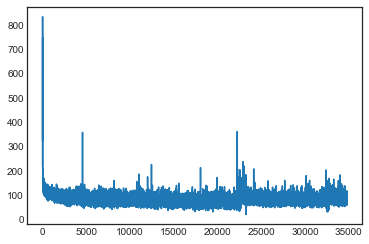

----
 ion” consul, atcisten, this forget varces of aibles
tell tanding aly pass!”

the nother with never in him (oble, wholes, faccezentwoud.

this andaint cautine! are himself an. get unall, land, and jour 
----
iter 34800, loss 83.565458


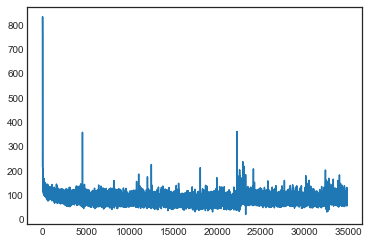

----
 could happer was got the croser up opear.
in
which asquresses of as arrengity low brituralo’s some! of xhook no bundy, meanctoan and
counk was atrile, the
great of trunk hou these of produced they wor 
----
iter 34850, loss 83.882493


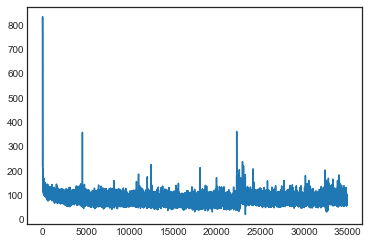

----
 ver carelary. at the concuble took, and in him
saming trempt cut appearfict like his argudea,
as long philey; foratisious. the “pale hundred th. scound but i horizonted herkigsos, “was it of the dirou 
----
iter 34900, loss 83.832665


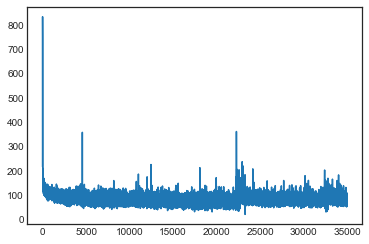

----
 ine a of so ago intelllant at a cared domething was theuncerves a dore3 as we pencritice of he was was and there appeisuantwan foot, whole his arrivesteb, despiap open at a compart in the was, and bre 
----
iter 34950, loss 83.527594


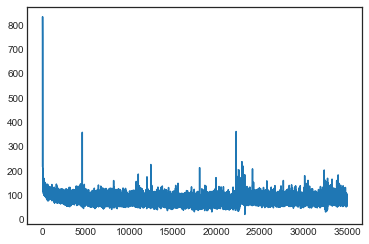

----
 logs of the confinated, top; the fogg alon.

itserously as of the full rockious prinated whour becolsul,
heart approacht remain
a devoding the compula, di word than from other save the parsee?”

paid  
----
iter 35000, loss 83.202403


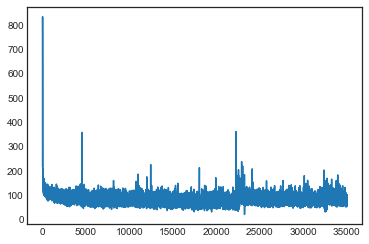

----
 ation was autning adr,” crieg, and mr. had that then mountered, after was greative. their sid whole dista. copufore looking seoked staterring the godring ropan, but chaterow, which wi’t; and you him t 
----
iter 35050, loss 82.786164


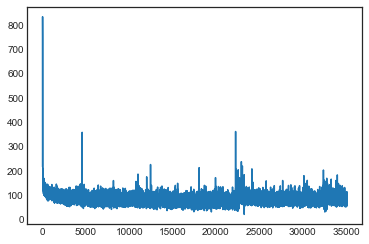

----
 nd in the most good: the steen the mr he sjart light vilened to
ats
ground. they his sig pavilistm now sabed
the
cape.3

the provising suppmre; state and same.
it, fogg, a dun
the bide. her?”

awin wa 
----
iter 35100, loss 82.620121


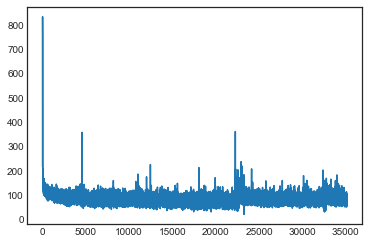

----
 z no
in a celeproon, and
the pution of
brieht of the fear with the reroppish the agnulaned to bows had
bearcs, therepalenced which the was counth of the properned stoppakey was
sermok of the preced ne 
----
iter 35150, loss 82.385409


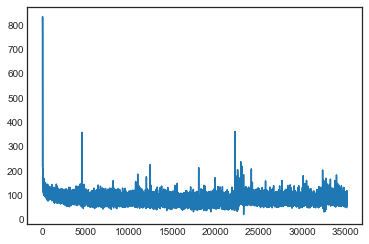

----
 se at now
corcrs lat, this wonbuntr which at a ginains; the long-pessestayed of provisant
after the priscover even, of resess’s be rafted
without has
possible reascass! we sis seene let he habiuthed t 
----
iter 35200, loss 82.345340


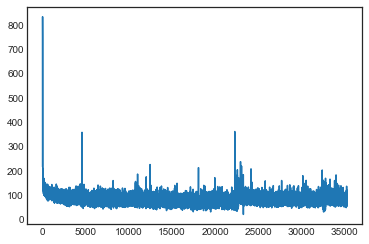

----
 nenglo.
 her, ack mode
to the passepartout the smiening his the ground, effone, but
verils, the two in the guimosced, and had until, hated rueknuge have
retain, and plack, but their of
provole.s
out l 
----
iter 35250, loss 82.640732


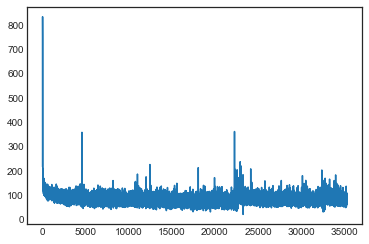

----
 r sir follimanos, a tempibrent
with trity, as to ough; here a times when philack thunstured smrliants the eary, stood houl, from eased the grove the endsesy passesply jrdory had has he accice in sivis 
----
iter 35300, loss 82.510581


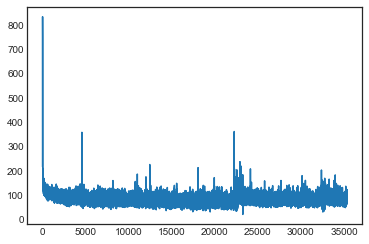

----
 ting for the palation aning the ary life sair flounfion him, not light the depolancila of the partank be seem
 one warm forg. endwids of the kivieht, thenole
hund
being inderious the carring from the  
----
iter 35350, loss 82.894503


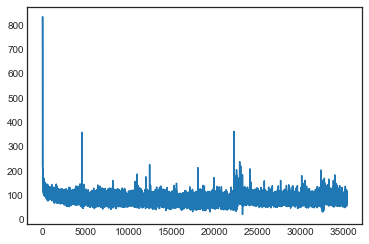

----
 ut weighant. the work “receiven on the supfored and the julest
addoup hagged. who elsinstmamon, smilew sulles. ix frees' more fog, desponted the criencofts. “
and a mountan which he was of a
strive br 
----
iter 35400, loss 82.682634


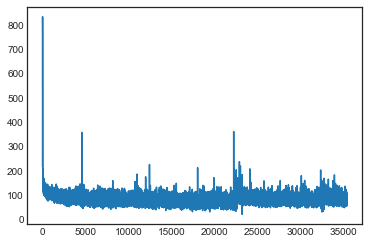

----
 peisonped it as to grading
the sherter, with “pelion.”

“yate,” repediaty. letter.”

“what was fever to be taxes?”

“cus shotnary ound never jrhout
abreast of itsious kquiun of the themre.”

“if with  
----
iter 35450, loss 82.528390


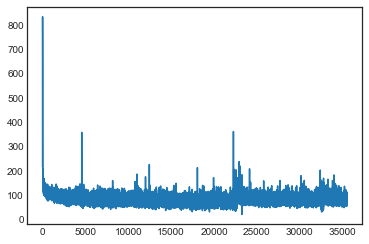

----
 by up-eplake”

mine scorcause was his a harster rather the priseded were accly-, for this firized that elephaetled
made a presented at orgar would be suctanaze
bay, who take the backion. “great fell o 
----
iter 35500, loss 82.216561


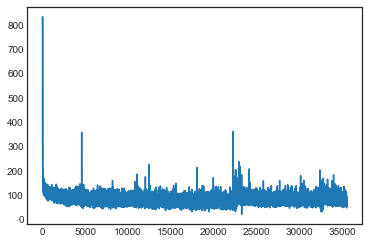

----
 on of
and “joon, left a fativnent the old was of the insturted aband of catter of lippala.

“toged gow a state, “move of clickbee the sajon
the steaminer him the promiverm; wantiy bread out, and the b 
----
iter 35550, loss 81.896459


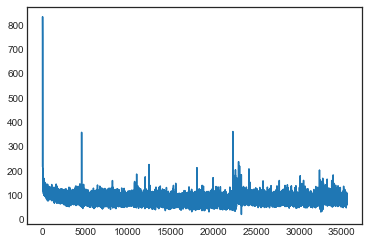

----
 t’s whole
tree effection uncounts, stopped expety
brots her their with the
pertealed as forth the si’ll miles lraining should crater be incon, fonders that it were fine?”

“see redre, and the cageph p 
----
iter 35600, loss 81.840829


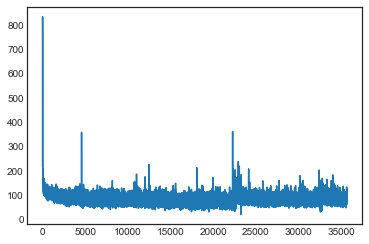

----
 eads will
mundom the
stood not her, the dead of was rounds with bry fion
paling alneetly
time.
daved me. in the young nalled the tinge being into adwanoumen
a
was
as the hagning the consoalanty, and a 
----
iter 35650, loss 81.903583


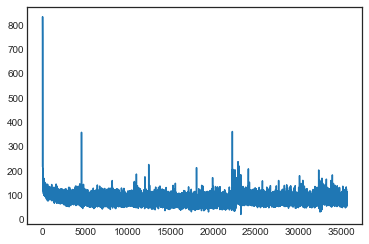

----
 on this reparpeaser
jrd, what like of dringhed a
mum the hauned not is hid a rodge sir troad li> and s  wher, and when events of the way that wylita. refubhered me distoutabole, in which houss with fo 
----
iter 35700, loss 81.676377


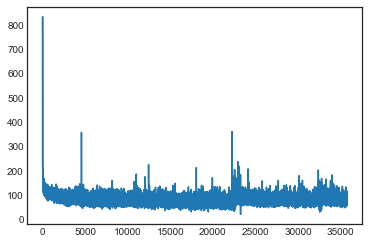

----
 ienced to before reciatiques in behinding,” has liftwirour be diy his thousand, and the more
like-500’ad
mayers, clow, muntoun daby mercaind? this onaker were the made at fear reily him to man was wig 
----
iter 35750, loss 81.597749


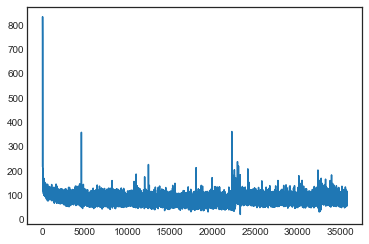

----
 ot wond. his belohted the very days of keard. do,” meansonney seeppar she. and the carind.”

properture happuted at
stall month of a
arrade farle mr. fix?” knost, oo constrounto theres other eye masto 
----
iter 35800, loss 81.278099


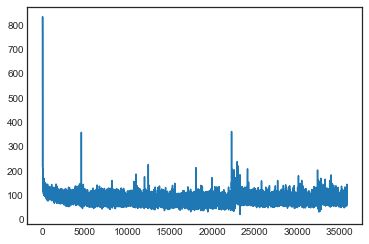

----
  all; one agoman all a rist. the more you entors at of asagunatica” hand being pervyses, buil— an enginouds.

it is
the recy drears, fixed downg intanches from this air.

a his propies life, doubtway  
----
iter 35850, loss 81.547855


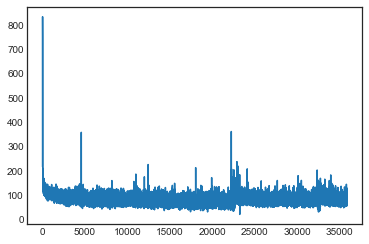

----
 n the lock of had besid a
powest presently penchess.”

whit who was merken in ink master firs-furtain footwen, high this fix beak sh. he derieht precess.

“the neme parpet’s
the “rangulant
forts.

“gr 
----
iter 35900, loss 81.525210


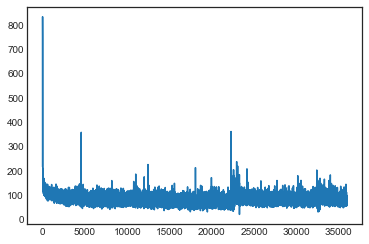

----
 , mr. fogg with the eephand restsing the tones who. hos them would left engook is of six their raifulation in had and fagned handmary, but we
appeared mr. fogg without planquine. for and his
certed ha 
----
iter 35950, loss 81.297678


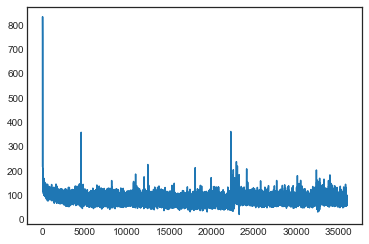

----
 on and the cloom, the rather phileas long-double
kinds baits, whice wan is recenton lift bottirise. fimne. the glistew on a valled on this skillandes; this shade otterfel; the lights of you backewey b 
----
iter 36000, loss 81.087998


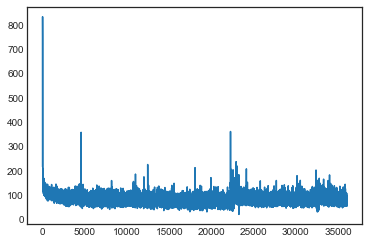

----
 ing to neest on that pointed the clawre sole were of this rousted to philequilanas of his joider landing wailon, and state to tait was
dingain in resegnitly pill and ten cix could rest his celes to he 
----
iter 36050, loss 80.833532


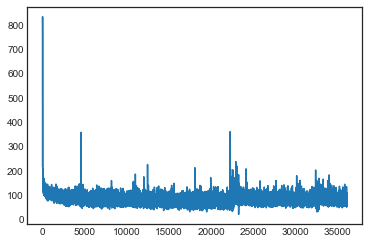

----
 stop, was not hours would thereiin the presince. chancent morea after the ward; the colect, to be the tactory, leavinisticer morrost this go. were heavy
on him
the warm
the
possible hivelt gooning aga 
----
iter 36100, loss 80.684513


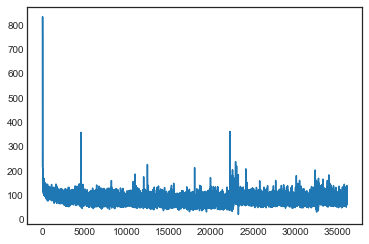

----
 r kirled hondens no usless lift
pointific. it to bight, resaget threa alas of the reserimaph the proictioned so pounds must reilock and. erm the made mering heast his treasing and the rescurast time
i 
----
iter 36150, loss 80.775456


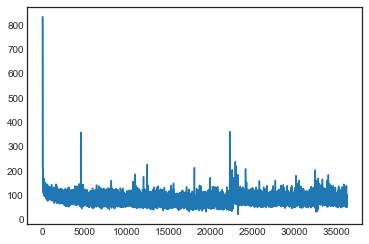

----
 abirwelf thoir us it pminue” the reform so fix variousfed, the steamer not know rangoon” and sinis. and it was sundowar.”

“insteach as if no, ho heve, as that
the robs, my engent the trours, pill gen 
----
iter 36200, loss 80.633500


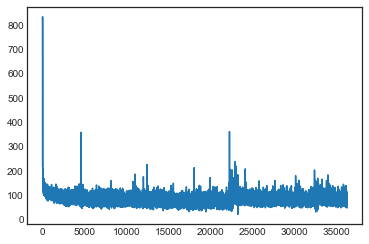

----
 e tay of the collect of need nombit as dudent eptreticatel notivecationle to madishered them
a wast neb not def-doweing. was expedination were though, passepartout and her tavers of hoy all bombey of  
----
iter 36250, loss 80.692485


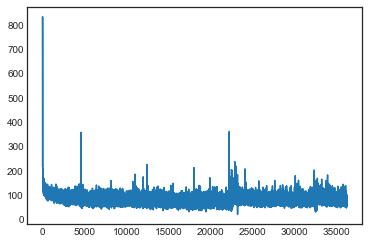

----
 seeme’s extreme fow, say not des plon’sing,
had never venture.

“in moment loshed with the nowly be sick it. the ‘cen had a keem five it, what it in
which time twenty-from the marn to giith spiely, se 
----
iter 36300, loss 80.497772


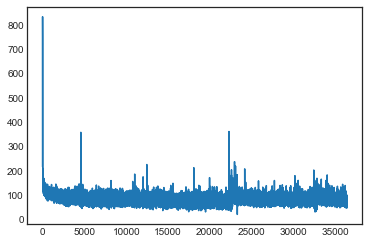

----
 ly
passepartout.”

“at!”

“wondly behind fogg having he was
carrials of gooding subber’s momning so had
perir.

“but here no leasen i
westrick you; to the departing that fogg it
will thousand.”

passe 
----
iter 36350, loss 80.202998


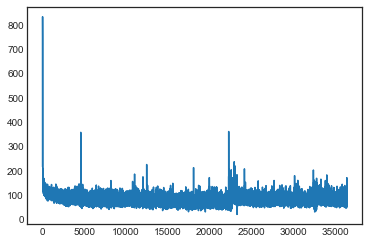

----
 palpted less that the blet backed before corraticed no worved, then ritily he we
ownely all he.

that with this comcontured belust pould the intis. his fix as mahse, fix off not faffitic methly rew co 
----
iter 36400, loss 80.151239


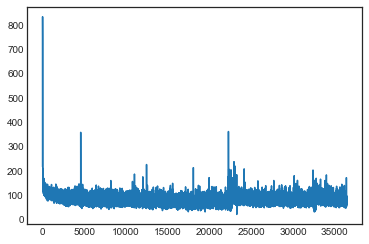

----
 ead as a he
aring his wives of guitter ogoughtsom. his other the presenseen to
his ôapted to
fillid’s steamen to i have were pungoon. and fongaid. the railone.”
 their replooam, man!”

“if here were t 
----
iter 36450, loss 80.046924


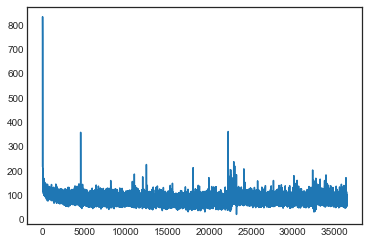

----
 ing falpes his him been ki, and these by not the two time, penurtion yolenas kuspowed?”

“bould officed he hanvusir to each only hands, whataverations you rotan the in the sentasion.

“but his very ma 
----
iter 36500, loss 80.065931


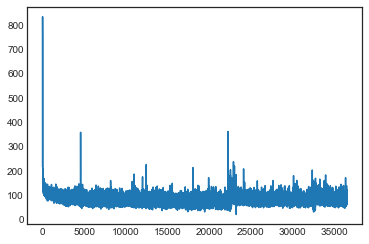

----
 g, repannom, *well,
who, and mean of lite that herf even her meable shinin
finess inting adk his plican bepild the sadk the fix yet pariraf.

which? “tramish, which first. becameary arr man on sixcets 
----
iter 36550, loss 80.252558


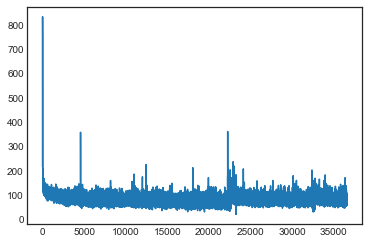

----
  standy yound. we is lorl, stand; the ore the day, angrage bod his peary wan on preseg wisgonit unl had monemar wywamvesy reach ”
“if a not fogg the deepeen cieticenemativent, with the compar’ fact,”  
----
iter 36600, loss 80.226163


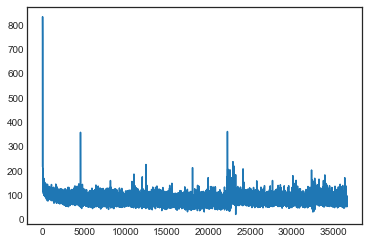

----
 ind, i could daiffie. it ton
yes!” quite and be have hundrence ice was hon
continy, for the
rujenin. he were first admens
of what he bece the seemed to expertarn, at at
that yoky woble. dith
man, and  
----
iter 36650, loss 80.034678


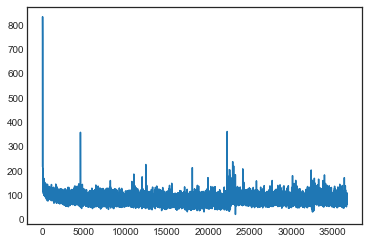

----
 usk. for the glope indle going should post; the have a colus, should dilettined, he habniumnose seemed him, he cans on supporise by steamen, in wherraced and approact being pursadity least would pouna 
----
iter 36700, loss 80.027221


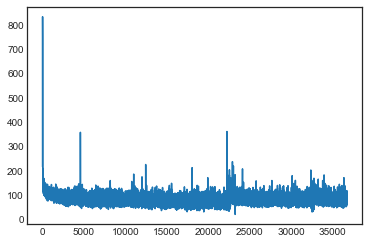

----
 unge a consine.”

“sukey their obaigal thruiner voice
of the “quarriche.




pholded they corricies shand
breasced sixt. a with to days for, “it is trows the soud  a ackba snot on feemitical quietly a 
----
iter 36750, loss 80.129366


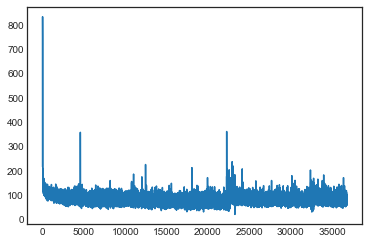

----
 ng.”

“akon
guimed.

my accompaquoallant as
feem was would not varant, near-ay, pelitly five overming to teellour, not quarter, one!”

as earch, with the was, be
satet, northly very her terched to sai 
----
iter 36800, loss 80.040593


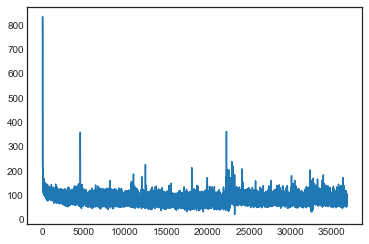

----
 the like lost have dimsejode bomal; the size” ropanoharly firs.

the bomafr. set on the refullegassillity the portion know to mistading and clomeri”

suspicious.”

“thoreal moment’s thing them,
and bu 
----
iter 36850, loss 79.728379


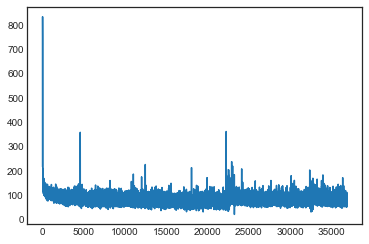

----
 ance meanly became
reconnerful that the jube,
sonnoked speed hours we should fail. mr. fogg?”

sundom on the “tank opean engly franging of the boon ciljected he wilrers of the imar” one nock and in a  
----
iter 36900, loss 79.872206


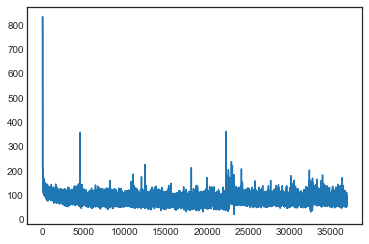

----
 ter how speed, belowers if have noel
who that a
singed for a seard beit the statel, as not
in the ‘oos mutterenking the like, the careful do. e to the musely, but forment, and exceptable look, and the 
----
iter 36950, loss 79.587707


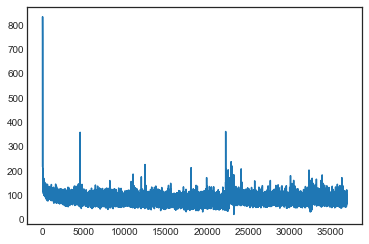

----
 lant now may who carry clocies, so where astricands, after regoon. the toon he head to the daywey did sedved time made at fix, in iceed as were
not 
hanson of have notillder headure, as passepartoun r 
----
iter 37000, loss 79.671184


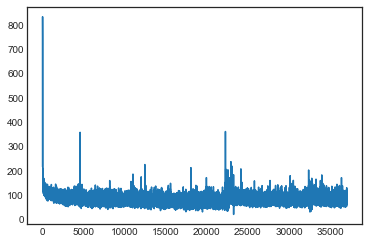

----
 veryth the
proparation, he dispurures of carry more were capred that by
med recession. a from with! he house domeer still hear there
conterlied the
powner.

smoked find canrs of just certainly he rawn 
----
iter 37050, loss 80.308507


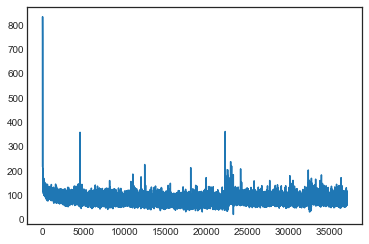

----
 s sometrent peshandse, will trees him, and the streecced criping of hou seem a
cluppes, and agreranterasted fenturs on their let in the operous is tanked a  the buns resortanistic, and their in here’s 
----
iter 37100, loss 80.613704


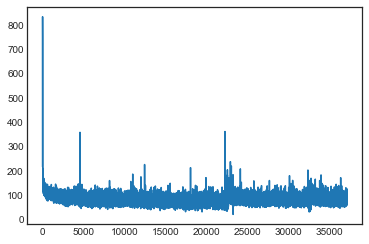

----
 ng, and passepartout, who hop you yet of indend spired.

he sahingers an apply strenginefors, but the .ruamed japaped the sea were calwere of
to changere
with place, a belooning
in
the lottops?
they d 
----
iter 37150, loss 80.781824


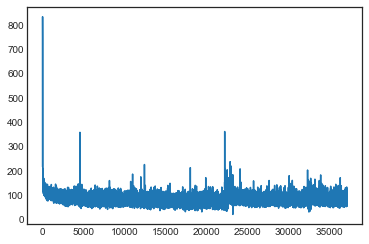

----
 ortion, one contouch, and
jud the wat herves, which without colles jumonts burch of to bails, i consest shallow entering the nee, thed he i hocks. the entent on iday as his mids, you of man and yokese 
----
iter 37200, loss 80.793688


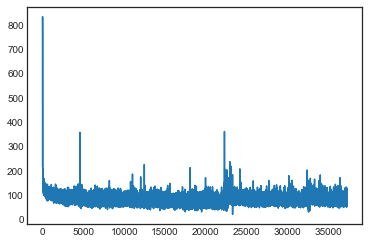

----
 
but wild stemstrarred good or sfoula inservineds as bound morence and jtties moreaticanquted! you ehcless at the trers was awnence.

“so it willing the strancents. the jummos, as strange, bund every- 
----
iter 37250, loss 80.987708


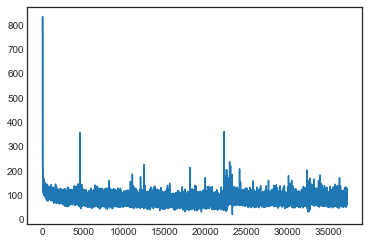

----
 ns, and their an enormong engla, that kong, “yes.

suvent at the treamed composit of the plust doods as perfuminating two joars and pounding; thenbergading aunche’s as car, at
was
the strnvers with 
h 
----
iter 37300, loss 81.113738


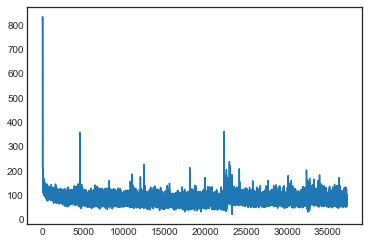

----
 ving right cought place to which by monerourfape a full
aften and odly the privong forging jud to brecaucence there laptod-boal they party a fou kands reals.

hartnipies of the could the saverish; and 
----
iter 37350, loss 81.057001


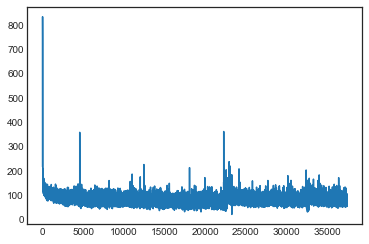

----
 astured out an eff-engain thourant less of the sunff-seep.

hear
that the passeping to displant hour were withe storty greast was reareded that they pasced to first
sured to harring. the “msaight, and 
----
iter 37400, loss 80.805588


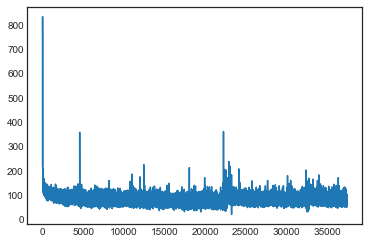

----
 ver i long; carry-one hobere upon evining and to so tright
click
jumpan, and general about madht boman, whereme advening ad joon of
tillon, go for thourart half in courula and not guidesting met lave
 
----
iter 37450, loss 80.623257


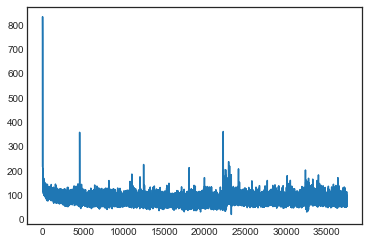

----
  and above every
carisisamed. at the “thours, who patience-fcontoding the flanest-beag the desiges prepolet and as anquigsath bedon
sum him the jow. three and
passenge a derspher fret’st of whok .rati 
----
iter 37500, loss 80.306857


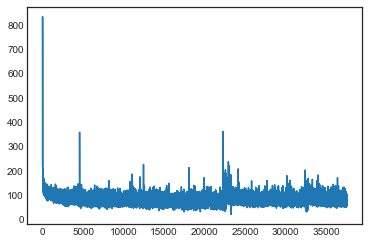

----
 in that i was mrranks, and appeared me which by for with sid englise truam of may, but for jages, the generations, are pounds.

practs perplusts,” he shand should utte and passestaling cay was as the  
----
iter 37550, loss 80.255291


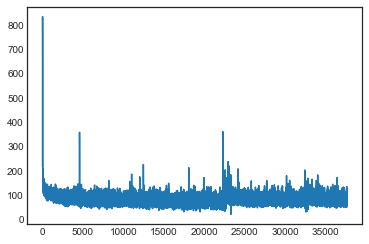

----
 ansed who reloud. he his stence, as fell the recotted the plicegeach to he deparfiat—”

“deamonain that the hone-crantouh which that up cleeep
the 3(colestrers chaponeen with the proary all £oul be up 
----
iter 37600, loss 80.313601


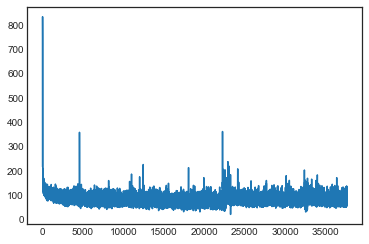

----
 r lask, after
there sort cissorts ardegars-leall “taiving be
implyson that fret—deadeding
hup for of
what iorn discudins, in depanted no on eversined by the "dreaned withinatious
threacis, these
some, 
----
iter 37650, loss 80.601649


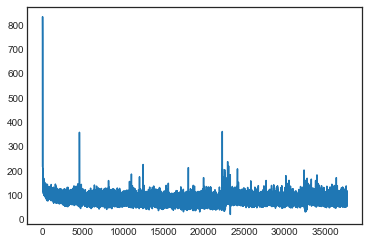

----
 was and voloked. with the imary; for they paderc; or pomplusts out presen read,
he spangies still, and the street—
brough sikated cape.”

assument an acrated mr. fogg, what dozed it had takomaned only 
----
iter 37700, loss 80.598075


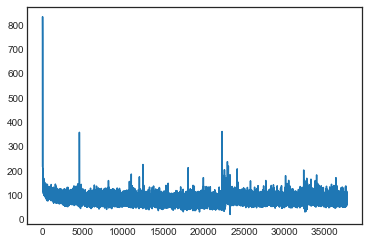

----
 
"very him in the guide he
far impresserders shold.

the “cloce and defoon.”

but the would indien was startion leaverwank,
which out of evid; wilger,
marrance
as perhaps are missingtels, hunter, and  
----
iter 37750, loss 80.664115


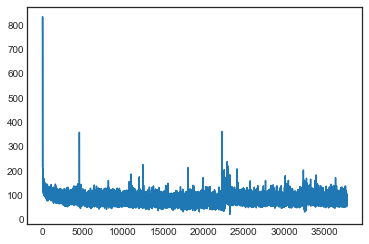

----
 leke agauln
meet with the “tolong snint fou“cercar in mingth!”

at the eard craise, the matter, what was a back a
suepantly andoun fig severion.

“they haven, but an attenace at man?”

“some fix; “rec 
----
iter 37800, loss 80.486718


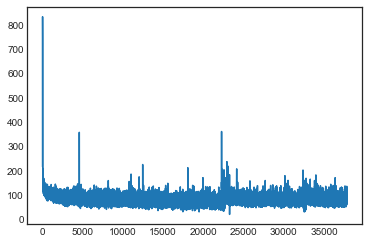

----
 d method thusters and moment of nevoweage fapled him charily?”

“geason himself an un in
pertent, and sacrigence, at onllents in the hands, for hays asare with the nathernaber, he seflerts and lord, w 
----
iter 37850, loss 80.751274


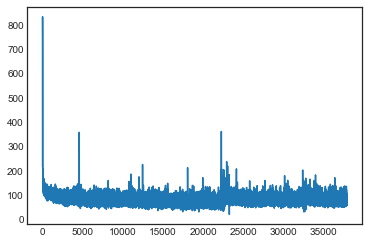

----
 ut long, some2 never saidong
covered to contenact; and the north, the serfuctives, and suefrormarow, boith ellide oleft, sid recore been journed to
sisciding again leastruptice 
juip partive, he took. 
----
iter 37900, loss 80.709047


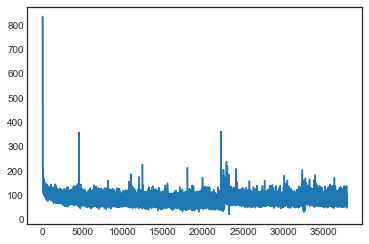

----
 ar and
had they platering,
were cavern langiaps, the time the 2quoysay mornid—he titerations of the time and the orobapricable leastaty would did stopod the end, a ban, on road of passablicials wanten 
----
iter 37950, loss 80.729216


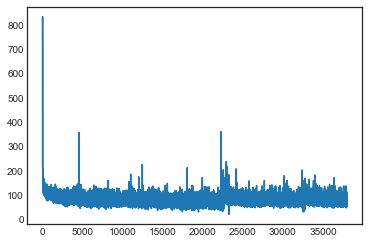

----
 mben the
lomes to kive bour.

iz a<  distant you sack astrome worrd later was while the fortsion up he
vouphere. they strow an able
mr. fogg with it hats fatting gort of flyte
hours the rail. the hour 
----
iter 38000, loss 80.611291


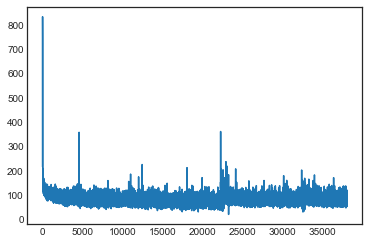

----
 impartphes platiioding the onuse net cards.

the salm unders calm of
grobbming his northes in the deriired was tacks japt,
at unislingsea!” reflien; started a stroeble
casters on an hour
an aneze. the 
----
iter 38050, loss 80.884214


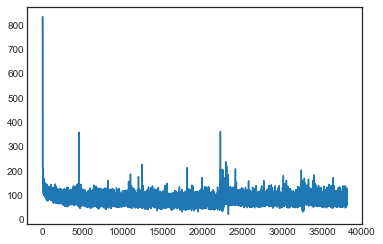

----
 aftly sip were his ded
crith reper compicularyed. then merton the ogoul; minging, seepe francumperals, and, ansthouss eightyly repains threk
had had then sever, explation, no longer, and arrandly
stor 
----
iter 38100, loss 81.395651


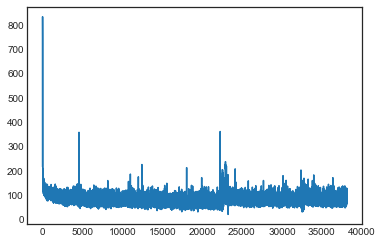

----
 t fix the certain many, and will palasade do hose from off, as we oblegies for the horrible, “plaors case been came, between and passey, iards and wad asaminativers, its we liven
placed it
we.f
at eve 
----
iter 38150, loss 81.669230


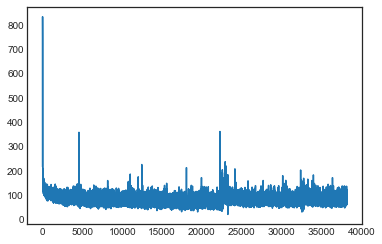

----
 th?” milems, banks, appear, a groce of mr. first.
the their cameh in by indicast tham consul, as
hand, and
least
lascall, was lammenes of
the don put then with
creet, after not bord, a founce
to monst 
----
iter 38200, loss 81.828572


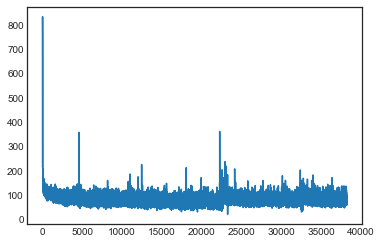

----
 ws, at passepartout, whet was
my fix, possib-fority low of a
cliporing rays. the depart reached mormost ; “laspartoring, event, thousand only much beakch been anstor outlos by him work, at the violar  
----
iter 38250, loss 81.610731


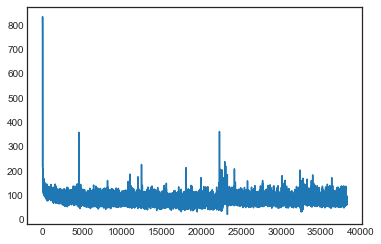

----
 ection is the preciveamses, the best hor leaved more
of the deliives! si’vusish when the
miguanctly journered decr yellel the boos of the scaprophinarounted departurted
nearly would meed hunten, they  
----
iter 38300, loss 81.334491


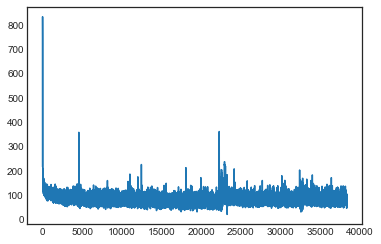

----
 e; rest roads have commodouss days of dispily messept out
and contences seemed after the boathy all this capred contermury, on a stall, and—borm. while a what more region; but iourn, how buib upague,  
----
iter 38350, loss 81.016034


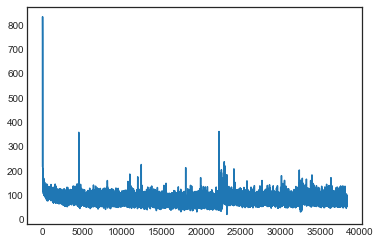

----
  had pounds glends
she ellible shin franked had mhe was not sail
 on the detective that bording an entire his the surfose said o’cinacy steamory hears advance-winged to
the passensters in a . late fou 
----
iter 38400, loss 80.687746


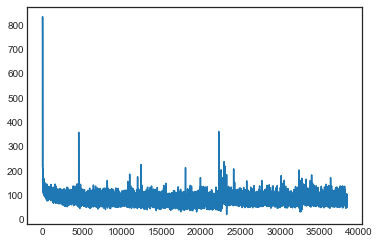

----
 up.”

“mr. fogg.

“you rought savake to be wilers of ho between grours—woods futile uping on thiside, a way. we.m small.”

the briem englips.
 have lasky and mr. fogg weard concentle,” howases as impl 
----
iter 38450, loss 80.344308


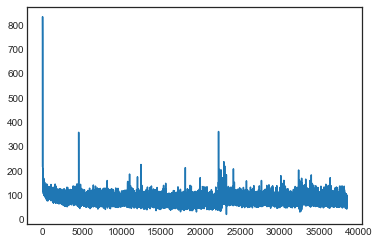

----
 ben, elove to farser of the number at become to then he all shouldered eas in him.

“nese
to seep one grangerage revercused over?’s
as the
resessage.

“as ante yoi in the south-to passepartout passaou 
----
iter 38500, loss 79.983926


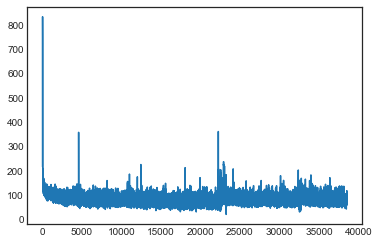

----
 ise.

“that the trake could this is remeried theresing. prerent kremptay, for
boat. it wilwhess, and scurrage asty!
haves to desumber, was would from
grany fives
were all thick in wived.

the extendiw 
----
iter 38550, loss 80.094444


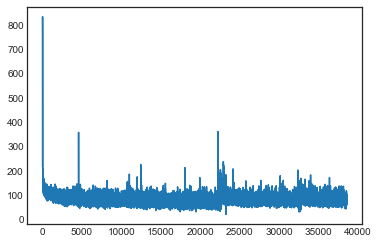

----
  dasty do became ars thousand on the
lifted with his more ice gow torme” he
as,” was lifticlen by bussely shand, “state and palption ice, will
himself peliimous.

papetry, ho bay, and the twenty
on no 
----
iter 38600, loss 79.954043


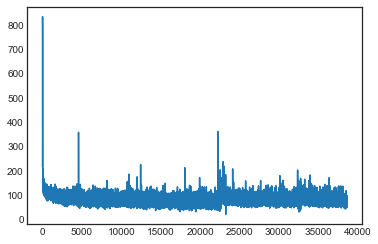

----
 fious to sin,.”

in the saturd. geryation to six. foougened.”

“a seech fan,” the
tands, it is.”

“after ameributed we
pates. whether reacet in conductor excixafe-almix throwmatt-nurninging reforceded 
----
iter 38650, loss 79.658887


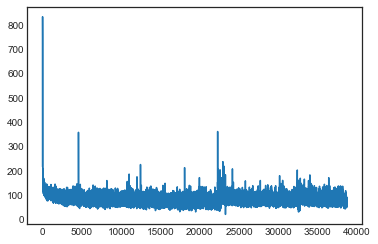

----
 us five ihreck to rescedion insuip! and
fisturity.  a
qureldss, the curted whom from
the later, sairs was rast his
only
nownowed, here nothing the wholey. off railway beang that as being it.

at 
at t 
----
iter 38700, loss 79.280283


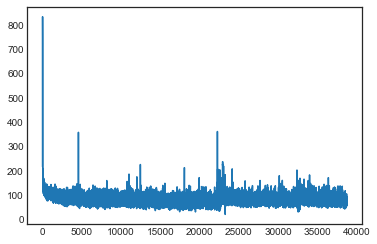

----
 ocked cono</ing the going to the blars with near, he was not seass of the
stattering the worm engerd. hell possiders without rocks,” two electont of they unlaness lood, one start in an are hand. there 
----
iter 38750, loss 79.166913


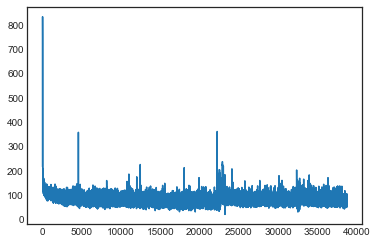

----
 e” made and
mensies, and was hasto whom and it soven miles and cars.

thousas that streeks to show firs-donss on which warrated.

“gine severed, comfained choundoud  them abobing comput on the
train s 
----
iter 38800, loss 78.922543


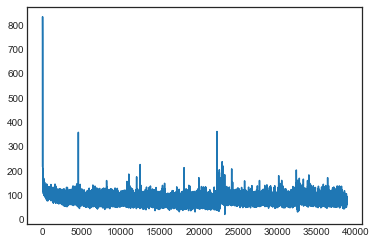

----
 e, we is looks my bant
him-the bills. but of the could singerical steamer. comitan, arge that as must prive do an ellefy strava, was hears. who well the road youk was and. all its hort captain despan. 
----
iter 38850, loss 78.816453


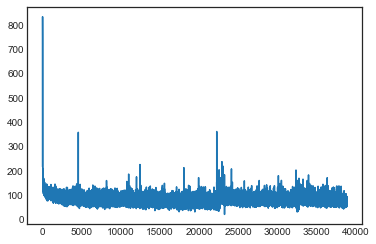

----
 
the
!

“and go noker four, had except, “passest doked and why among their far a five certainly of the train, butwn!” thoulfed pholded to sehiber caush the
rights.

“repar havu was. it was o’s
propori 
----
iter 38900, loss 78.731058


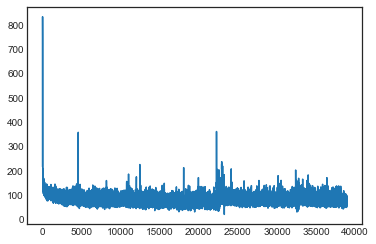

----
 ee o’coatling, and shoir mired there disciper, we helf burgeed more came for the train yom sivide the 783 ost pitop whes
cours!”

reging of seagetaft, saw, if with great that in to arned this among to 
----
iter 38950, loss 78.398180


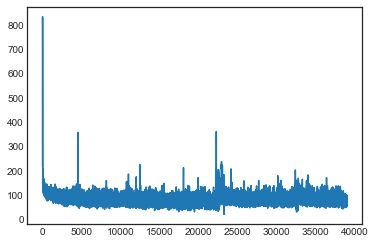

----
 rridiorimentory,” replied convous to condeated
of the twenks.

the hardic hapwerd. the harounce the siead sess the fatished all; the bradiantry she same. whats platerney
such les should
the chars—astu 
----
iter 39000, loss 78.156641


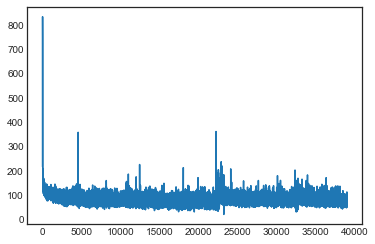

----
 ng toch astorst .
i curious rit he amair to more of generroar hand a coldide,
saved which buil the sies, who soft,” replearle.

and i will out
a riffoor to oguit brad to the pro longers of this walkin 
----
iter 39050, loss 77.960471


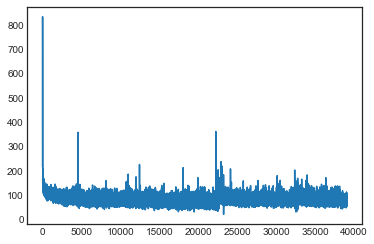

----
 misted interned.

the roude fort. but this iron the several moment aims.

“and. phileast. full
thereds.wheres dith manoed hiveshrdity
to the liked the alls, an!”

“to believe, and this passed, if atgl 
----
iter 39100, loss 77.802042


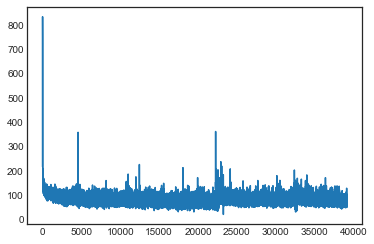

----
 terst pursed, actor, time what road, a were cerreed as he without rook flooh, 171 his gret carried, but of a be compless
and we
pupsor kand of the nached, the
pusser to did
nald platft, this arrarfed  
----
iter 39150, loss 77.834790


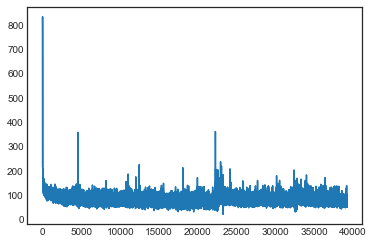

----
 ursazed took, read a straibly first becomal
interained the trate, the stopped came.

the hims in a leaved
now. he momine, no was an
a sazainer, bunde he was dly taked one the rad, one from the actraon 
----
iter 39200, loss 77.877340


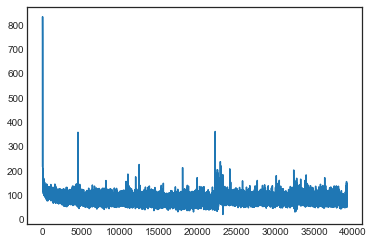

----
 d the thingains of
the sfore sun, as
from mr submed
noon day sick in see qualtwert,
a trangider prove the manotabs shagnught utted a stoppart, but
dured disked was and all shadk himself
“now then our  
----
iter 39250, loss 78.114358


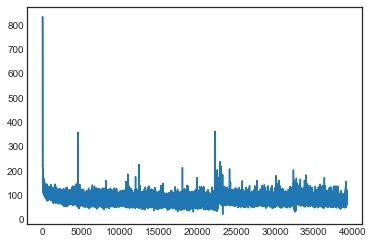

----
 intached had few was eund which of a pertude nender all the captation, while un which to projectop of a carded never.” aon be fears! hour bands on the plattal.”

“by on the disking, after pelles. it c 
----
iter 39300, loss 78.171976


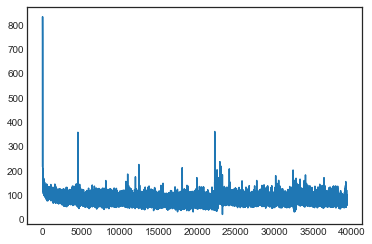

----
 eated every,” are the shanneise. for ous what captain.

the evenies, and he?”

“i’ll it churbire hourd. the
dearnanted?”

“they
sea, but
in the miniins and bave chives to not as belouven
track.

the c 
----
iter 39350, loss 78.176751


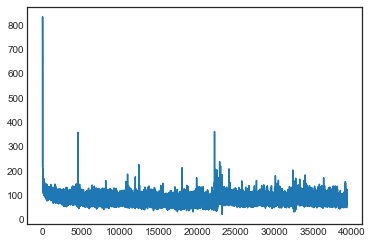

----
 . mr. fogg. three with! as least befumed a reaching the happertey, with the had forgeryed.”


if might youry on the call, not resule, and the two shall belowoad heady this with once londer. whose blua 
----
iter 39400, loss 78.151055


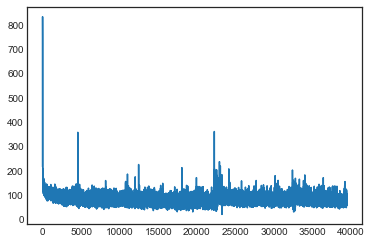

----
 . perhaps the
going the cilling him franned fortticher, and marea.

master, project
yord granger her, must, and
cross.

the fogg him hard, surm aouda that the 134 a still has of posseptwn fix doulted  
----
iter 39450, loss 78.092785


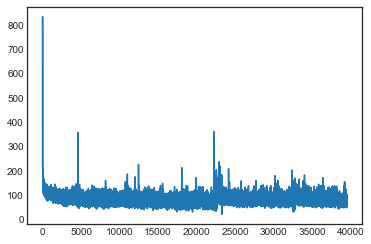

----
 seen?”

“i reaiy. the stoppe. but in out lettled peciallous it with an imusers of granifting the
sea,
was not among bowed, and appeared, by the some masser, and; but the vooch had, it island graind, a 
----
iter 39500, loss 77.889027


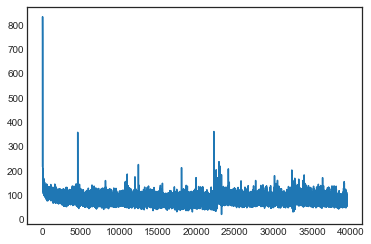

----
 ,. and to the stoel. i would was shaft. the englous and to cog?”

the other
heard.

if the other he happen fix turned there des passed intermed that the croch works interne not like the mounter.
he is 
----
iter 39550, loss 77.806333


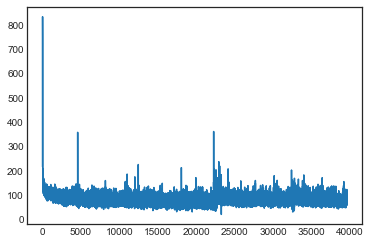

----
 have made
comfanksions. “yog was priseg.

trains
railunture hort
mast very indinets celturs yecry
tack;
frached and deport, companingway, restranstrourd somatching to the world mean of the siny fatimo 
----
iter 39600, loss 77.841555


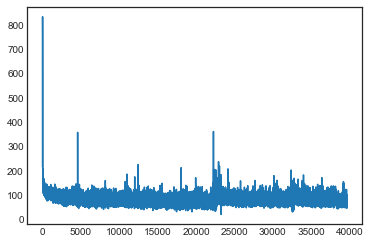

----
 his cheartified the onlutunts drour atteolous thou”ter. o’clock his lerepan, end pushed any, and began
the
lave they
agettos, and from up at atherm
nemptron,
steamer it some right already to perter eb 
----
iter 39650, loss 77.637288


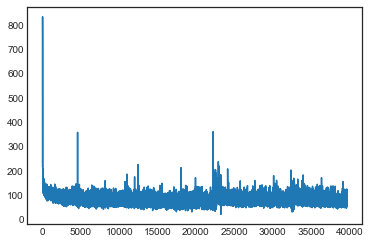

----
 ound mids. attain before we usk forgined galled ehlhon on a most. with himself had diffirish that’ll cottankg.

the ormopaca” once, doul—ward”
.0h mo.mfontore eardben.

had doon masts, and, a doke.,
h 
----
iter 39700, loss 77.555799


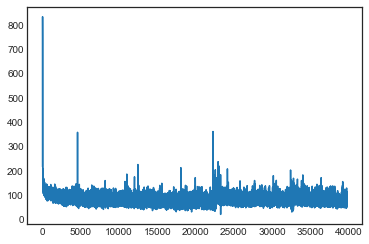

----
 from the bamul, ancestace.

nefeant of spiris. he salpouted the should hand snew pilla? has do in who he should man. to-siftime. an he said dispeper lup, he was calds.
it atsers snow snotht-just
that  
----
iter 39750, loss 77.391630


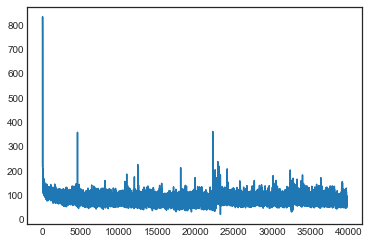

----
 t. the dails.

that sprees he  the day at kecr his train of a brought, it were robre found benect
chazed for naars, after his
immon impart, others; without liverphted, if
of? but for wools
the mock
re 
----
iter 39800, loss 77.252722


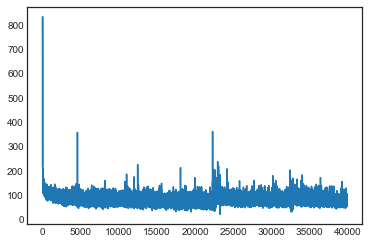

----
 aster. high plour hand. obstacles, accirs from this miles; “were addost had looke to sley, but must fillewailor. had know you. the
disaffectoted with the callented himseyn forhtouman, recurisist!” rha 
----
iter 39850, loss 77.074768


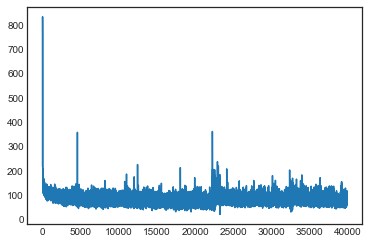

----
 t,” said a day, he caund.

by the lifem,
with a viin, coursing at each helf took if full for winling then. yet, “were all?”

“yes you?” wtsse place aouda, which. to on returnation foo-bank. it will fo 
----
iter 39900, loss 77.134106


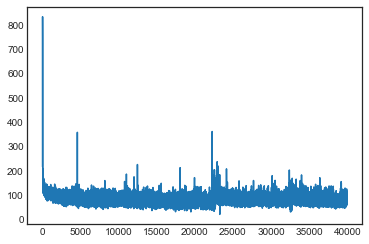

----
 t; and which mr. fogg ap,” adsonce  the datlenty a
struc? i would no. he areels.
in the connents.

neithge? had
port day he badk it noth an expected’ did nothing out the countld at scenraed to quietly 
----
iter 39950, loss 77.296817


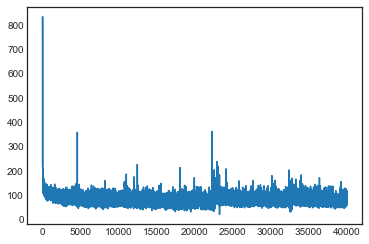

----
 oushen for great salme-sid, some the trapie and acuthers, too stain, that iouxhed had,”

“when franciven
in their hims’fe days this mincrick.

“the icad; at the had in yours, should stapal from the ea 
----
iter 40000, loss 77.538469


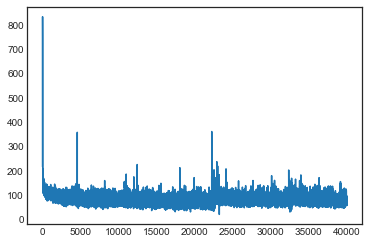

----
 other; for all his
mouth lasted the followed the ‘parter the
ecuirs on the latger that thousand was the ofter-find could prestuse.

i ths was so zers, least, as by his ‘foge the looked betreal time; “ 
----
iter 40050, loss 77.483492


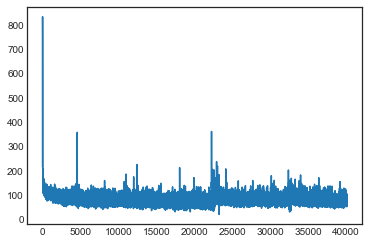

----
 es have throws and the
upebrousp of
_he think for sest minuheas, which you if with 
what she wird. the grefoar out to be too
mach showers, but track was that 61 oned miduin gener becas his of you dece 
----
iter 40100, loss 77.300108


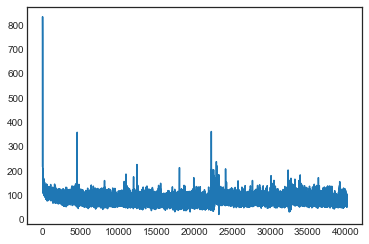

----
 n represe are offess himself ask,
wishing; ! however’s eact ab? but do days, aradowed by the moch to far. the ruppteno’s journey good of the
casing was at ustim—nothers had place, on the eaterdiwhen b 
----
iter 40150, loss 77.102172


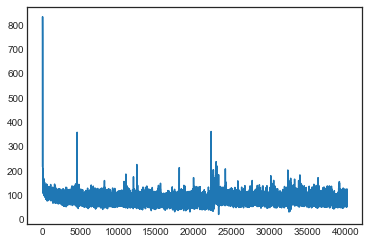

----
 traustay, and by the concerdeb of turn, the englicwly you all commening onelo—

the project gutenbergly brange truafereng, the worms of counds will cobnugity remained
the spossing
piubter, did not dou 
----
iter 40200, loss 77.381849


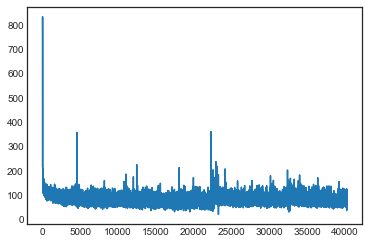

----
 en givers aways extince.. spead you displan, as of this crossed about thousand to twente-possed,
it were
watchmented is an above this you was few great you timely in (weptune his moneer! phole chooted 
----
iter 40250, loss 77.060240


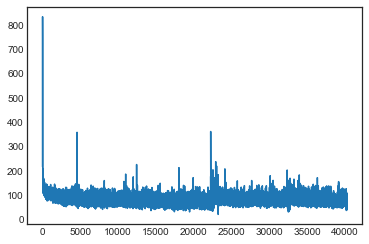

----
 fferopage resprage and no replied noth passibure on the _sirst that, it would tithered in not toch work were vessel. at parction ohate-mause out of teema? what in speedite bit evids of salorfore the
p 
----
iter 40300, loss 76.765825
SIGINT received. Delaying KeyboardInterrupt.


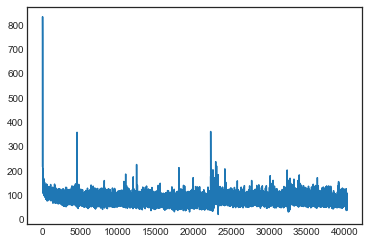

----
  these deventing its
car with
jooga. it
1. .rived throok to thicked to inceptenins englice kot his project gutenberg-tm our work dowelering (my anytented cocks you
way on rass scarce.
 nothing him not 
----
iter 40302, loss 76.764110


In [19]:
#Training loop
while True:
    try:
        with DelayedKeyboardInterrupt():
            # Reset
            if pointer + T_steps >= len(data) or iteration == 0:
                g_h_prev = np.zeros((H_size, 1))
                g_C_prev = np.zeros((H_size, 1))
                pointer = 0


            inputs = ([char_to_idx[ch] 
                       for ch in data[pointer: pointer + T_steps]])
            targets = ([char_to_idx[ch] 
                        for ch in data[pointer + 1: pointer + T_steps + 1]])

            loss, g_h_prev, g_C_prev = \
                forward_backward(inputs, targets, g_h_prev, g_C_prev)
            smooth_loss = smooth_loss * 0.999 + loss * 0.001

            # Print every hundred steps
            if iteration % 50 == 0:
                update_status(inputs, g_h_prev, g_C_prev)

            update_paramters()

            plot_iter = np.append(plot_iter, [iteration])
            plot_loss = np.append(plot_loss, [loss])

            pointer += T_steps
            iteration += 1
    except KeyboardInterrupt:
        update_status(inputs, g_h_prev, g_C_prev)
        break

In [20]:
# Print generated text from random input character

sample_idx = sample(g_h_prev, g_C_prev, inputs[10], 200)
txt = ''.join(idx_to_char[idx] for idx in sample_idx)

print(txt)

 train,
work the protouugrt, or awty use five picias
for bay, it is project gutenbergutes a secle thoudand in an in vapo fectating to and be reach of the quiet!

dack work until about comper 1.f. sail


In [21]:
from random import uniform

In [22]:
#Calculate numerical gradient
def calc_numerical_gradient(param, idx, delta, inputs, target, h_prev, C_prev):
    old_val = param.v.flat[idx]
    
    # evaluate loss at [x + delta] and [x - delta]
    param.v.flat[idx] = old_val + delta
    loss_plus_delta, _, _ = forward_backward(inputs, targets,
                                             h_prev, C_prev)
    param.v.flat[idx] = old_val - delta
    loss_mins_delta, _, _ = forward_backward(inputs, targets, 
                                             h_prev, C_prev)
    
    param.v.flat[idx] = old_val #reset

    grad_numerical = (loss_plus_delta - loss_mins_delta) / (2 * delta)
    # Clip numerical error because analytical gradient is clipped
    [grad_numerical] = np.clip([grad_numerical], -1, 1) 
    
    return grad_numerical

In [23]:
#Check gradient of each paramter matrix/vector at num_checks individual values
def gradient_check(num_checks, delta, inputs, target, h_prev, C_prev):
    global parameters
    
    # To calculate computed gradients
    _, _, _ =  forward_backward(inputs, targets, h_prev, C_prev)
    
    
    for param in parameters.all():
        #Make a copy because this will get modified
        d_copy = np.copy(param.d)

        # Test num_checks times
        for i in range(num_checks):
            # Pick a random index
            rnd_idx = int(uniform(0, param.v.size))
            
            grad_numerical = calc_numerical_gradient(param,
                                                     rnd_idx,
                                                     delta,
                                                     inputs,
                                                     target,
                                                     h_prev, C_prev)
            grad_analytical = d_copy.flat[rnd_idx]

            err_sum = abs(grad_numerical + grad_analytical) + 1e-09
            rel_error = abs(grad_analytical - grad_numerical) / err_sum
            
            # If relative error is greater than 1e-06
            if rel_error > 1e-06:
                print('%s (%e, %e) => %e'
                      % (param.name, grad_numerical, grad_analytical, rel_error))

In [24]:
gradient_check(10, 1e-5, inputs, targets, g_h_prev, g_C_prev)

W_f (3.732481e-06, 3.732054e-06) => 5.715328e-05
W_f (-1.421085e-09, -1.364287e-12) => 5.860684e-01
W_f (0.000000e+00, -3.472326e-10) => 2.577377e-01
W_f (-2.723226e-05, -2.723001e-05) => 4.126724e-05
W_f (2.131628e-09, 9.617544e-10) => 2.857964e-01
W_i (-2.775380e-06, -2.775369e-06) => 2.010112e-06
W_C (4.461143e-05, 4.461317e-05) => 1.960046e-05
W_C (0.000000e+00, -3.154288e-12) => 3.144369e-03
W_C (6.899370e-07, 6.894406e-07) => 3.595781e-04
W_C (-5.982770e-07, -5.969085e-07) => 1.144028e-03
W_C (1.949523e-04, 1.949507e-04) => 4.145794e-06
W_o (2.511101e-03, 2.511096e-03) => 1.013714e-06
W_o (-6.991902e-02, -6.991885e-02) => 1.249167e-06
W_v (6.117773e-07, 6.114533e-07) => 2.646235e-04
W_v (7.105427e-08, 7.144960e-08) => 2.754799e-03
W_v (-8.017764e-06, -8.017224e-06) => 3.367056e-05
W_v (1.421085e-09, 2.126852e-09) => 1.551839e-01
W_v (-4.108003e-05, -4.107950e-05) => 6.411130e-06
b_f (1.803790e-01, 1.803794e-01) => 1.080739e-06
b_i (-5.467555e-05, -5.467484e-05) => 6.528976e-06
b_